# Week 6 - Classification

This week, we shift from gathering human textual classifications through crowdsourcing, to using machine learning models and algorithms that train on those human classifications and extend them to documents far too numerous to read. If you recall, *clustering* allows us to stably partition text data (e.g., documents, turns of conversation) according to all patterns of covariation among available text features. *Classification*, by contrast, partitions text data according to only those features and their variation that enable us to mimic and extrapolate human annotations.

In this notebook, we will show how to use a variety of classification methods, including Naïve Bayes, Logistic regression, K-nearest neighbor, decision trees and random forests, support vector machines and even a simple neural network, the perceptron. We will also demonstrate ensemble techniques that can link several such methods into a single, more accurate, classification pipeline. We will finally learn to use conventions and metrics to evaluate classifier performance on out-of-sample data. 

For this notebook we will be using the following packages.

In [1]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
import lucem_illud #pip install -U git+git://github.com/Computational-Content-Analysis-2018/lucem_illud.git

#All these packages need to be installed from pip
#For ML
import sklearn
import sklearn.naive_bayes
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
import sklearn.decomposition

import nltk #For tokenizing and normalizing
import numpy as np #arrays
import matplotlib.pyplot as plt #Plots
import matplotlib.colors # For nice colours
import seaborn #Makes plots look nice, also heatmaps
import scipy as sp #for interp

#These are from the standard library
import collections
import os
import os.path
import random
import re
import glob
import pandas
import requests
import json
import math

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

# Simple Simulated Examples

Here we create a sandbox for you to explore different types of classified data and how different statistical classifiers perform on each type.

## Generating example data

We start by loading one of the "cartoon" or simplified data sets and then dividing it into training and testing sets. To maximize our ability to visualize, each dataset involves two classes, colored yellow and blue, arrayed along two two dimensions (`x` and `y`). 

The four data patterns include: 
+ `random` in which the two classes are randomly distributed across both dimensions
+ `andSplit` in which the two classes are linearly split along one of two dimensions (e.g., men like Adidas)
+ `xorSplit` in which the two classes are split, oppositely, along each dimension (e.g., old ladies and young men like Nikes)
+ `targetSplit` in which one class is nested within the other in two dimensions (e.g., middle aged, middle income people like vintage Mustangs)
+ `multiBlobs` in which 5 classes are placed as bivariate Gaussians at random locations

`noise` is a variable [0-1] that ranges from no noise in the prescribed pattern [0] to complete noise/randomness [1].

Uncomment (remove the # in front of) each dataset, one at a time, and then run the cell and subsequent cells to examine how each machine learning approach captures each pattern.

In [10]:
noise = .2

#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.random())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise))
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise)) #Please try this one
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise))
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise))

We can easily visualize the rendered datasets because they are generated in two dimensions.

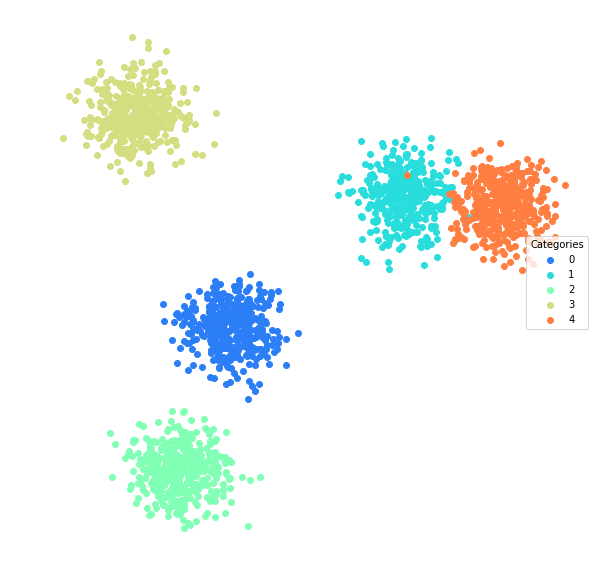

In [11]:
lucem_illud.plotter(dfTrain)

## Training a Machine Learning algorithm

We can now pick a model, there are many more options in `scikit-learn`. These are just a few examples, which array along the machine learning "tribes" described in Pedro Domingos _The Master Algorithm_.

Uncomment (remove the # in front of) each algorithm one at a time, then run the cell and subsequent cells to evaluate how it learns to understand the data.

In [12]:
#Bayes
#clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
#clf = sklearn.linear_model.LogisticRegression()

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
#clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
#clf = sklearn.ensemble.GradientBoostingClassifier()

Now we fit the model by giving it our training data

In [14]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
           weights='distance')

## Algorithm evaluation

We can look at few measurements of each classifier's performance by using the testing set

In [15]:
lucem_illud.evaluateClassifier(clf, dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,1.000000,1.000000,0.000,1.000000,1.00000
1,0.995575,0.993150,0.002,1.000000,0.99115
2,1.000000,1.000000,0.000,1.000000,1.00000
3,1.000000,1.000000,0.000,1.000000,1.00000
4,0.998731,0.990654,0.002,0.990654,1.00000


This lets us look at which classes do better:

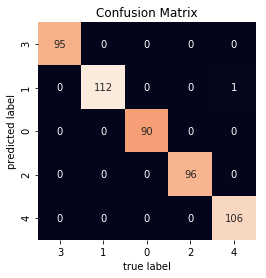

In [16]:
lucem_illud.plotConfusionMatrix(clf, dfTest)

The greater the area under the curve the better.

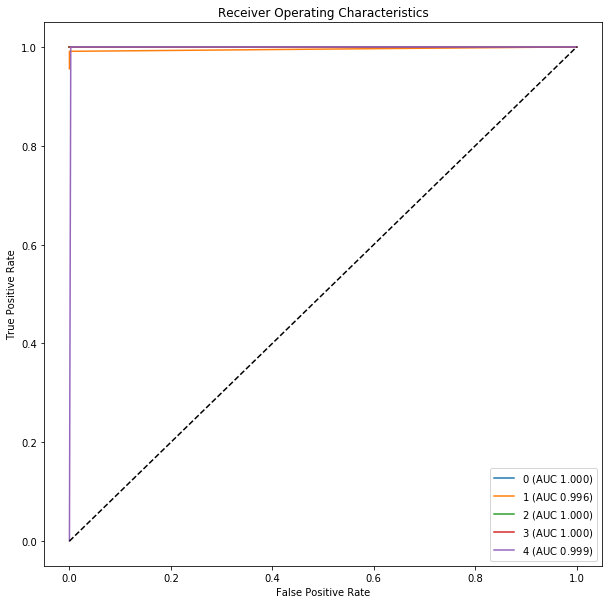

In [17]:
lucem_illud.plotMultiROC(clf, dfTest)

We can also look at the regions the classifer identifies as one class or the other:

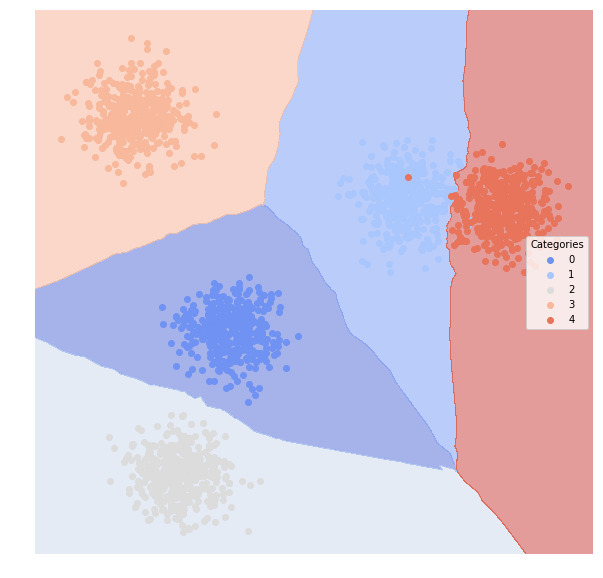

In [18]:
lucem_illud.plotregions(clf, dfTrain)

## Now we do the same for real data

Available data sets include:
+ Reddit threads "classified" by thread topic
+ 20 newsgroups "classified" by group topic
+ Senate press releases "classified" by Senator (2 senators)
+ Senate press releases "classified" by Senator (5 senators)
+ Emails classified as Spam or Ham

In [19]:
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadReddit())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadNewsGroups())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateSmall())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateLarge())
#dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSpam())

Loading Reddit data
Converting to vectors


In [20]:
#Bayes
clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up, but lose ROC
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
#clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
#clf = sklearn.linear_model.LogisticRegression()

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
#clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
#clf = sklearn.ensemble.GradientBoostingClassifier()

In [21]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

GaussianNB(priors=None)

In [22]:
lucem_illud.evaluateClassifier(clf, dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Relationships,0.649098,0.360244,0.206897,0.571429,0.383562
Weeaboo Tales,0.839013,0.537051,0.203762,0.559701,0.925926
Bad Roommates,0.772989,0.595350,0.147335,0.812500,0.597701
Tales From Tech Support,0.876689,0.734630,0.081505,0.861111,0.794872


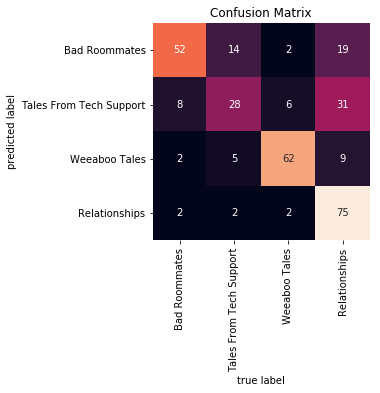

In [23]:
lucem_illud.plotConfusionMatrix(clf, dfTest)

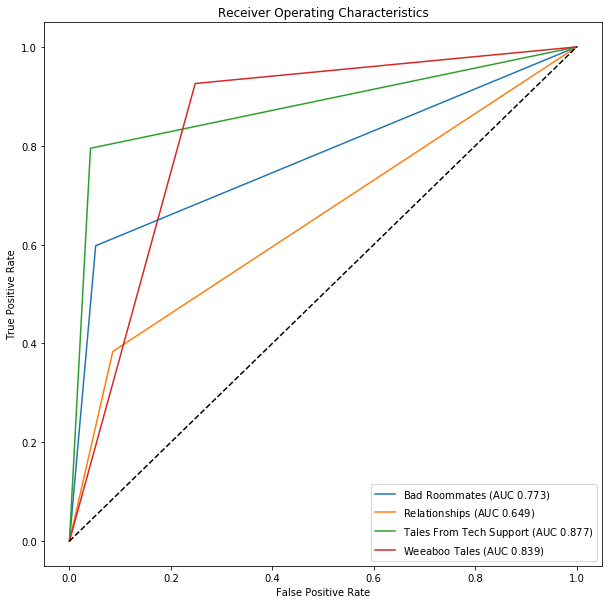

In [24]:
lucem_illud.plotMultiROC(clf, dfTest)

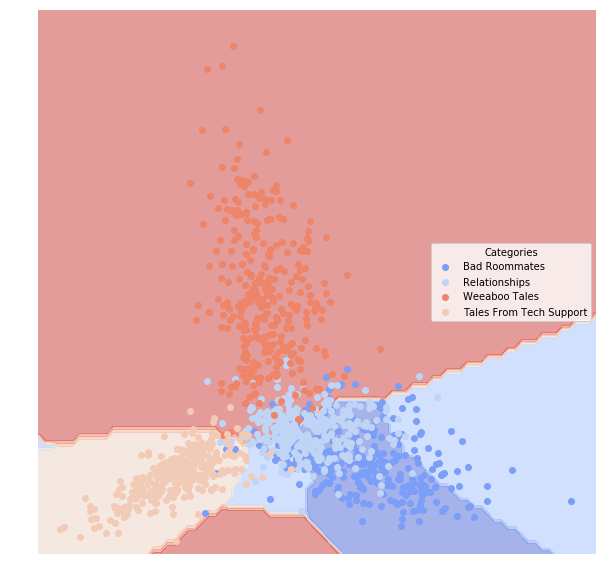

In [25]:
lucem_illud.plotregions(clf, dfTrain)

## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Go back through all of the cells above and generate 10 distinct artificial datasets and classify them with all of the available methods. Add a cell immediately below and describe which classifier(s) worked best with which artificially constructed data source and why. Then go through all of the empirical datasets (i.e., Newsgroups, Senate Small, Senate Large, Email Spam) and classify them with all available methods. Add a second cell immediately below and describe which classifier(s) worked best with which data set and why.

<span style="color:red">***Stretch*** (but also required) Wander through the SKLearn documentation available [here](http://scikit-learn.org/stable/), particularly perusing the classifiers. In cells following, identify and implement a new classifier that we have not yet used (e.g., AdaBoost, CART) on one artificial dataset and one real dataset (used above). Then, in the next cell describe the classifier, detail how it compares with the approaches above, and why it performed better or worse than others.

In [44]:
def evaluate_method(clf, dfTrain, dfTest):
    print(lucem_illud.evaluateClassifier(clf, dfTest))
    lucem_illud.plotConfusionMatrix(clf, dfTest)
    lucem_illud.plotMultiROC(clf, dfTest)
    lucem_illud.plotregions(clf, dfTrain)
    
def classify_data(dfTrain, dfTest):
    #Bayes
    print('Gaussian Naive Bayes:')
    clf = sklearn.naive_bayes.GaussianNB()
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    evaluate_method(clf, dfTrain, dfTest)
    
    #Analogizes
    print('Support Vector Machine with linear kernel:')
    clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    evaluate_method(clf, dfTrain, dfTest)
    
    print('Support Vector Machine with 3 degree polynomial kernel:')
    clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    evaluate_method(clf, dfTrain, dfTest)
    
    print('K-Nearest Neighbors with 5 neighbors:')
    clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    evaluate_method(clf, dfTrain, dfTest)
    
    #Classical Regression
    print('Logistic Regression:')
    clf = sklearn.linear_model.LogisticRegression()
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    evaluate_method(clf, dfTrain, dfTest)

    #Symbolists
    print('Decision Tree:')
    clf = sklearn.tree.DecisionTreeClassifier()
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    evaluate_method(clf, dfTrain, dfTest)
    
    print('Random Forest:')
    clf = sklearn.ensemble.RandomForestClassifier()
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    evaluate_method(clf, dfTrain, dfTest)

    #Connectionists
    print('Neural Network (Multi-layer Perceptron):')
    clf = sklearn.neural_network.MLPClassifier()
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    evaluate_method(clf, dfTrain, dfTest) 

    #Ensemble
    print('Gradient Boosting:')
    clf = sklearn.ensemble.GradientBoostingClassifier()
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    evaluate_method(clf, dfTrain, dfTest)
    
    print('AdaBoost with 100 weak classifiers:')
    clf = sklearn.ensemble.AdaBoostClassifier(n_estimators=100)
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
    evaluate_method(clf, dfTrain, dfTest)

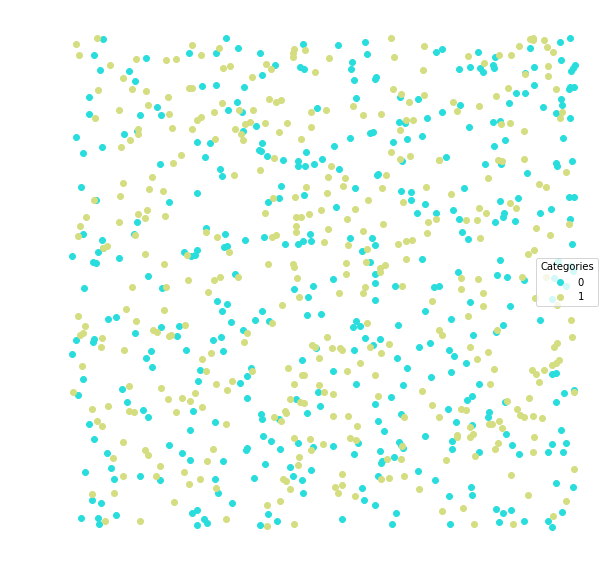

Gaussian Naive Bayes:
           AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                        
0         0.45           0.478205        0.55   0.435897    0.34
1         0.45           0.477049        0.55   0.459016    0.56


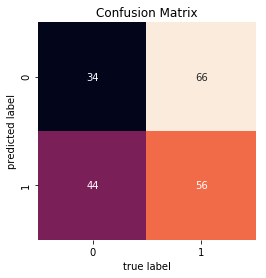

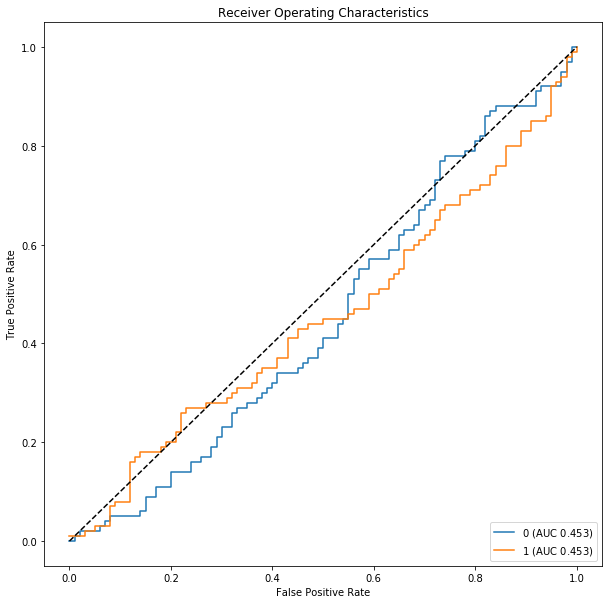

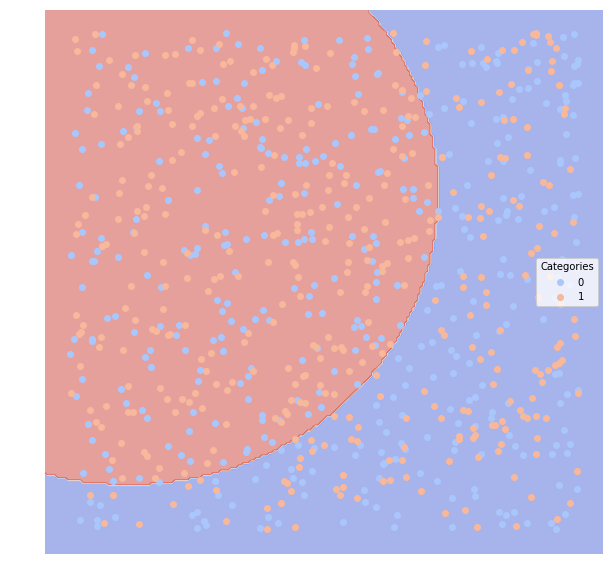

Support Vector Machine with linear kernel:
            AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                         
0         0.485           0.492737       0.515   0.484211    0.46
1         0.485           0.492714       0.515   0.485714    0.51


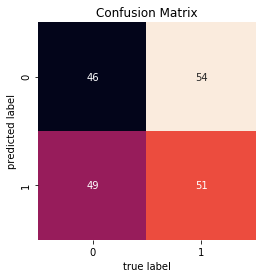

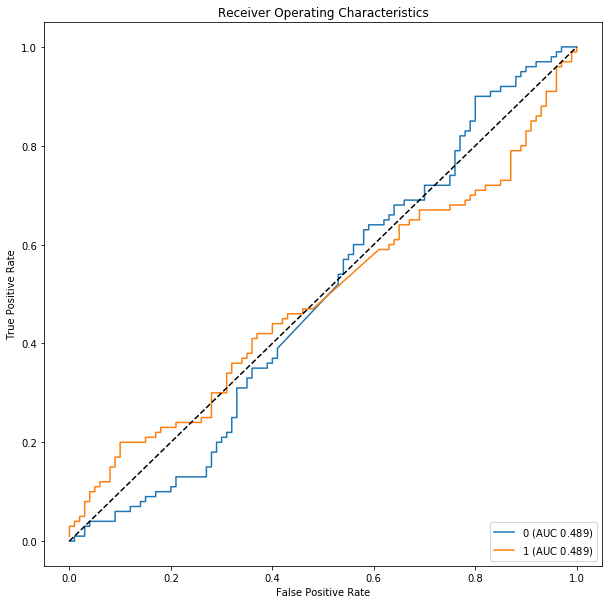

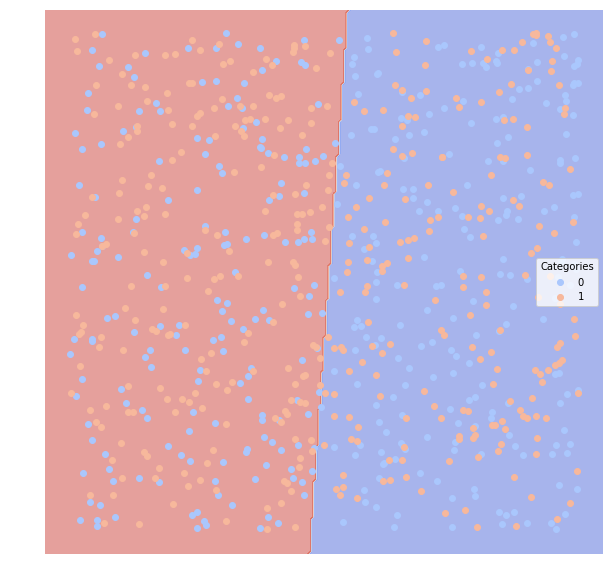

Support Vector Machine with 3 degree polynomial kernel:
           AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                        
0         0.46           0.482581        0.54   0.435484    0.27
1         0.46           0.481159        0.54   0.471014    0.65


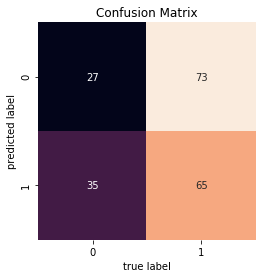

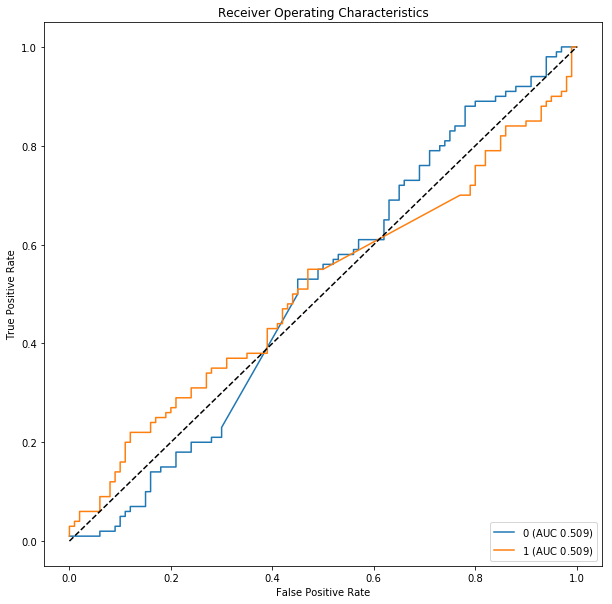

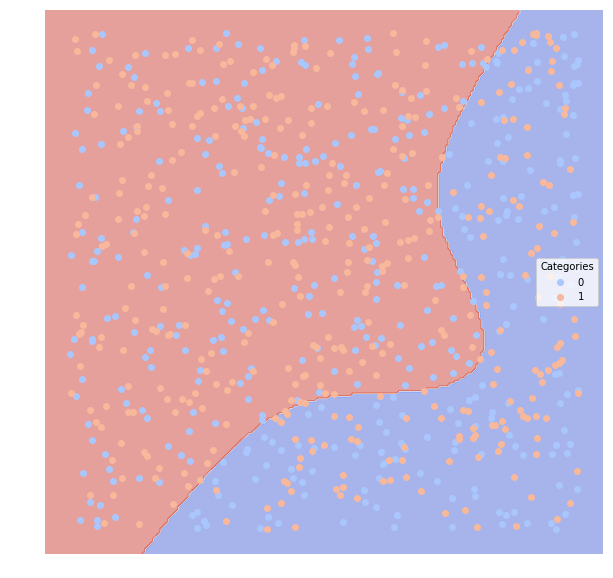

K-Nearest Neighbors with 5 neighbors:
            AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                         
0         0.465           0.483713       0.535   0.465347    0.47
1         0.465           0.483737       0.535   0.464646    0.46


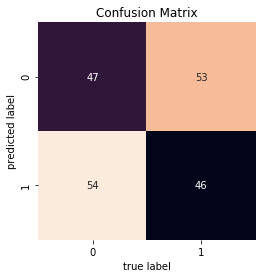

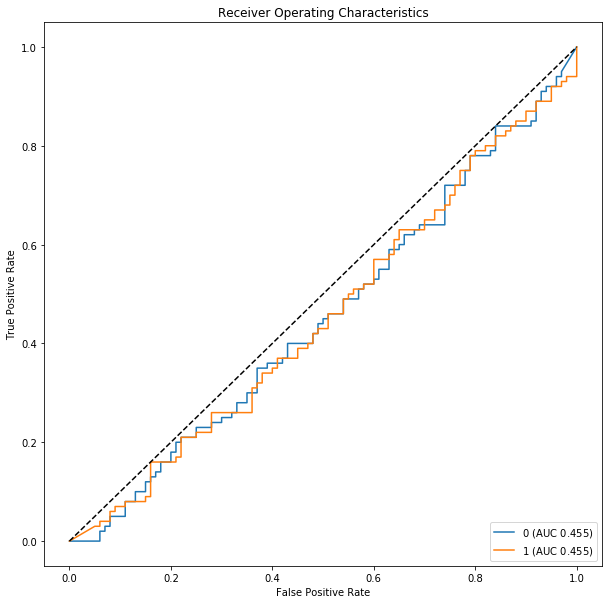

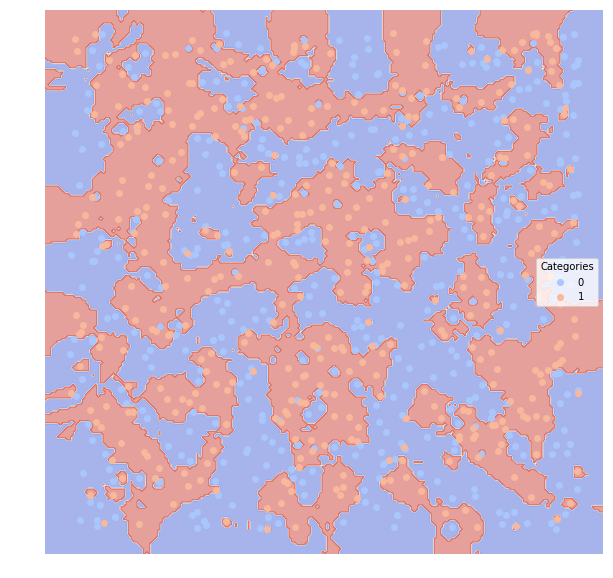

Logistic Regression:
           AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                        
0         0.51           0.505109        0.49   0.510870    0.47
1         0.51           0.505093        0.49   0.509259    0.55


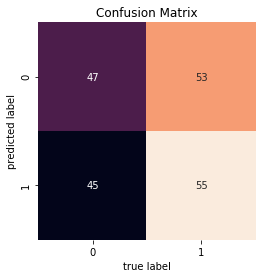

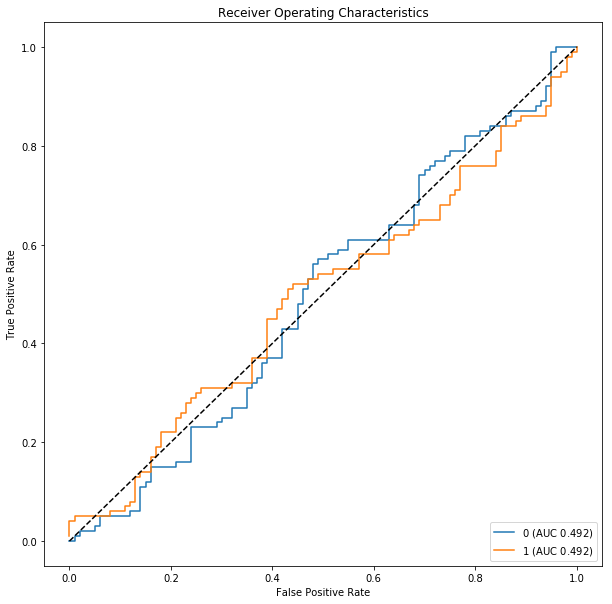

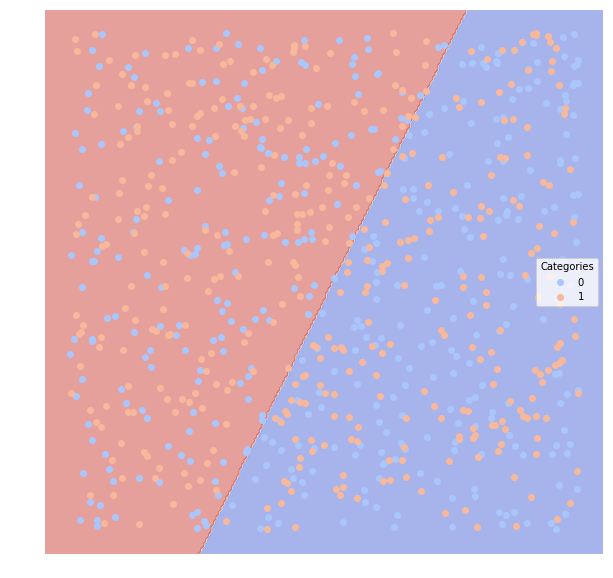

Decision Tree:
            AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                         
0         0.495           0.497524       0.505   0.495238    0.52
1         0.495           0.497526       0.505   0.494737    0.47


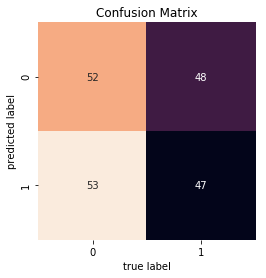

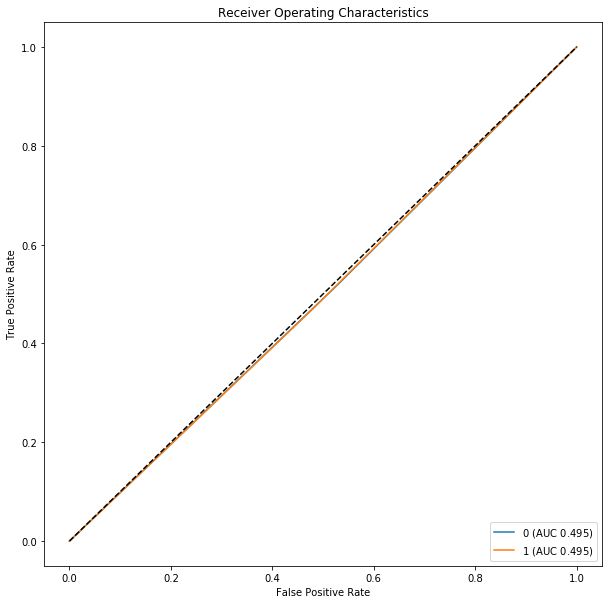

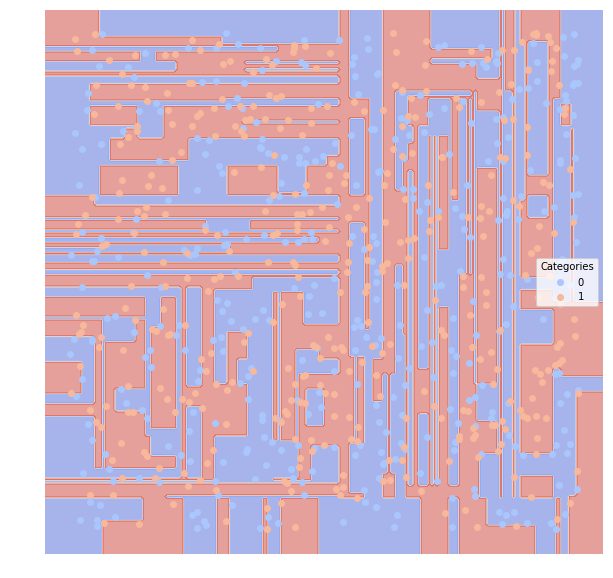

Random Forest:
           AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                        
0         0.48           0.490377        0.52   0.481132    0.51
1         0.48           0.490426        0.52   0.478723    0.45


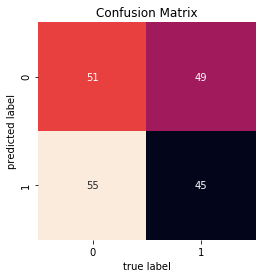

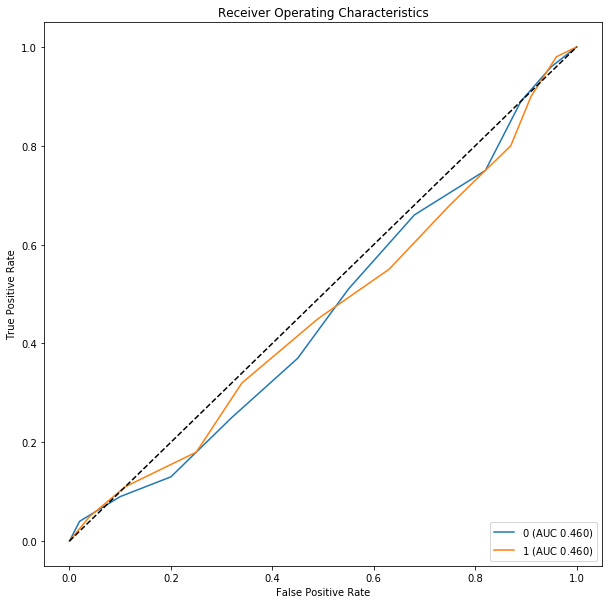

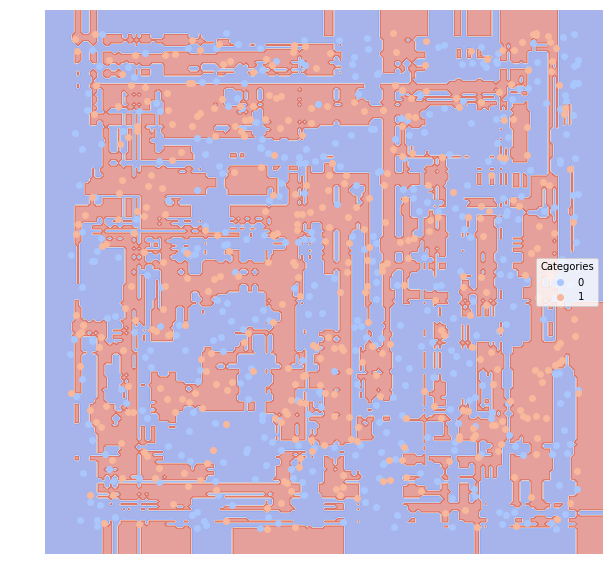

Neural Network (Multi-layer Perceptron):
           AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                        
0         0.48           0.490357        0.52   0.482143    0.54
1         0.48           0.490455        0.52   0.477273    0.42


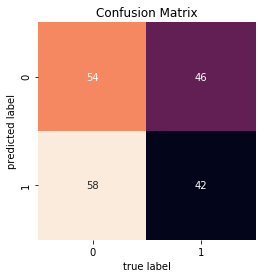

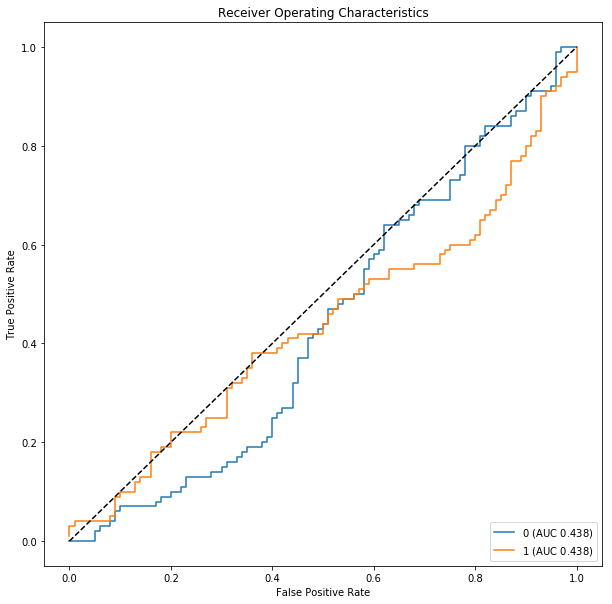

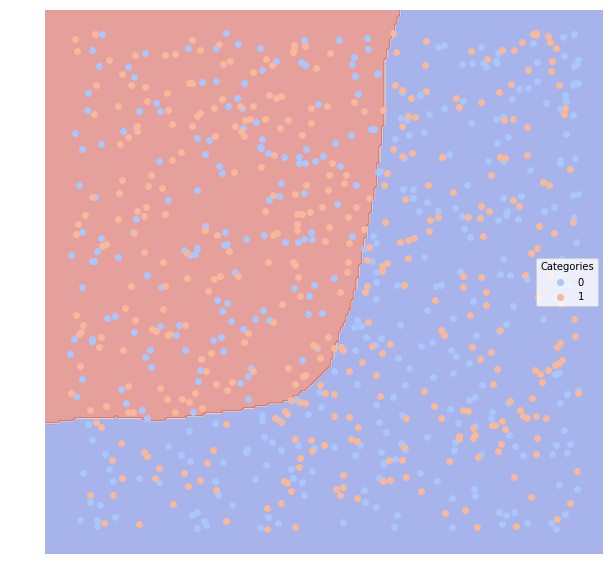

Gradient Boosting:
            AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                         
0         0.445           0.475977       0.555   0.436782    0.38
1         0.445           0.475177       0.555   0.451327    0.51


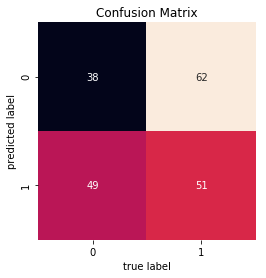

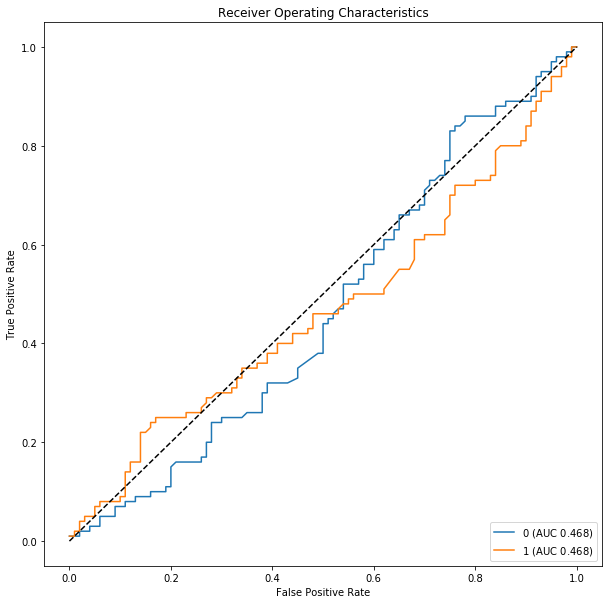

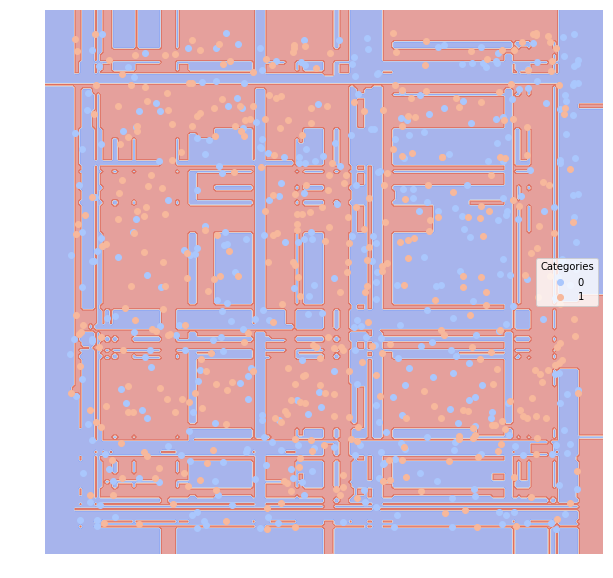

AdaBoost with 100 weak classifiers:
            AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                         
0         0.445           0.475977       0.555   0.436782    0.38
1         0.445           0.475177       0.555   0.451327    0.51


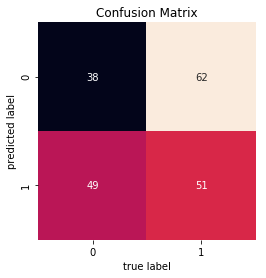

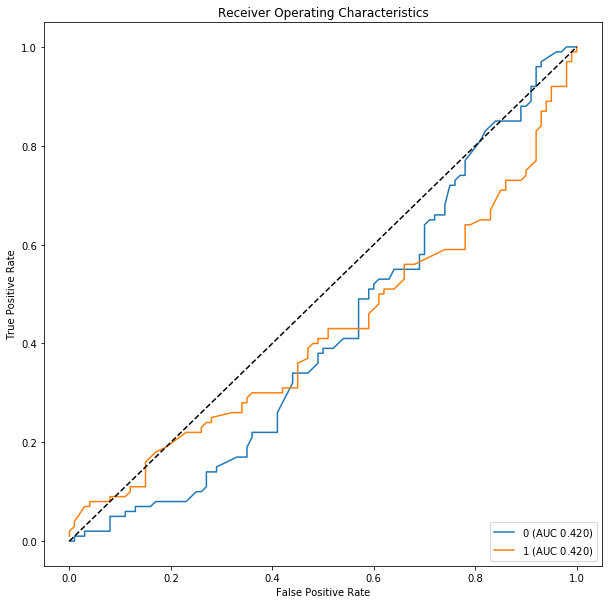

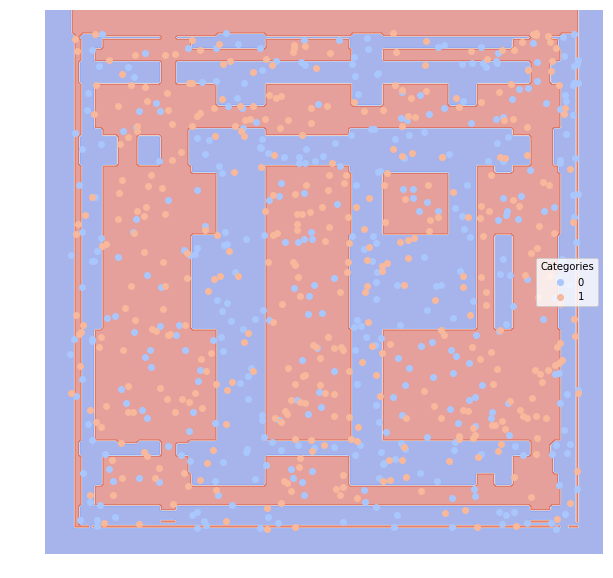

In [45]:
# artificial dataset 1
# two classes randomly distributed across both dimensions
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.random())
lucem_illud.plotter(dfTrain)
classify_data(dfTrain, dfTest)

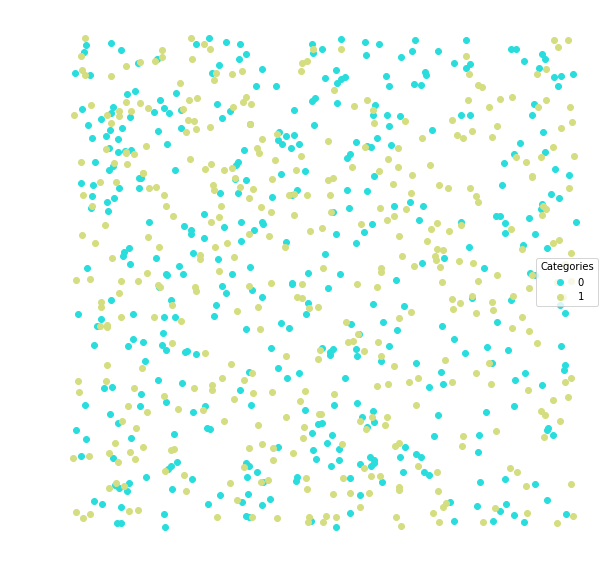

Gaussian Naive Bayes:
            AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                         
0         0.475           0.488095       0.525   0.476190    0.50
1         0.475           0.488158       0.525   0.473684    0.45


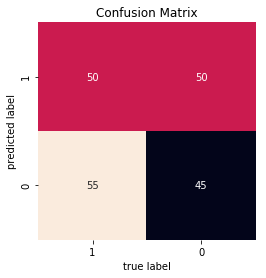

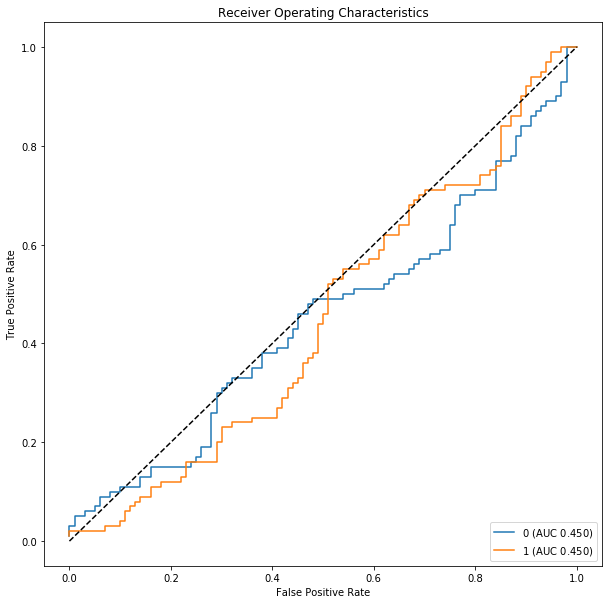

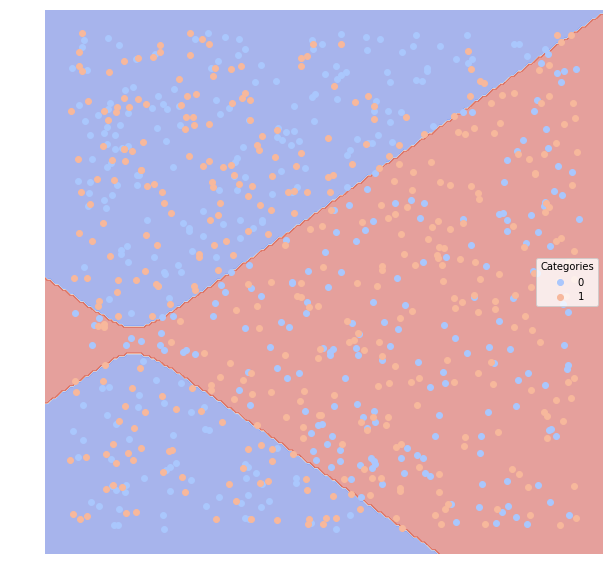

Support Vector Machine with linear kernel:
            AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                         
0         0.445           0.475275       0.555   0.449541    0.49
1         0.445           0.475824       0.555   0.439560    0.40


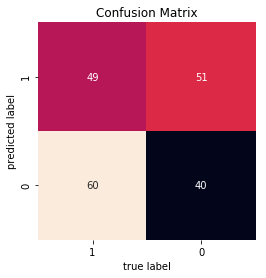

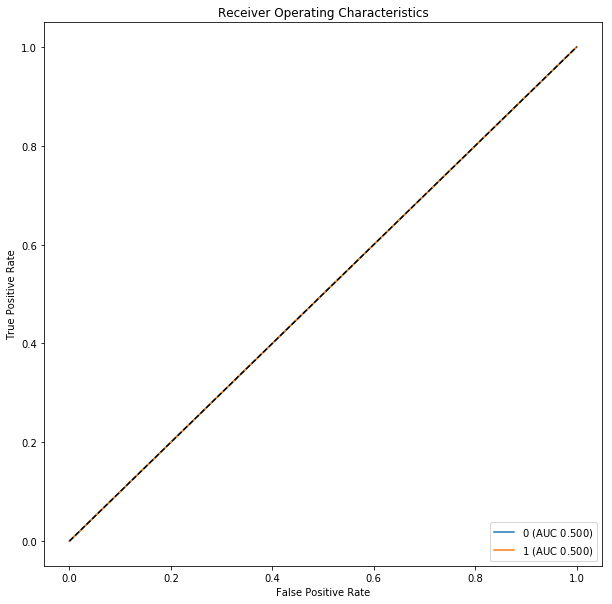

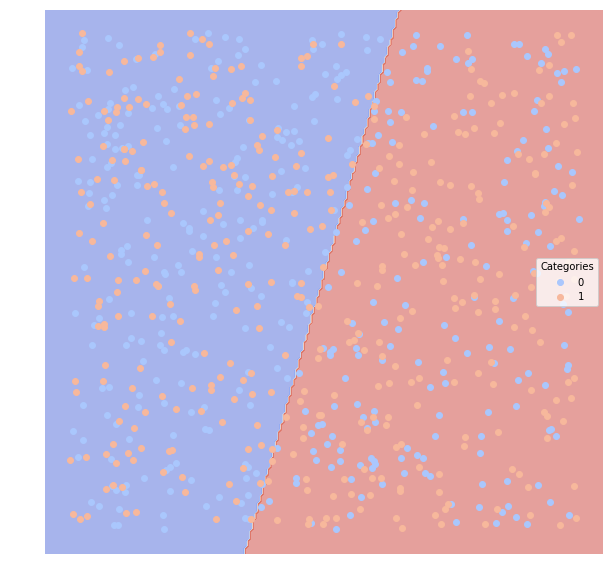

Support Vector Machine with 3 degree polynomial kernel:
           AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                        
0         0.46           0.481633        0.54   0.459184    0.45
1         0.46           0.481569        0.54   0.460784    0.47


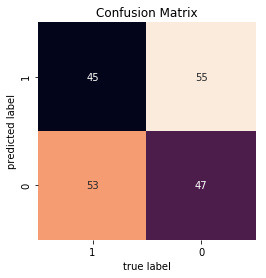

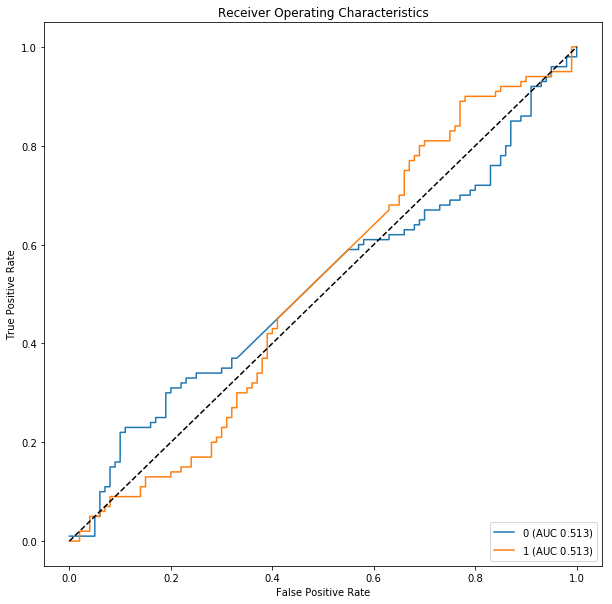

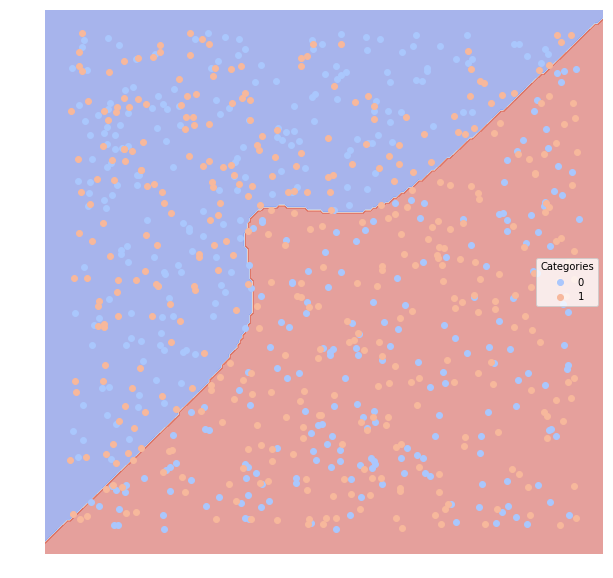

K-Nearest Neighbors with 5 neighbors:
            AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                         
0         0.495           0.497522       0.505   0.495652    0.57
1         0.495           0.497529       0.505   0.494118    0.42


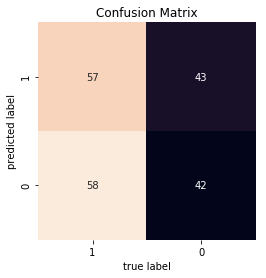

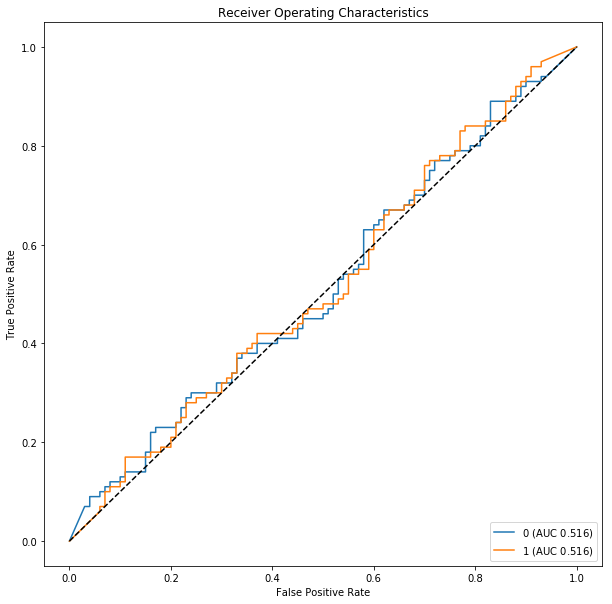

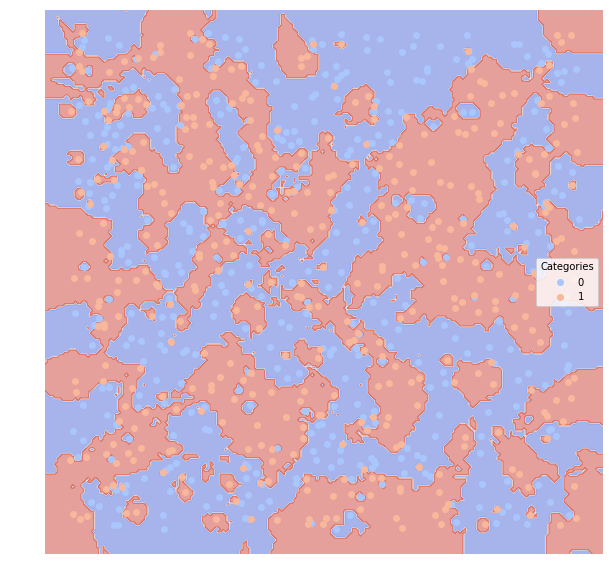

Logistic Regression:
           AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                        
0         0.45           0.477358        0.55   0.452830    0.48
1         0.45           0.477660        0.55   0.446809    0.42


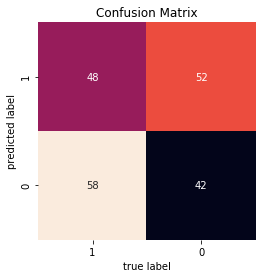

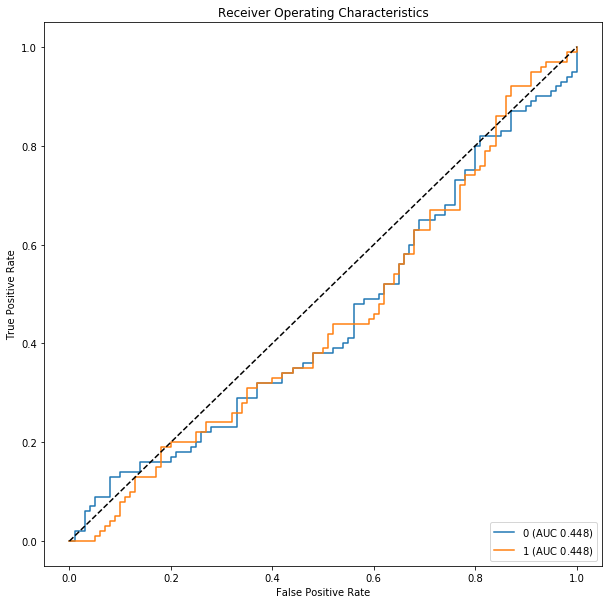

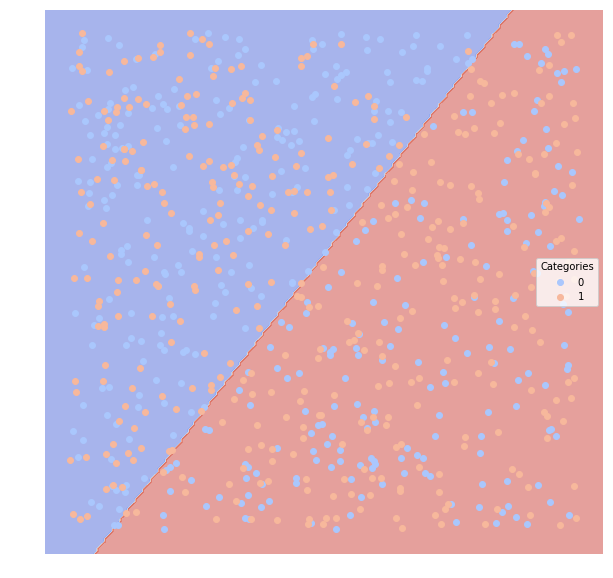

Decision Tree:
            AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                         
0         0.565           0.536524       0.435   0.561905    0.59
1         0.565           0.536947       0.435   0.568421    0.54


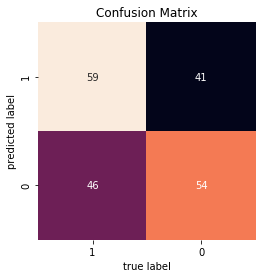

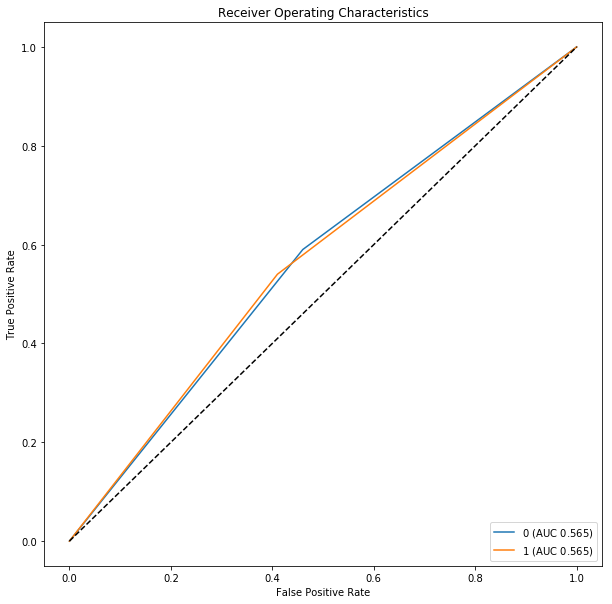

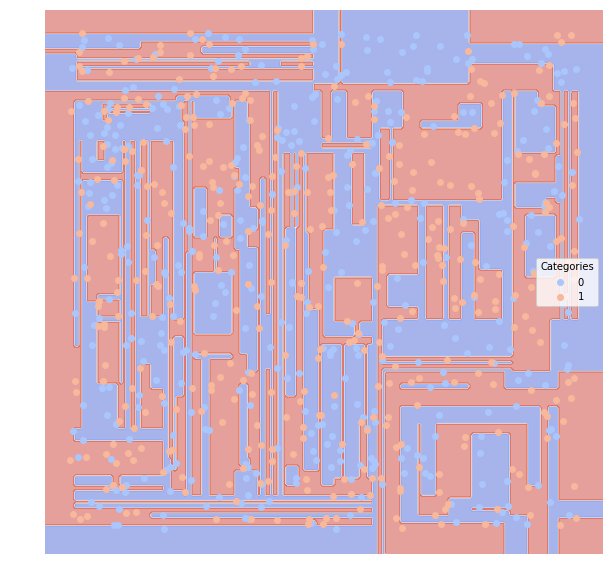

Random Forest:
           AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                        
0         0.52           0.510328        0.48   0.516393    0.63
1         0.52           0.510513        0.48   0.525641    0.41


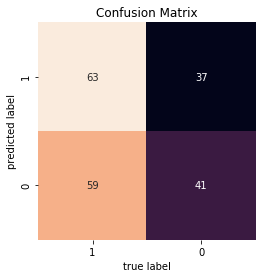

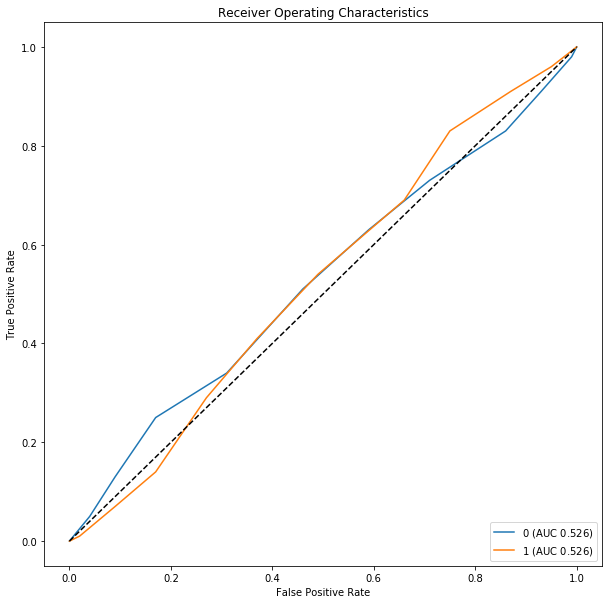

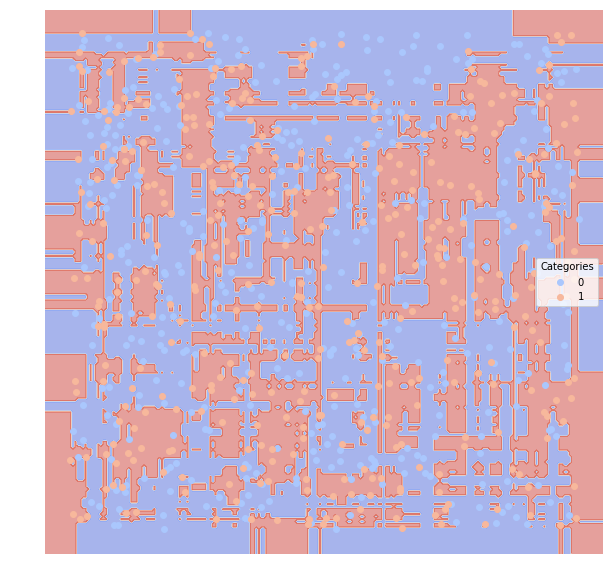

Neural Network (Multi-layer Perceptron):
            AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                         
0         0.455           0.479261       0.545   0.460870    0.53
1         0.455           0.479882       0.545   0.447059    0.38


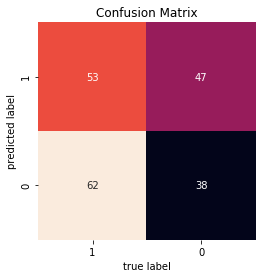

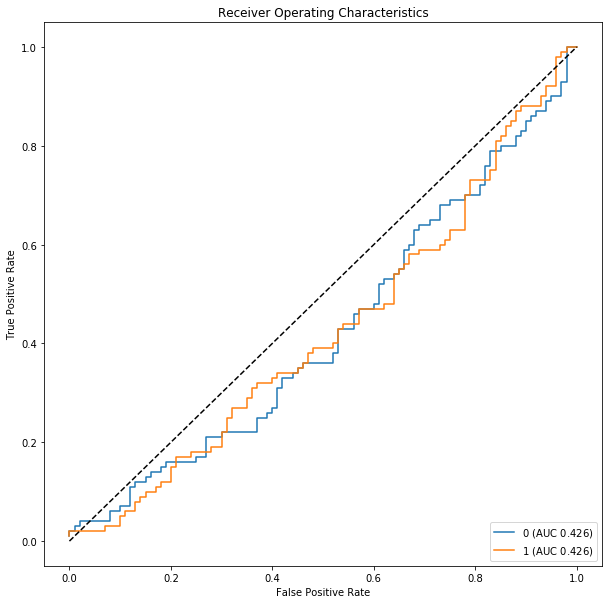

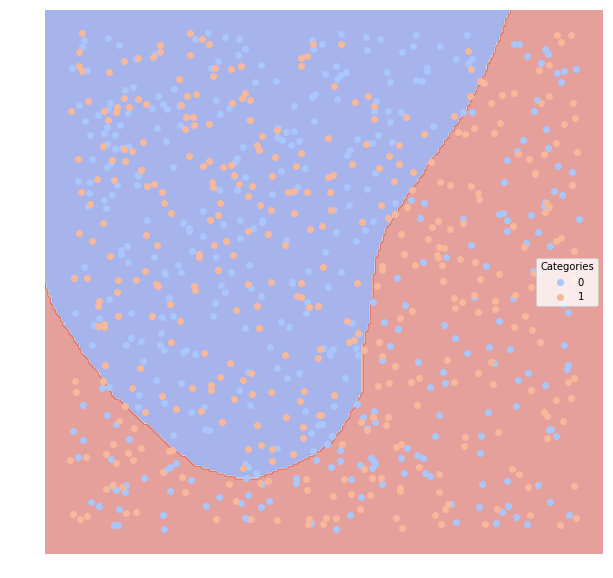

Gradient Boosting:
           AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                        
0         0.48           0.490408        0.52   0.479592    0.47
1         0.48           0.490392        0.52   0.480392    0.49


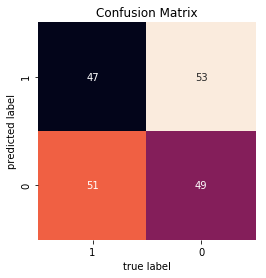

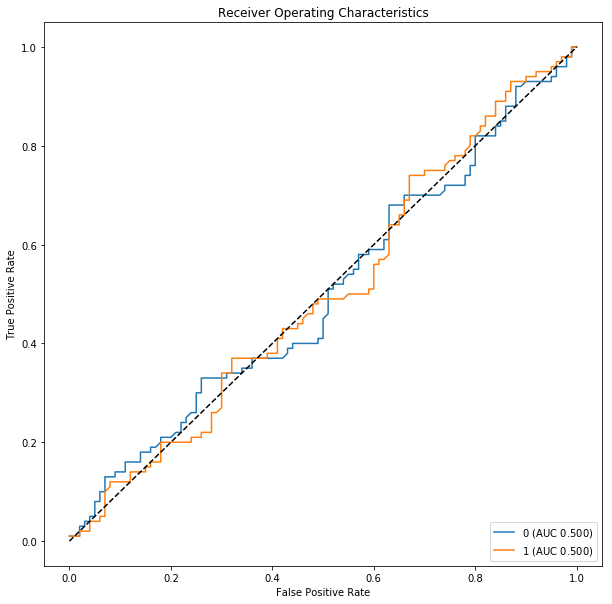

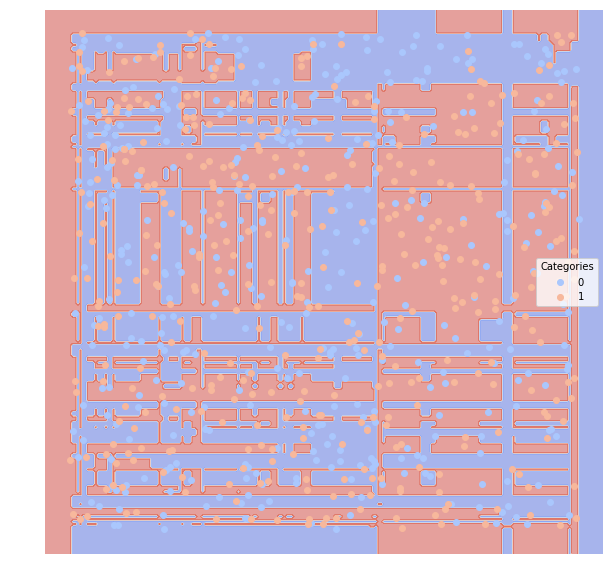

AdaBoost with 100 weak classifiers:
            AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                         
0         0.515           0.507747       0.485   0.516484    0.47
1         0.515           0.507706       0.485   0.513761    0.56


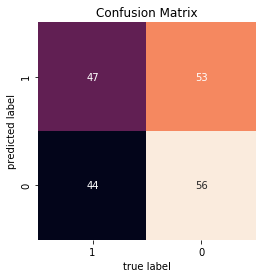

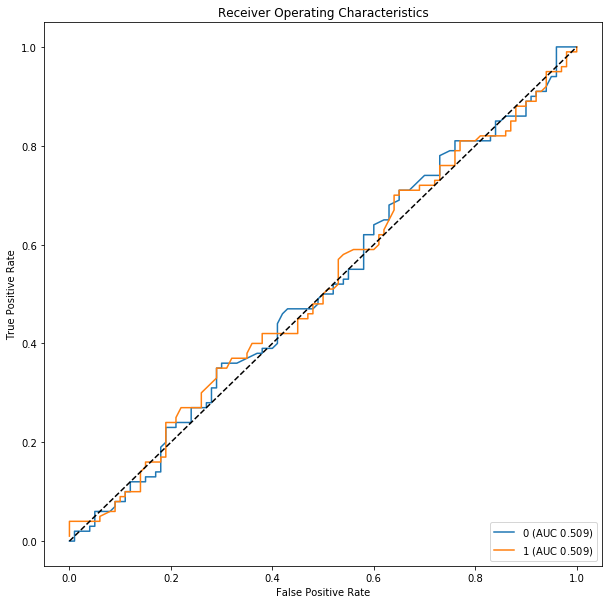

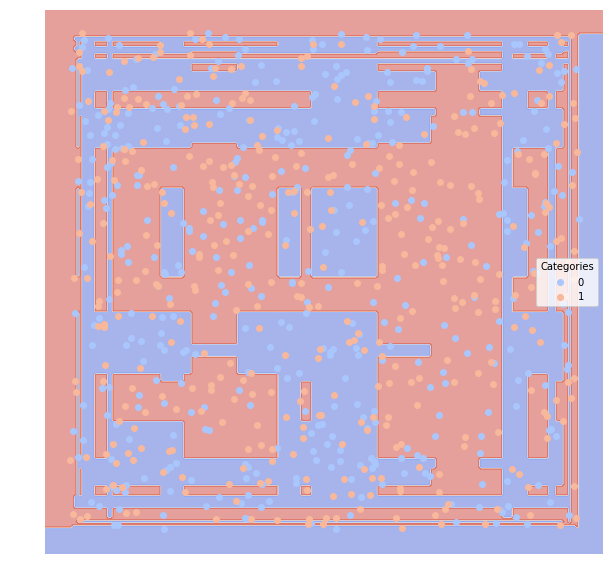

In [46]:
# artificial dataset 2
# another two classes randomly distributed across both dimensions
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.random())
lucem_illud.plotter(dfTrain)
classify_data(dfTrain, dfTest)

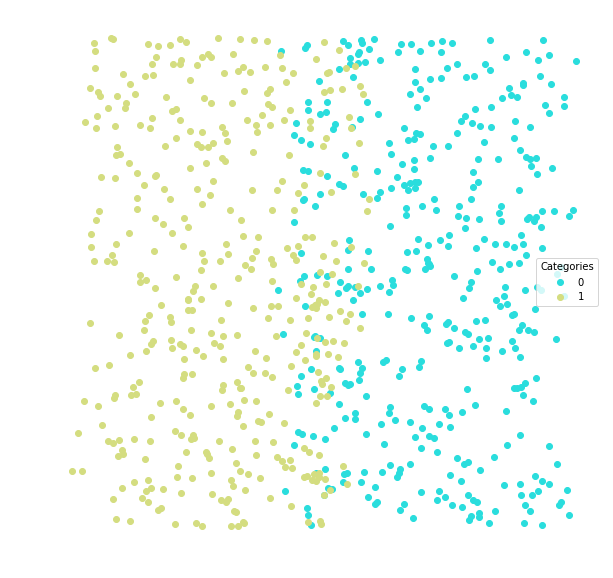

Gaussian Naive Bayes:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.895356           0.863981       0.105       0.91  0.883495
1         0.895356           0.843351       0.105       0.88  0.907216


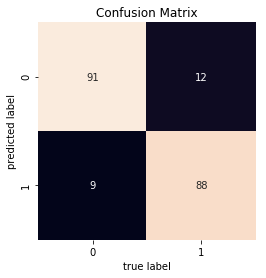

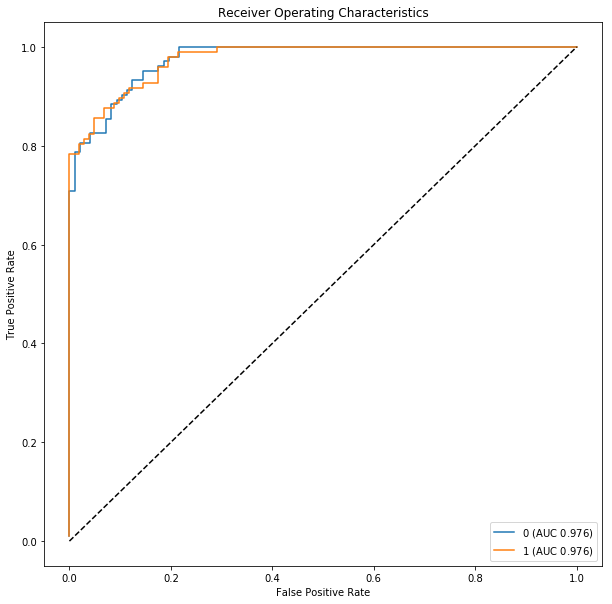

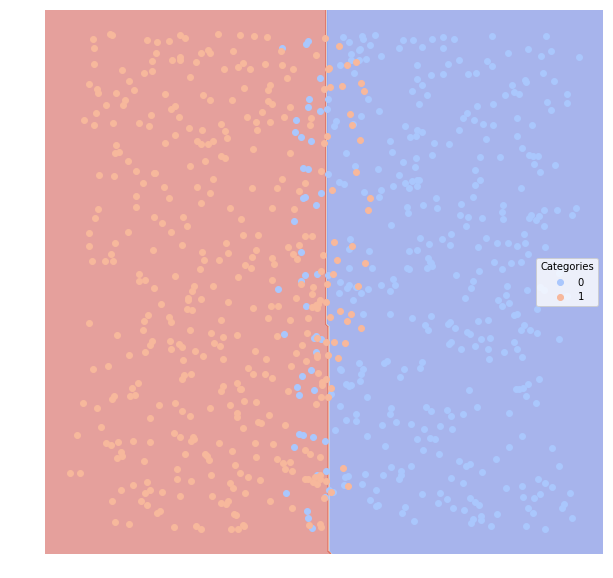

Support Vector Machine with linear kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.895056           0.860635       0.105   0.901961  0.893204
1         0.895056           0.846234       0.105   0.887755  0.896907


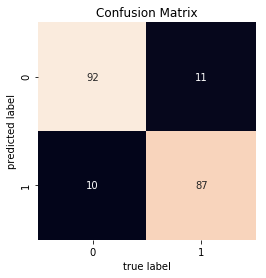

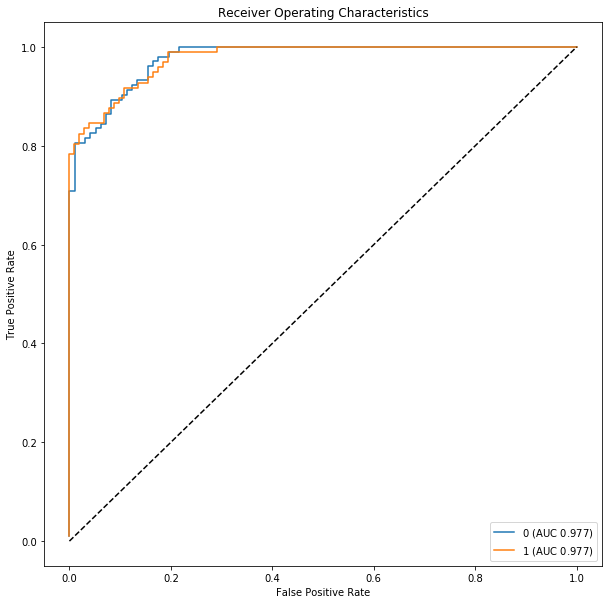

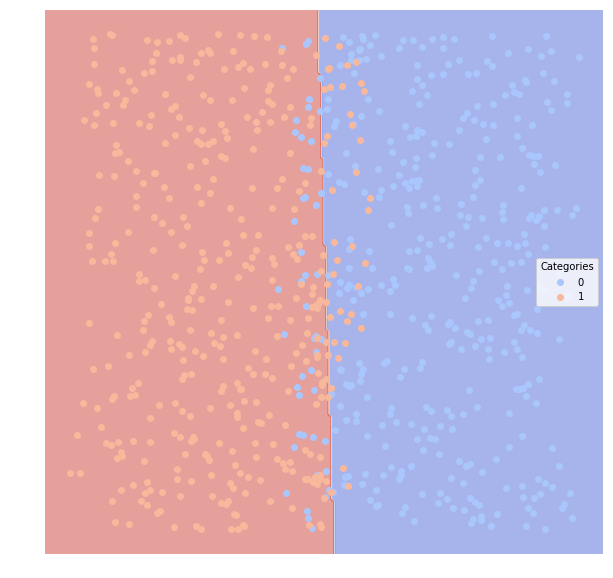

Support Vector Machine with 3 degree polynomial kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.895056           0.860635       0.105   0.901961  0.893204
1         0.895056           0.846234       0.105   0.887755  0.896907


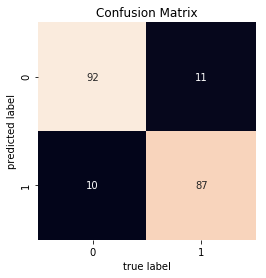

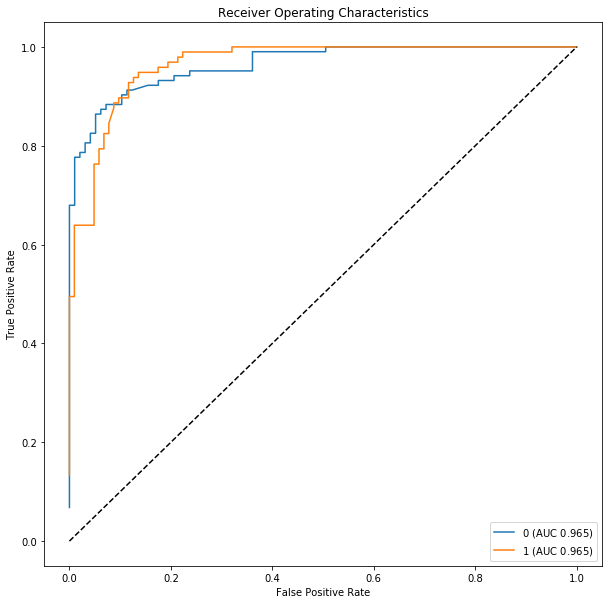

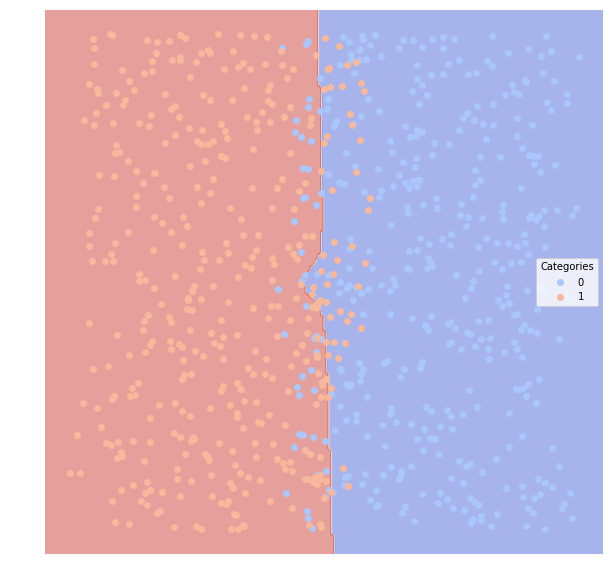

K-Nearest Neighbors with 5 neighbors:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.869583           0.825696        0.13   0.866667  0.883495
1         0.869583           0.817585        0.13   0.873684  0.855670


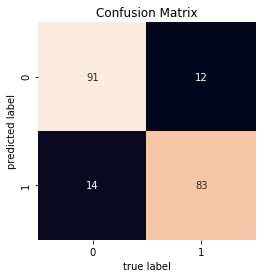

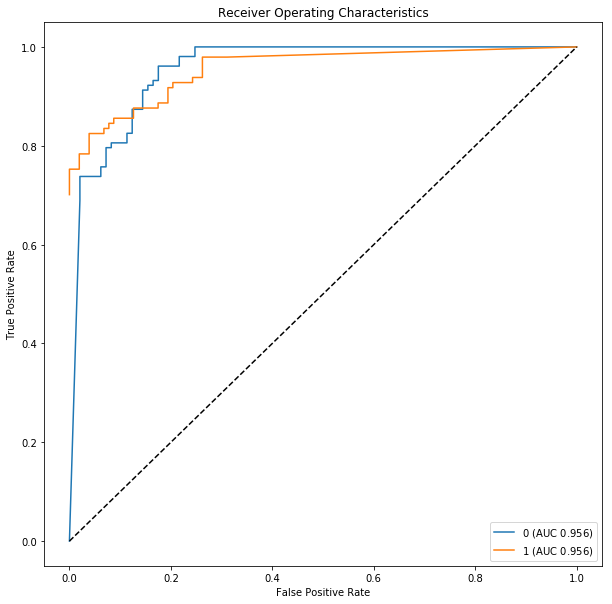

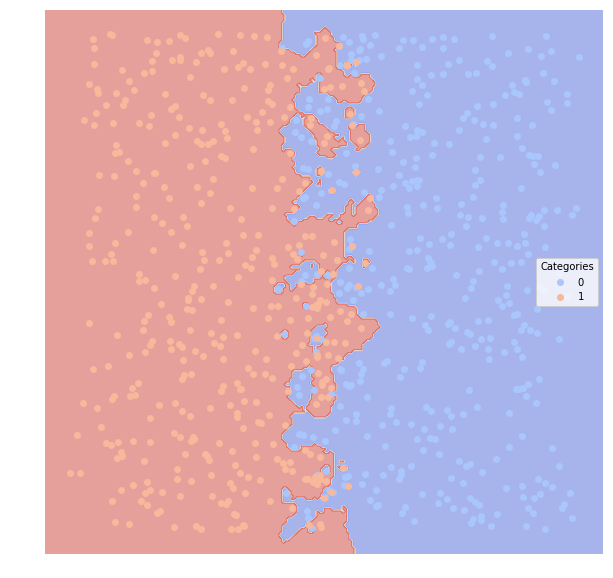

Logistic Regression:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.895356           0.863981       0.105       0.91  0.883495
1         0.895356           0.843351       0.105       0.88  0.907216


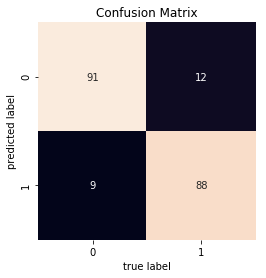

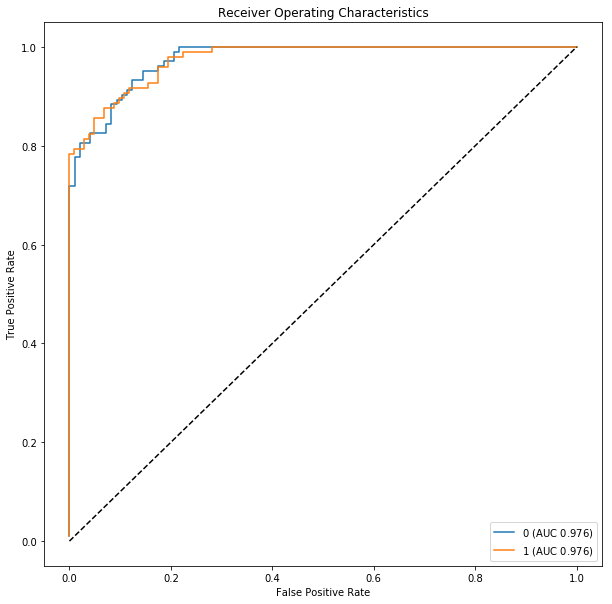

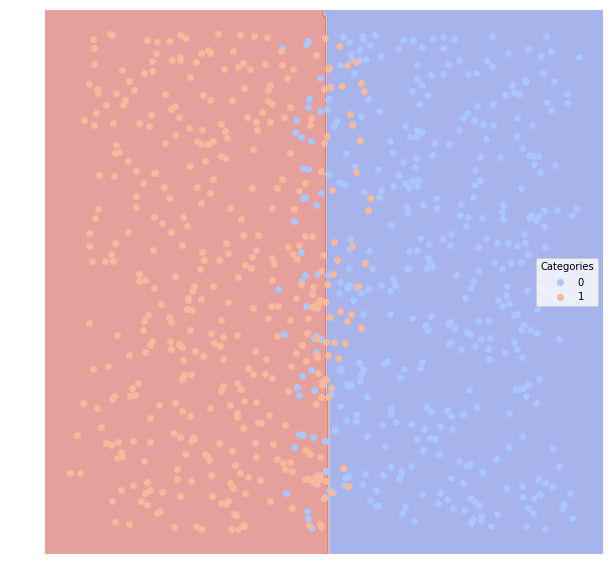

Decision Tree:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.859874           0.816630        0.14   0.864078  0.864078
1         0.859874           0.802171        0.14   0.855670  0.855670


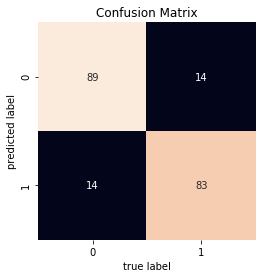

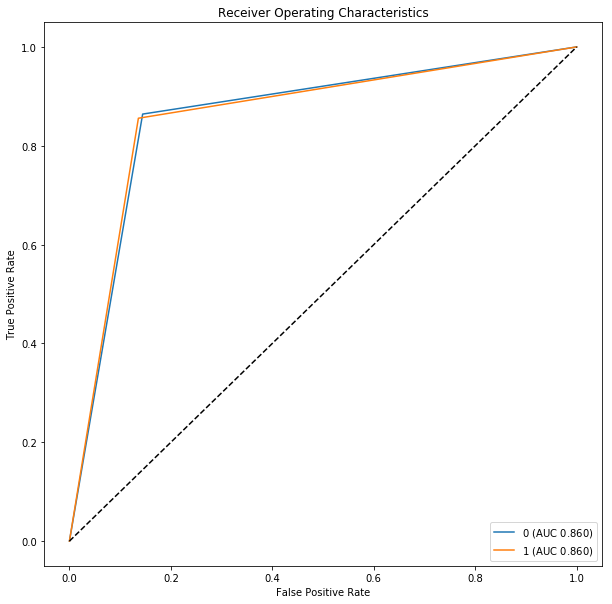

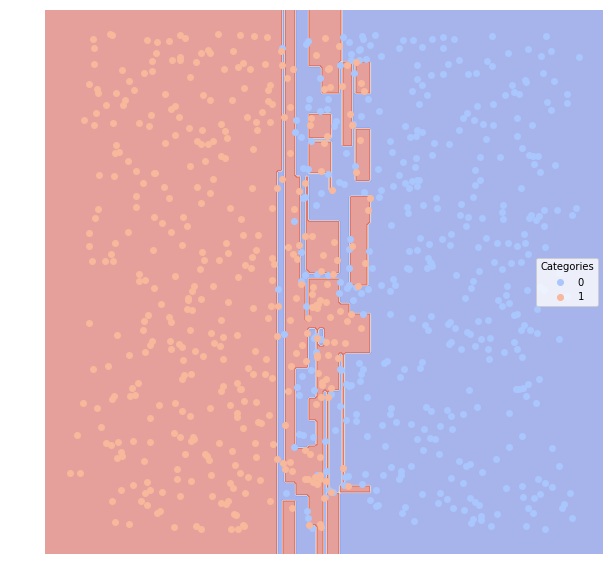

Random Forest:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.859574            0.81396        0.14   0.857143  0.873786
1         0.859574            0.80468        0.14   0.863158  0.845361


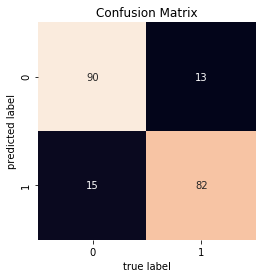

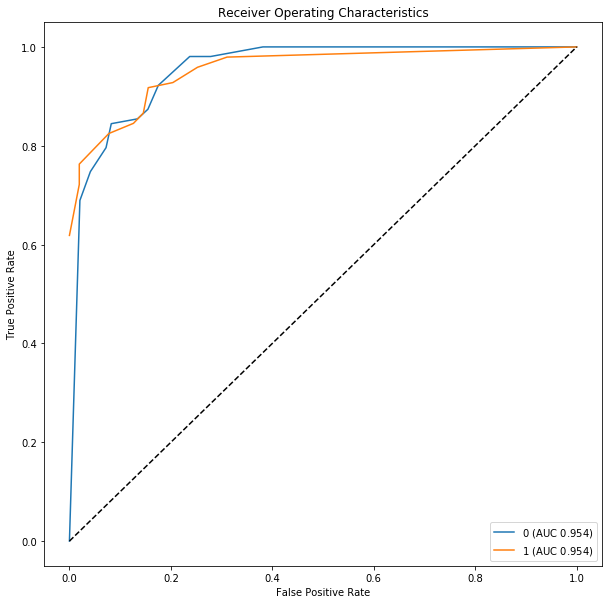

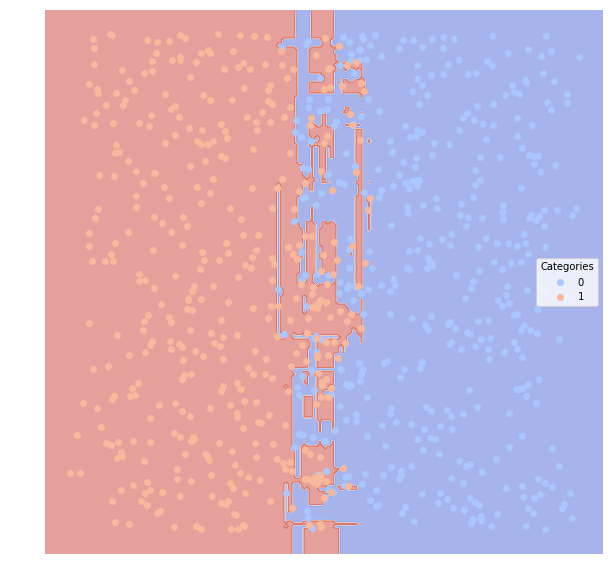

Neural Network (Multi-layer Perceptron):
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
0         0.90021           0.868611         0.1   0.910891  0.893204
1         0.90021           0.851415         0.1   0.888889  0.907216


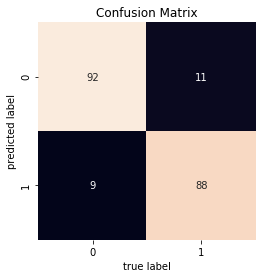

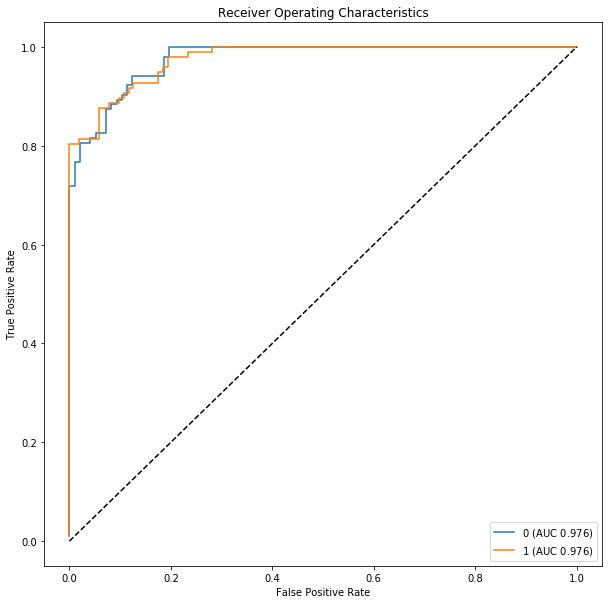

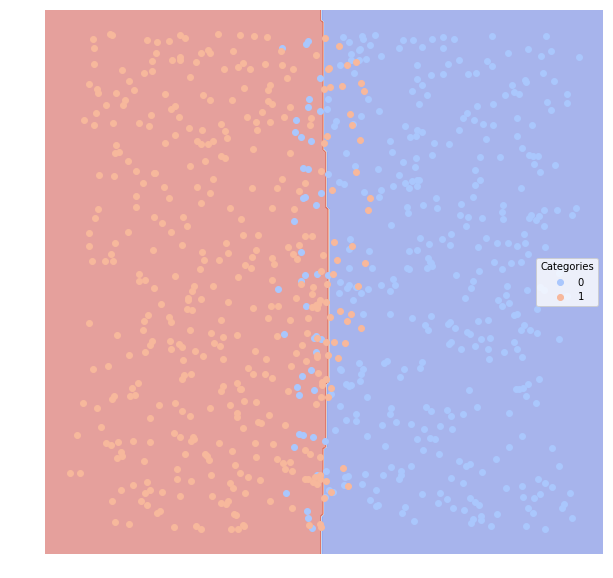

Gradient Boosting:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.860775           0.825266        0.14   0.886598  0.834951
1         0.860775           0.795266        0.14   0.834951  0.886598


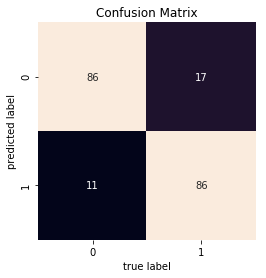

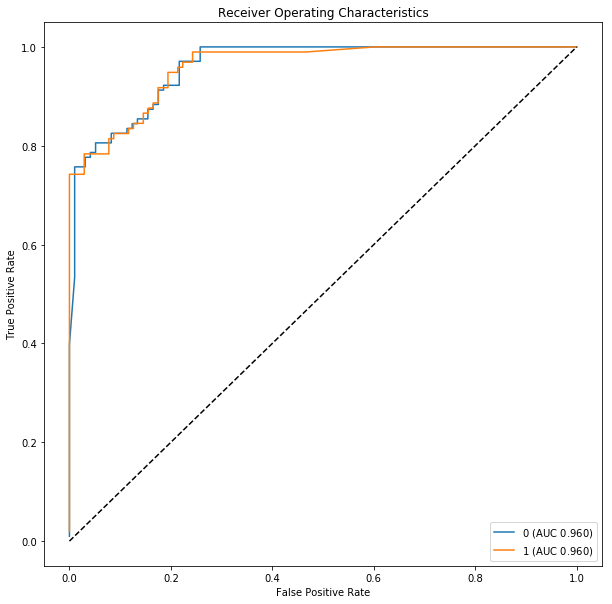

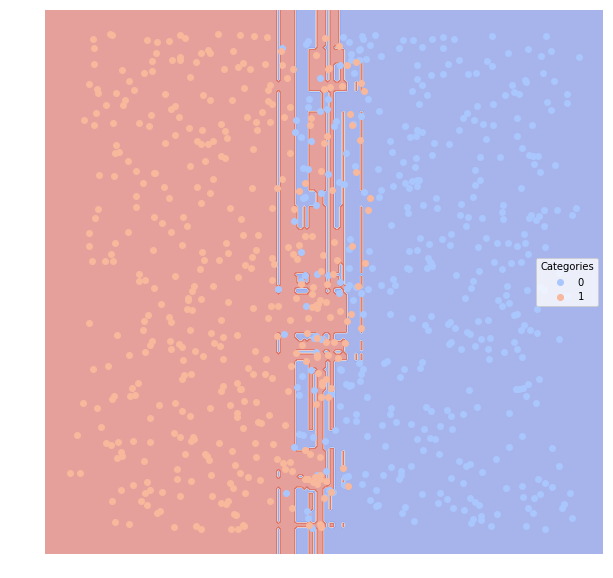

AdaBoost with 100 weak classifiers:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.875638           0.842188       0.125   0.897959  0.854369
1         0.875638           0.815009       0.125   0.852941  0.896907


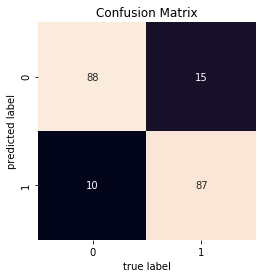

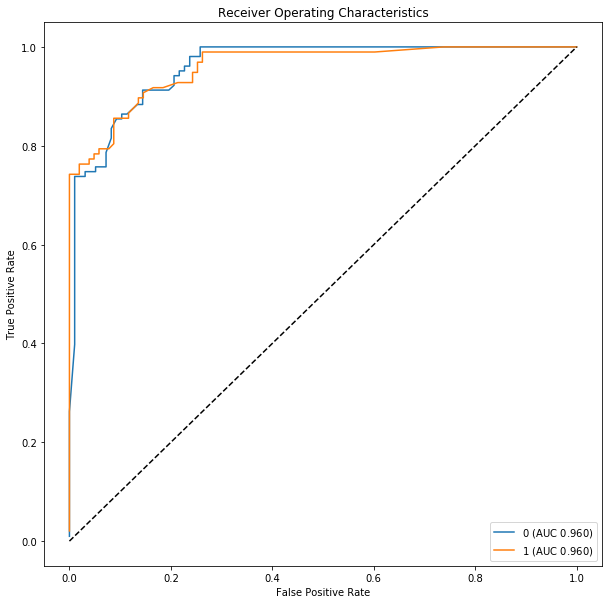

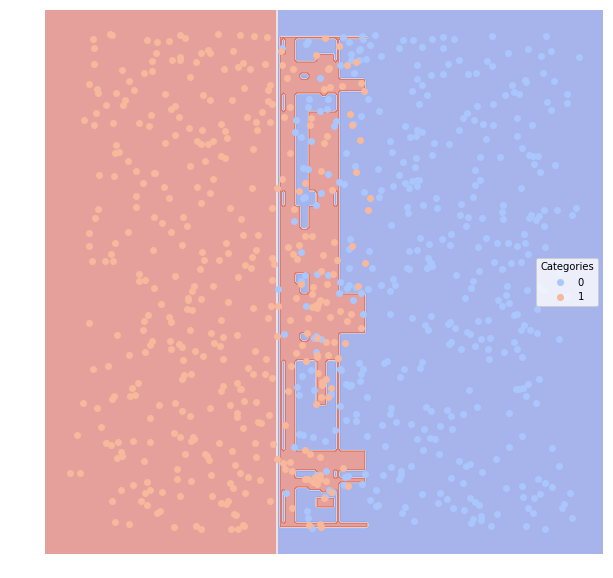

In [47]:
# artificial dataset 3
# two classes linearly split along one of two dimensions
noise = .2
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise))
lucem_illud.plotter(dfTrain)
classify_data(dfTrain, dfTest)

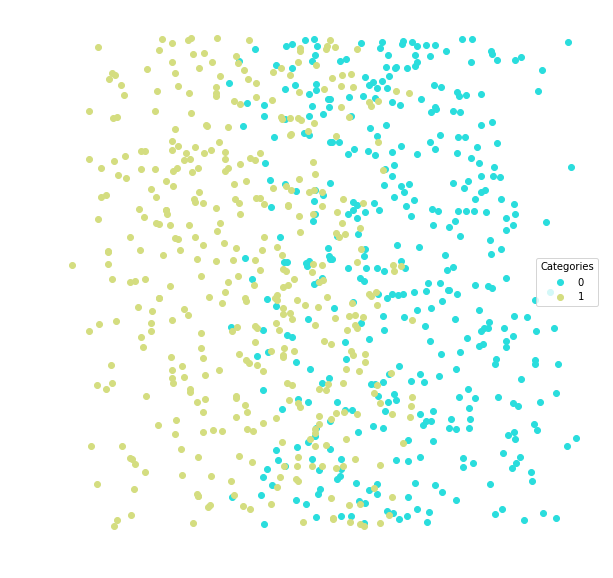

Gaussian Naive Bayes:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.724408           0.695399        0.28   0.784091  0.650943
1         0.724408           0.629290        0.28   0.669643  0.797872


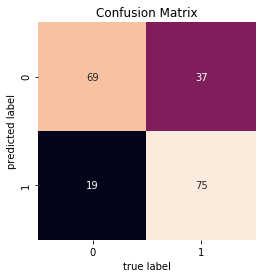

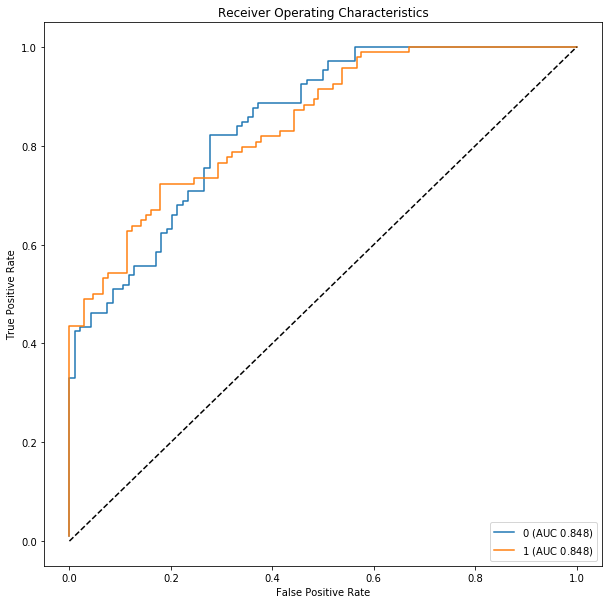

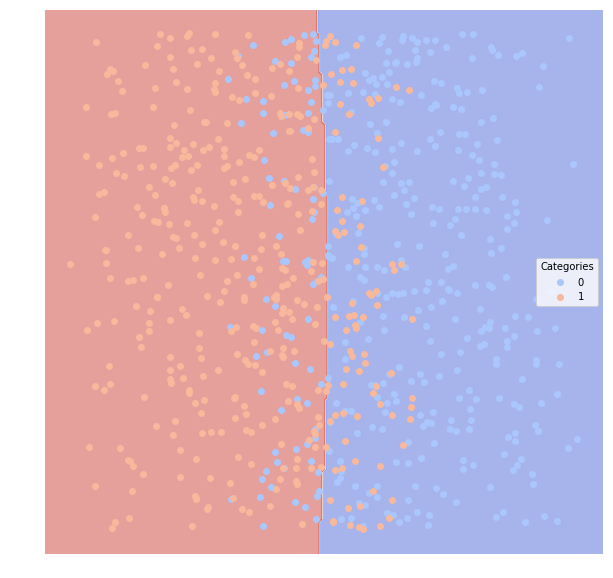

Support Vector Machine with linear kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.710257           0.683463       0.295   0.776471  0.622642
1         0.710257           0.615352       0.295   0.652174  0.797872


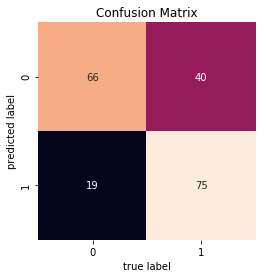

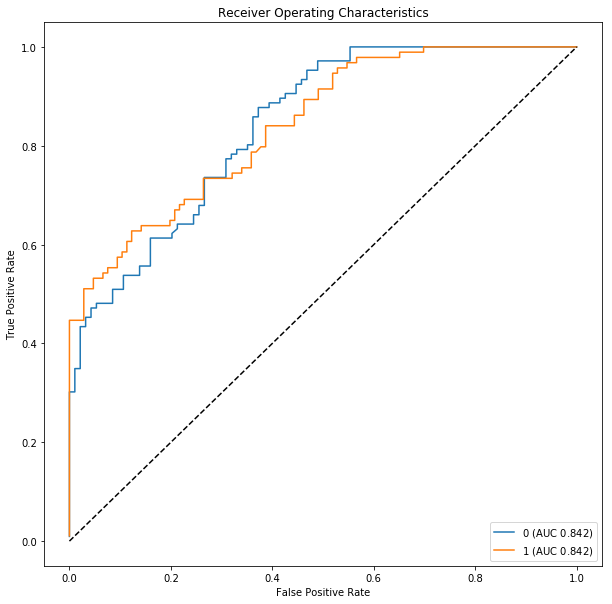

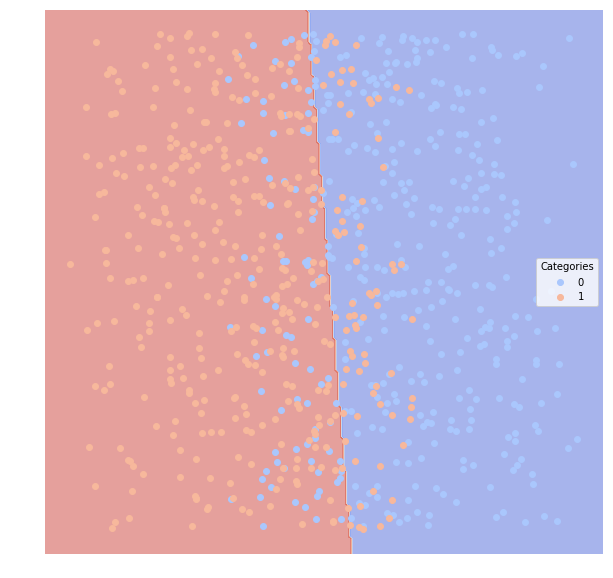

Support Vector Machine with 3 degree polynomial kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.703332           0.698064        0.31   0.879310  0.481132
1         0.703332           0.602051        0.31   0.612676  0.925532


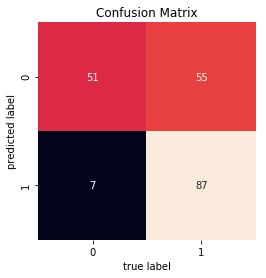

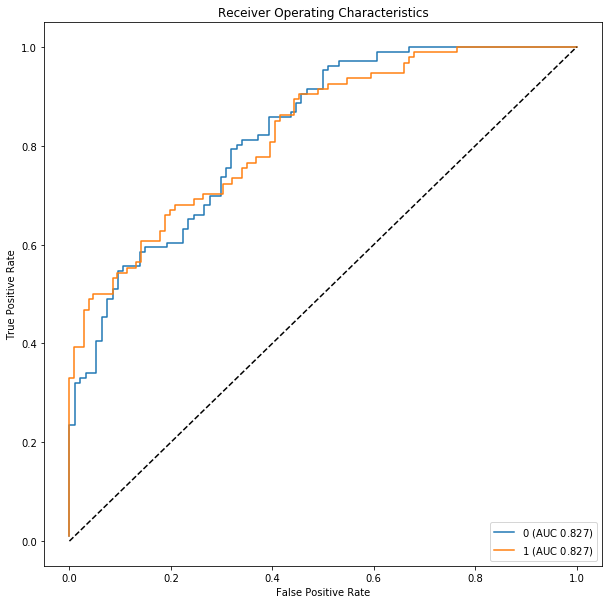

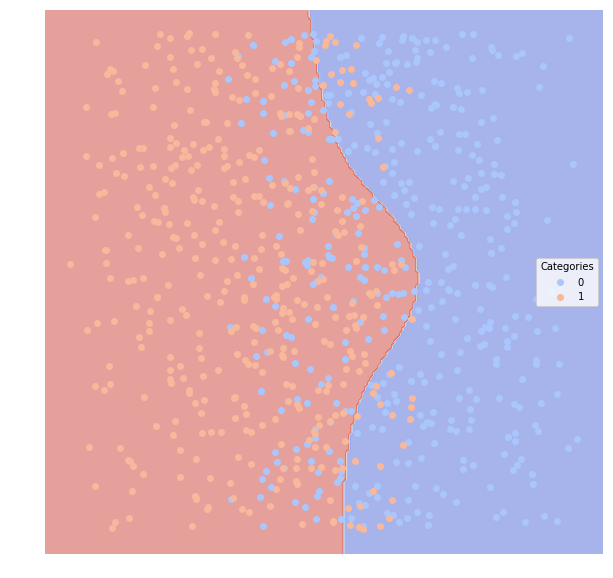

K-Nearest Neighbors with 5 neighbors:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
0         0.70845           0.678572       0.295   0.758242  0.650943
1         0.70845           0.615954       0.295   0.660550  0.765957


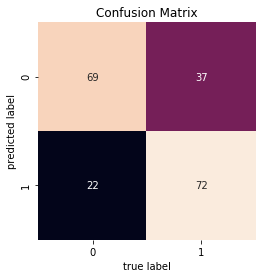

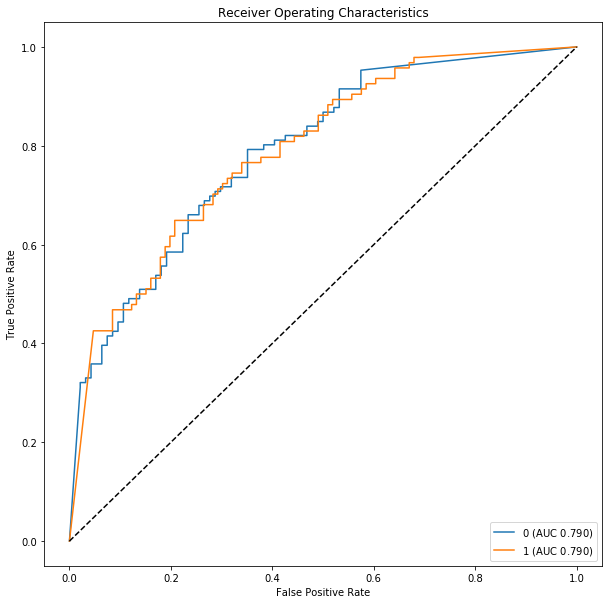

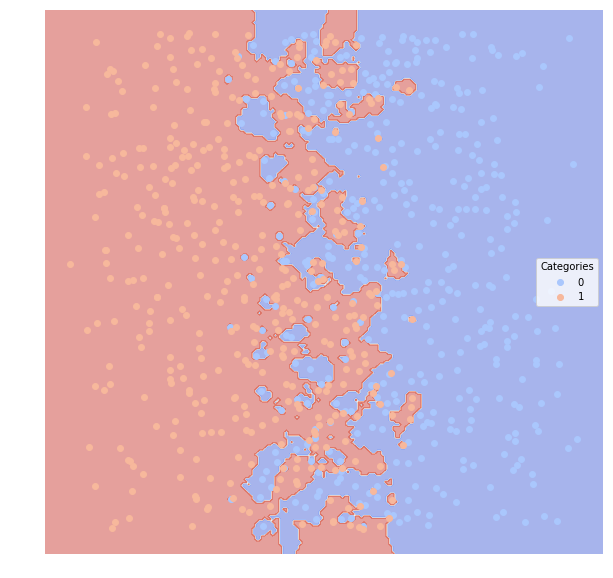

Logistic Regression:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.704336           0.676239         0.3   0.761364  0.632075
1         0.704336           0.611174         0.3   0.651786  0.776596


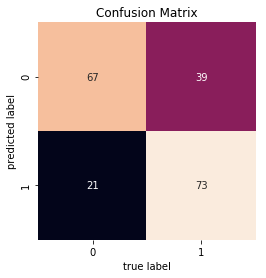

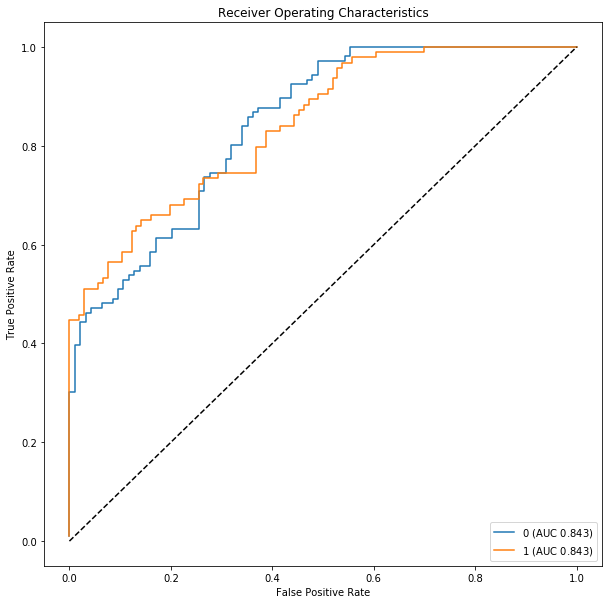

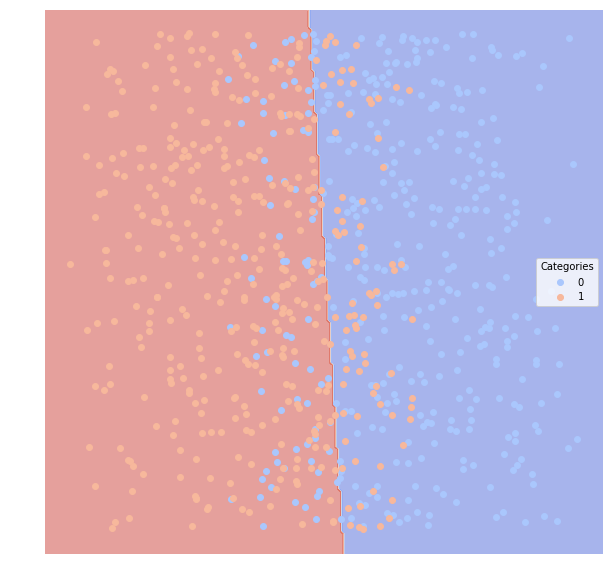

Decision Tree:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.721999           0.688683        0.28   0.760417  0.688679
1         0.721999           0.630651        0.28   0.682692  0.755319


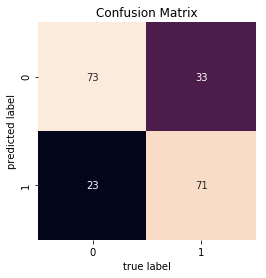

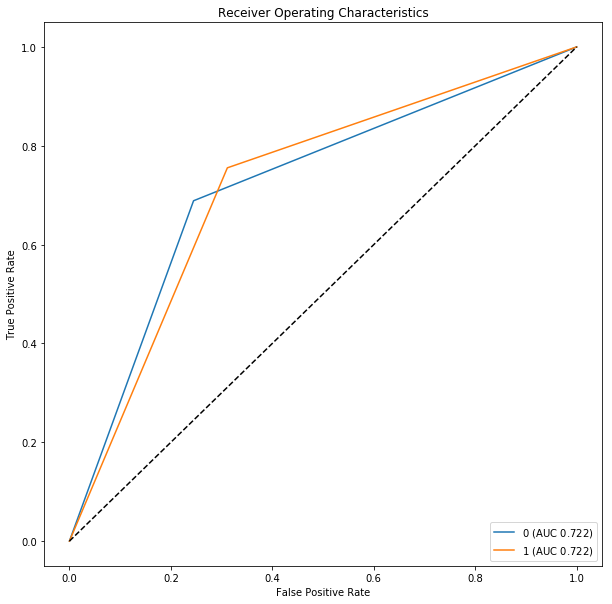

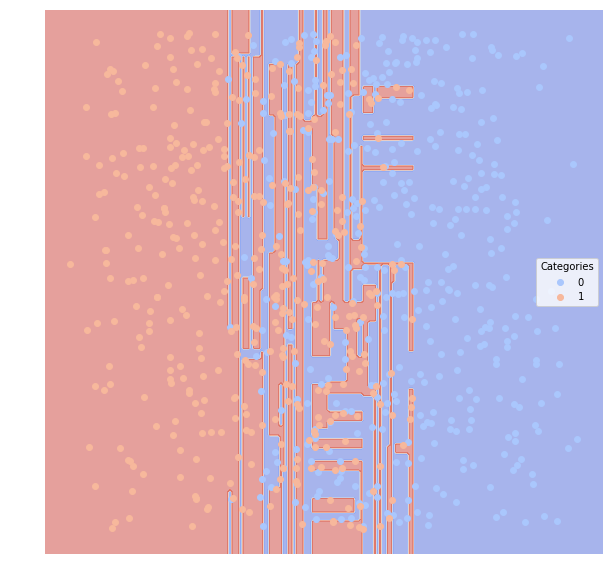

Random Forest:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.709554           0.673948        0.29   0.730769  0.716981
1         0.709554           0.622713        0.29   0.687500  0.702128


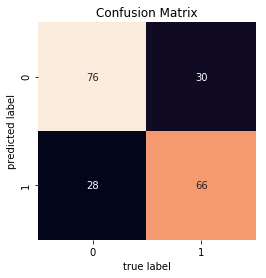

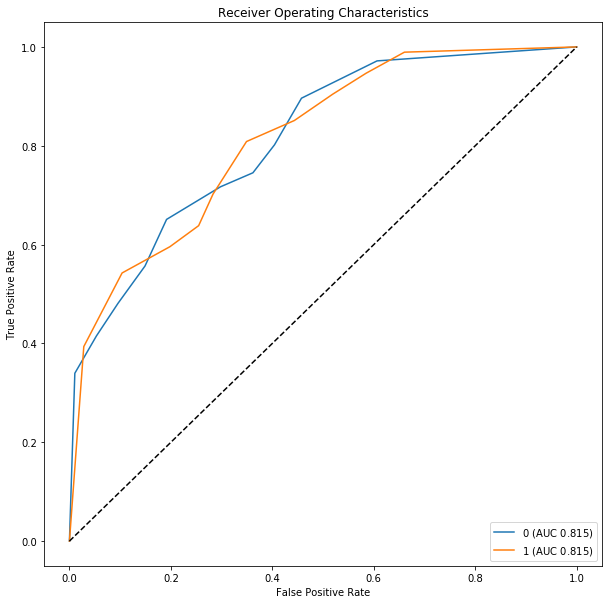

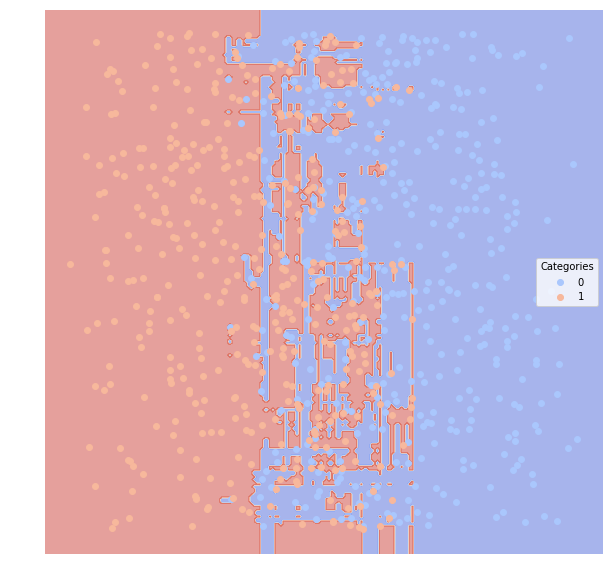

Neural Network (Multi-layer Perceptron):
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.714372           0.685712        0.29   0.772727  0.641509
1         0.714372           0.620137        0.29   0.660714  0.787234


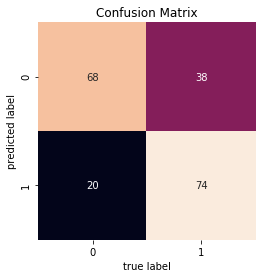

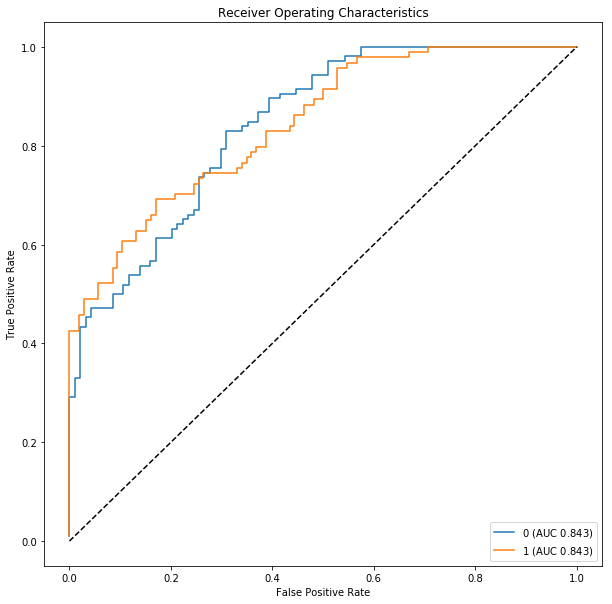

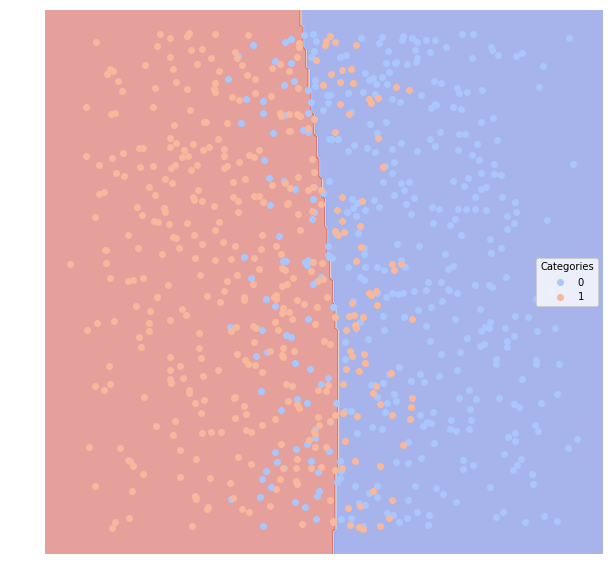

Gradient Boosting:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.697812           0.667958       0.305   0.741935  0.650943
1         0.697812           0.607174       0.305   0.654206  0.744681


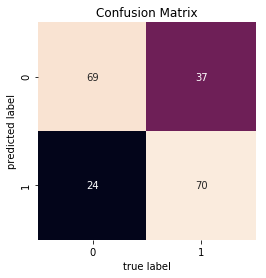

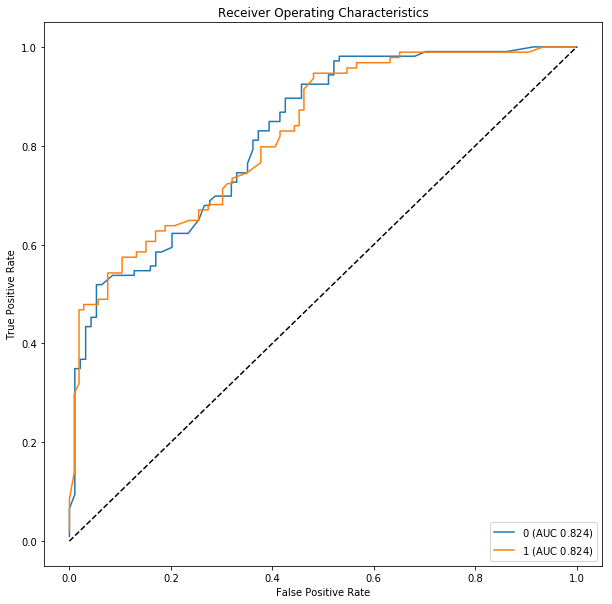

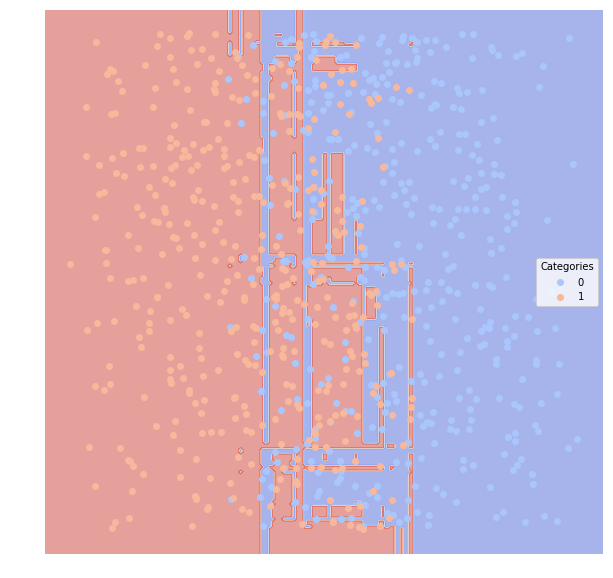

AdaBoost with 100 weak classifiers:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.719089           0.689664       0.285   0.775281  0.650943
1         0.719089           0.624823       0.285   0.666667  0.787234


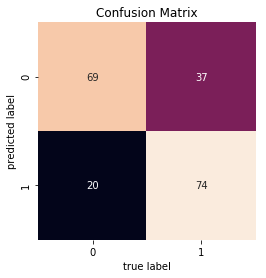

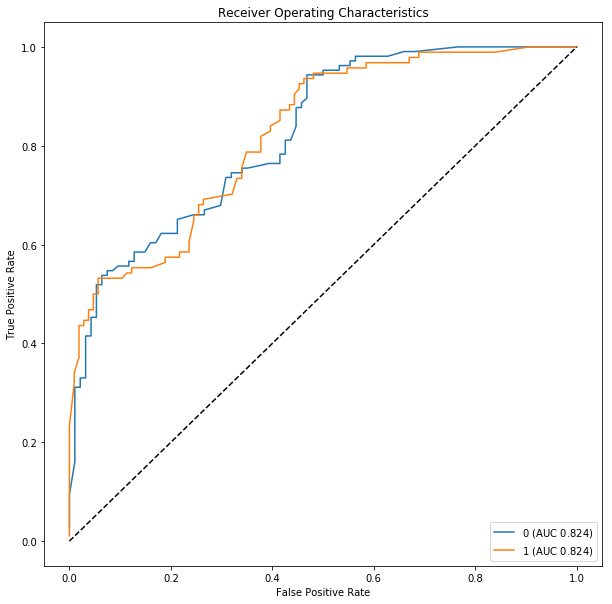

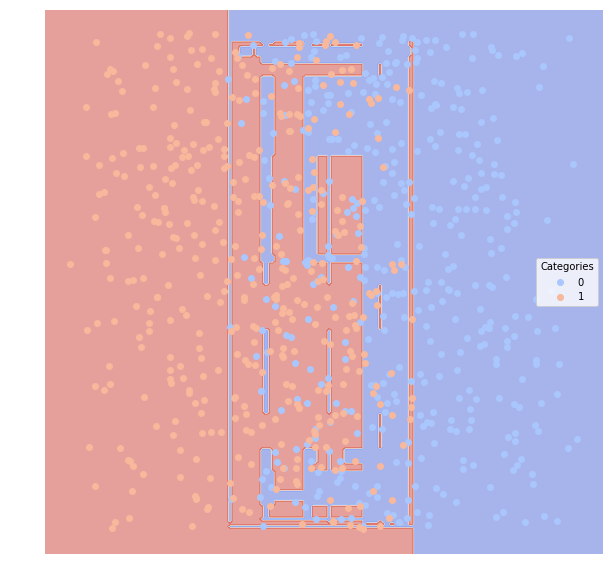

In [48]:
# artificial dataset 4
# two classes linearly split along one of two dimensions with more noise
noise = .4
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.andSplit(noise))
lucem_illud.plotter(dfTrain)
classify_data(dfTrain, dfTest)

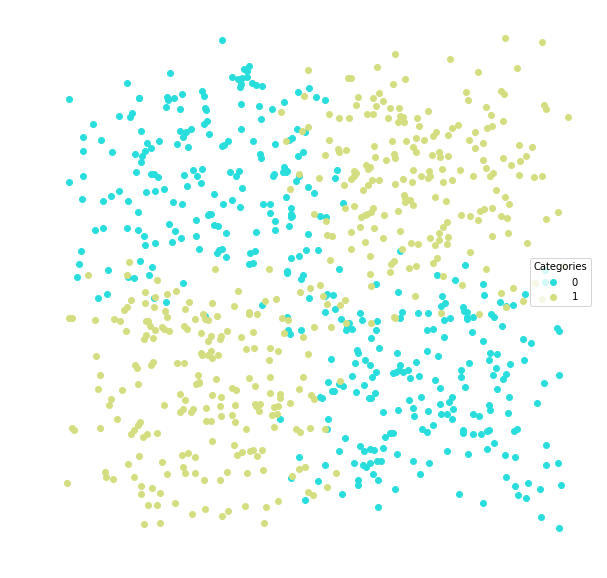

Gaussian Naive Bayes:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.449675           0.540557       0.585   0.439024  0.160714
1         0.449675           0.416958       0.585   0.408805  0.738636


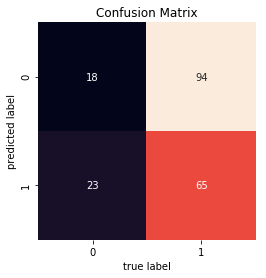

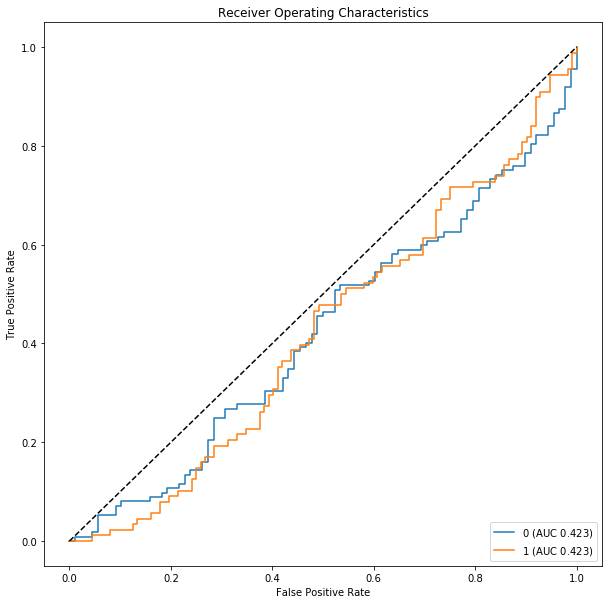

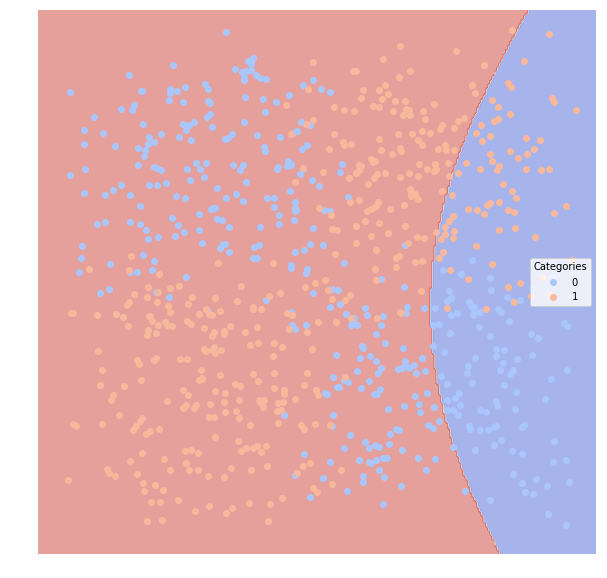

Support Vector Machine with linear kernel:
          AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                       
0         0.5               0.56        0.56       0.00     0.0
1         0.5               0.44        0.56       0.44     1.0


/Users/yiqingzhu/anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


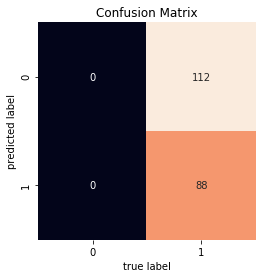

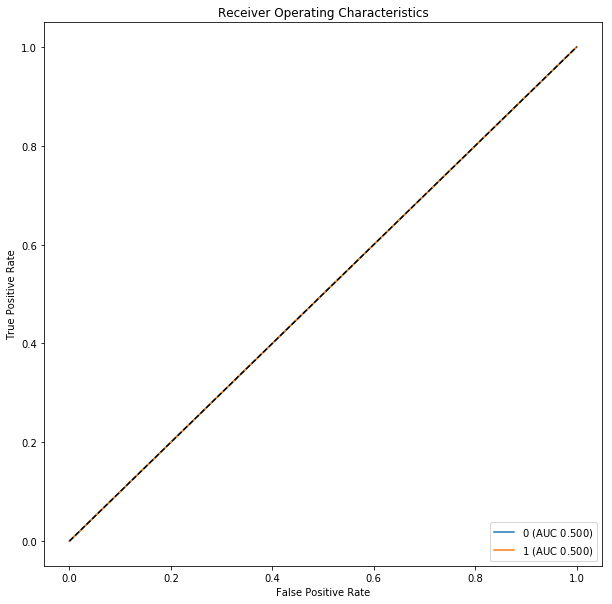

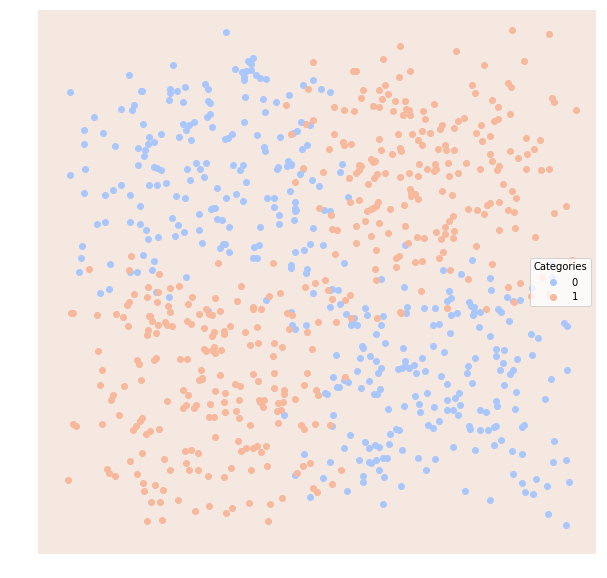

Support Vector Machine with 3 degree polynomial kernel:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
0         0.69724           0.701598        0.32   0.815789  0.553571
1         0.69724           0.571833        0.32   0.596774  0.840909


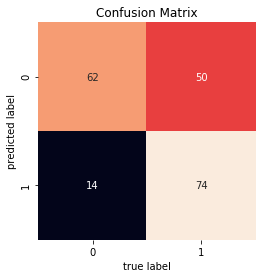

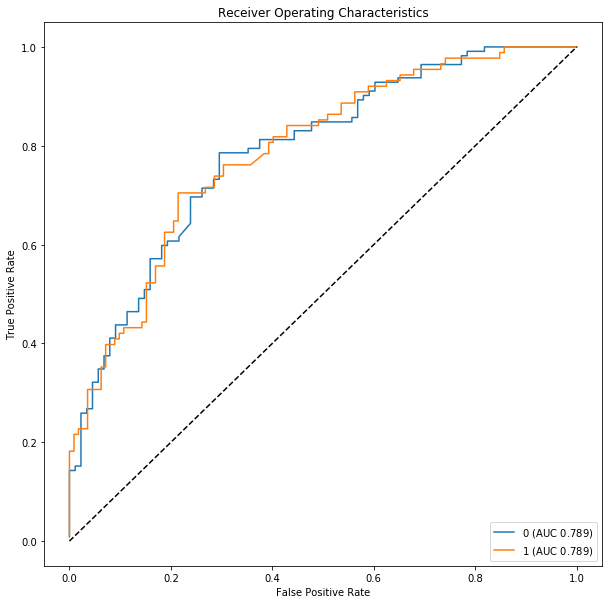

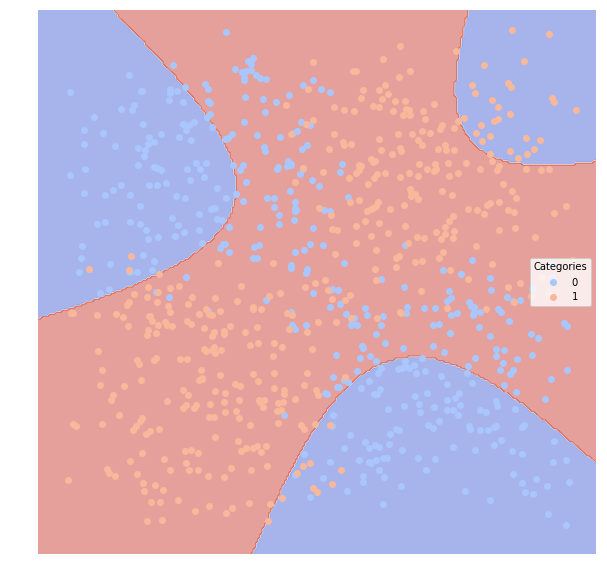

K-Nearest Neighbors with 5 neighbors:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.900974           0.886720         0.1   0.925926  0.892857
1         0.900974           0.830514         0.1   0.869565  0.909091


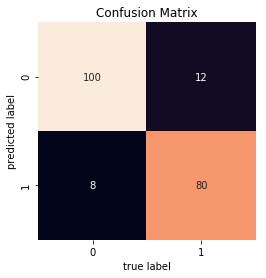

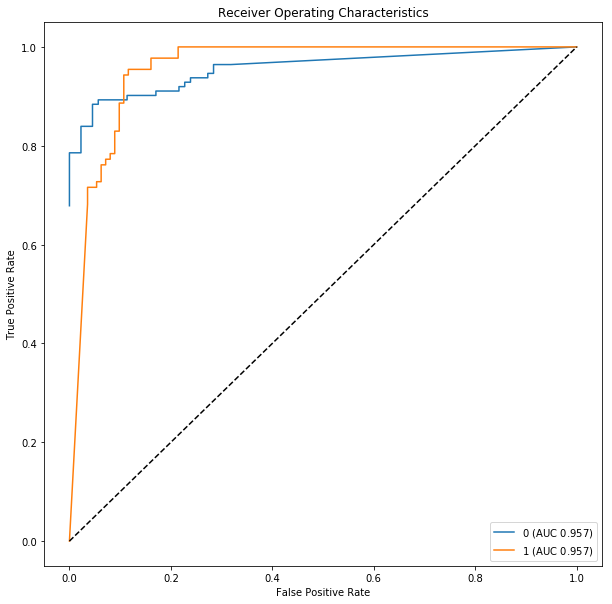

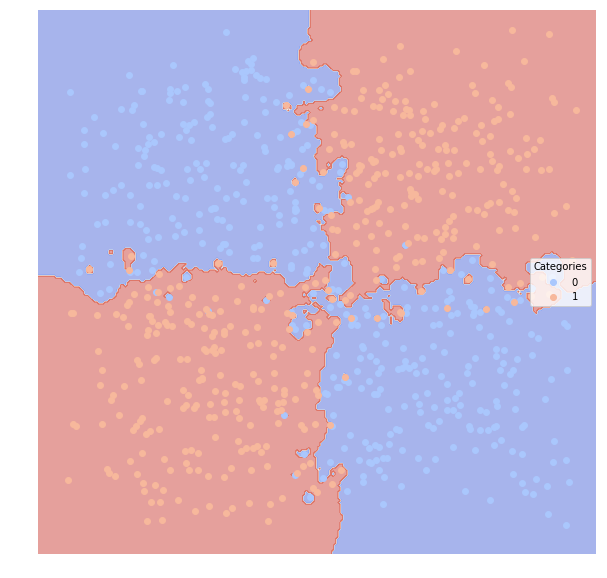

Logistic Regression:
              AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                           
0         0.46875           0.546570       0.565   0.488372  0.1875
1         0.46875           0.425287       0.565   0.420382  0.7500


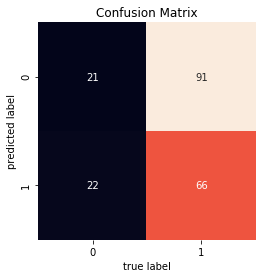

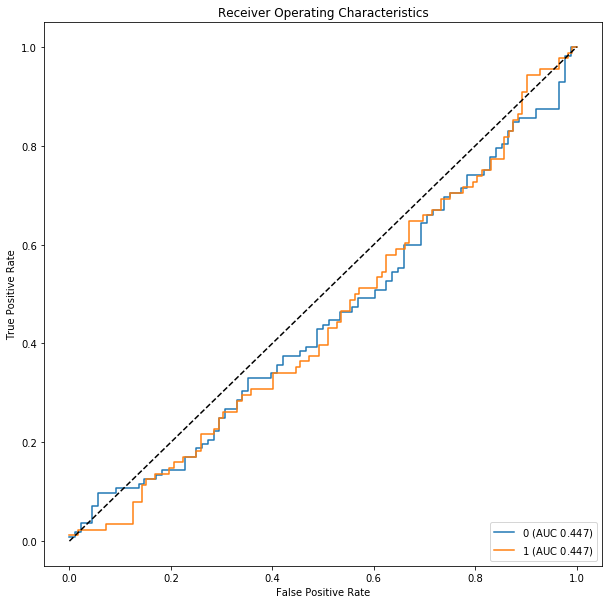

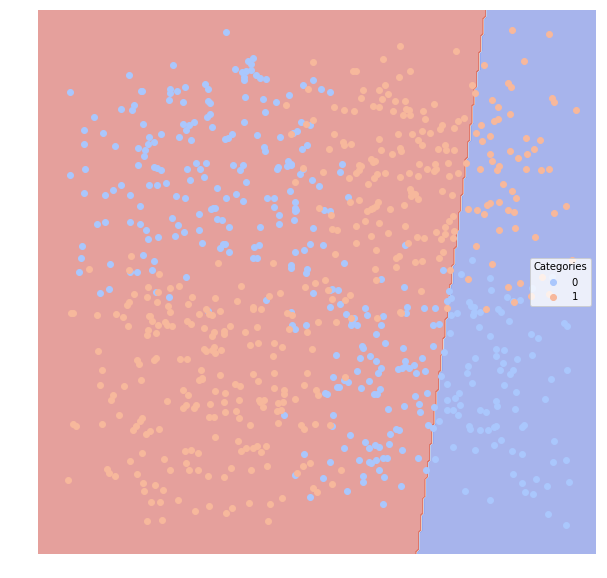

Decision Tree:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
0         0.85349           0.831837       0.145   0.873874  0.866071
1         0.85349           0.769183       0.145   0.831461  0.840909


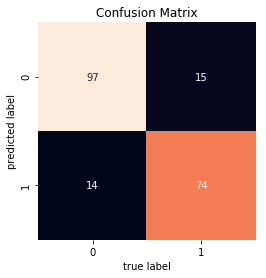

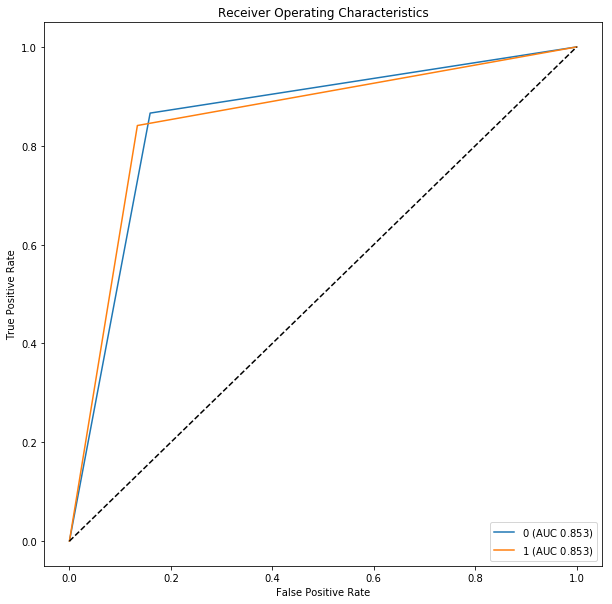

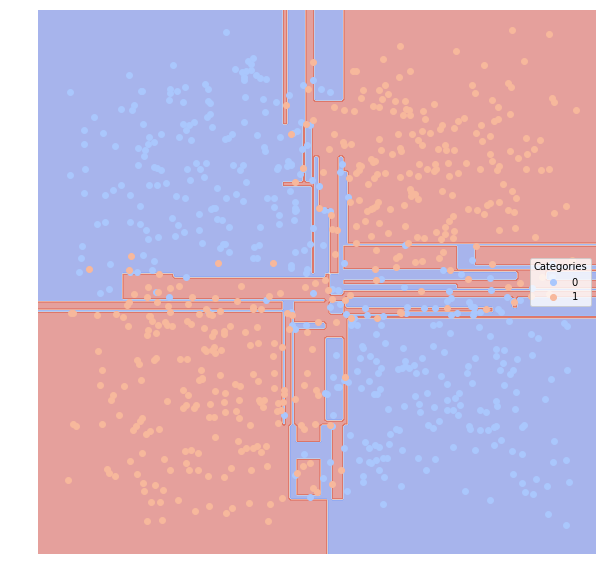

Random Forest:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.900974           0.886720         0.1   0.925926  0.892857
1         0.900974           0.830514         0.1   0.869565  0.909091


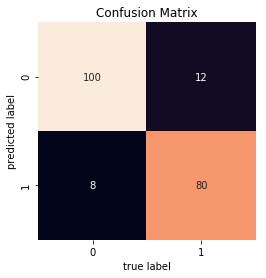

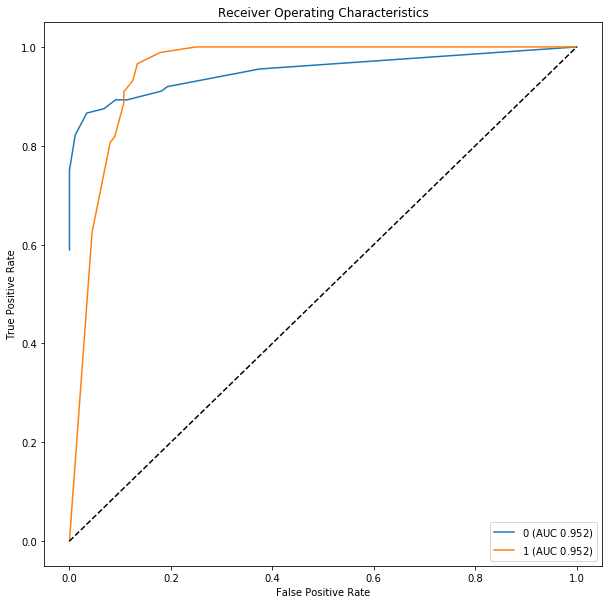

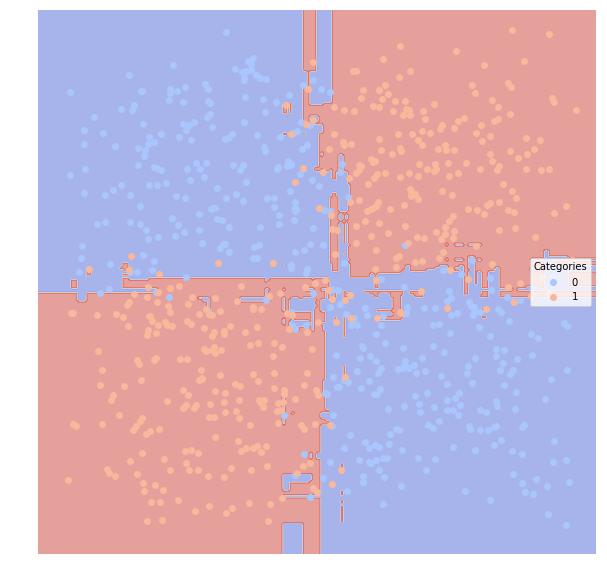

Neural Network (Multi-layer Perceptron):
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.913555           0.906432        0.09   0.951923  0.883929
1         0.913555           0.840459        0.09   0.864583  0.943182


/Users/yiqingzhu/anaconda/lib/python3.5/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


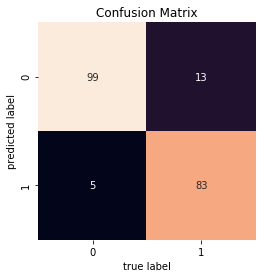

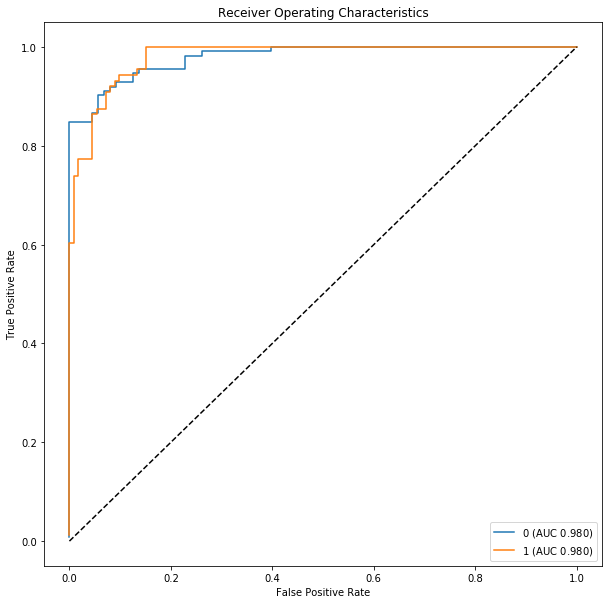

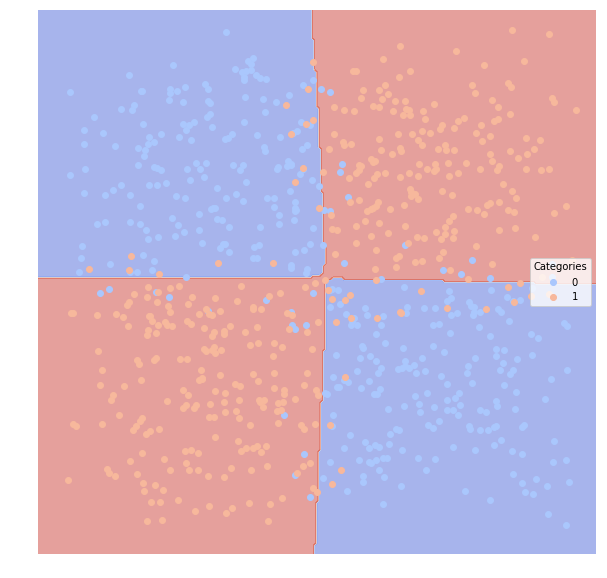

Gradient Boosting:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.907873           0.898418       0.095   0.942857  0.883929
1         0.907873           0.834306       0.095   0.863158  0.931818


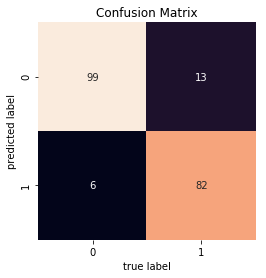

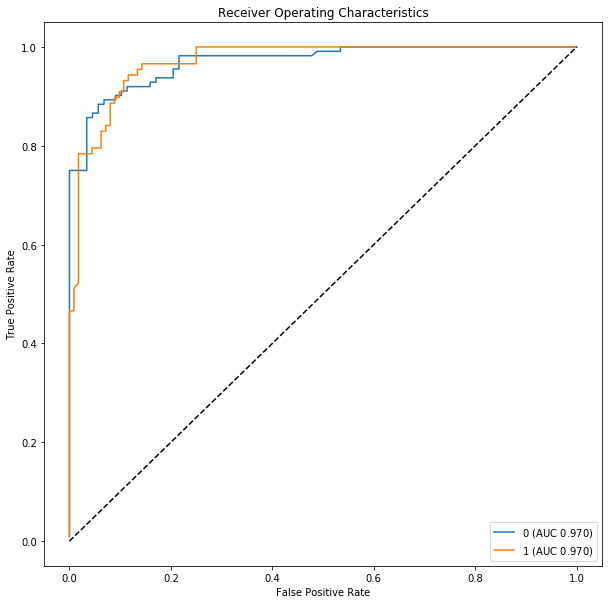

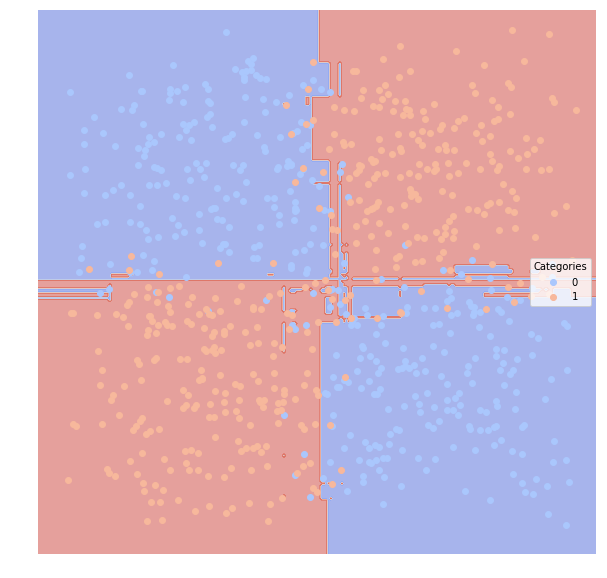

AdaBoost with 100 weak classifiers:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.530844           0.576107       0.475   0.593407  0.482143
1         0.530844           0.456163       0.475   0.467890  0.579545


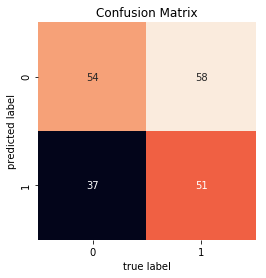

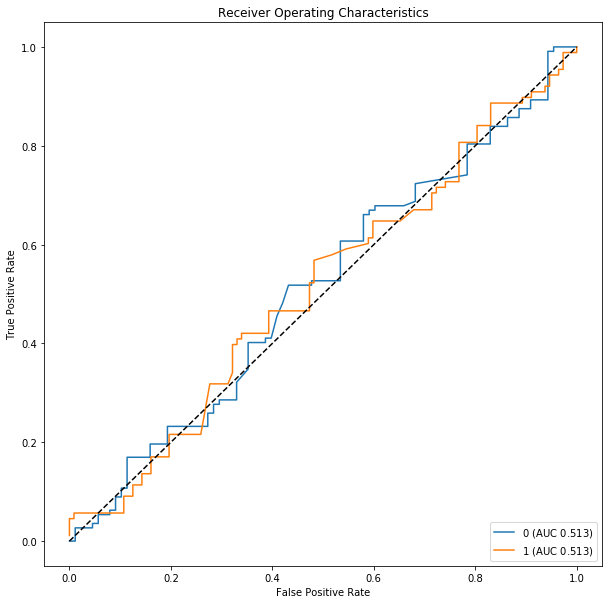

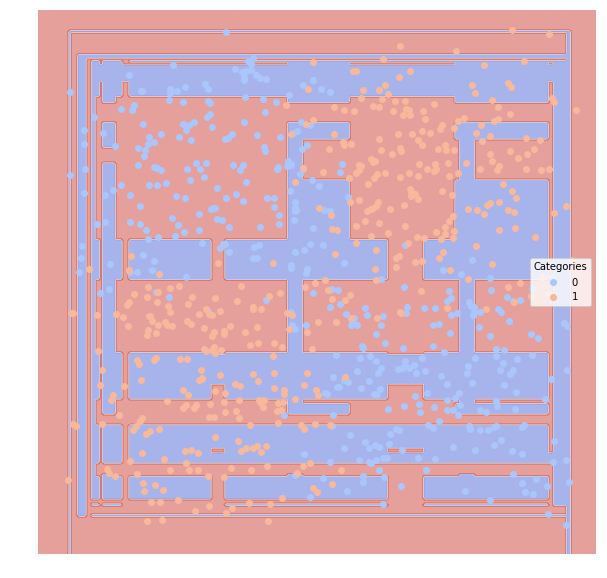

In [49]:
# artificial dataset 5
# two classes split, oppositely, along each dimension
noise = .2
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise))
lucem_illud.plotter(dfTrain)
classify_data(dfTrain, dfTest)

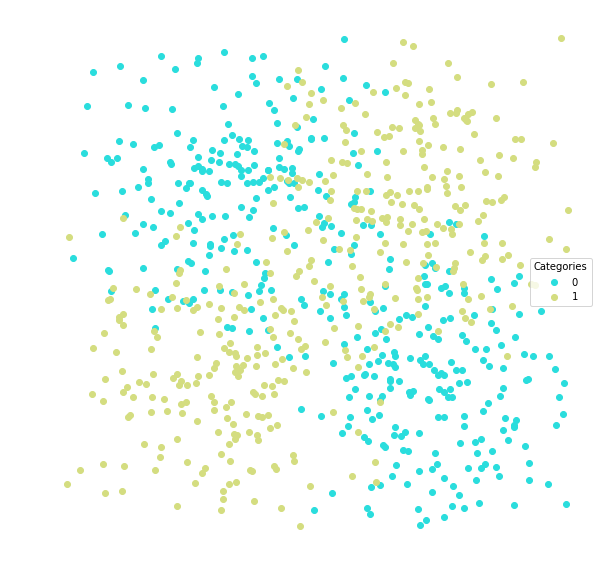

Gaussian Naive Bayes:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.511218           0.485723        0.49   0.490566  0.541667
1         0.511218           0.525728        0.49   0.531915  0.480769


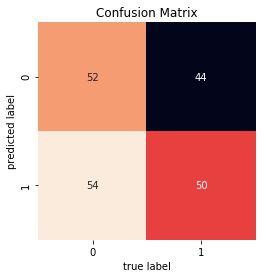

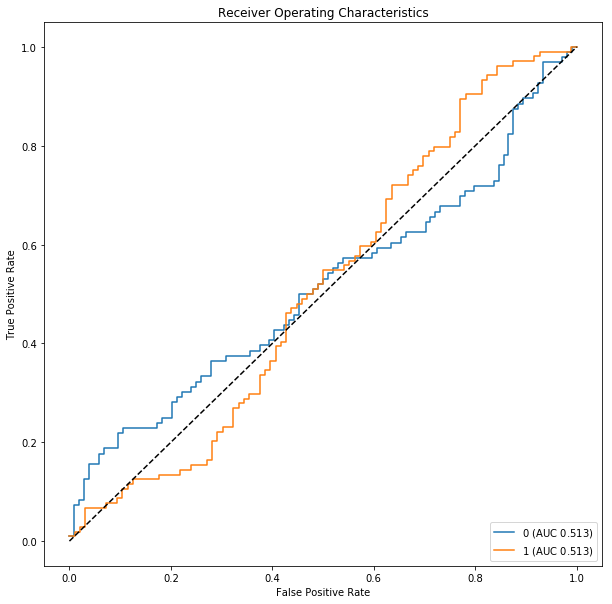

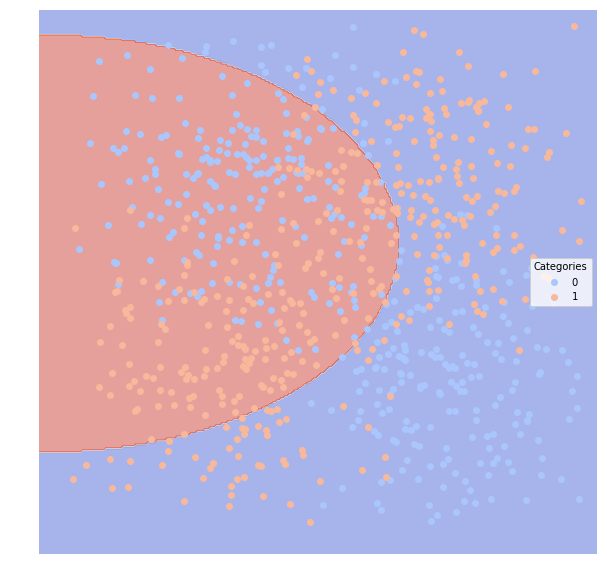

Support Vector Machine with linear kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.550481           0.507794        0.45   0.529412  0.562500
1         0.550481           0.547692        0.45   0.571429  0.538462


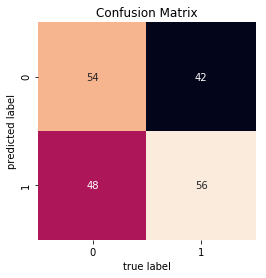

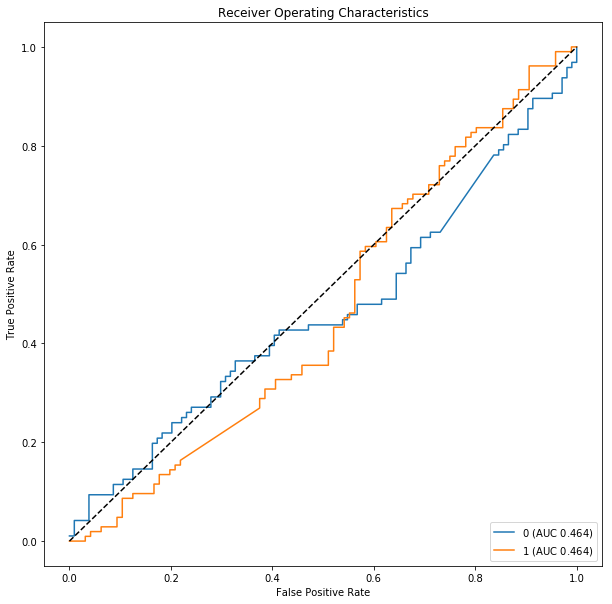

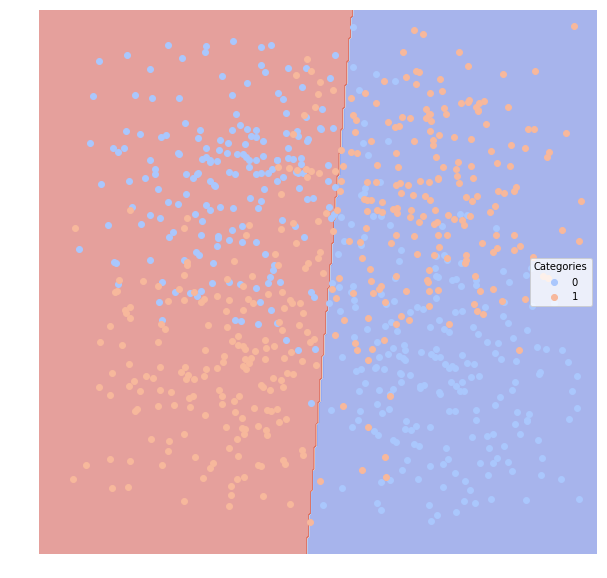

Support Vector Machine with 3 degree polynomial kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.739583           0.683545       0.255   0.816901  0.604167
1         0.739583           0.682248       0.255   0.705426  0.875000


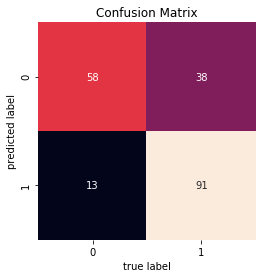

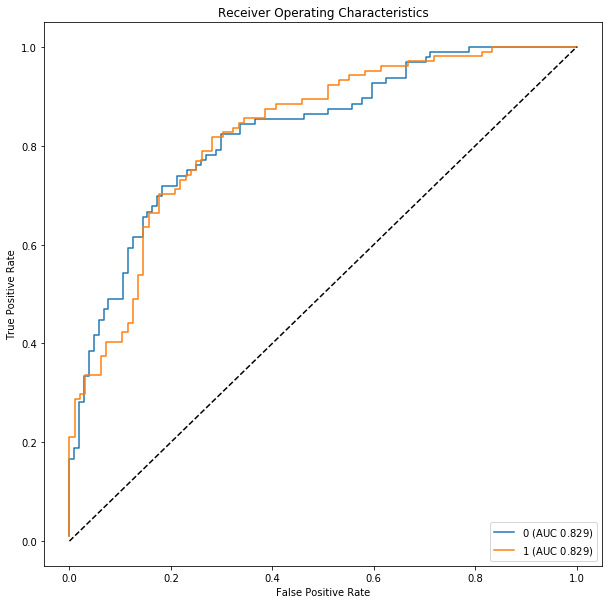

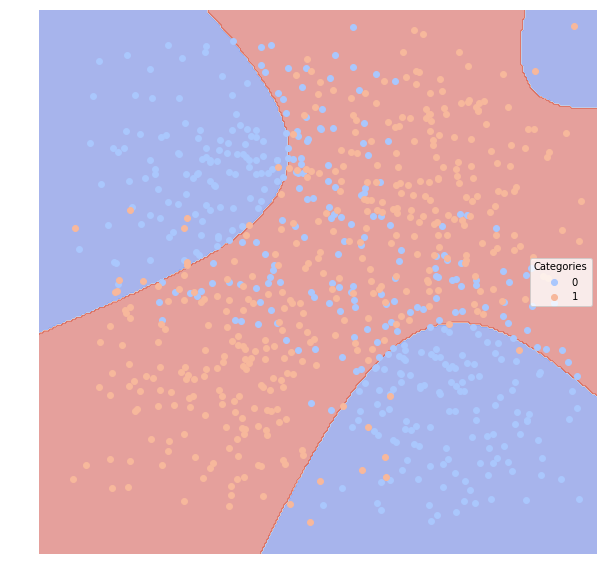

K-Nearest Neighbors with 5 neighbors:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.799679           0.726736         0.2   0.791667  0.791667
1         0.799679           0.752367         0.2   0.807692  0.807692


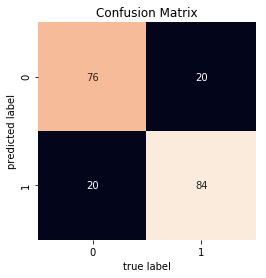

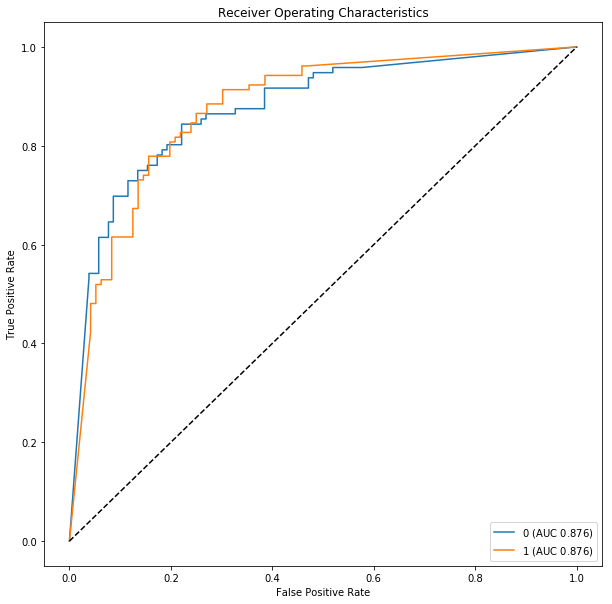

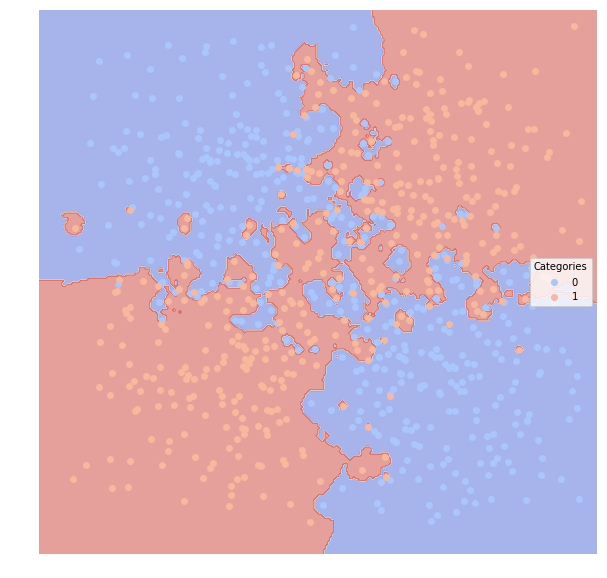

Logistic Regression:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.507212           0.483649       0.495   0.486486  0.562500
1         0.507212           0.523656       0.495   0.528090  0.451923


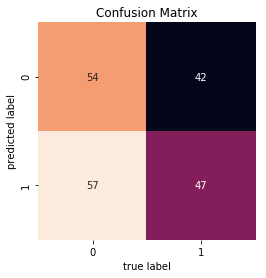

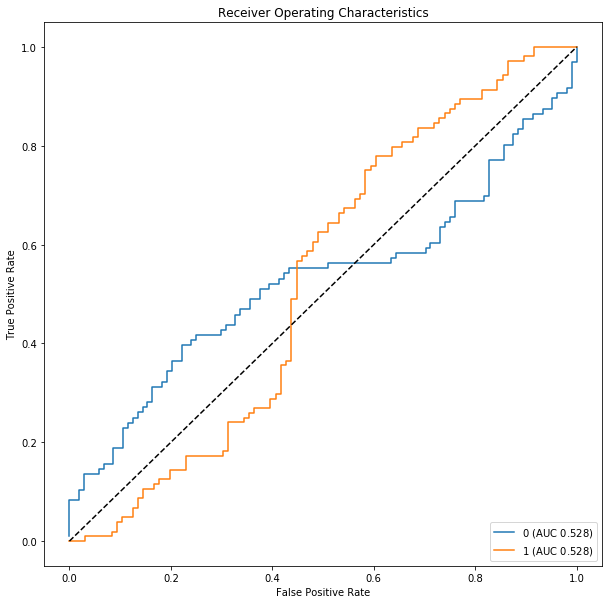

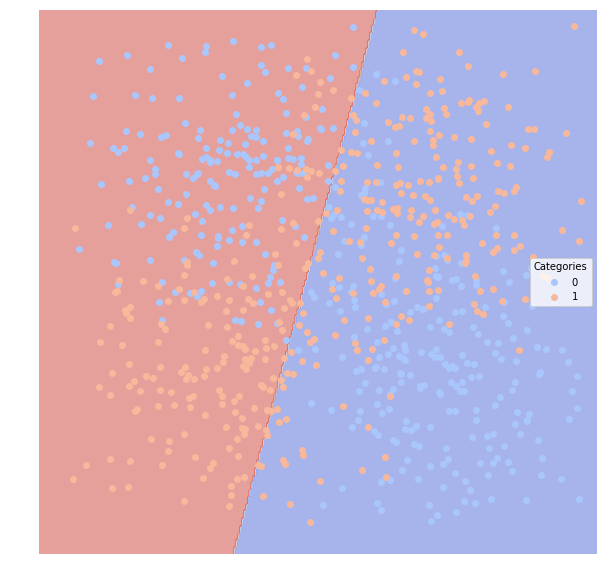

Decision Tree:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.775641           0.695710       0.225   0.752475  0.791667
1         0.775641           0.731158       0.225   0.797980  0.759615


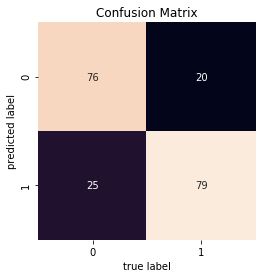

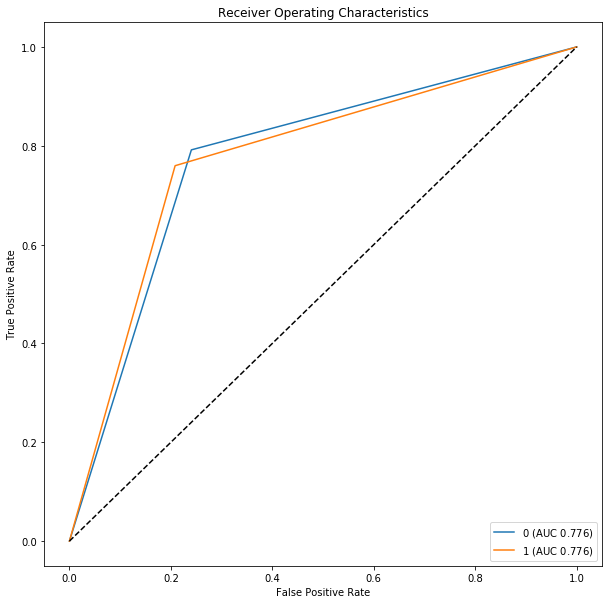

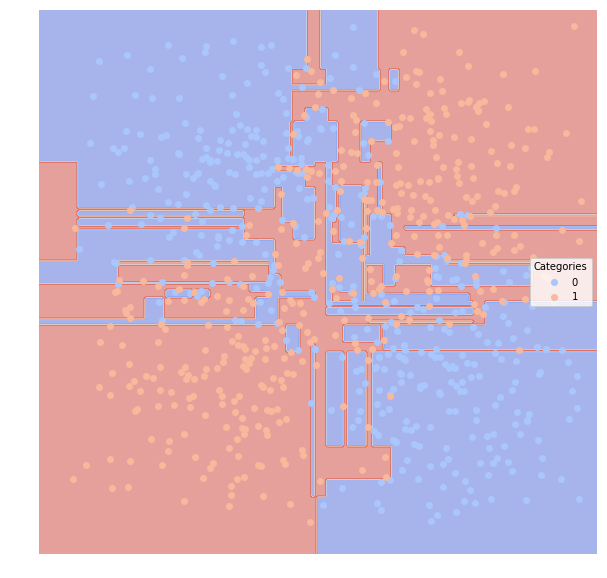

Random Forest:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.771234            0.68885        0.23   0.740385  0.802083
1         0.771234            0.72885        0.23   0.802083  0.740385


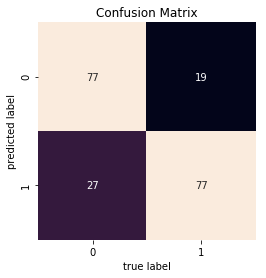

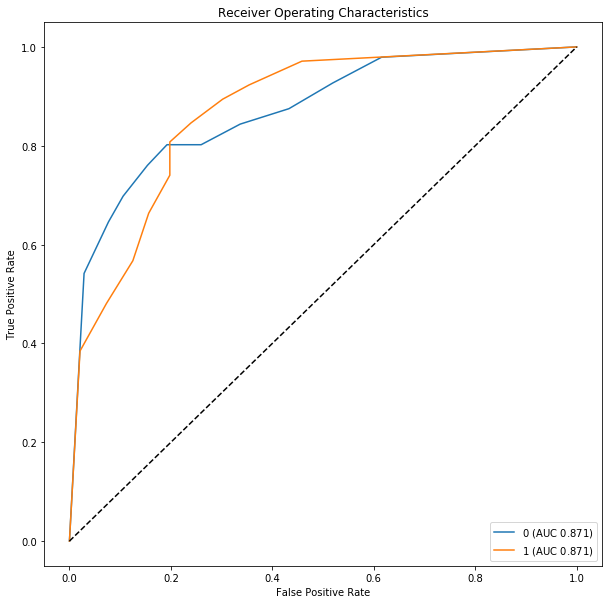

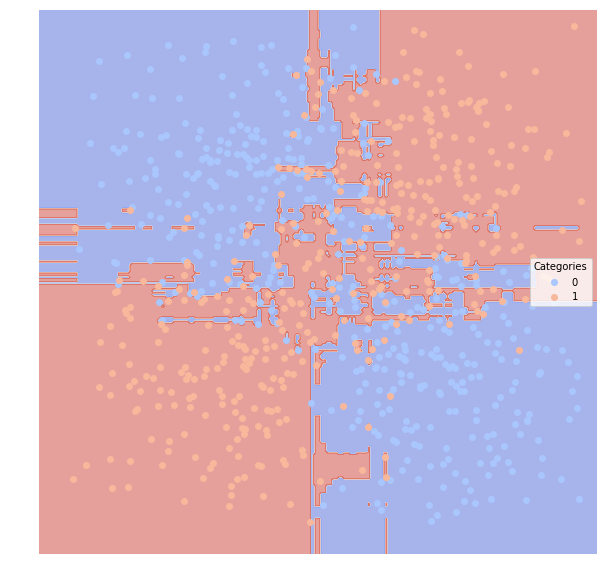

Neural Network (Multi-layer Perceptron):
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.790865           0.711324        0.21   0.764706  0.812500
1         0.790865           0.747943        0.21   0.816327  0.769231


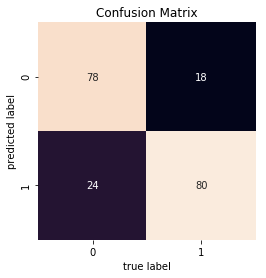

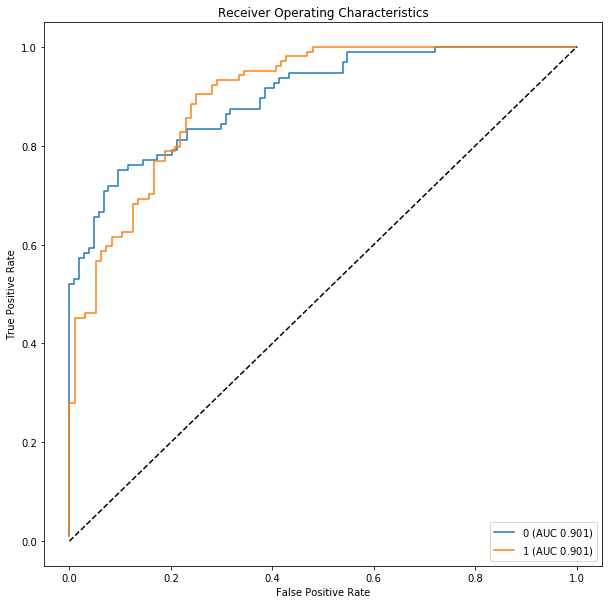

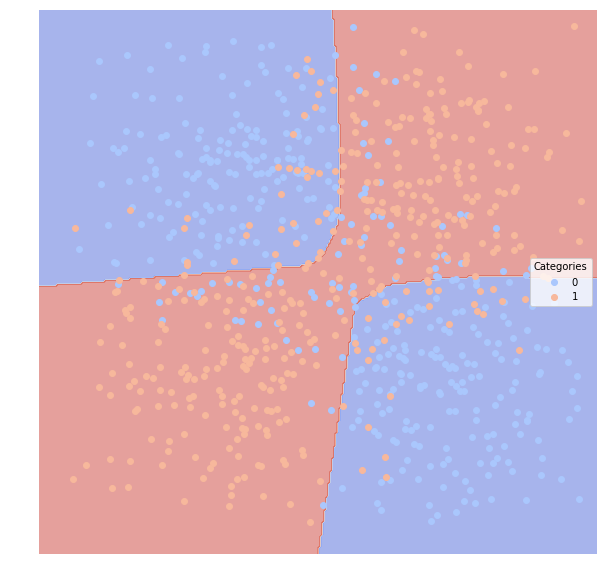

Gradient Boosting:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.795272           0.718843       0.205   0.777778  0.802083
1         0.795272           0.750137       0.205   0.811881  0.788462


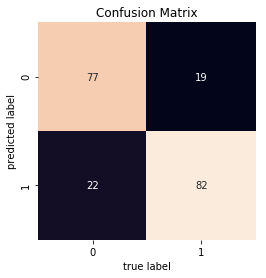

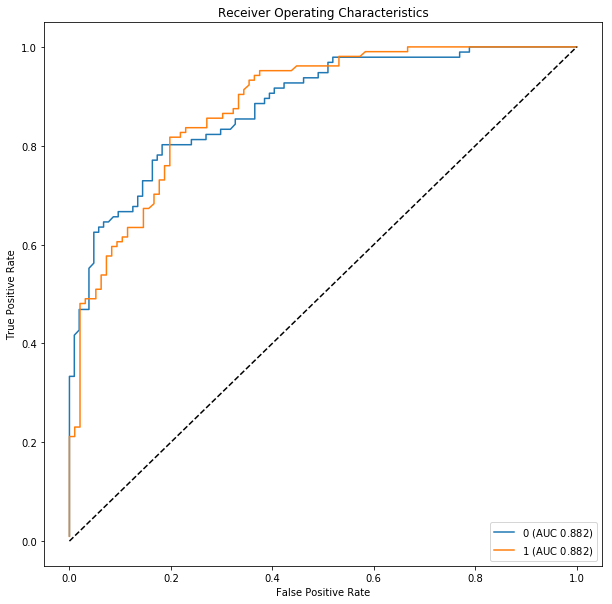

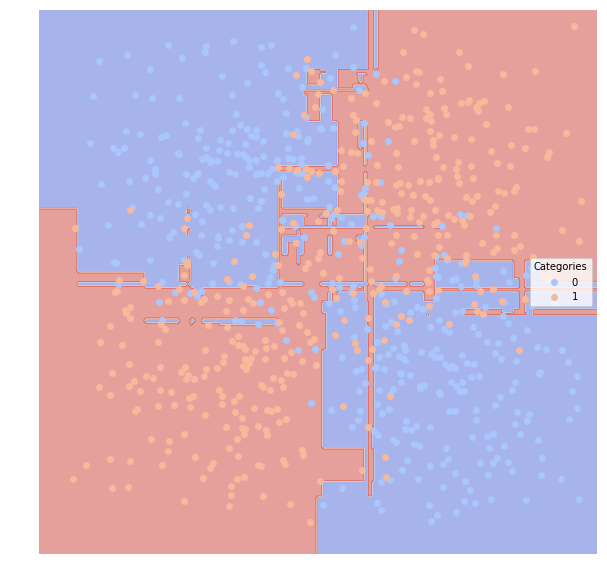

AdaBoost with 100 weak classifiers:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.530449           0.496144        0.47   0.509804  0.541667
1         0.530449           0.536107        0.47   0.551020  0.519231


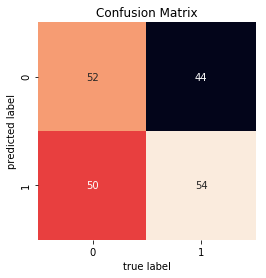

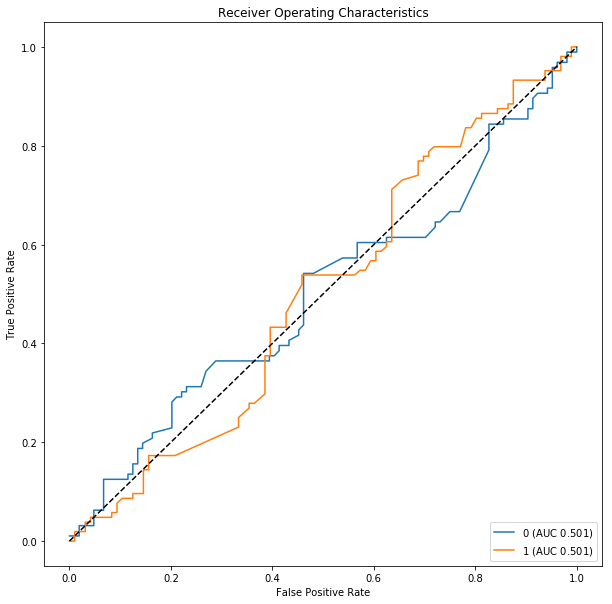

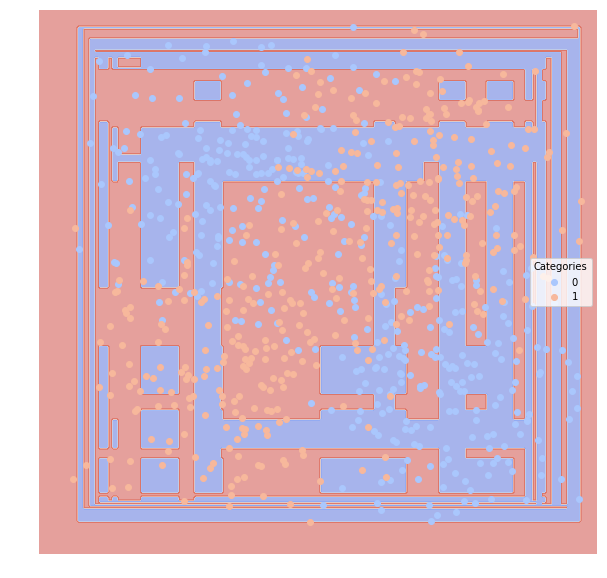

In [50]:
# artificial dataset 6
# two classes split, oppositely, along each dimension with more noise
noise = .4
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.xorSplit(noise))
lucem_illud.plotter(dfTrain)
classify_data(dfTrain, dfTest)

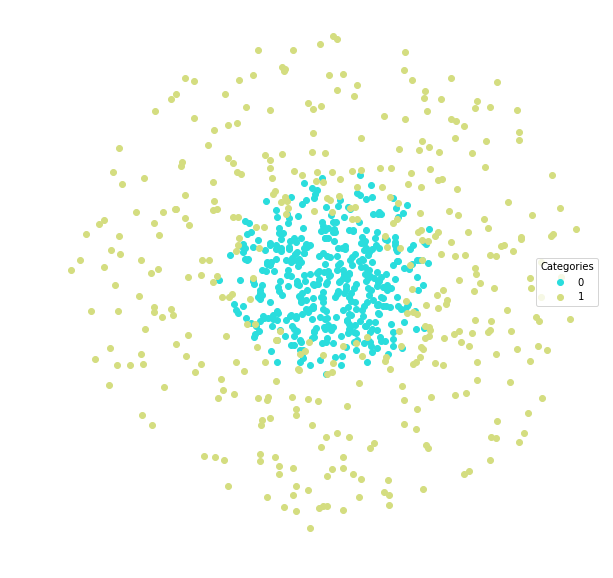

Gaussian Naive Bayes:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.890555           0.797202       0.115   0.824742  0.930233
1         0.890555           0.886312       0.115   0.941748  0.850877


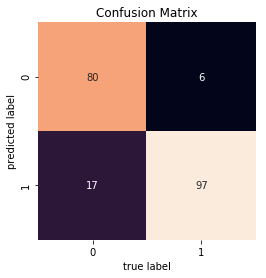

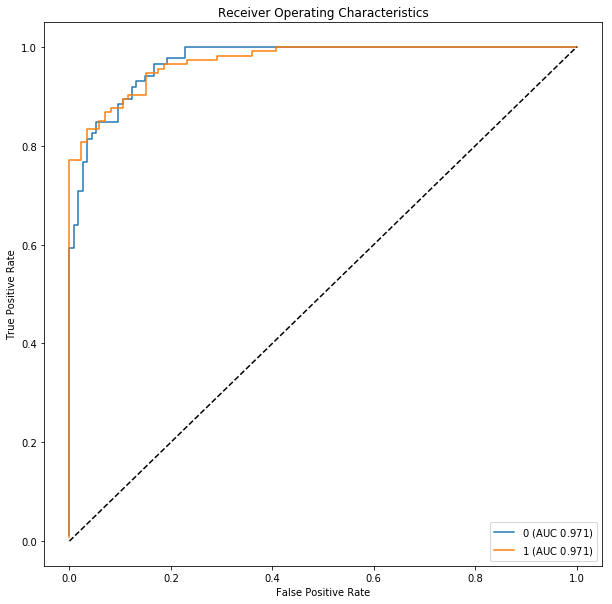

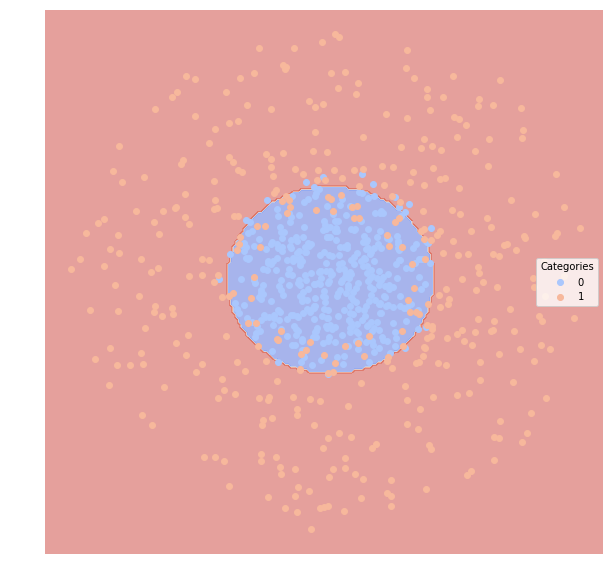

Support Vector Machine with linear kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.659425           0.526016       0.385   0.528302  0.976744
1         0.659425           0.700417       0.385   0.951220  0.342105


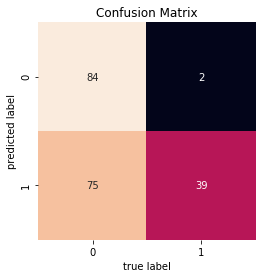

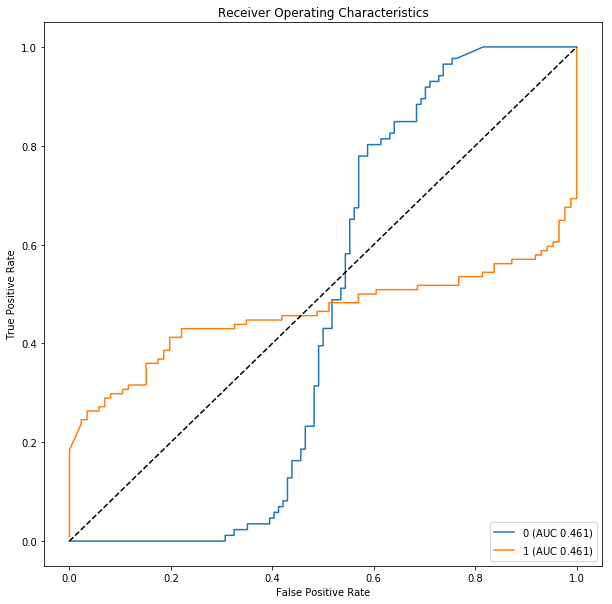

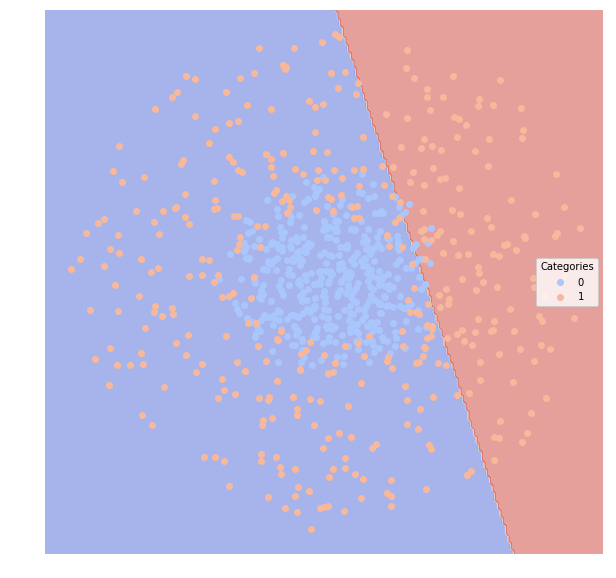

Support Vector Machine with 3 degree polynomial kernel:
          AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                       
0         0.5               0.43        0.57       0.43     1.0
1         0.5               0.57        0.57       0.00     0.0


/Users/yiqingzhu/anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


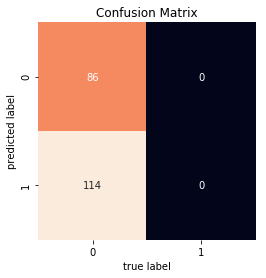

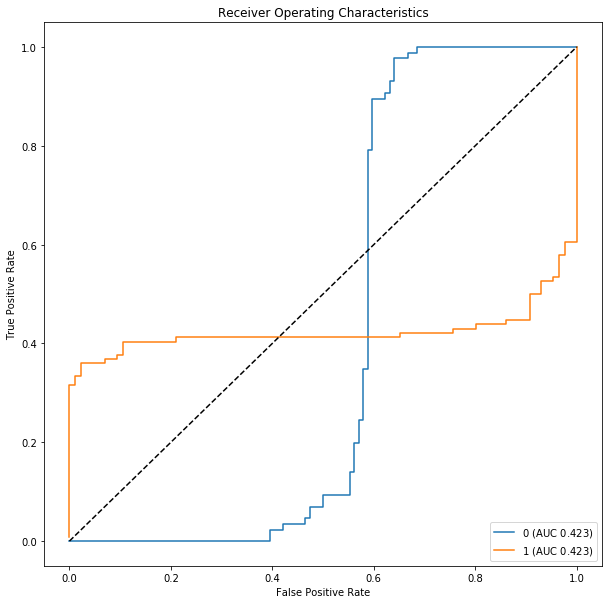

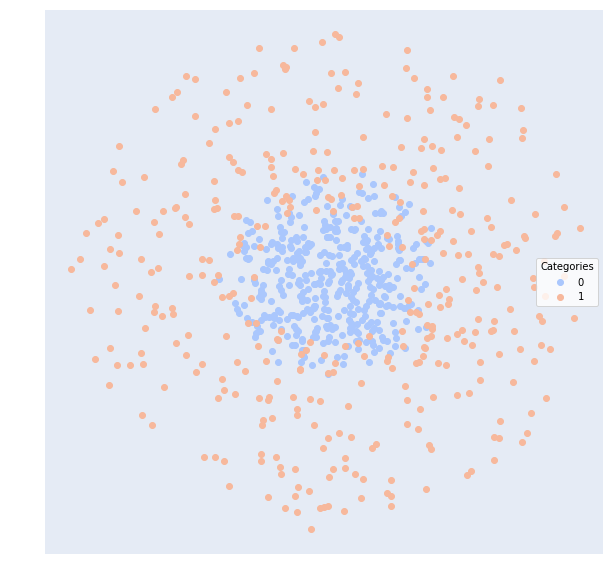

K-Nearest Neighbors with 5 neighbors:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.868727           0.770704       0.135   0.810526  0.895349
1         0.868727           0.859925       0.135   0.914286  0.842105


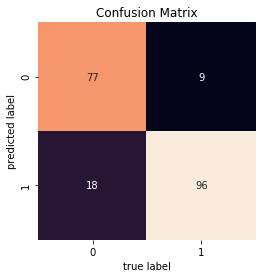

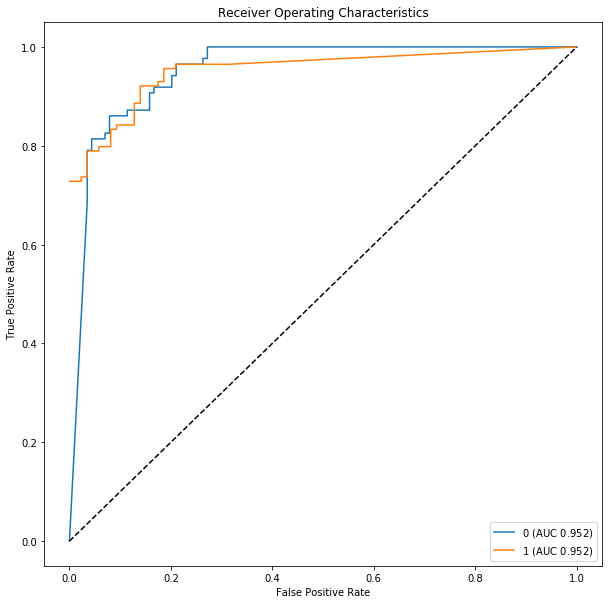

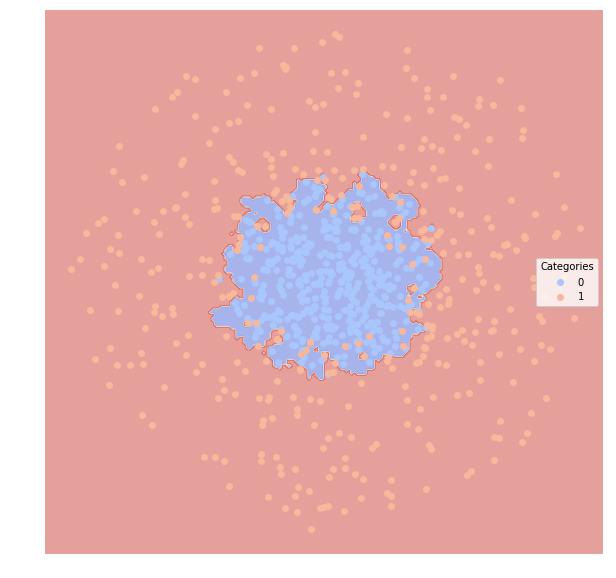

Logistic Regression:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.674113           0.537788       0.365   0.543046  0.953488
1         0.674113           0.707513       0.365   0.918367  0.394737


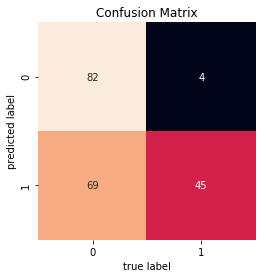

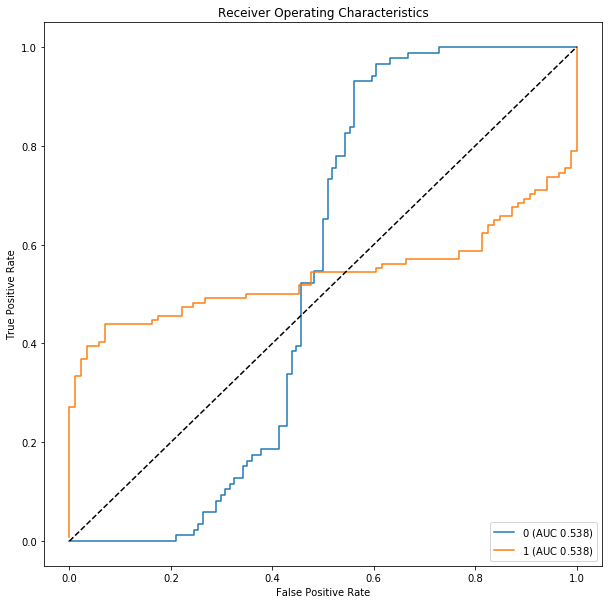

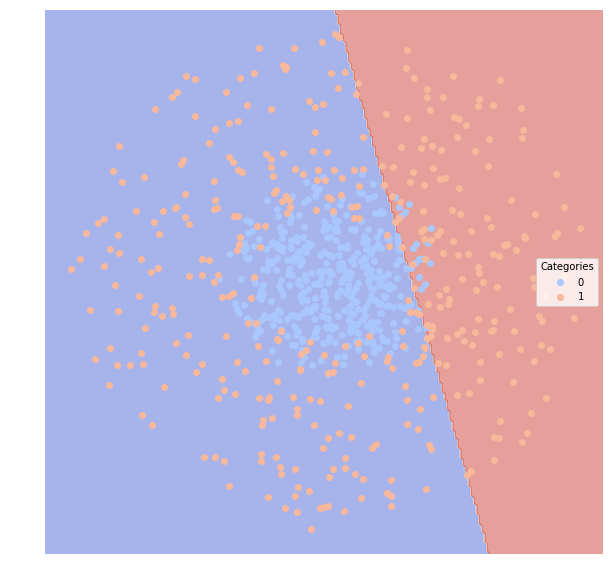

Decision Tree:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.847001           0.756585        0.15   0.825581  0.825581
1         0.847001           0.829155        0.15   0.868421  0.868421


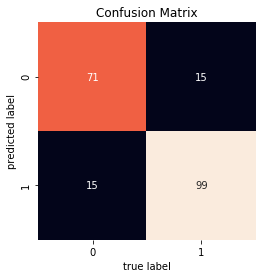

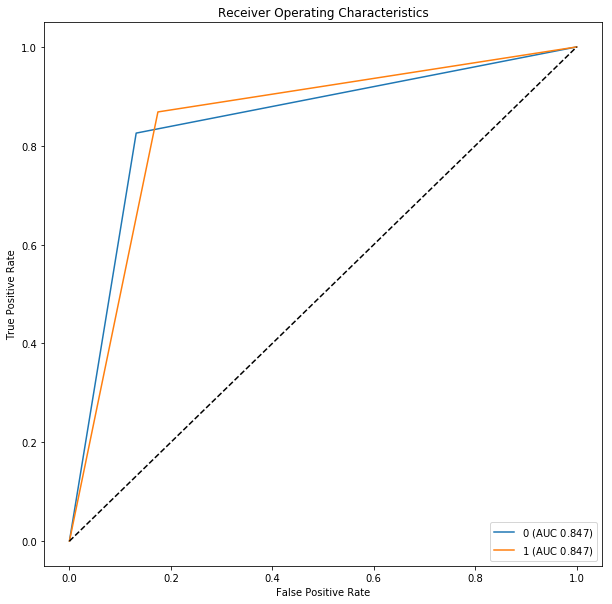

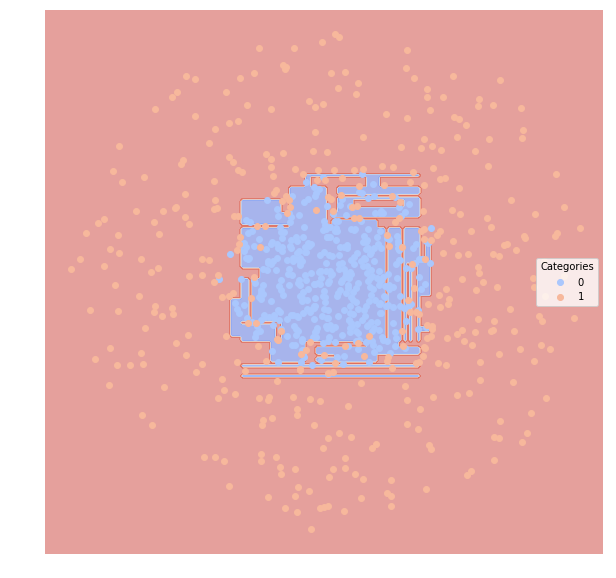

Random Forest:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.881885           0.794368        0.12   0.836957  0.895349
1         0.881885           0.871053        0.12   0.916667  0.868421


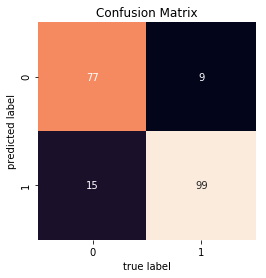

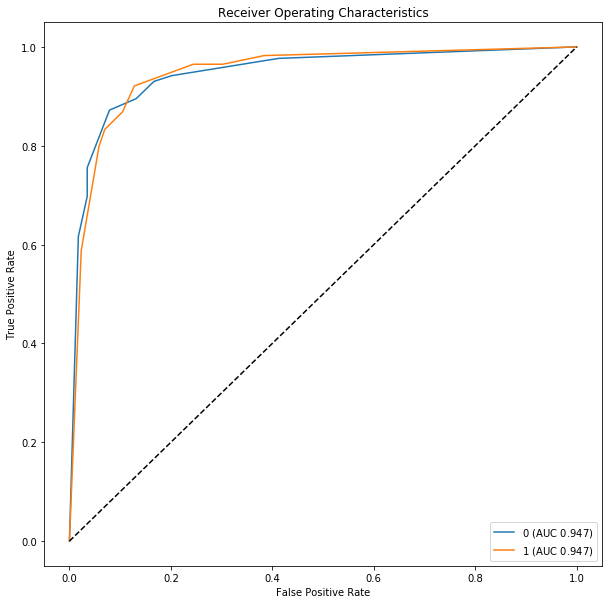

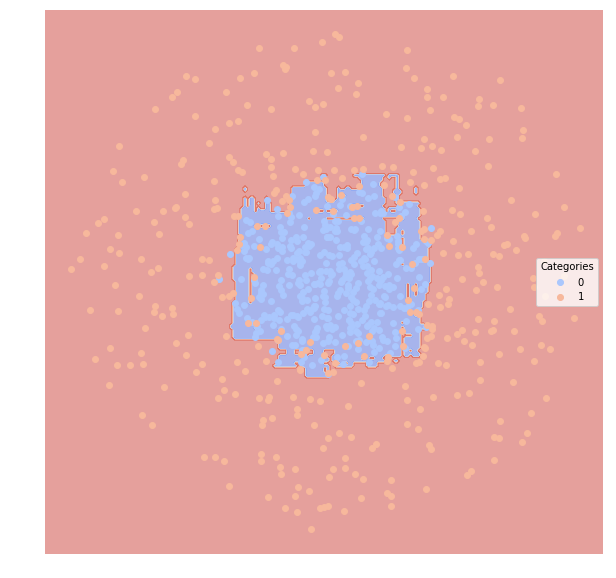

Neural Network (Multi-layer Perceptron):
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.896369           0.803477        0.11   0.826531  0.941860
1         0.896369           0.894168        0.11   0.950980  0.850877


/Users/yiqingzhu/anaconda/lib/python3.5/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


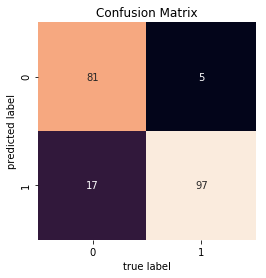

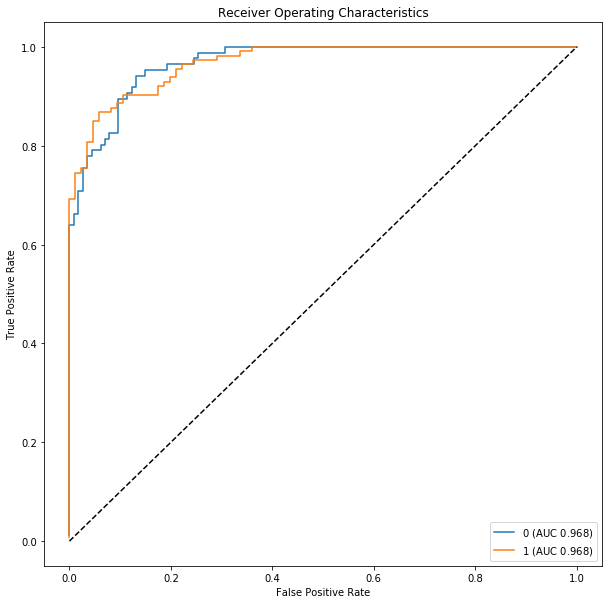

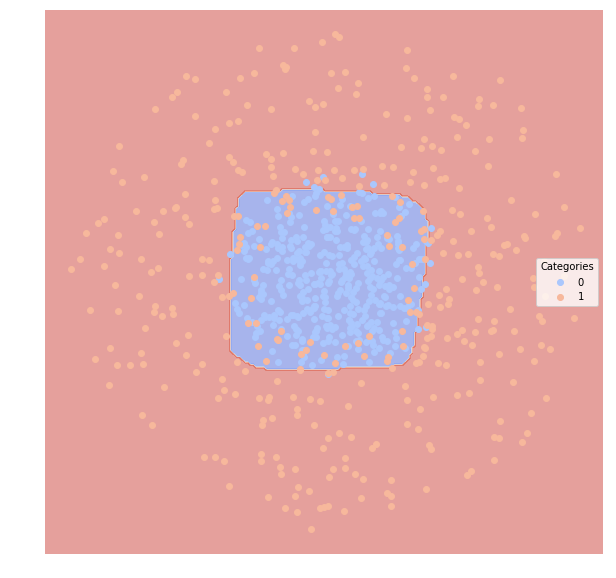

Gradient Boosting:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.870257           0.781744        0.13   0.833333  0.872093
1         0.870257           0.856579        0.13   0.900000  0.868421


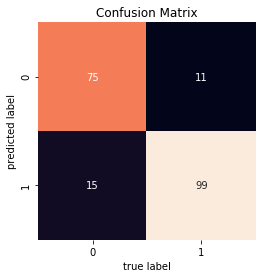

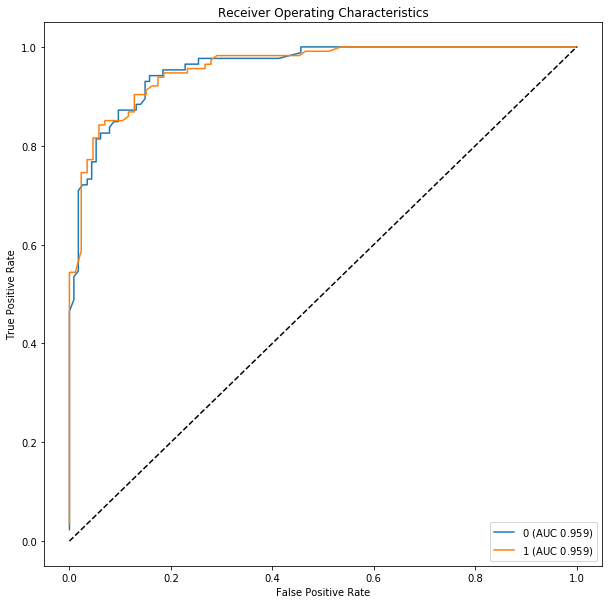

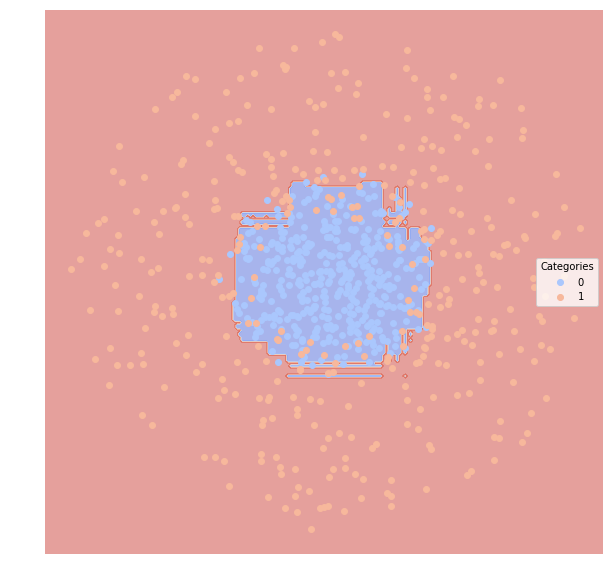

AdaBoost with 100 weak classifiers:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.887801           0.815546        0.11   0.872093  0.872093
1         0.887801           0.871328        0.11   0.903509  0.903509


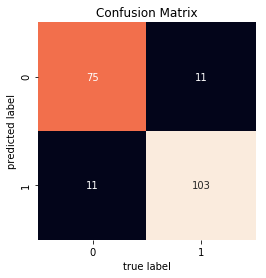

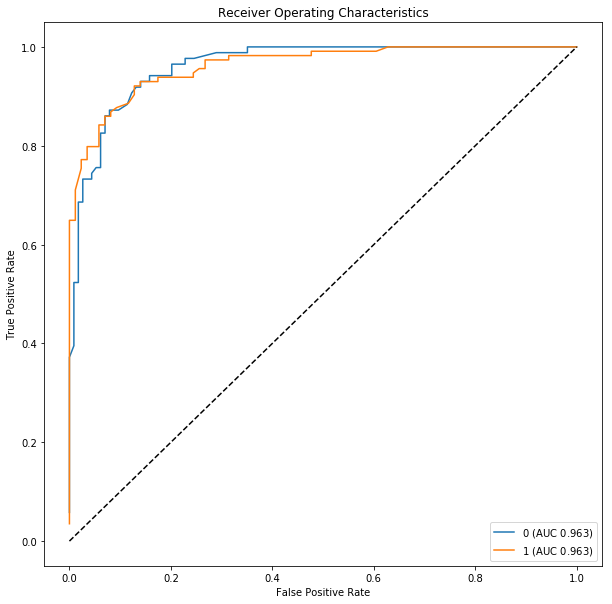

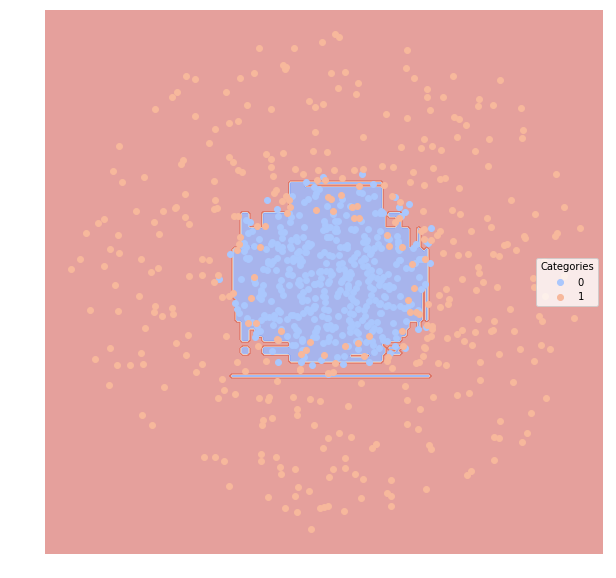

In [51]:
# artificial dataset 7
# one class nested within the other in two dimensions
noise = .2
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise))
lucem_illud.plotter(dfTrain)
classify_data(dfTrain, dfTest)

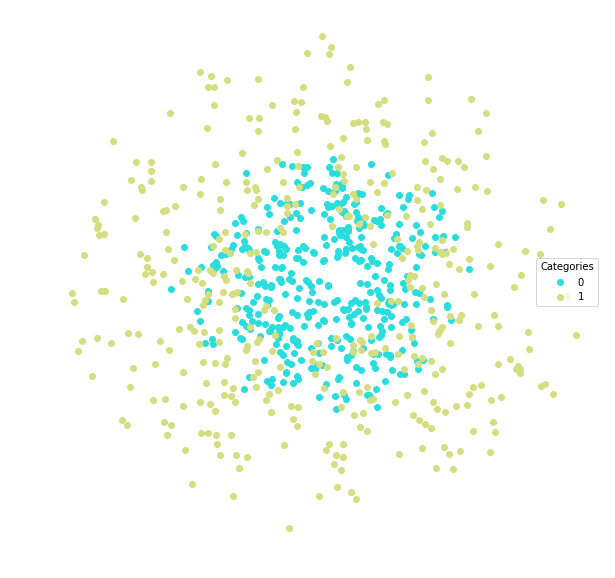

Gaussian Naive Bayes:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.779778           0.718670        0.22   0.771429  0.801980
1         0.779778           0.718086        0.22   0.789474  0.757576


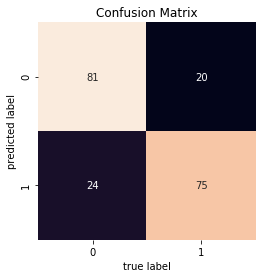

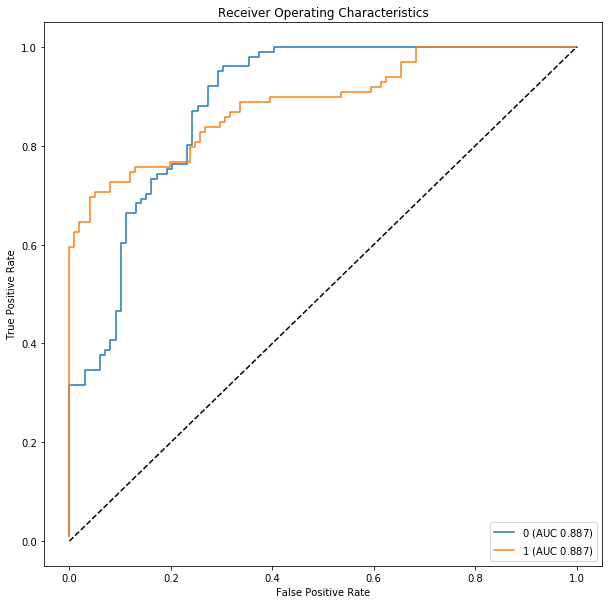

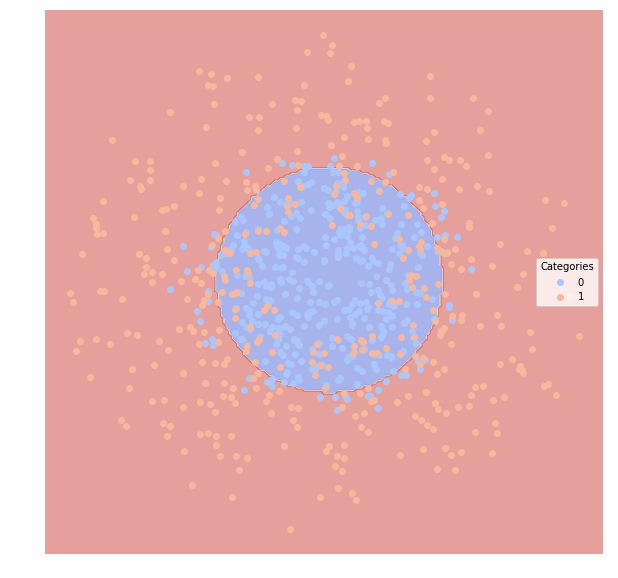

Support Vector Machine with linear kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.538054           0.525056        0.46   0.532374  0.732673
1         0.538054           0.516422        0.46   0.557377  0.343434


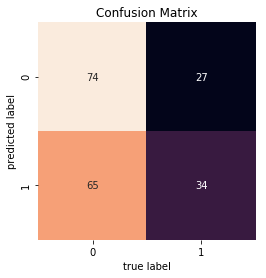

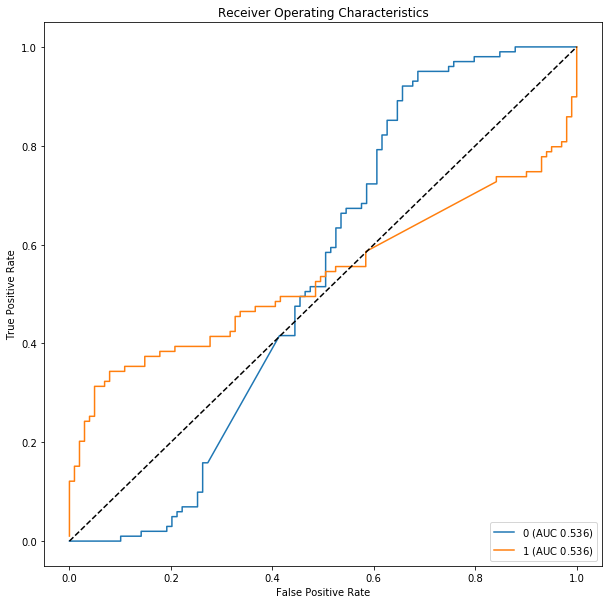

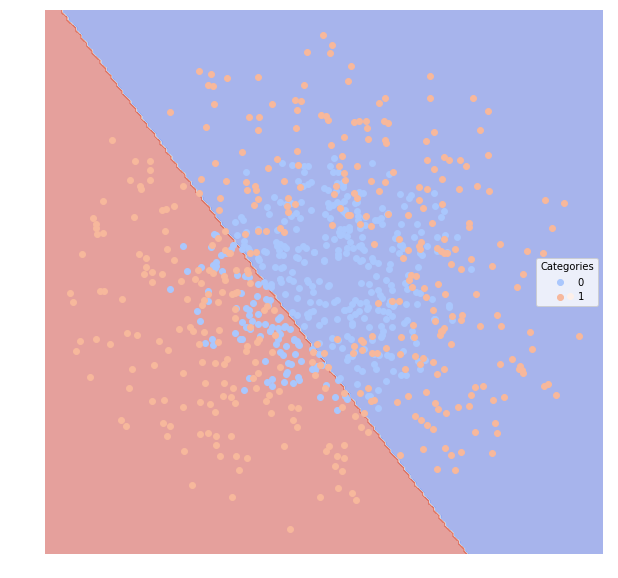

Support Vector Machine with 3 degree polynomial kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.444444           0.505000        0.56   0.000000  0.000000
1         0.444444           0.468874        0.56   0.465608  0.888889


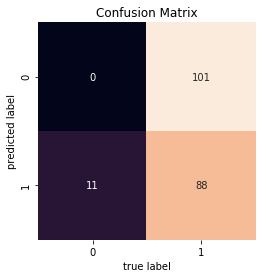

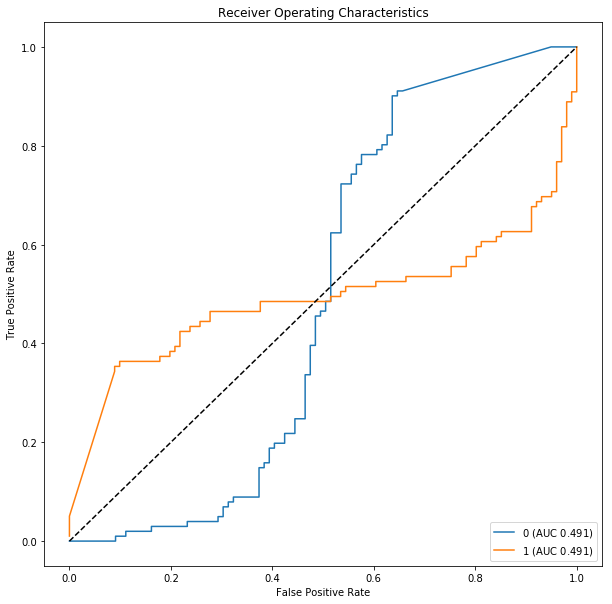

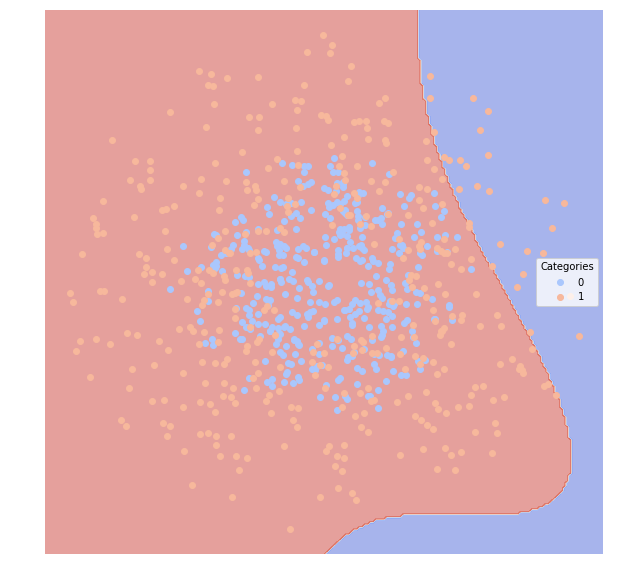

K-Nearest Neighbors with 5 neighbors:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.779778           0.718670        0.22   0.771429  0.801980
1         0.779778           0.718086        0.22   0.789474  0.757576


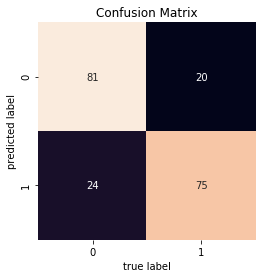

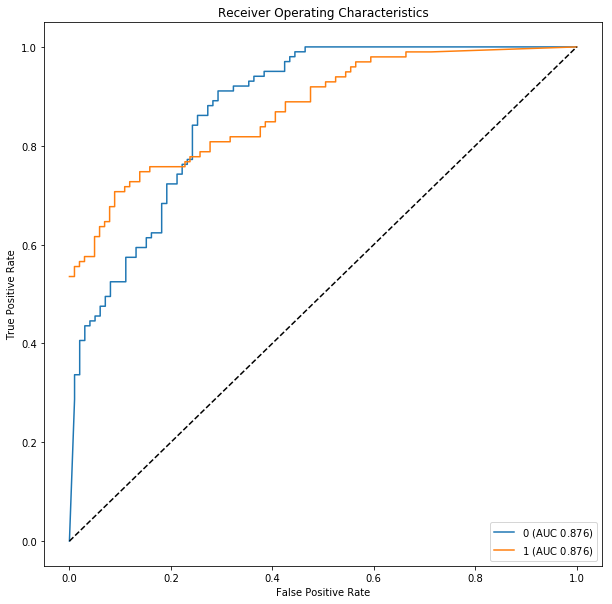

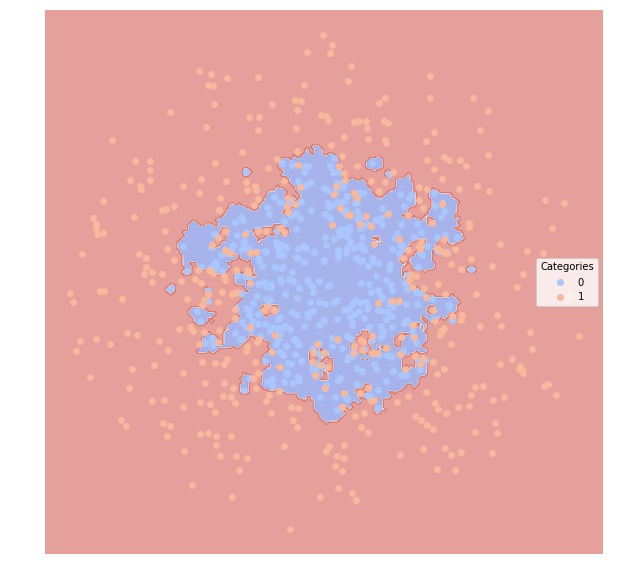

Logistic Regression:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.494699           0.502376       0.505   0.500000  0.524752
1         0.494699           0.492380       0.505   0.489362  0.464646


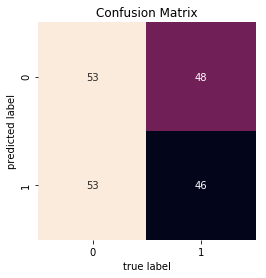

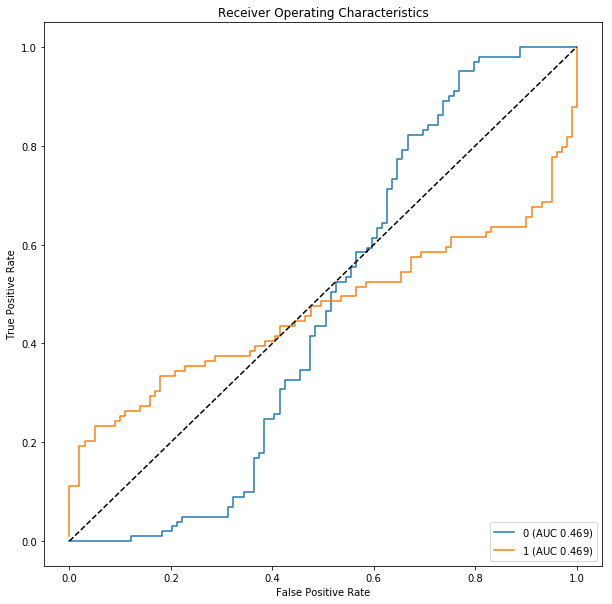

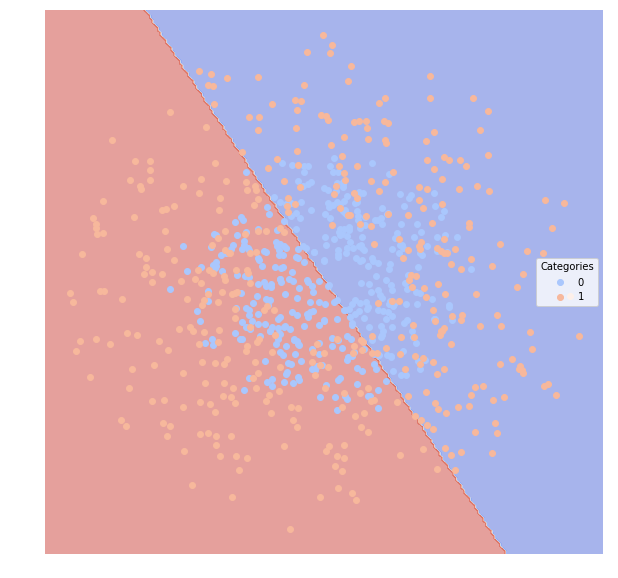

Decision Tree:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.735124           0.678392       0.265   0.744898  0.722772
1         0.735124           0.667286       0.265   0.725490  0.747475


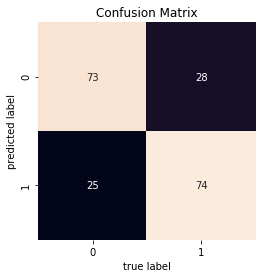

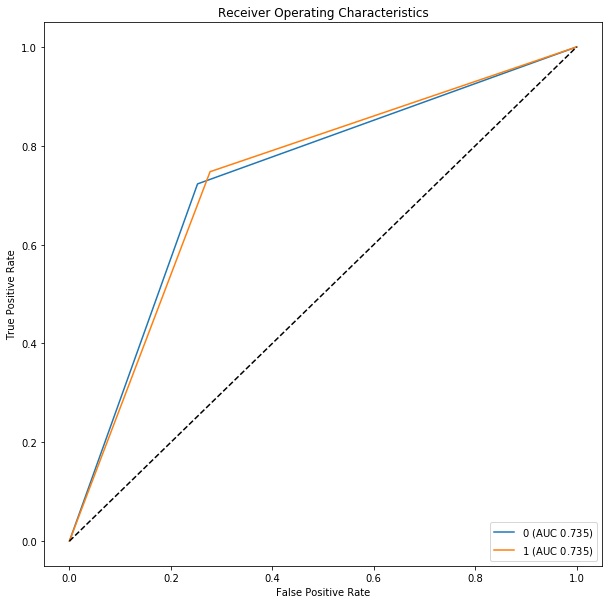

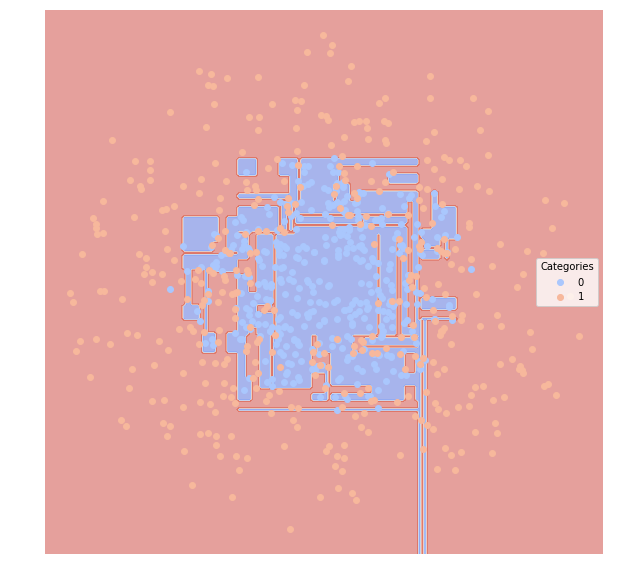

Random Forest:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.779878           0.720207        0.22   0.776699  0.792079
1         0.779878           0.716479        0.22   0.783505  0.767677


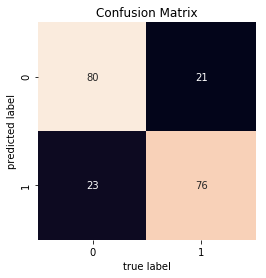

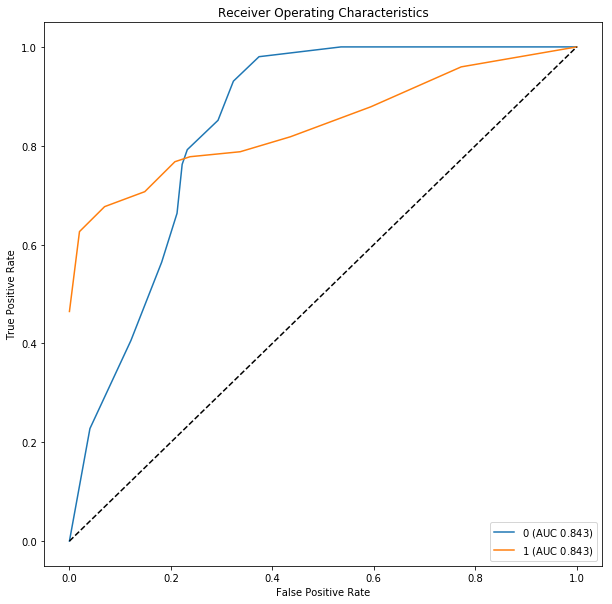

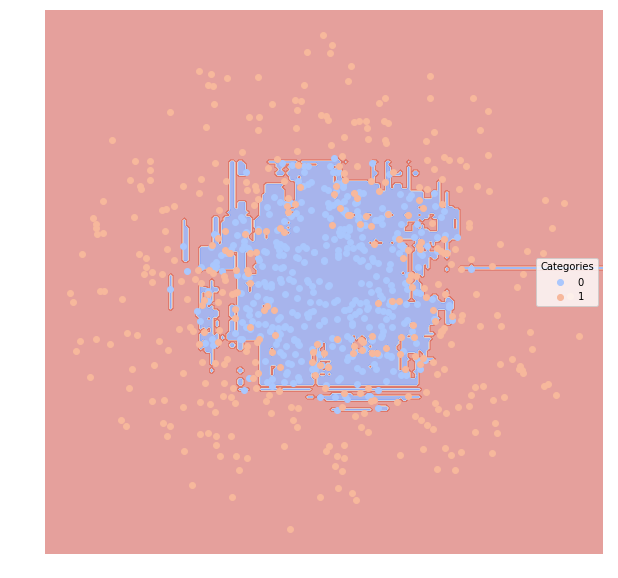

Neural Network (Multi-layer Perceptron):
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.774927           0.715805       0.225    0.77451  0.782178
1         0.774927           0.710341       0.225    0.77551  0.767677


/Users/yiqingzhu/anaconda/lib/python3.5/site-packages/sklearn/neural_network/multilayer_perceptron.py:564: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


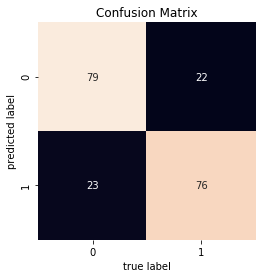

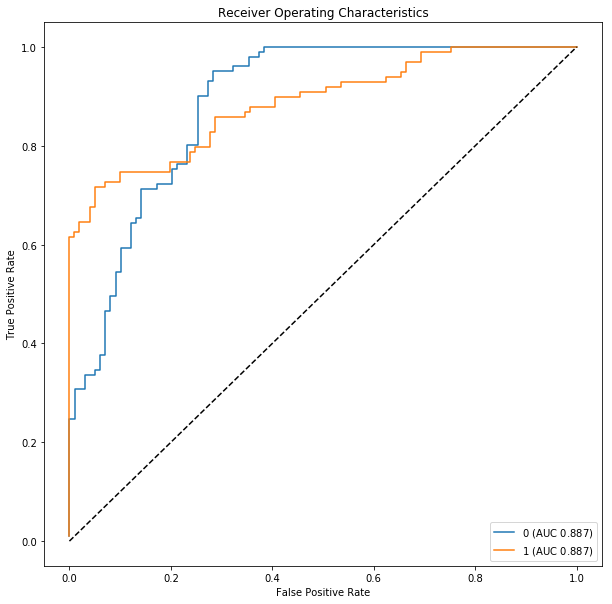

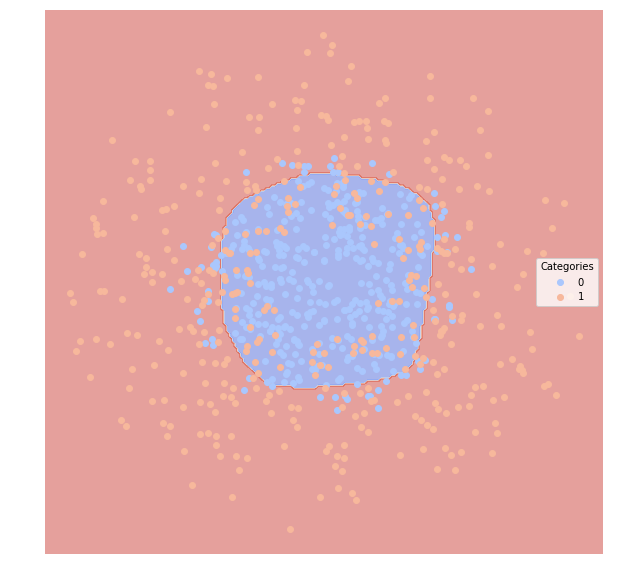

Gradient Boosting:
              AUC  Average_Precision  Error_Rate  Precision   Recall
Category                                                            
0         0.79998           0.743172         0.2    0.80198  0.80198
1         0.79998           0.736772         0.2    0.79798  0.79798


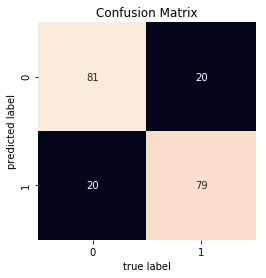

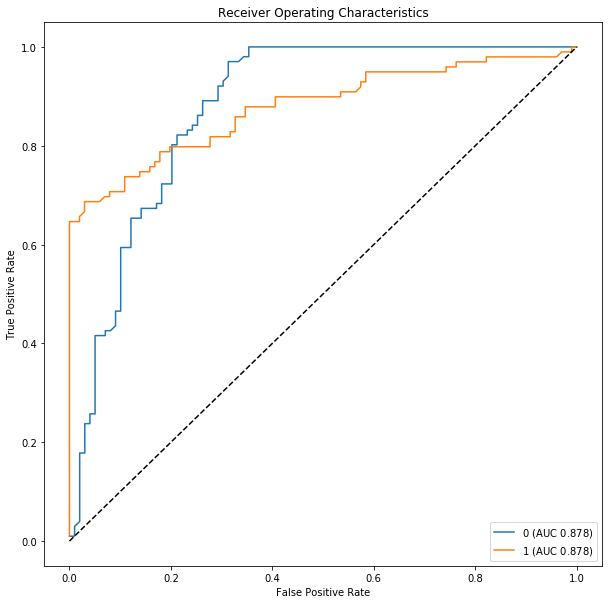

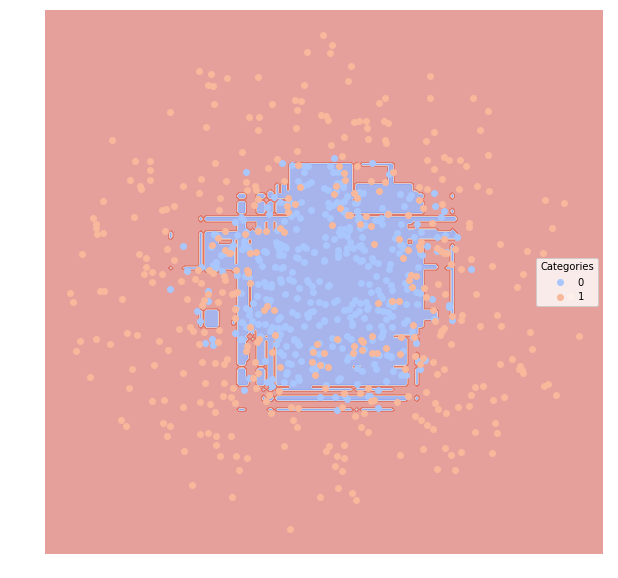

AdaBoost with 100 weak classifiers:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
0         0.80483           0.745845       0.195   0.798077  0.821782
1         0.80483           0.745152       0.195   0.812500  0.787879


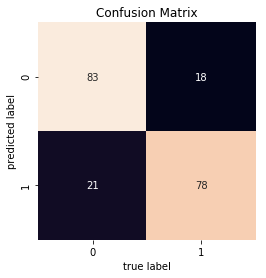

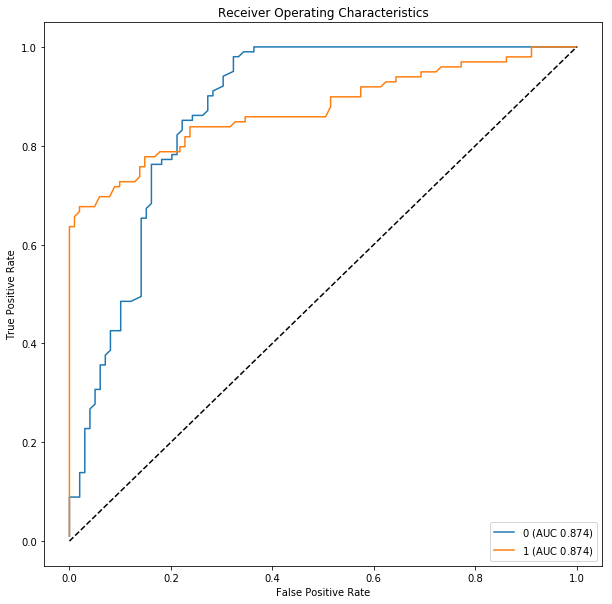

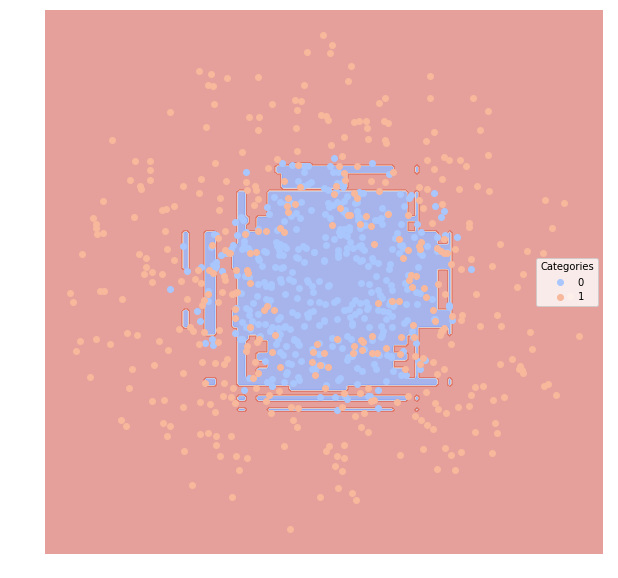

In [52]:
# artificial dataset 8
# one class nested within the other in two dimensions with more noise
noise = .4
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.targetSplit(noise))
lucem_illud.plotter(dfTrain)
classify_data(dfTrain, dfTest)

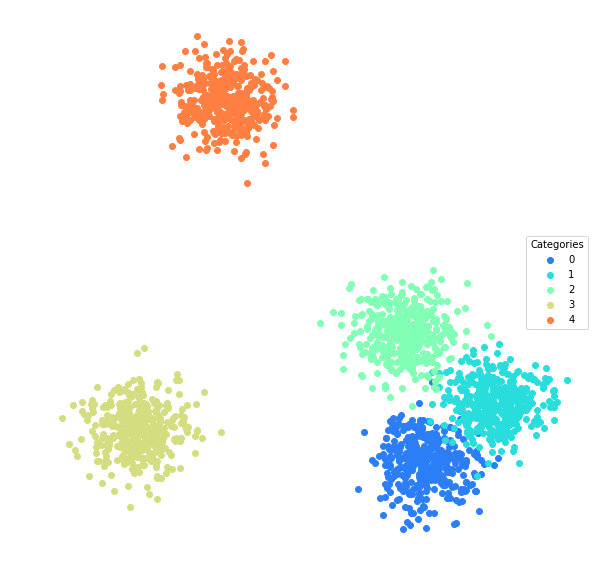

Gaussian Naive Bayes:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.991367           0.963997       0.008   0.971429  0.990291
1         0.968260           0.921275       0.016   0.965517  0.943820
2         0.987108           0.962767       0.008   0.979167  0.979167
3         1.000000           1.000000       0.000   1.000000  1.000000
4         1.000000           1.000000       0.000   1.000000  1.000000


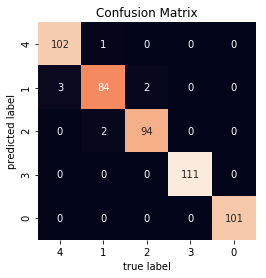

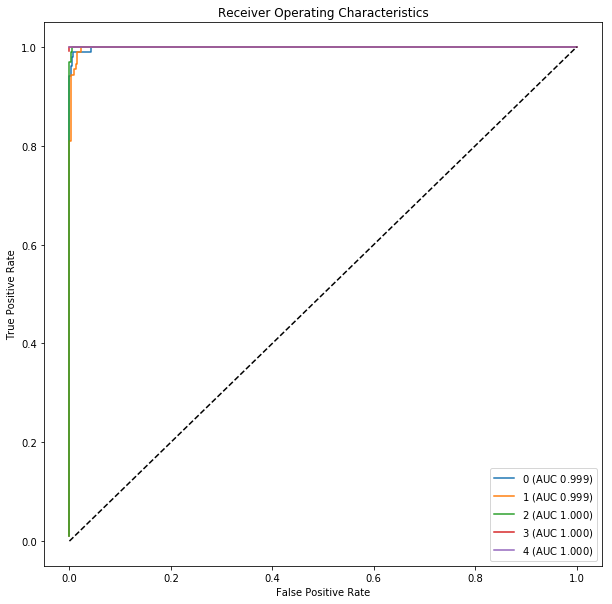

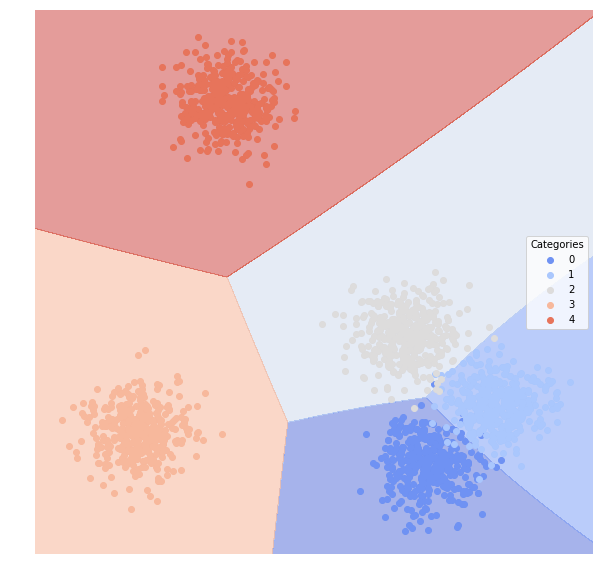

Support Vector Machine with linear kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.991367           0.963997       0.008   0.971429  0.990291
1         0.968260           0.921275       0.016   0.965517  0.943820
2         0.987108           0.962767       0.008   0.979167  0.979167
3         1.000000           1.000000       0.000   1.000000  1.000000
4         1.000000           1.000000       0.000   1.000000  1.000000


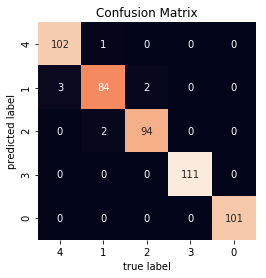

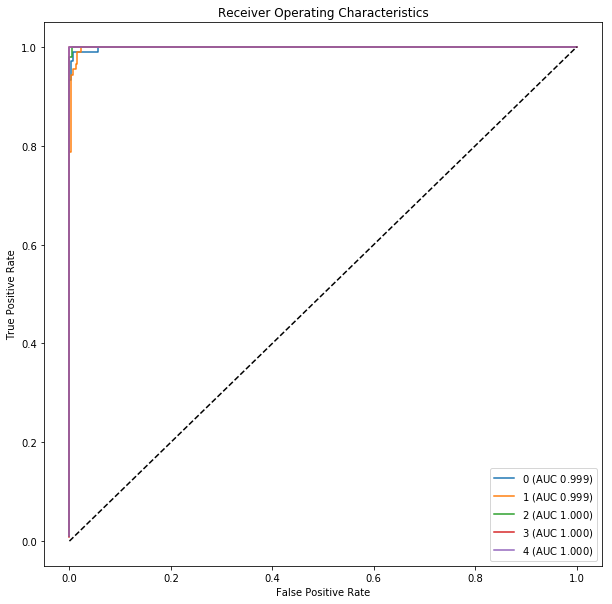

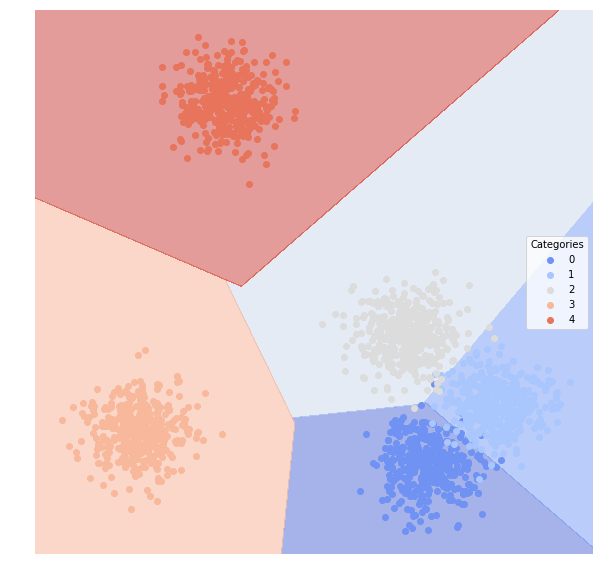

Support Vector Machine with 3 degree polynomial kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.986513           0.956296       0.010   0.971154  0.980583
1         0.972662           0.920132       0.016   0.955056  0.955056
2         0.988346           0.972860       0.006   0.989474  0.979167
3         1.000000           1.000000       0.000   1.000000  1.000000
4         1.000000           1.000000       0.000   1.000000  1.000000


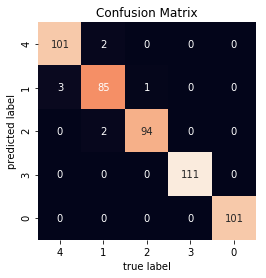

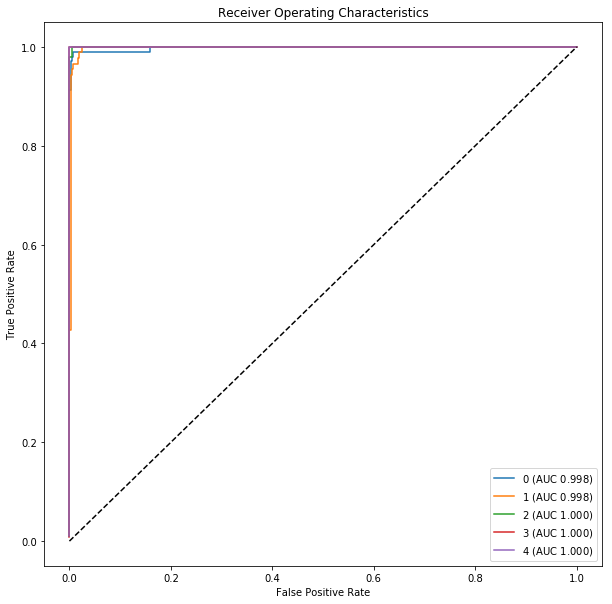

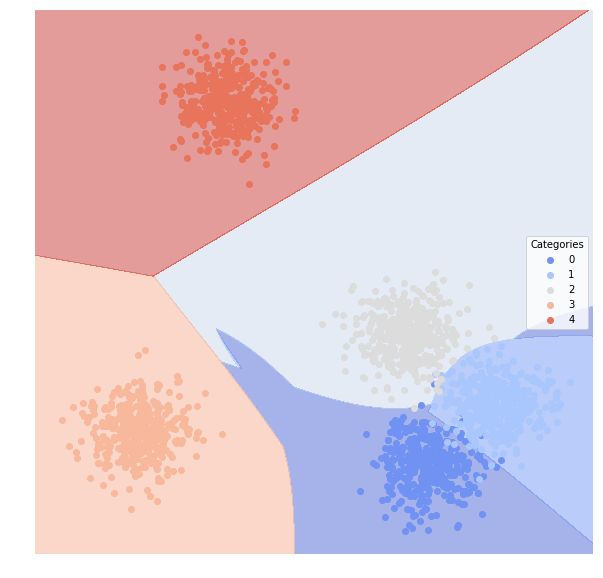

K-Nearest Neighbors with 5 neighbors:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.992627           0.973247       0.006   0.980769  0.990291
1         0.976312           0.951951       0.010   0.988372  0.955056
2         0.997525           0.979592       0.004   0.979592  1.000000
3         1.000000           1.000000       0.000   1.000000  1.000000
4         1.000000           1.000000       0.000   1.000000  1.000000


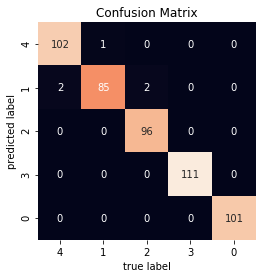

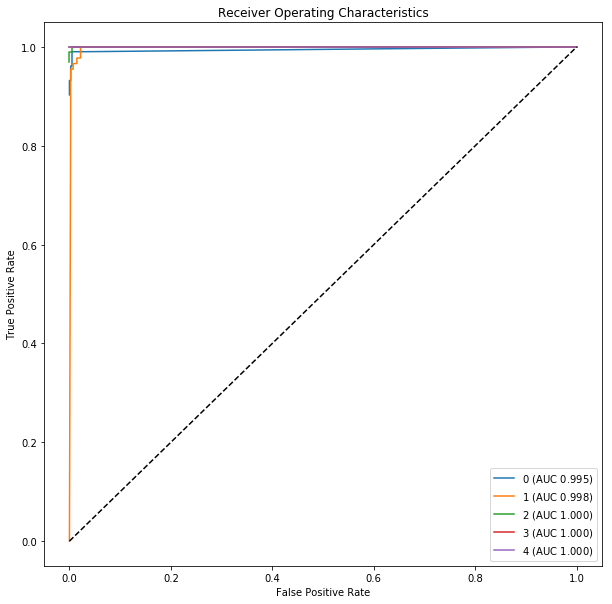

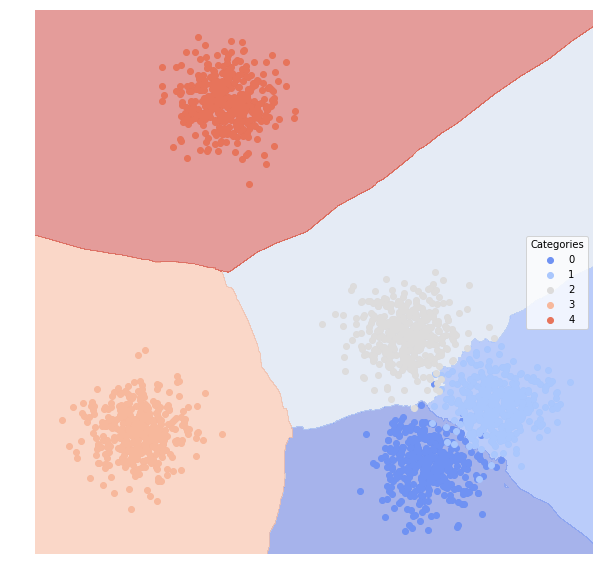

Logistic Regression:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.976804           0.940895       0.014   0.970588  0.961165
1         0.963394           0.881219       0.024   0.923077  0.943820
2         0.962562           0.900158       0.022   0.947368  0.937500
3         1.000000           1.000000       0.000   1.000000  1.000000
4         1.000000           1.000000       0.000   1.000000  1.000000


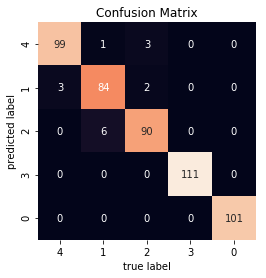

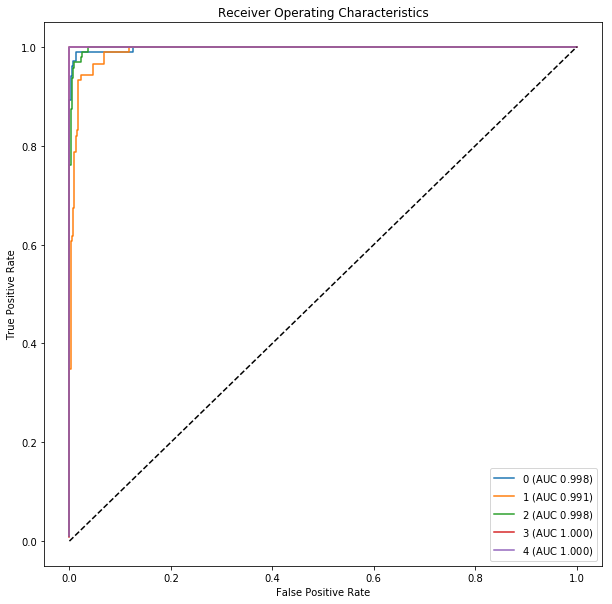

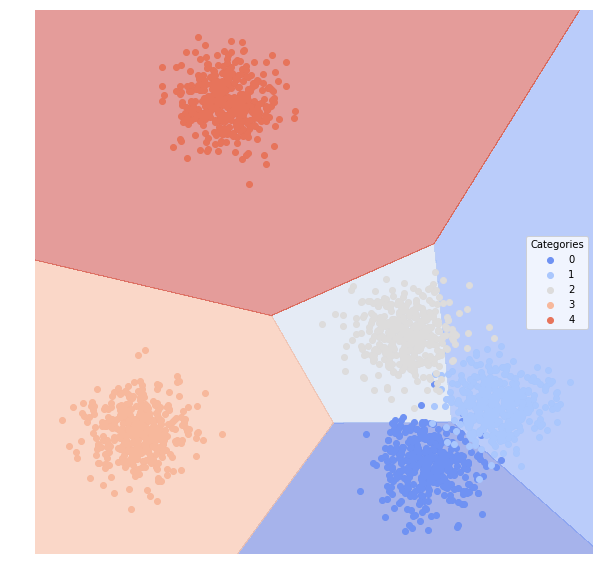

Decision Tree:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.980399           0.939532       0.014   0.961538  0.970874
1         0.961426           0.901707       0.020   0.954023  0.932584
2         0.992316           0.971180       0.006   0.979381  0.989583
3         1.000000           1.000000       0.000   1.000000  1.000000
4         1.000000           1.000000       0.000   1.000000  1.000000


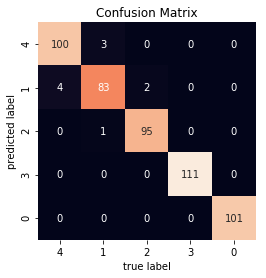

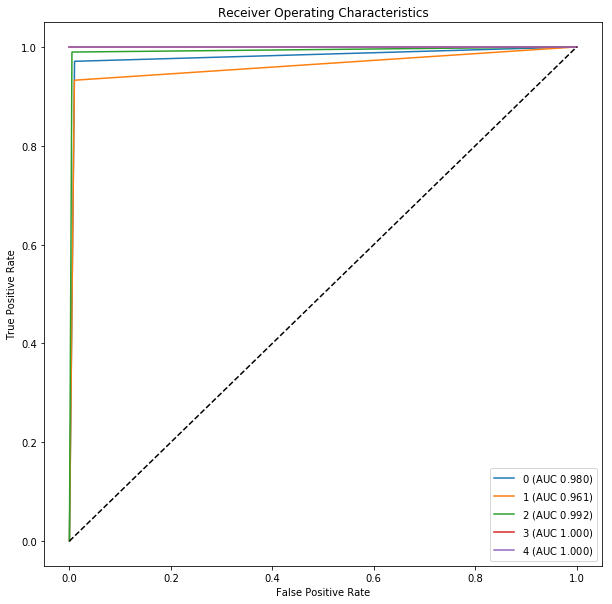

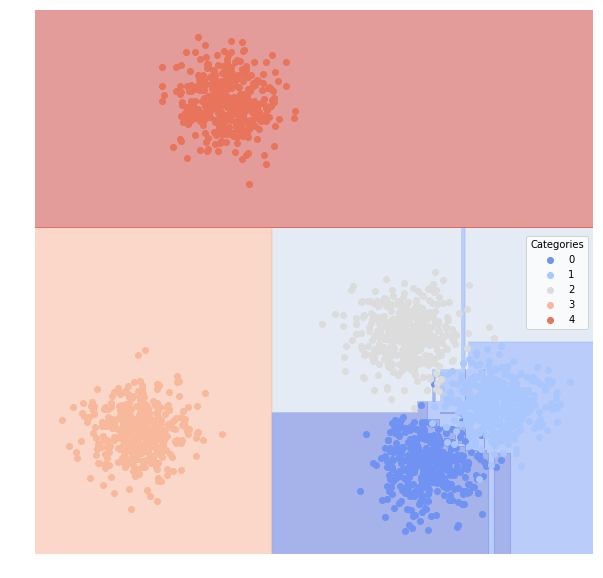

Random Forest:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.982918           0.957837       0.010   0.980392  0.970874
1         0.972662           0.920132       0.016   0.955056  0.955056
2         0.992316           0.971180       0.006   0.979381  0.989583
3         1.000000           1.000000       0.000   1.000000  1.000000
4         1.000000           1.000000       0.000   1.000000  1.000000


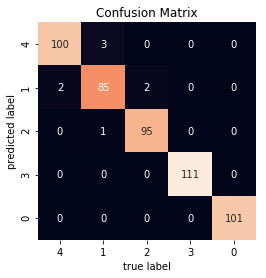

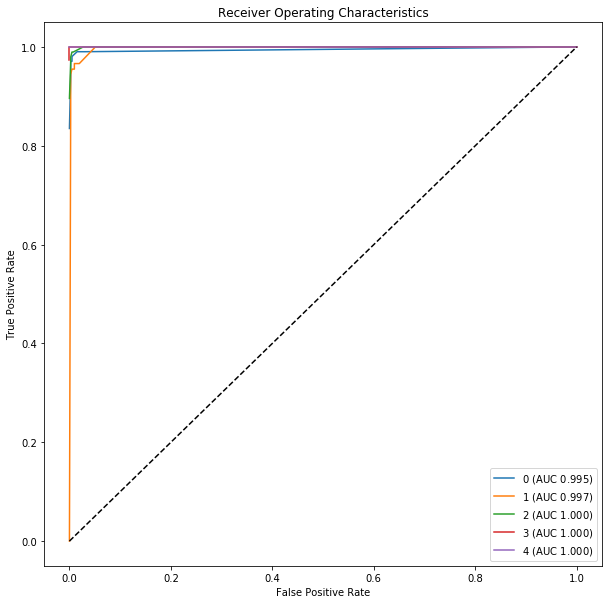

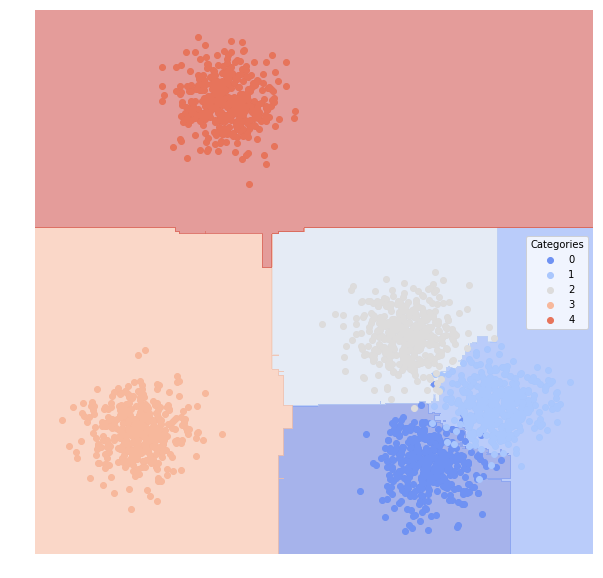

Neural Network (Multi-layer Perceptron):
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.991367           0.963997       0.008   0.971429  0.990291
1         0.973878           0.930497       0.014   0.965909  0.955056
2         0.988346           0.972860       0.006   0.989474  0.979167
3         1.000000           1.000000       0.000   1.000000  1.000000
4         1.000000           1.000000       0.000   1.000000  1.000000


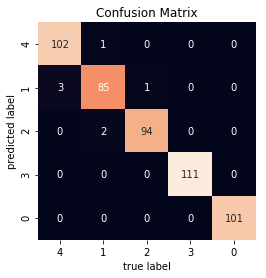

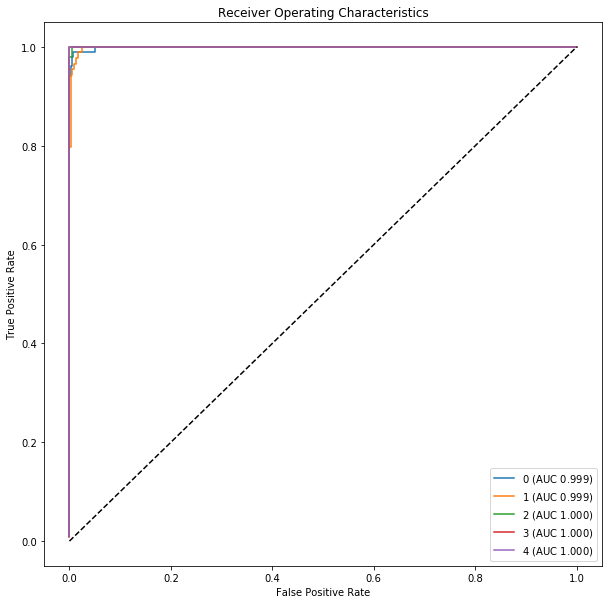

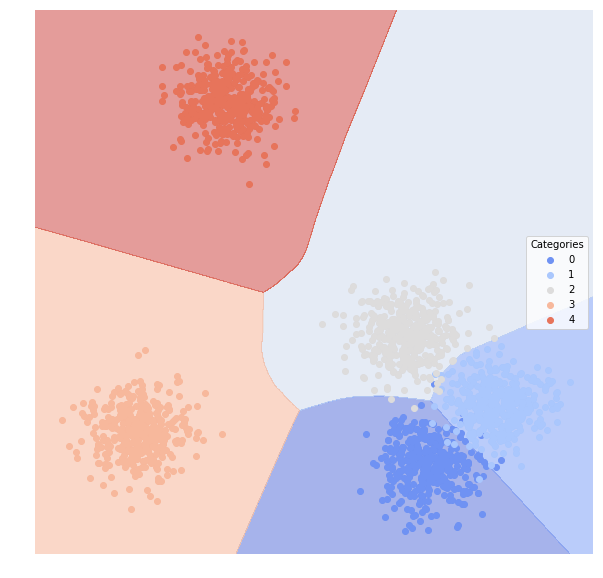

Gradient Boosting:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.987772           0.965542       0.008   0.980583  0.980583
1         0.973878           0.930497       0.014   0.965909  0.955056
2         0.992316           0.971180       0.006   0.979381  0.989583
3         1.000000           1.000000       0.000   1.000000  1.000000
4         1.000000           1.000000       0.000   1.000000  1.000000


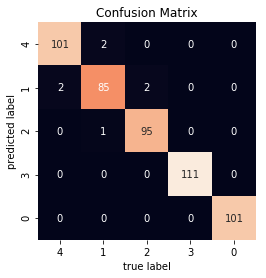

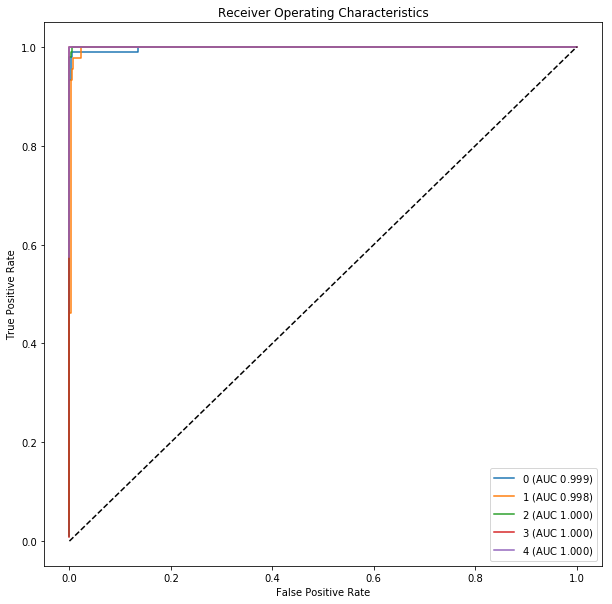

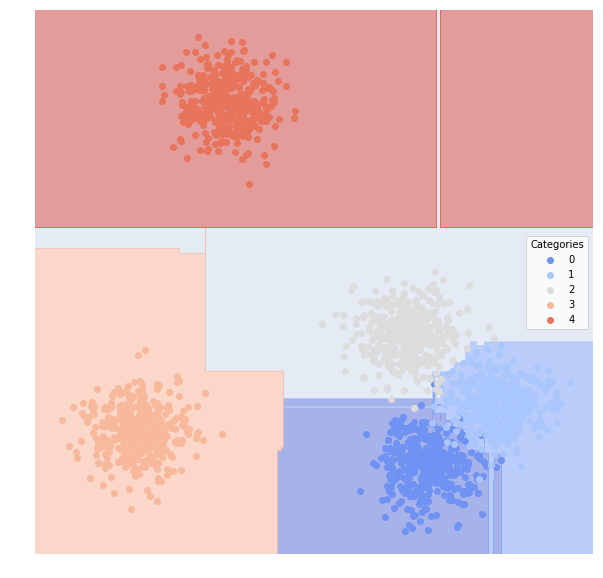

AdaBoost with 100 weak classifiers:


/Users/yiqingzhu/anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


               AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                            
0         0.500000           0.206000       0.206   0.000000     0.0
1         0.757908           0.309028       0.398   0.309028     1.0
2         0.500000           0.192000       0.192   0.000000     0.0
3         1.000000           1.000000       0.000   1.000000     1.0
4         1.000000           1.000000       0.000   1.000000     1.0


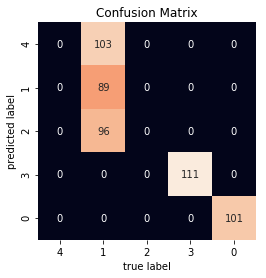

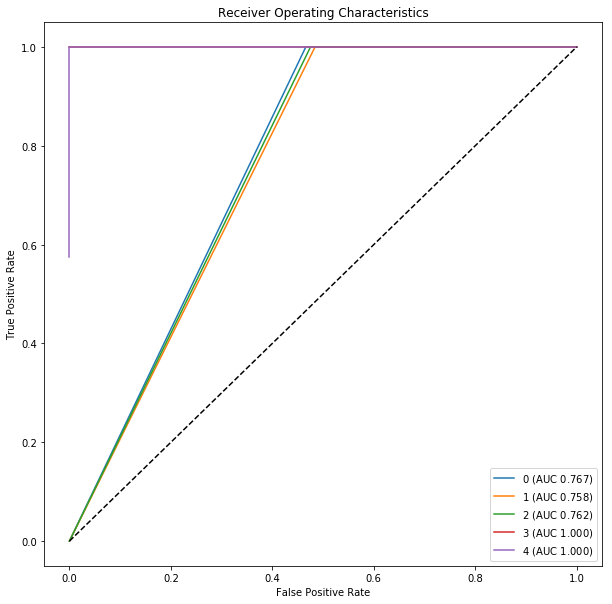

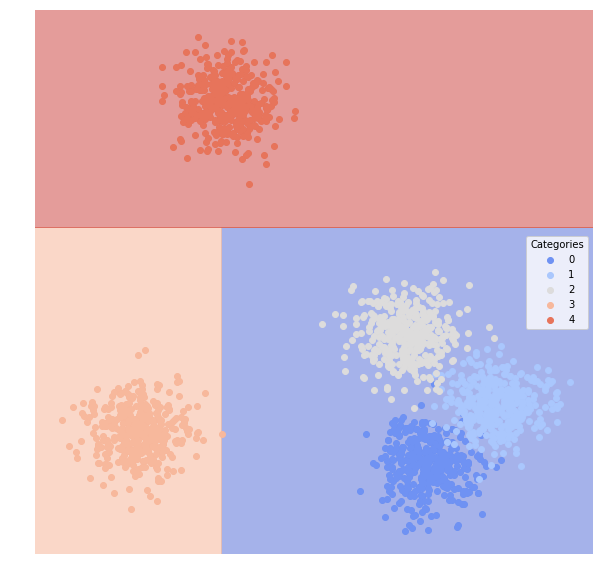

In [55]:
# artificial dataset 9
# 5 classes placed as bivariate Gaussians at random locations
noise = .2
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise))
lucem_illud.plotter(dfTrain)
classify_data(dfTrain, dfTest)

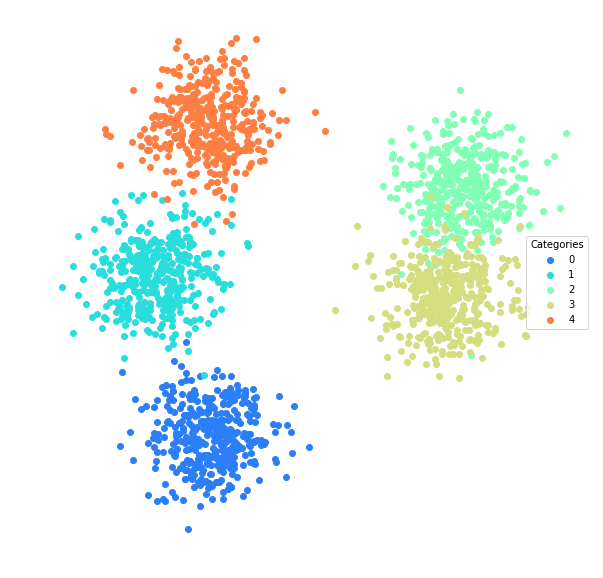

Gaussian Naive Bayes:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.998711           0.991150       0.002   0.991150  1.000000
1         0.993605           0.981488       0.004   0.989691  0.989691
2         0.978038           0.924502       0.016   0.948454  0.968421
3         0.967950           0.920280       0.016   0.965116  0.943182
4         0.995370           0.992741       0.002   1.000000  0.990741


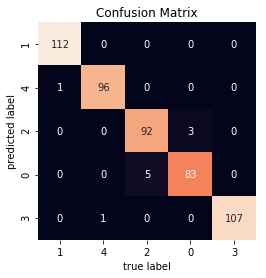

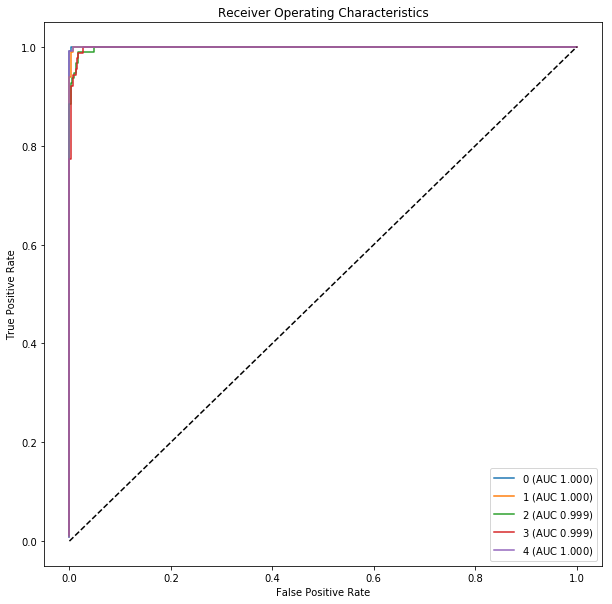

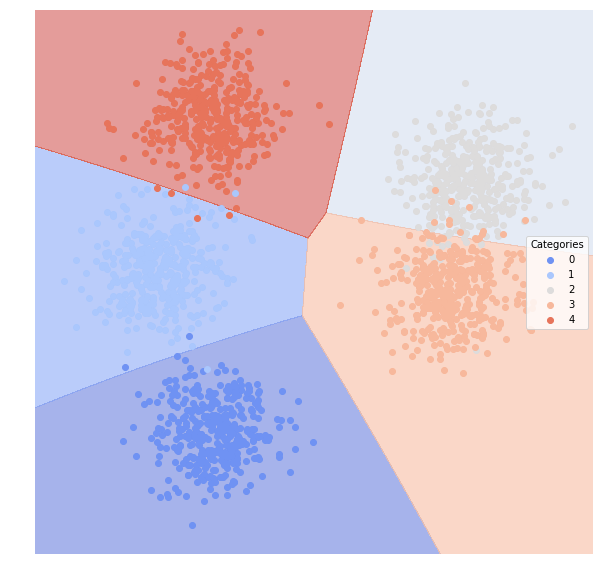

Support Vector Machine with linear kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.995536           0.993071       0.002   1.000000  0.991071
1         0.996278           0.970000       0.006   0.970000  1.000000
2         0.967511           0.907507       0.020   0.947368  0.947368
3         0.965523           0.899592       0.020   0.943182  0.943182
4         0.990741           0.985481       0.004   1.000000  0.981481


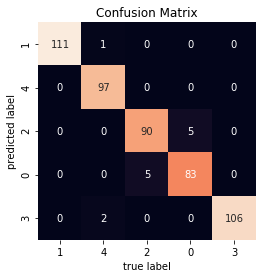

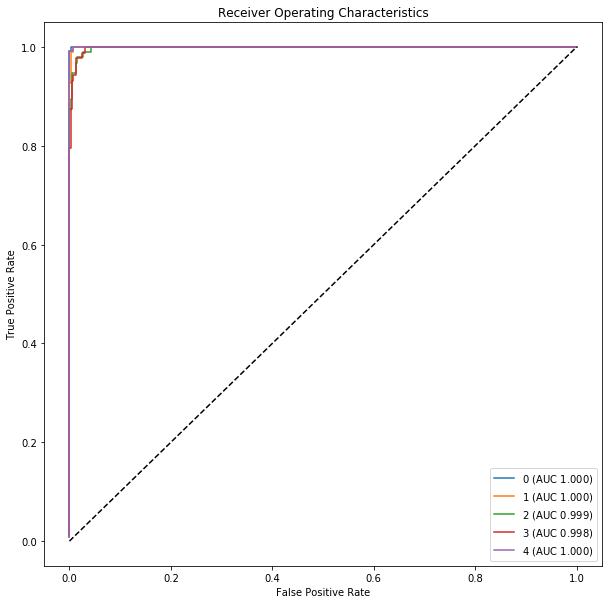

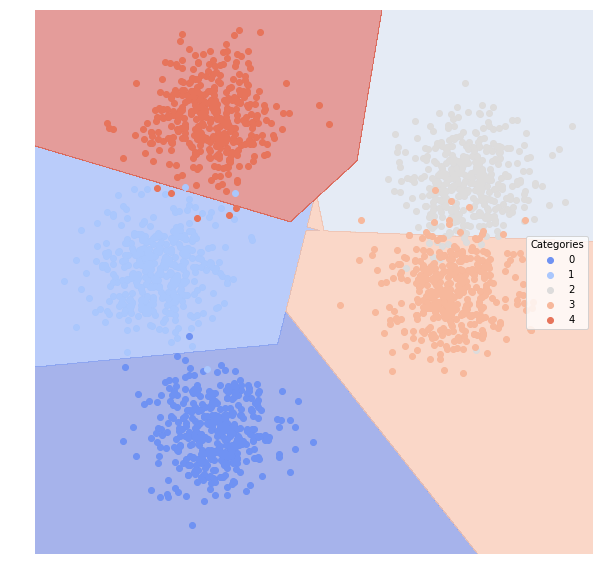

Support Vector Machine with 3 degree polynomial kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.995536           0.993071       0.002   1.000000  0.991071
1         0.996278           0.970000       0.006   0.970000  1.000000
2         0.965952           0.928252       0.016   0.978022  0.936842
3         0.981355           0.917538       0.016   0.934783  0.977273
4         0.990741           0.985481       0.004   1.000000  0.981481


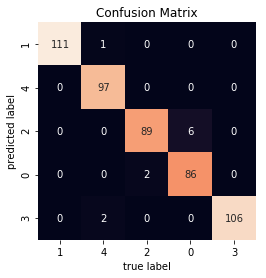

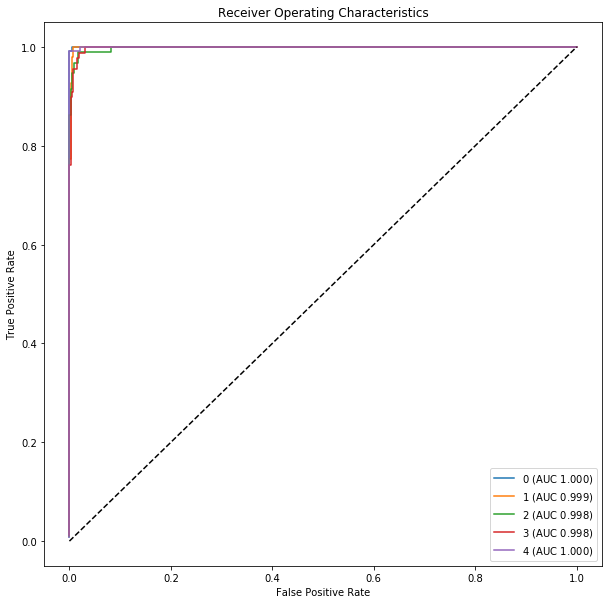

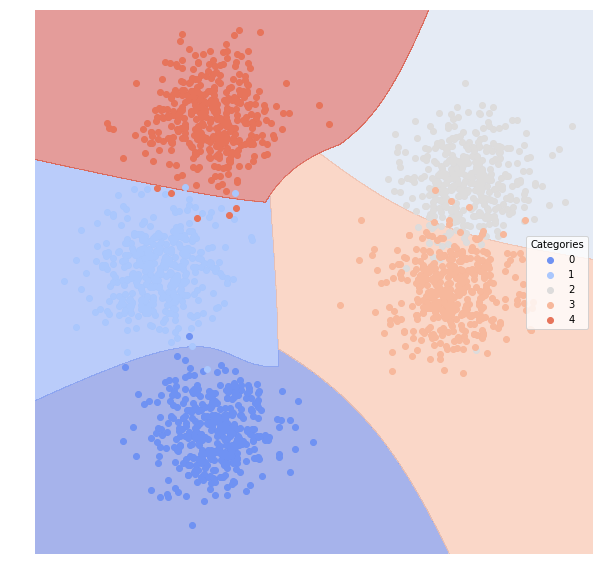

K-Nearest Neighbors with 5 neighbors:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.998711           0.991150       0.002   0.991150  1.000000
1         0.993605           0.981488       0.004   0.989691  0.989691
2         0.983301           0.933001       0.014   0.948980  0.978947
3         0.969164           0.930989       0.014   0.976471  0.943182
4         0.995370           0.992741       0.002   1.000000  0.990741


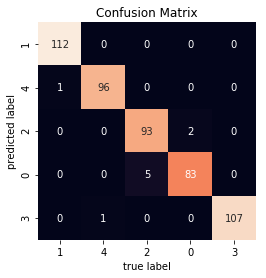

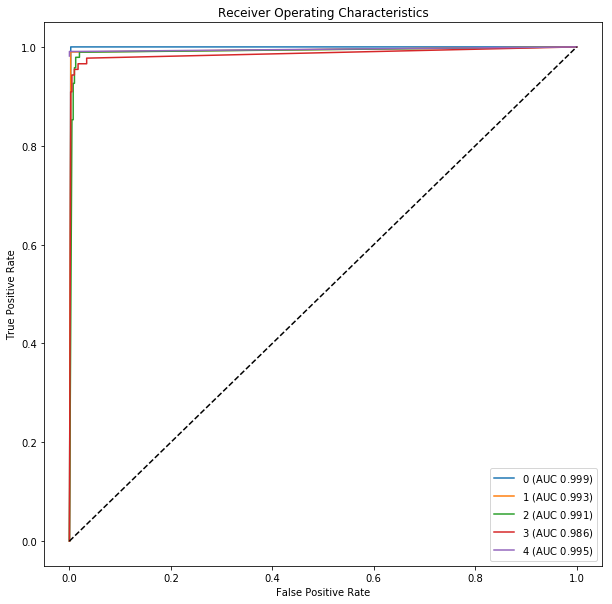

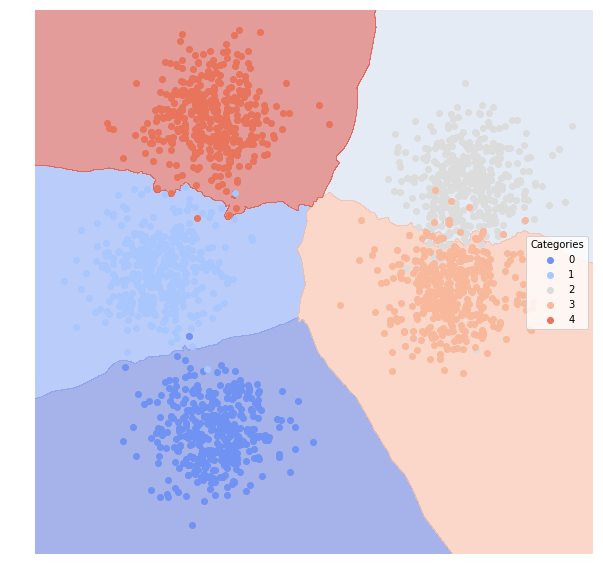

Logistic Regression:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.996134           0.973913       0.006   0.973913  1.000000
1         0.983295           0.964871       0.008   0.989474  0.969072
2         0.967511           0.907507       0.020   0.947368  0.947368
3         0.965523           0.899592       0.020   0.943182  0.943182
4         0.995370           0.992741       0.002   1.000000  0.990741


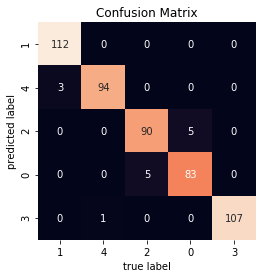

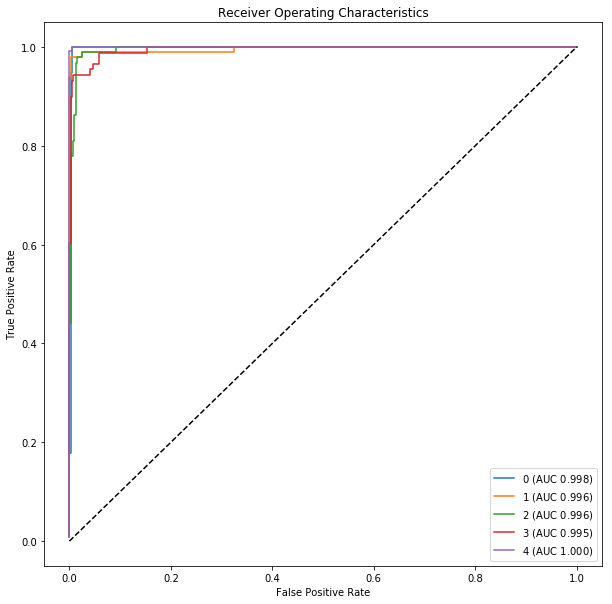

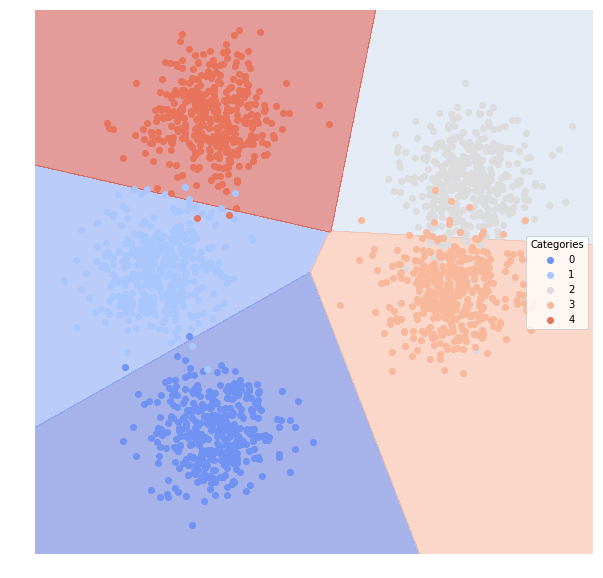

Decision Tree:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.994247           0.984223       0.004   0.991071  0.991071
1         0.991123           0.961700       0.008   0.969697  0.989691
2         0.962248           0.899010       0.022   0.946809  0.936842
3         0.964309           0.889597       0.022   0.932584  0.943182
4         0.990741           0.985481       0.004   1.000000  0.981481


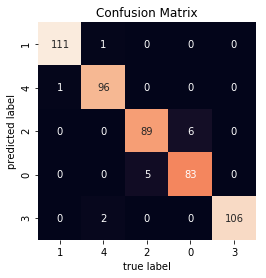

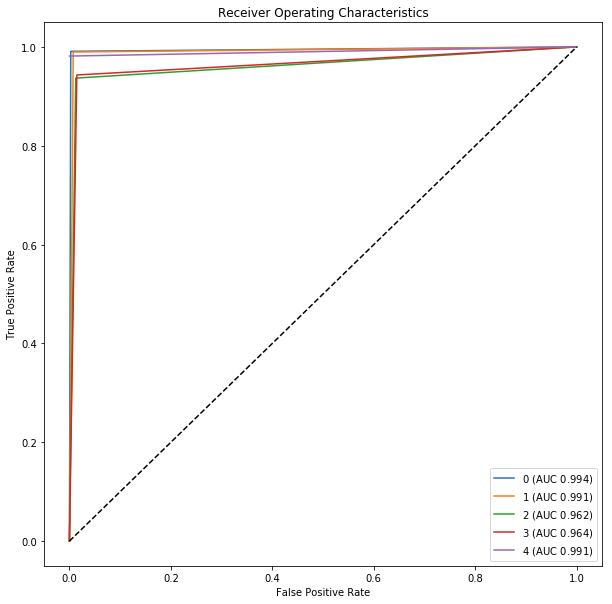

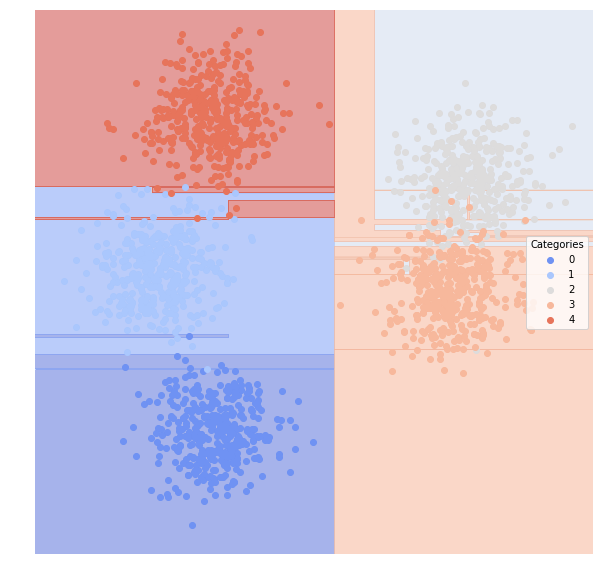

Random Forest:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.995536           0.993071       0.002   1.000000  0.991071
1         0.996278           0.970000       0.006   0.970000  1.000000
2         0.978038           0.924502       0.016   0.948454  0.968421
3         0.967950           0.920280       0.016   0.965116  0.943182
4         0.990741           0.985481       0.004   1.000000  0.981481


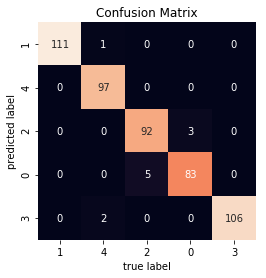

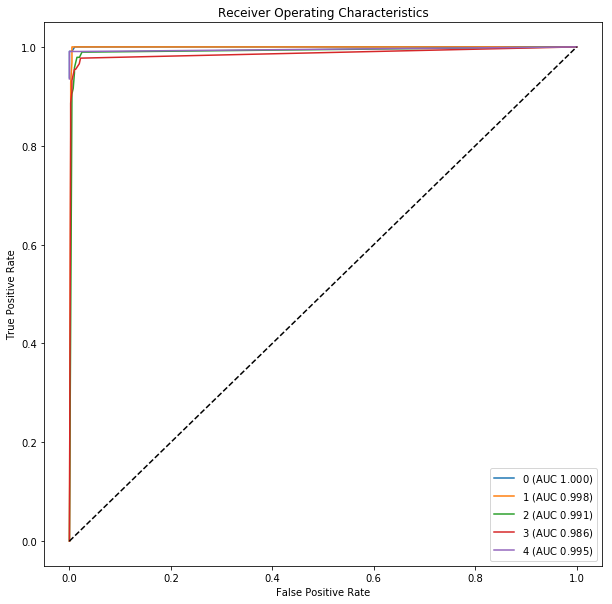

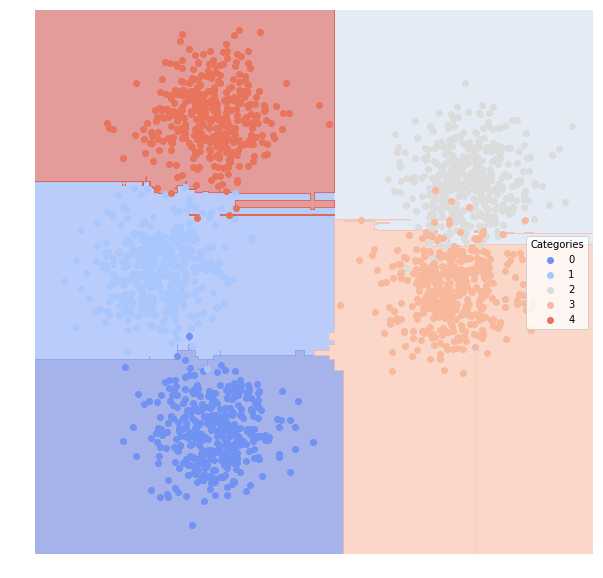

Neural Network (Multi-layer Perceptron):
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.997423           0.982456       0.004   0.982456  1.000000
1         0.987209           0.963188       0.008   0.979381  0.979381
2         0.967511           0.907507       0.020   0.947368  0.947368
3         0.965523           0.899592       0.020   0.943182  0.943182
4         0.990741           0.985481       0.004   1.000000  0.981481


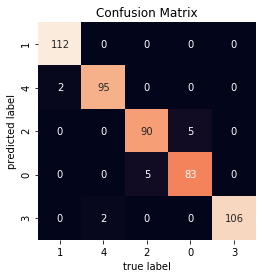

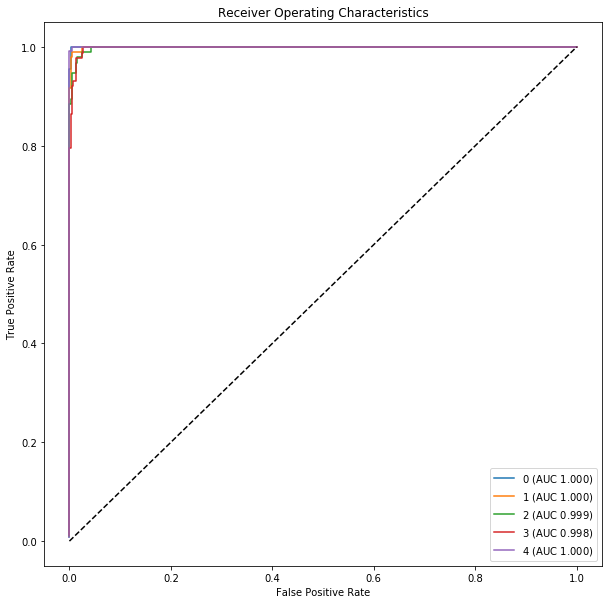

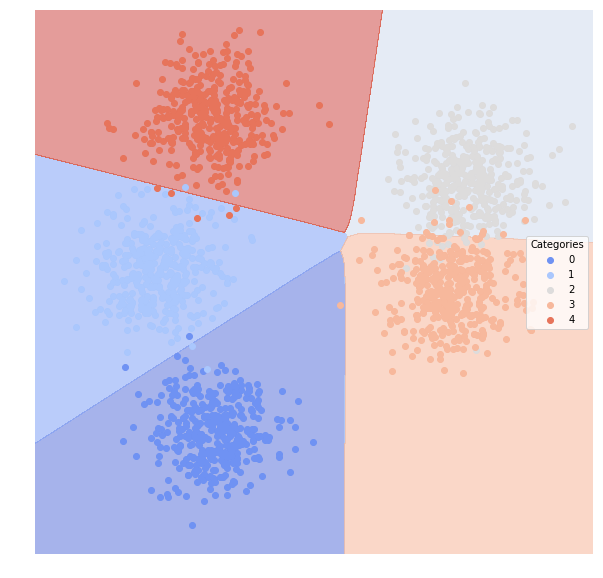

Gradient Boosting:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.995536           0.993071       0.002   1.000000  0.991071
1         0.996278           0.970000       0.006   0.970000  1.000000
2         0.972775           0.916004       0.018   0.947917  0.957895
3         0.966737           0.909817       0.018   0.954023  0.943182
4         0.990741           0.985481       0.004   1.000000  0.981481


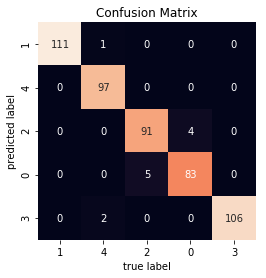

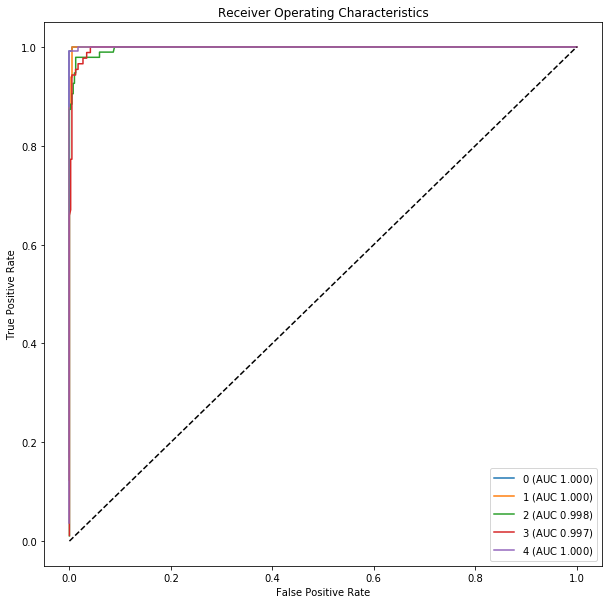

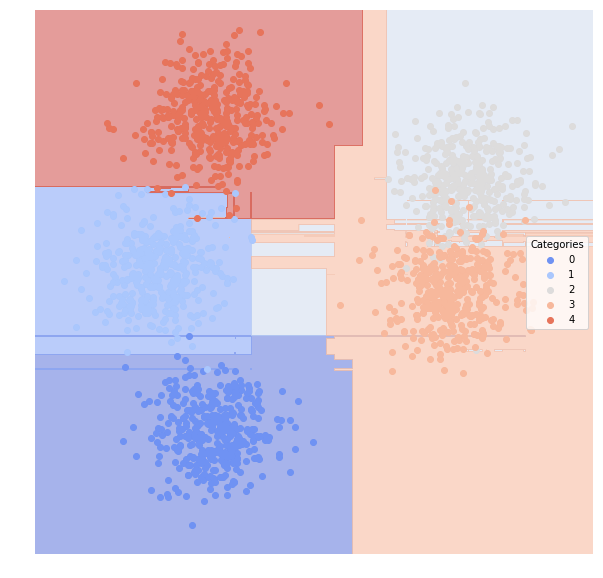

AdaBoost with 100 weak classifiers:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
0         0.625000           0.418000       0.168   1.000000  0.250000
1         0.854839           0.453271       0.234   0.453271  1.000000
2         0.940871           0.895808       0.024   0.988235  0.884211
3         0.980969           0.879667       0.024   0.887755  0.988636
4         0.847222           0.760444       0.066   1.000000  0.694444


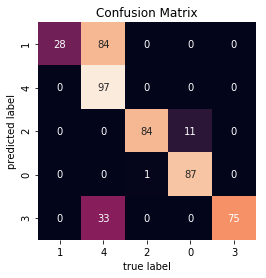

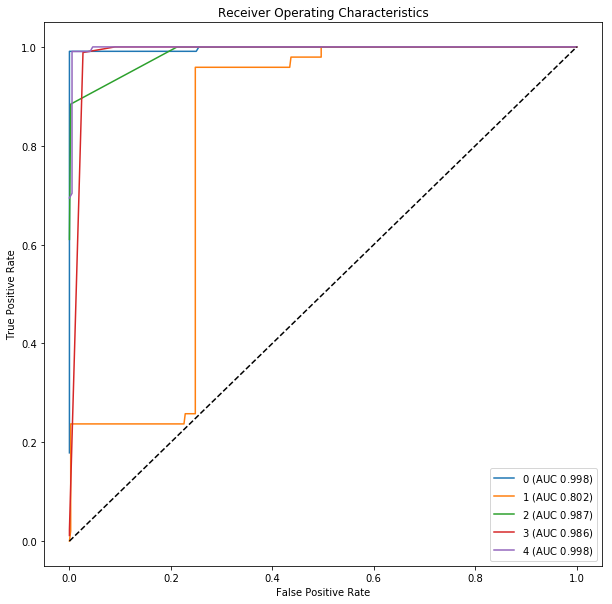

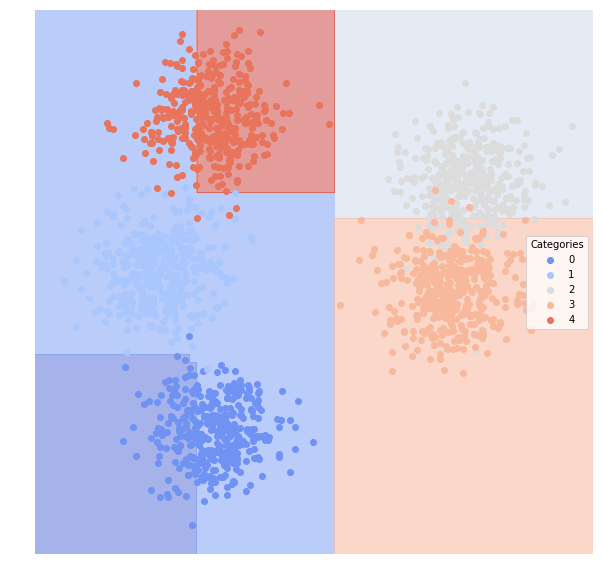

In [54]:
# artificial dataset 10
# 5 classes placed as bivariate Gaussians at random locations with more noise
noise = .4
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.multiBlobs(noise))
lucem_illud.plotter(dfTrain)
classify_data(dfTrain, dfTest)

I determined the performance of each model based on the accuracy per class in testing data.

Among the above exploration, Gaussian Naive Bayes works best with dataset 9, which contains 5 classes placed as bivariate Gaussians at random locations. This makes sense because the true distribution of each class in this dataset is Gaussian, which is consistent with the assumption of the Naive Bayes model we used. The model performs slightly worse on dataset 10, which has more noise than dataset 9, indicating that the distribution of each class in dataset 10 has more noise - not exactly Gaussian, but the Gaussian Naive Bayes model still performs much better on dataset 10 than any other datasets except dataset 9.

SVM with linear kernel works best with dataset 9, which contains 5 classes placed as bivariate Gaussians at random locations. This is because the 5 classes we have generated in dataset 9 are mostly linearly separable. It also performs great on dataset 10 but slightly worse than dataset 9 because the 5 classes in dataset 10 have more overlap than in dataset 9, resulting in more non-separable cases and larger margin. SVM with linear kernel should work well with dataset 3 and 4 in which two classes are respectively linearly split along one of two dimensions. However, due to the noise, the two classes in dataset 3 or 4 are neither linearly separable, therefore, the model does not perform extraordinary well on these two datasets.

SVM with 3 degree polynomial kernel works best with dataset 9, which contains 5 classes placed as bivariate Gaussians at random locations. The reason is that among all the datasets generated above, dataset 9 contains the most 3-degree-polynomially separable classes, therefore, SVM should work best on it. However, it also works quite well with dataset 3, because in this dataset, two classes are linearly split along one of two dimensions, and SVM with 3 degree polynomial kernel has well dealt with some of the noise during the split.  

KNN works best with dataset 9, which contains 5 classes placed as bivariate Gaussians at random locations. This is because the classes in dataset 9 are the most aggregated, and therefore most suitable for the piece-wise constant model KNN. KNN also works quite well with dataset 5, in which two classes are split oppositely along each dimension, and dataset 3, in which two classes are linearly split along one of two dimensions, and dataset 7, in which one class nested within the other in two dimensions. This is because all these datasets are generated with certain graphical patterns, which can be recognized by KNN.

Logistic Regression works best with dataset 10, which contains 5 classes placed as bivariate Gaussians at random locations with 0.4 noise. This is because the logistic regression we implemented here is a linear model and dataset 10 contains 5 almost linearly separable classes. It works slightly worse on dataset 9, which means that though the 5 classes in dataset 9 are the most linearly separable among all, the logistic regression's performance is affected by how the data locates in the space. The class 0, 1, 2 in dataset 9 are adjacent to each other and overlap, making it more difficult for logistic regression to distinguish them. Logistic Regression also works well with dataset 3, because two classes in this dataset are linearly split along one of two dimensions, which aligns with the linear nature of logistic regression model implemented here, but the noise worsen the performance a little bit.

Decision Tree works best with dataset 9, which contains 5 classes placed as bivariate Gaussians at random locations. Since the decision tree we implemented here partitions the space along two dimensions, and due to the segregated location and least overlapping feature of the 5 classes, it makes sense that it works best with dataset 9. It also works well with dataset 3, dataset 5, and dataset 7, since in all these datasets, the true classes are nearly divided along the axes.

Random Forest works best with dataset 9, which contains 5 classes placed as bivariate Gaussians at random locations. Again, this is because that the random forest we implemented here partitions the space along two dimensions, and the 5 classes in dataset 9 have the most segregated locations and the least overlaps. We can observe less small partitions of the space by random forest than decision tree, indicating less over-fitting and a better tackle of the bias-variance tradeoff.

Neural Network (Multi-layer Perceptron) works best with dataset 9, which contains 5 classes placed as bivariate Gaussians at random locations, because the 5 classes in dataset 9 have the most segregated locations and the least overlaps. It also works well with dataset 3, 5, 7 and even the ones generated in the same way but with more noise, dataset 4, 6, 8. From the plots we can observe quite smooth decision boundaries compared to those generated by other methods, which indicates that multi-layer perceptron tolerates the outliers, or noise, quite well, and classifies based on the most significant features, in other words, is less variant.

Gradient Boosting works best with dataset 9, which contains 5 classes placed as bivariate Gaussians at random locations, because the 5 classes in dataset 9 have the most segregated locations and the least overlaps. Gradient boosting also works well with dataset 3, 5, and 7. However, observing the classification region plots, we can see some much more fluctuated decision boundaries and tiny spaces being partitioned, which implies somehow more variant and less biased classifiers gradient boosting with current setting has generated.

Loading Reddit data
Converting to vectors
Gaussian Naive Bayes:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Relationships            0.697829           0.481344    0.172414   0.777778   
Weeaboo Tales            0.858579           0.541778    0.188088   0.559055   
Bad Roommates            0.819405           0.627074    0.128527   0.776316   
Tales From Tech Support  0.880356           0.765515    0.075235   0.901408   

                           Recall  
Category                           
Relationships            0.437500  
Weeaboo Tales            0.946667  
Bad Roommates            0.710843  
Tales From Tech Support  0.790123  


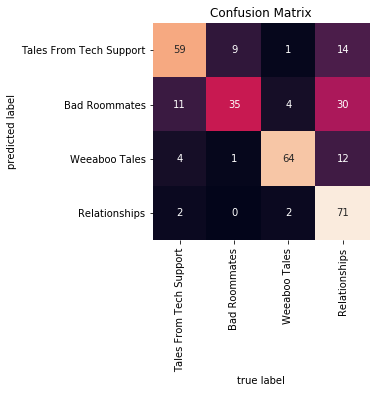

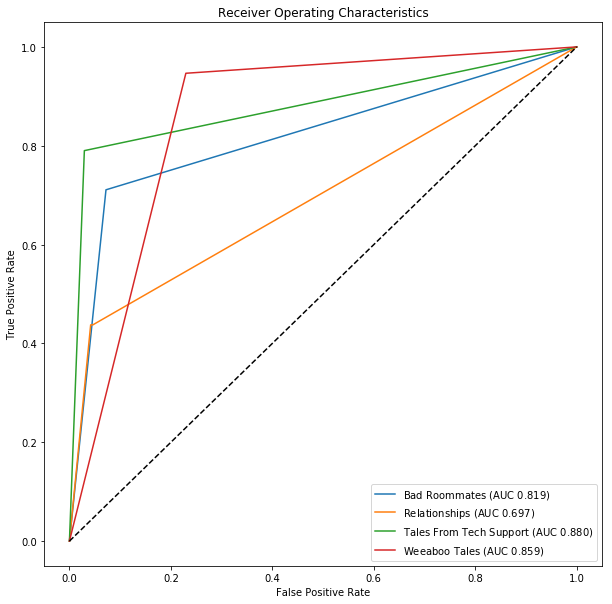

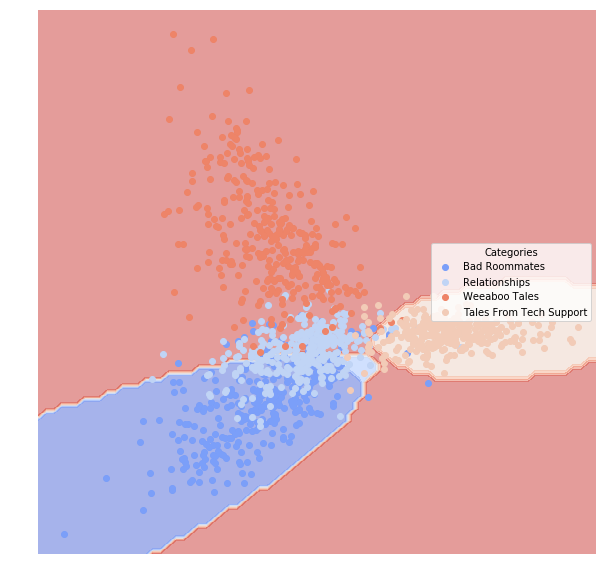

Support Vector Machine with linear kernel:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Relationships            0.964566           0.928823    0.021944   0.974026   
Weeaboo Tales            0.993333           0.989801    0.003135   1.000000   
Bad Roommates            0.981596           0.947320    0.015674   0.964286   
Tales From Tech Support  0.993697           0.964286    0.009404   0.964286   

                           Recall  
Category                           
Relationships            0.937500  
Weeaboo Tales            0.986667  
Bad Roommates            0.975904  
Tales From Tech Support  1.000000  


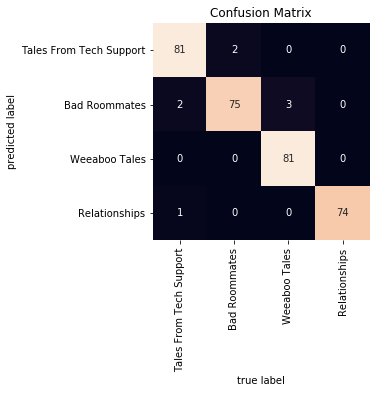

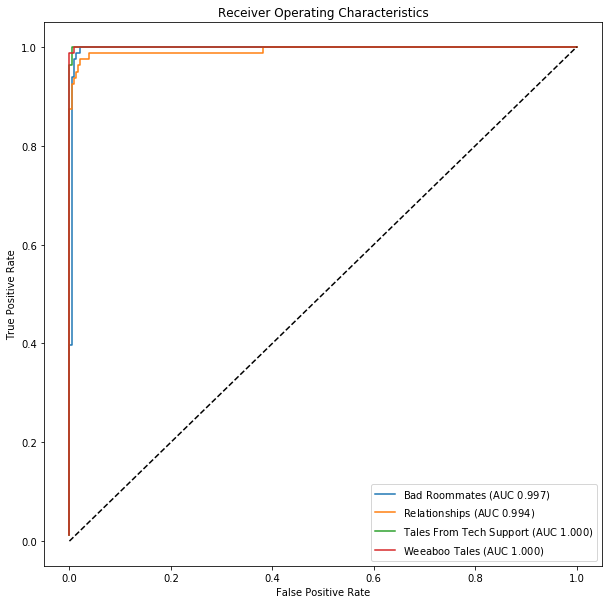

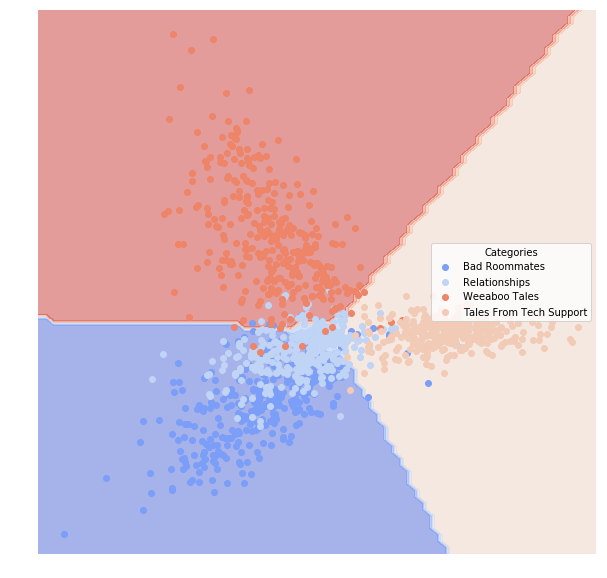

Support Vector Machine with 3 degree polynomial kernel:


/Users/yiqingzhu/anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


                         AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                                      
Relationships            0.5           0.250784    0.250784    0.00000     0.0
Weeaboo Tales            0.5           0.235110    0.764890    0.23511     1.0
Bad Roommates            0.5           0.260188    0.260188    0.00000     0.0
Tales From Tech Support  0.5           0.253918    0.253918    0.00000     0.0


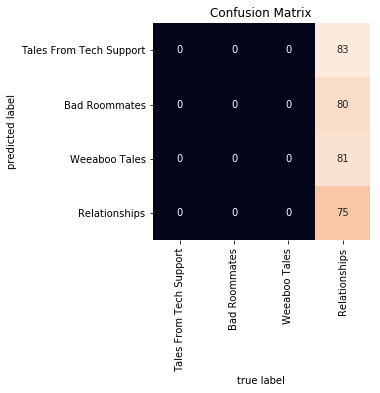

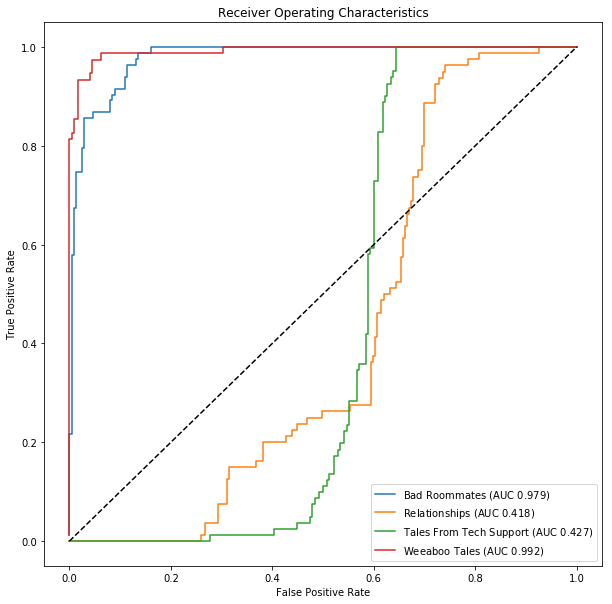

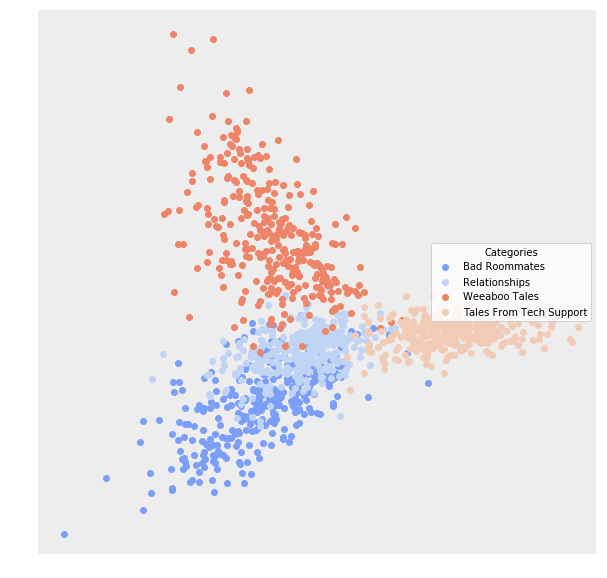

K-Nearest Neighbors with 5 neighbors:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Relationships            0.883264           0.761268    0.075235   0.888889   
Weeaboo Tales            0.934372           0.844987    0.043887   0.917808   
Bad Roommates            0.946574           0.839283    0.050157   0.876404   
Tales From Tech Support  0.983323           0.932692    0.018809   0.941176   

                           Recall  
Category                           
Relationships            0.800000  
Weeaboo Tales            0.893333  
Bad Roommates            0.939759  
Tales From Tech Support  0.987654  


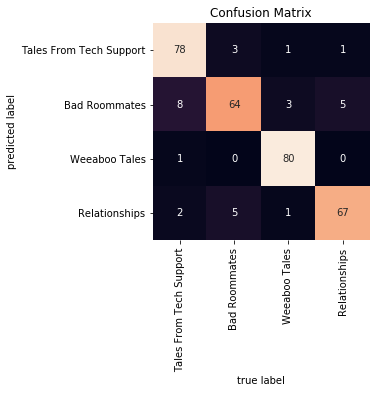

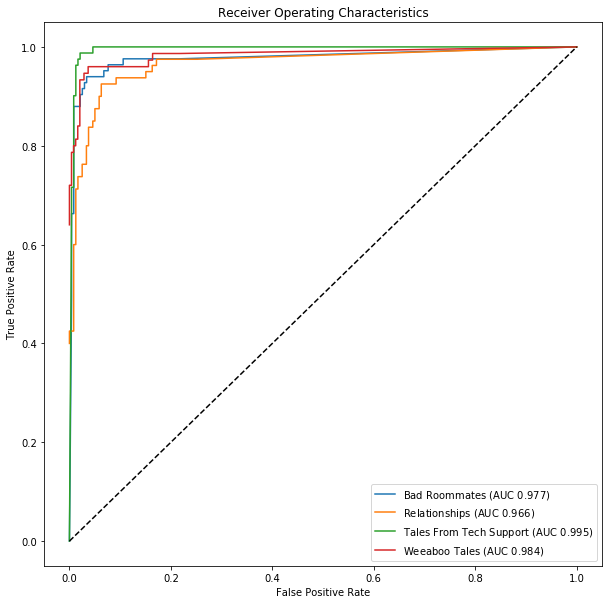

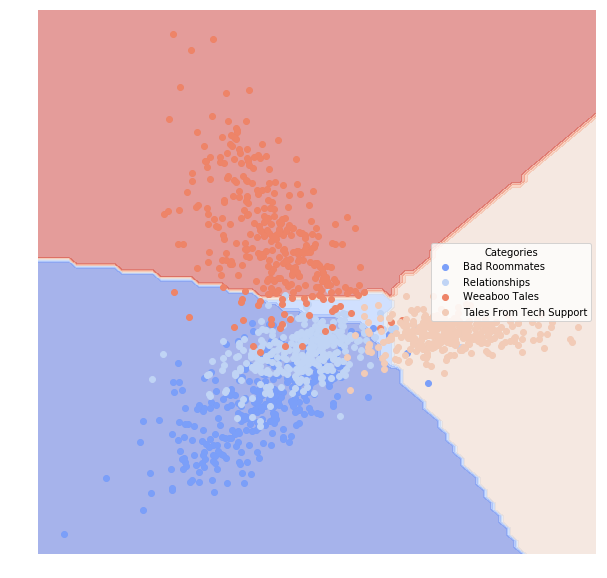

Logistic Regression:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Relationships            0.964566           0.928823    0.021944   0.974026   
Weeaboo Tales            0.993333           0.989801    0.003135   1.000000   
Bad Roommates            0.987620           0.956218    0.012539   0.964706   
Tales From Tech Support  0.995798           0.975904    0.006270   0.975904   

                           Recall  
Category                           
Relationships            0.937500  
Weeaboo Tales            0.986667  
Bad Roommates            0.987952  
Tales From Tech Support  1.000000  


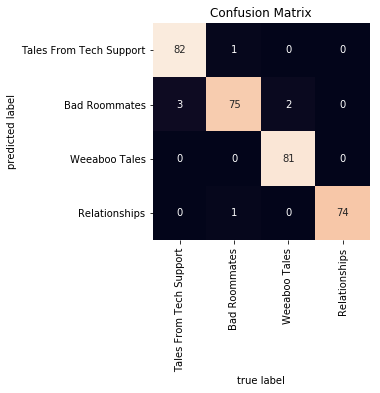

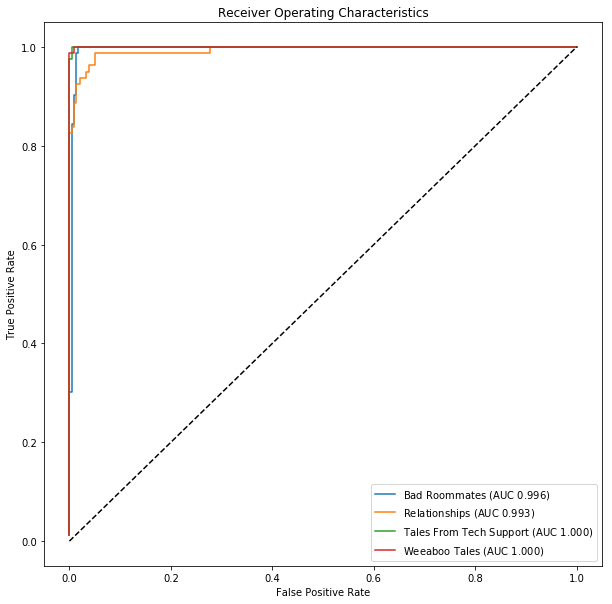

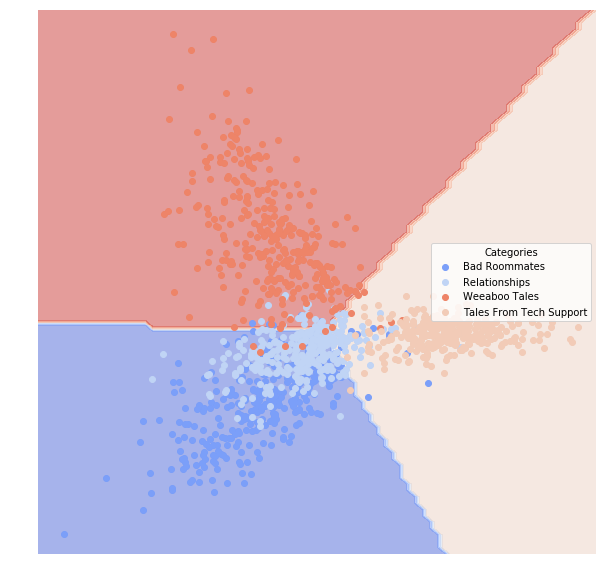

Decision Tree:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Relationships            0.860225           0.654062    0.115987   0.747126   
Weeaboo Tales            0.924126           0.792429    0.059561   0.858974   
Bad Roommates            0.917118           0.836761    0.053292   0.934211   
Tales From Tech Support  0.873924           0.718881    0.090909   0.833333   

                           Recall  
Category                           
Relationships            0.812500  
Weeaboo Tales            0.893333  
Bad Roommates            0.855422  
Tales From Tech Support  0.802469  


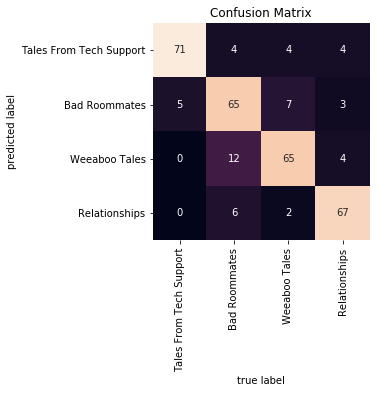

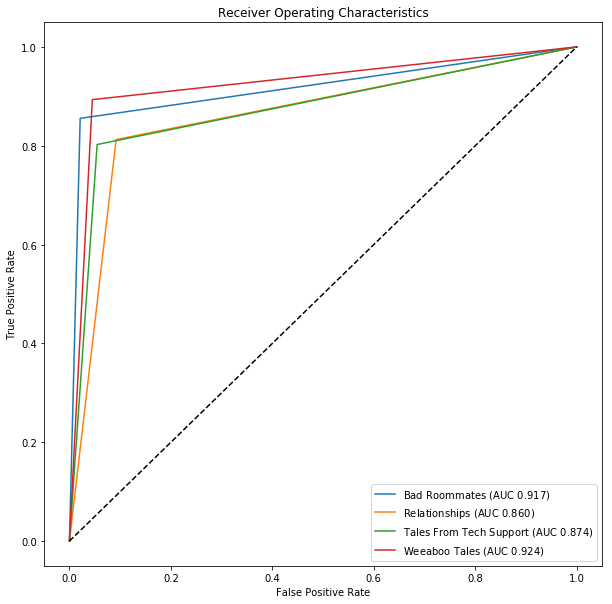

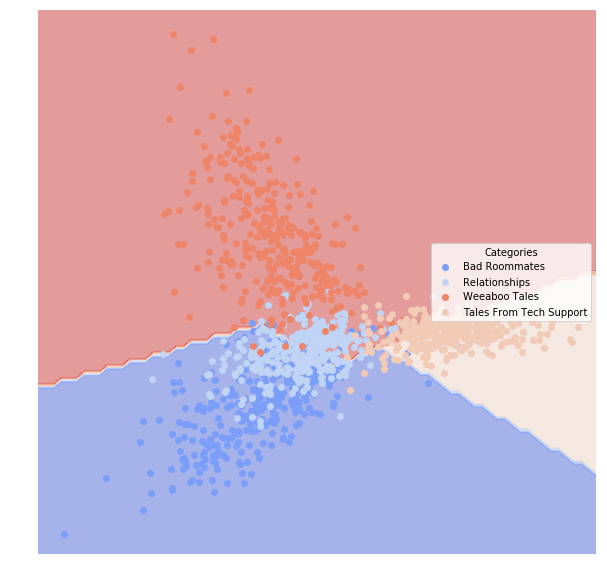

Random Forest:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Relationships            0.881198           0.772313    0.072100   0.913043   
Weeaboo Tales            0.980519           0.941182    0.015674   0.960526   
Bad Roommates            0.939887           0.795797    0.065831   0.822917   
Tales From Tech Support  0.940113           0.868541    0.040752   0.935897   

                           Recall  
Category                           
Relationships            0.787500  
Weeaboo Tales            0.973333  
Bad Roommates            0.951807  
Tales From Tech Support  0.901235  


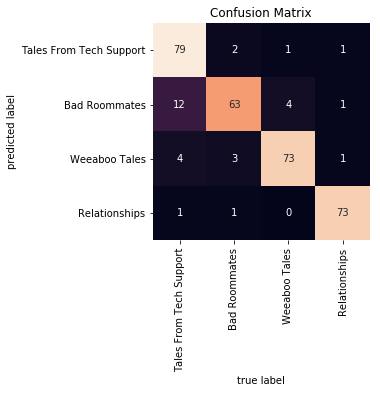

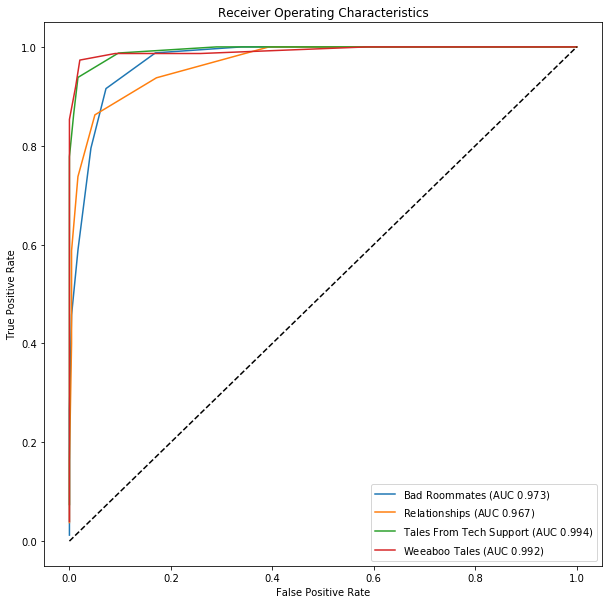

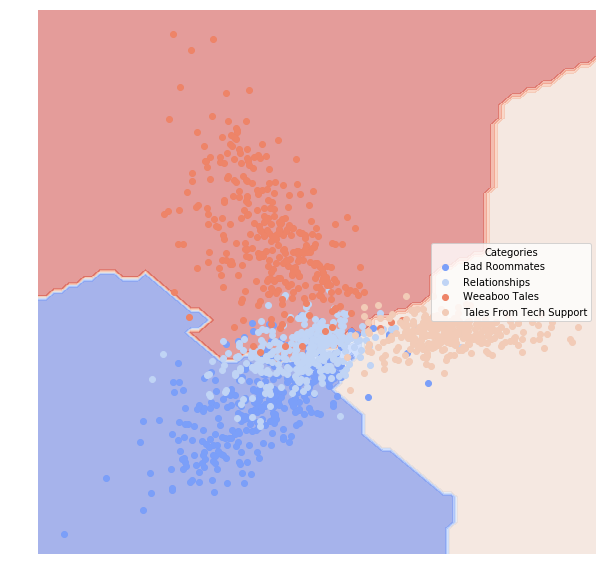

Neural Network (Multi-layer Perceptron):
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Relationships            0.956224           0.907770    0.028213   0.961039   
Weeaboo Tales            0.985137           0.939203    0.015674   0.948718   
Bad Roommates            0.969548           0.929524    0.021944   0.963415   
Tales From Tech Support  0.997899           0.987805    0.003135   0.987805   

                           Recall  
Category                           
Relationships            0.925000  
Weeaboo Tales            0.986667  
Bad Roommates            0.951807  
Tales From Tech Support  1.000000  


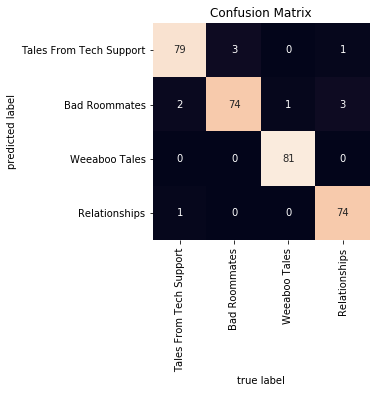

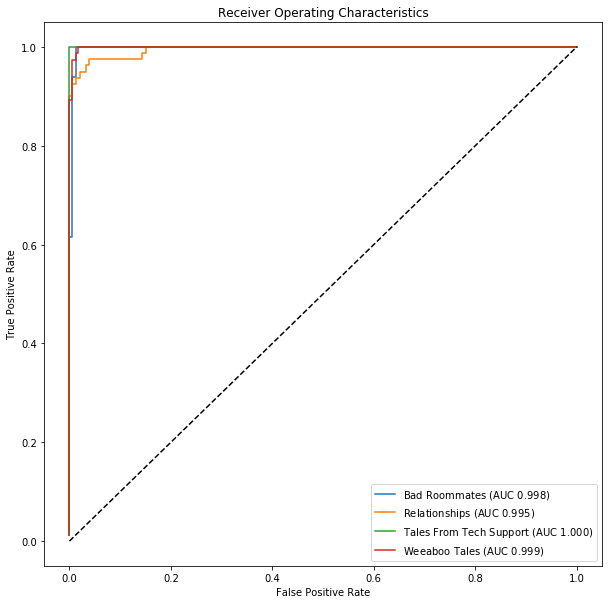

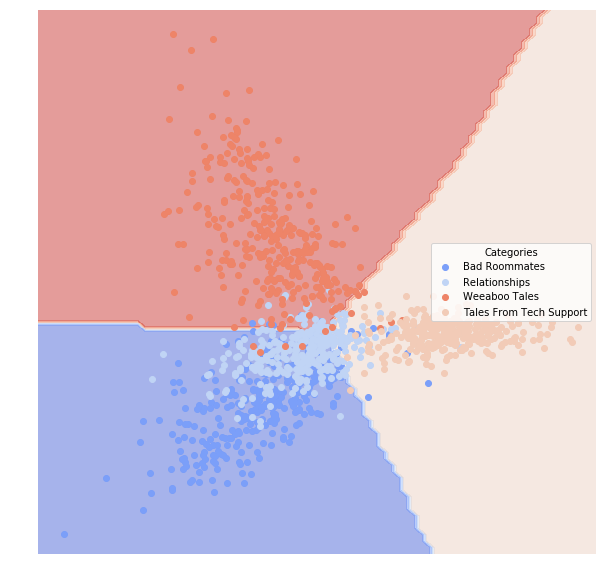

Gradient Boosting:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Relationships            0.941632           0.877710    0.037618   0.947368   
Weeaboo Tales            0.977951           0.956254    0.012539   0.986301   
Bad Roommates            0.967429           0.918476    0.025078   0.951807   
Tales From Tech Support  0.987395           0.931034    0.018809   0.931034   

                           Recall  
Category                           
Relationships            0.900000  
Weeaboo Tales            0.960000  
Bad Roommates            0.951807  
Tales From Tech Support  1.000000  


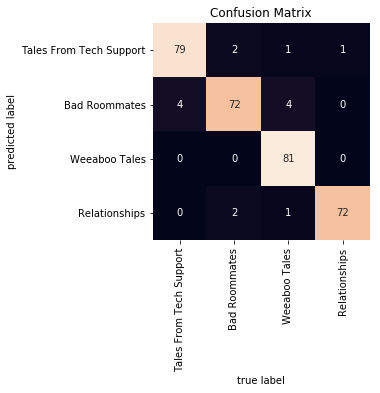

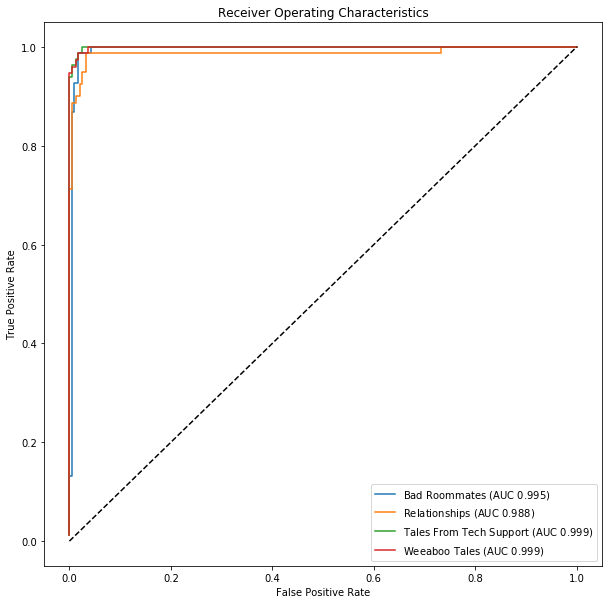

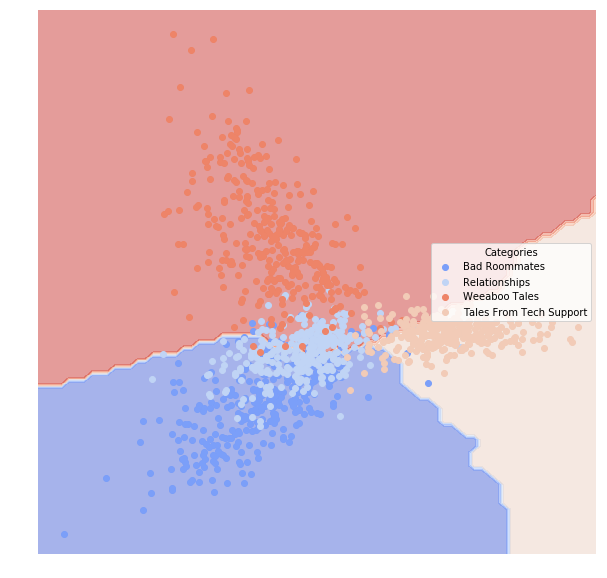

AdaBoost with 100 weak classifiers:
                              AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                      
Relationships            0.841553           0.670171    0.106583   0.819444   
Weeaboo Tales            0.973852           0.931004    0.018809   0.960000   
Bad Roommates            0.871503           0.694822    0.103448   0.790698   
Tales From Tech Support  0.923306           0.790080    0.065831   0.848837   

                           Recall  
Category                           
Relationships            0.737500  
Weeaboo Tales            0.960000  
Bad Roommates            0.819277  
Tales From Tech Support  0.901235  


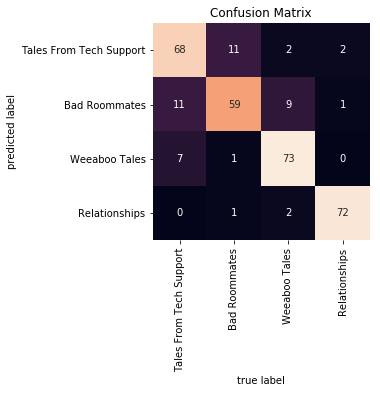

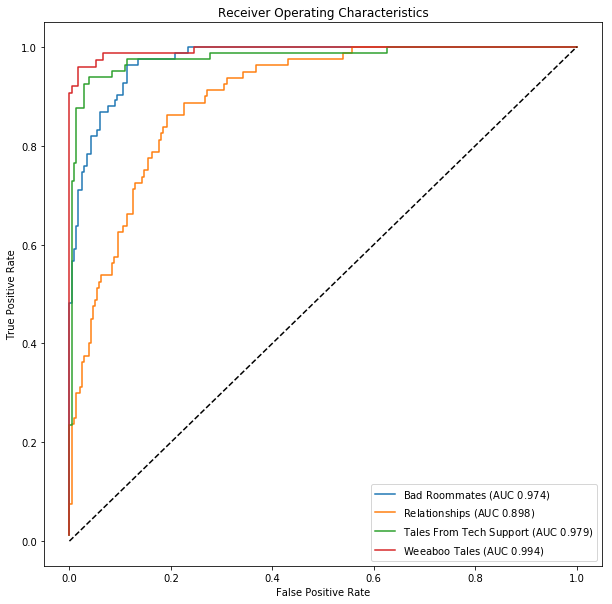

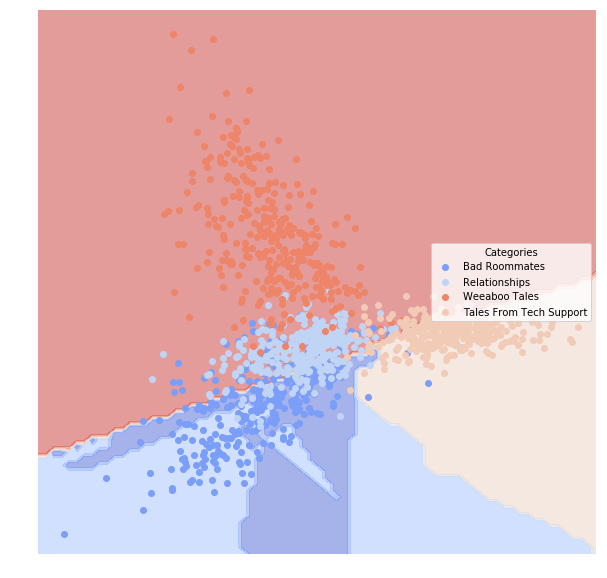

In [60]:
# empirical dataset 1: Reddit threads "classified" by thread topic
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadReddit())
classify_data(dfTrain, dfTest)

Loading data for: comp.sys.mac.hardware
Loading data for: comp.windows.x
Loading data for: misc.forsale
Loading data for: rec.autos
Converting to vectors
Gaussian Naive Bayes:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
comp.sys.mac.hardware  0.830168           0.575996    0.151064   0.661871   
comp.windows.x         0.917306           0.749407    0.072340   0.808333   
rec.autos              0.822421           0.635238    0.123404   0.788991   
misc.forsale           0.755420           0.538001    0.168085   0.725490   

                         Recall  
Category                         
comp.sys.mac.hardware  0.793103  
comp.windows.x         0.898148  
rec.autos              0.710744  
misc.forsale           0.592000  


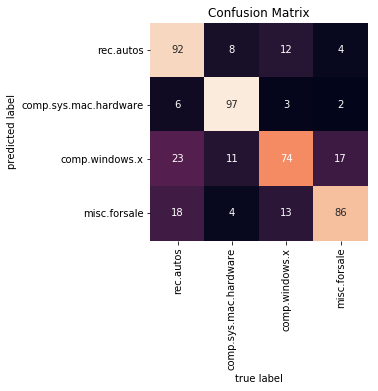

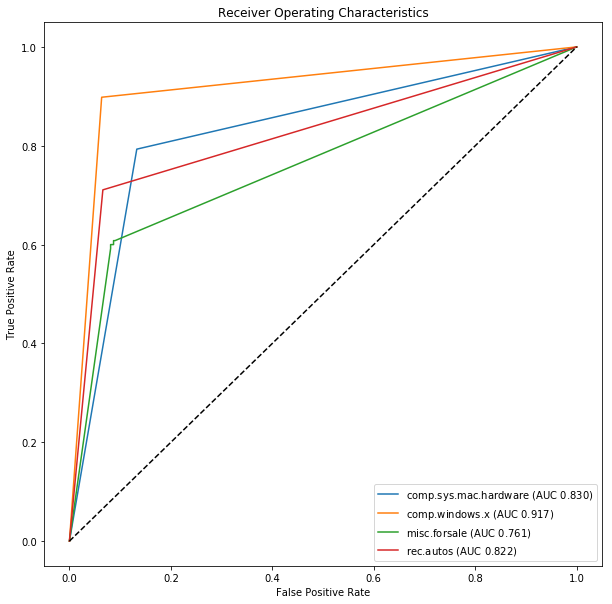

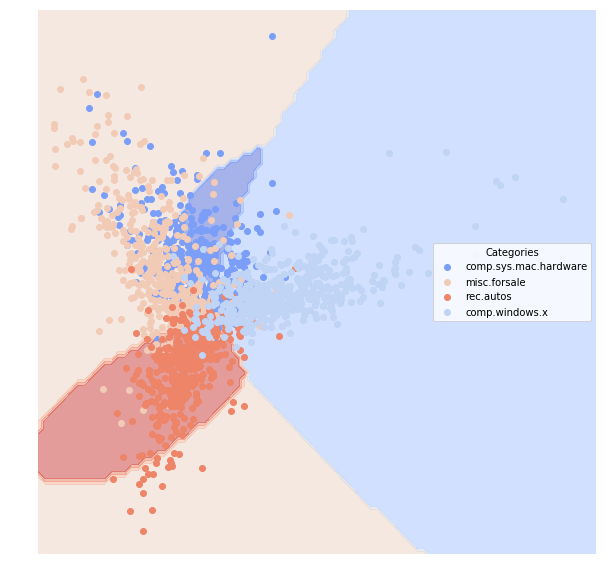

Support Vector Machine with linear kernel:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
comp.sys.mac.hardware  0.901447           0.735432    0.082979   0.808000   
comp.windows.x         0.942654           0.860200    0.038298   0.924528   
rec.autos              0.901099           0.757045    0.078723   0.838710   
misc.forsale           0.900058           0.797098    0.068085   0.904348   

                         Recall  
Category                         
comp.sys.mac.hardware  0.870690  
comp.windows.x         0.907407  
rec.autos              0.859504  
misc.forsale           0.832000  


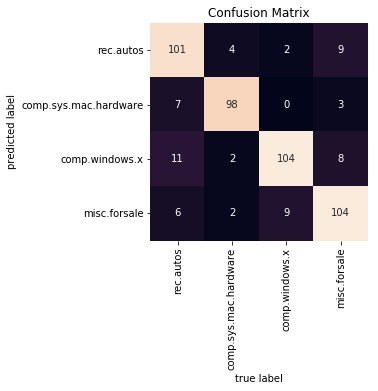

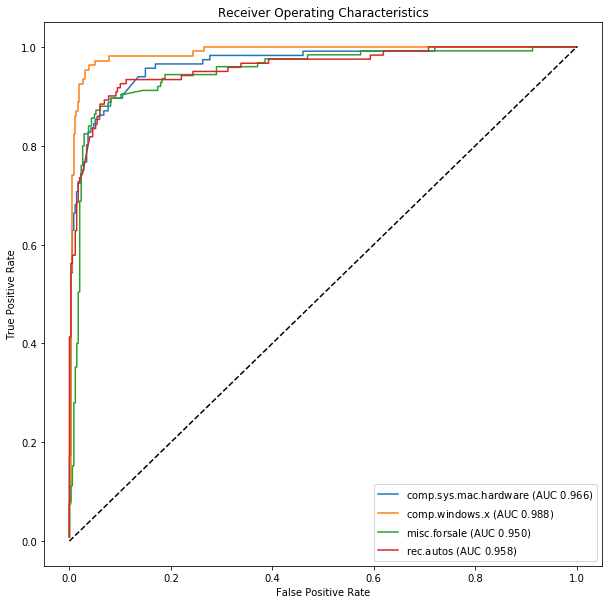

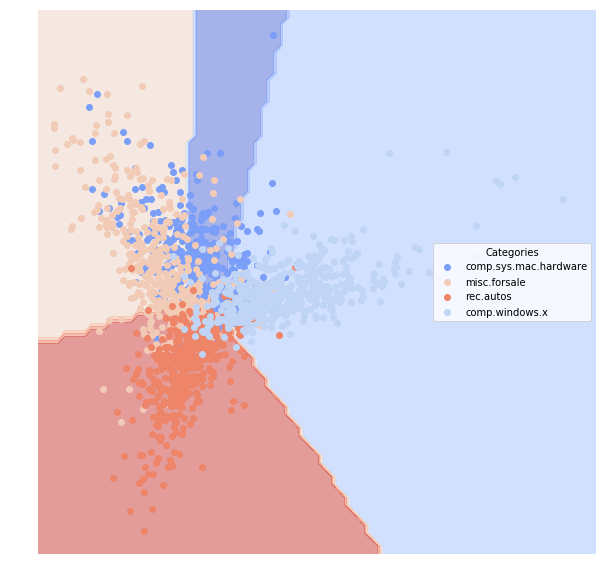

Support Vector Machine with 3 degree polynomial kernel:


/Users/yiqingzhu/anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


                       AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                                    
comp.sys.mac.hardware  0.5           0.246809    0.246809   0.000000     0.0
comp.windows.x         0.5           0.229787    0.770213   0.229787     1.0
rec.autos              0.5           0.257447    0.257447   0.000000     0.0
misc.forsale           0.5           0.265957    0.265957   0.000000     0.0


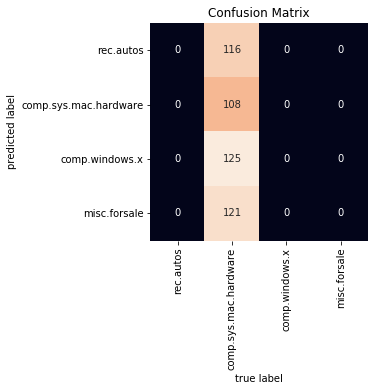

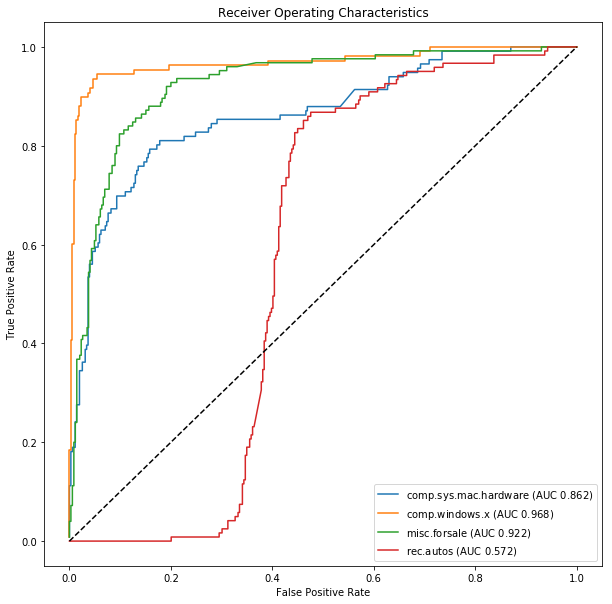

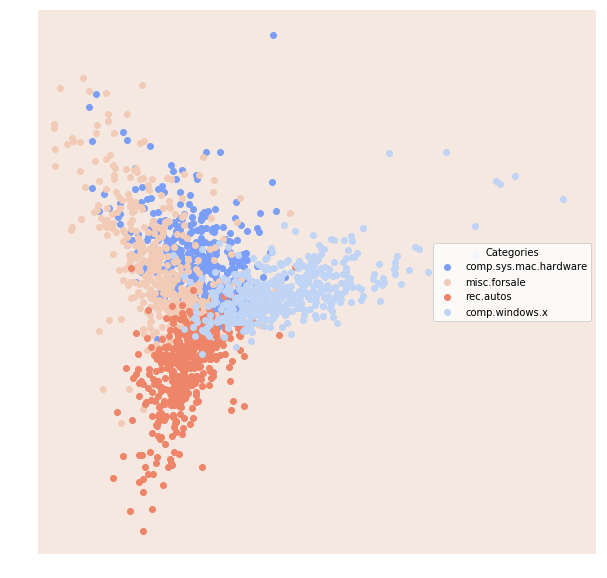

K-Nearest Neighbors with 5 neighbors:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
comp.sys.mac.hardware  0.530026           0.258986    0.476596   0.269231   
comp.windows.x         0.561643           0.290559    0.214894   0.640000   
rec.autos              0.520803           0.265970    0.451064   0.275862   
misc.forsale           0.526551           0.300064    0.253191   0.875000   

                         Recall  
Category                         
comp.sys.mac.hardware  0.543103  
comp.windows.x         0.148148  
rec.autos              0.462810  
misc.forsale           0.056000  


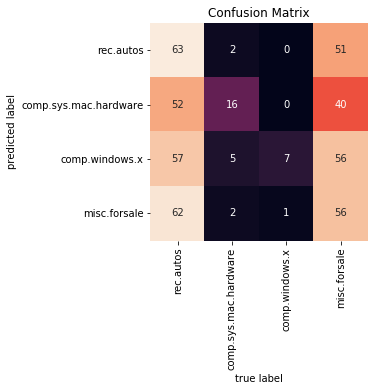

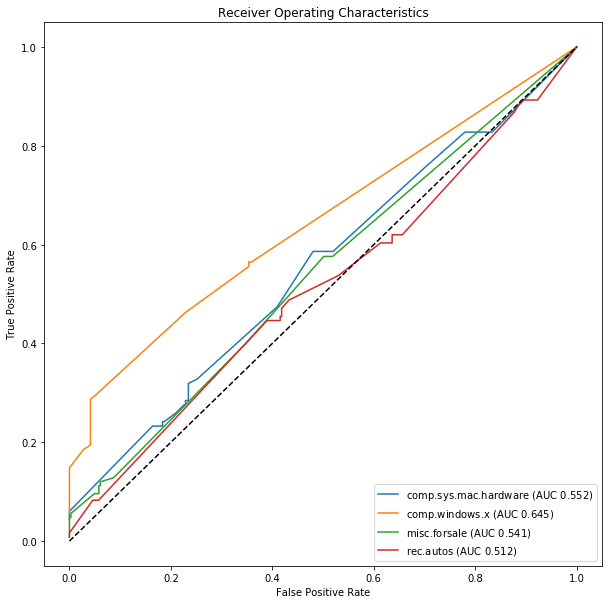

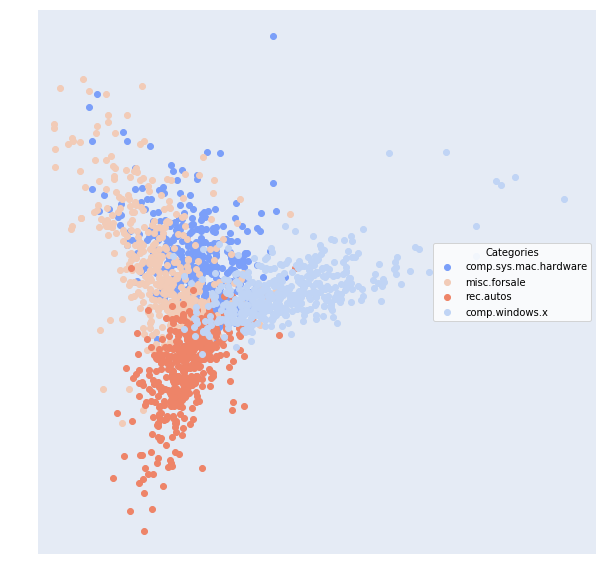

Logistic Regression:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
comp.sys.mac.hardware  0.902640           0.777522    0.068085   0.875000   
comp.windows.x         0.946388           0.843741    0.042553   0.892857   
rec.autos              0.914762           0.769173    0.074468   0.830769   
misc.forsale           0.898609           0.790612    0.070213   0.896552   

                         Recall  
Category                         
comp.sys.mac.hardware  0.844828  
comp.windows.x         0.925926  
rec.autos              0.892562  
misc.forsale           0.832000  


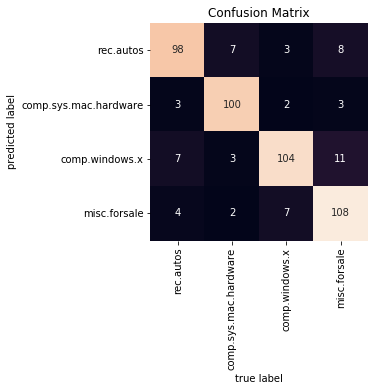

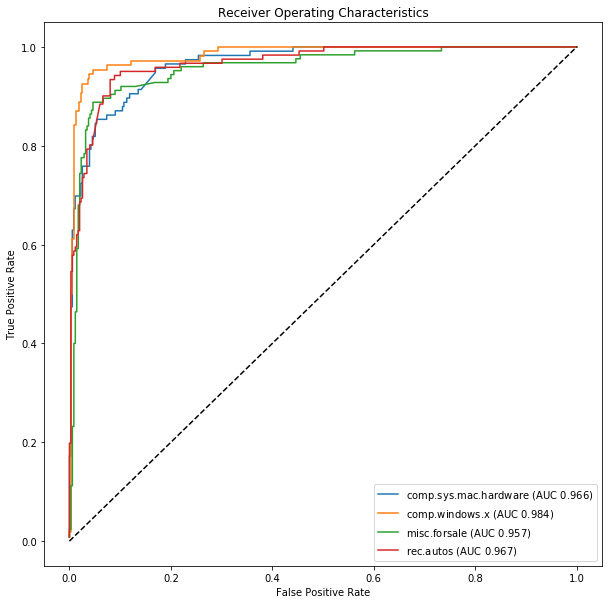

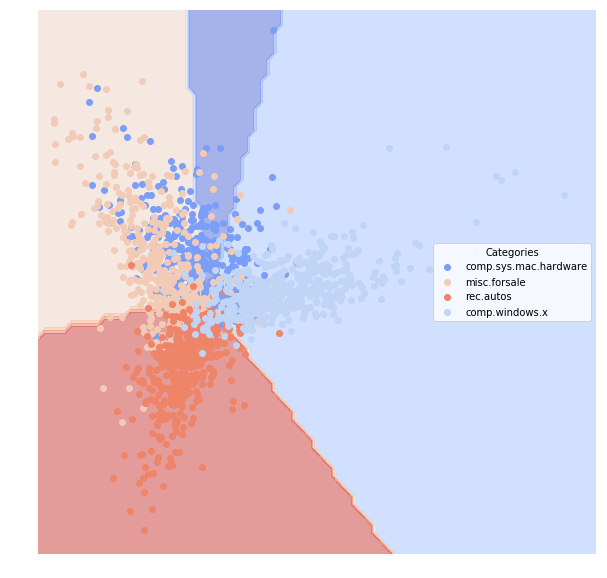

Decision Tree:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
comp.sys.mac.hardware  0.755333           0.490965    0.180851   0.634783   
comp.windows.x         0.826171           0.588675    0.127660   0.714286   
rec.autos              0.798397           0.572910    0.151064   0.711864   
misc.forsale           0.787478           0.556323    0.165957   0.688000   

                         Recall  
Category                         
comp.sys.mac.hardware  0.629310  
comp.windows.x         0.740741  
rec.autos              0.694215  
misc.forsale           0.688000  


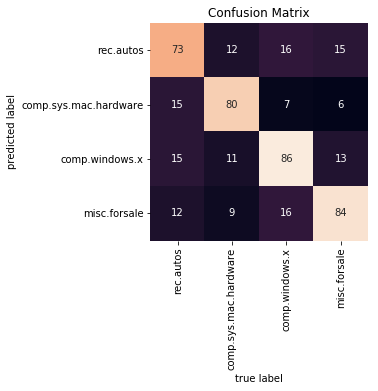

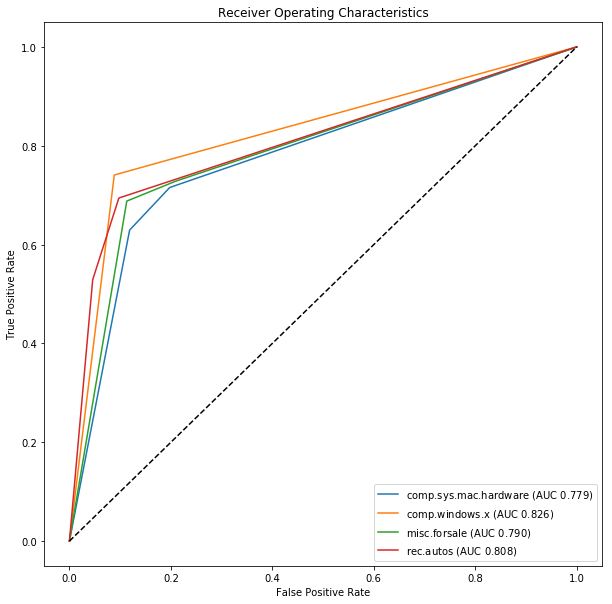

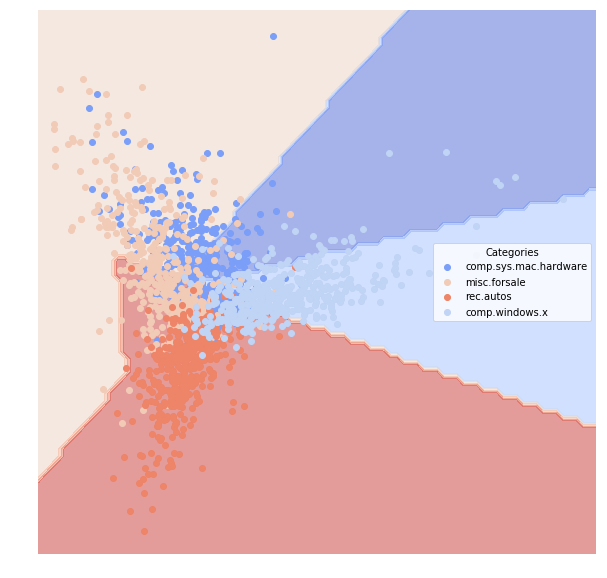

Random Forest:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
comp.sys.mac.hardware  0.839762           0.635080    0.119149   0.758621   
comp.windows.x         0.887175           0.725870    0.078723   0.831776   
rec.autos              0.860380           0.655831    0.119149   0.744361   
misc.forsale           0.879710           0.754946    0.082979   0.877193   

                         Recall  
Category                         
comp.sys.mac.hardware  0.758621  
comp.windows.x         0.824074  
rec.autos              0.818182  
misc.forsale           0.800000  


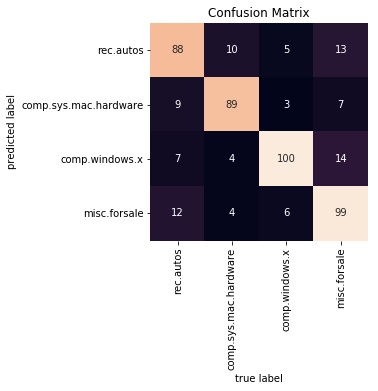

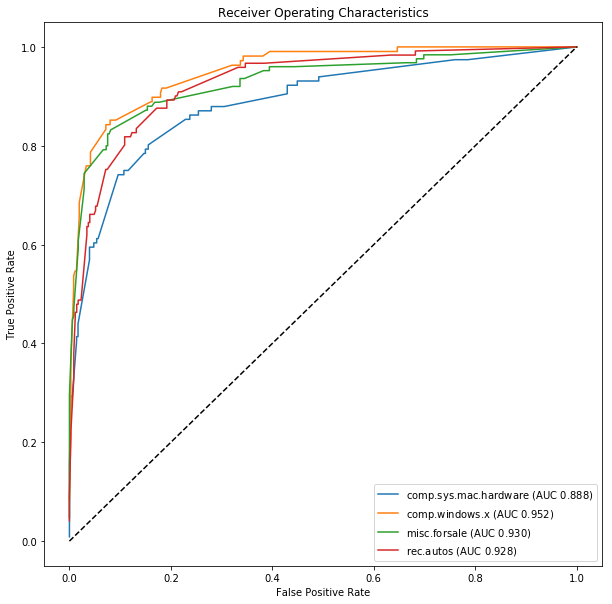

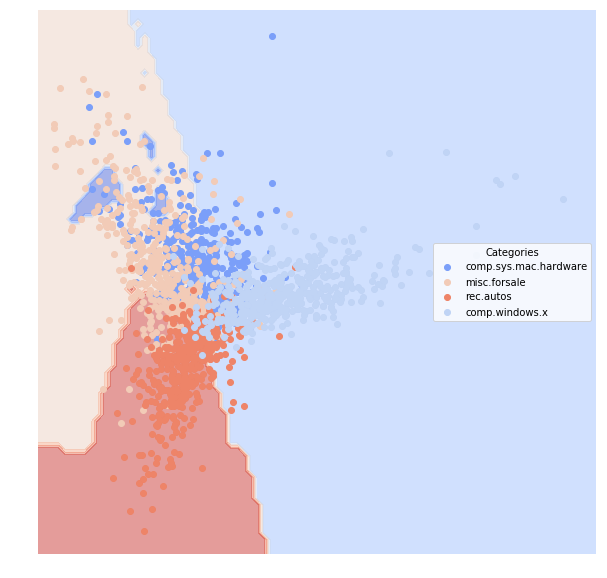

Neural Network (Multi-layer Perceptron):
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
comp.sys.mac.hardware  0.895578           0.745931    0.078723   0.837607   
comp.windows.x         0.950532           0.866495    0.036170   0.917431   
rec.autos              0.905397           0.774918    0.072340   0.859504   
misc.forsale           0.883014           0.736825    0.089362   0.837398   

                         Recall  
Category                         
comp.sys.mac.hardware  0.844828  
comp.windows.x         0.925926  
rec.autos              0.859504  
misc.forsale           0.824000  


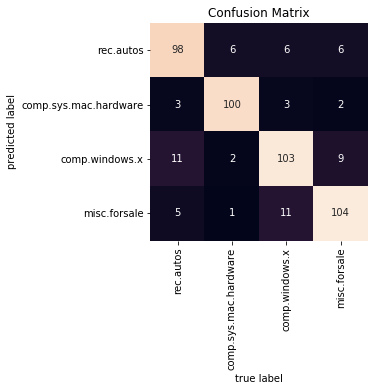

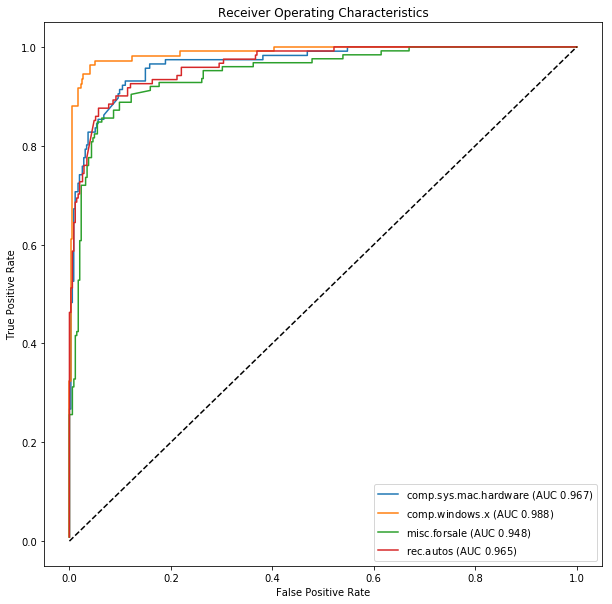

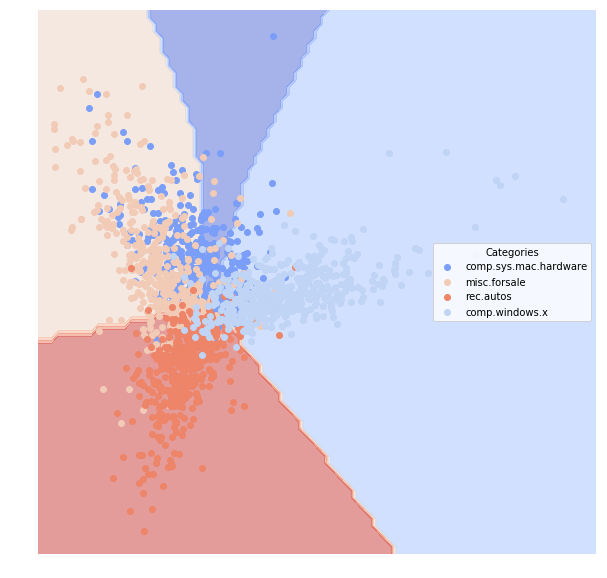

Gradient Boosting:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
comp.sys.mac.hardware  0.828317           0.613473    0.127660   0.741379   
comp.windows.x         0.890910           0.714718    0.082979   0.805310   
rec.autos              0.885505           0.707593    0.097872   0.786260   
misc.forsale           0.852812           0.708576    0.100000   0.854545   

                         Recall  
Category                         
comp.sys.mac.hardware  0.741379  
comp.windows.x         0.842593  
rec.autos              0.851240  
misc.forsale           0.752000  


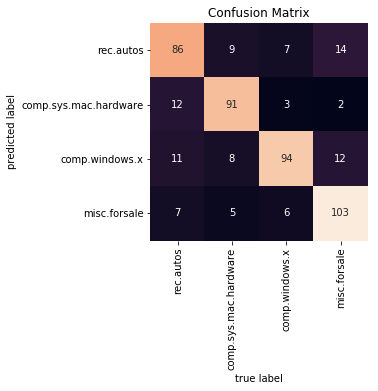

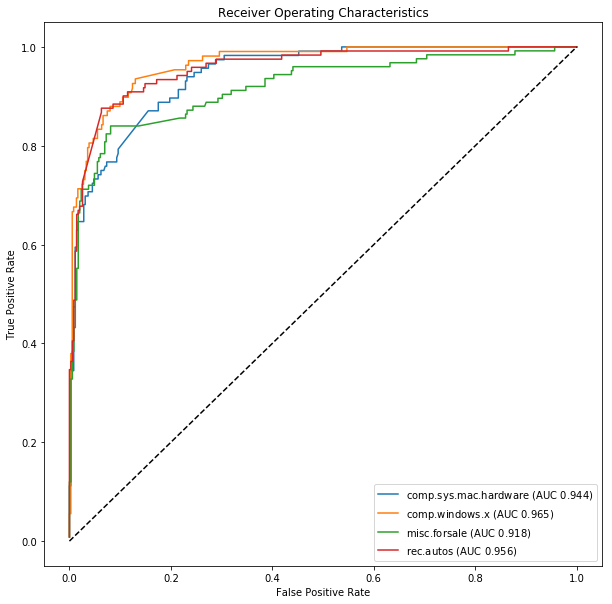

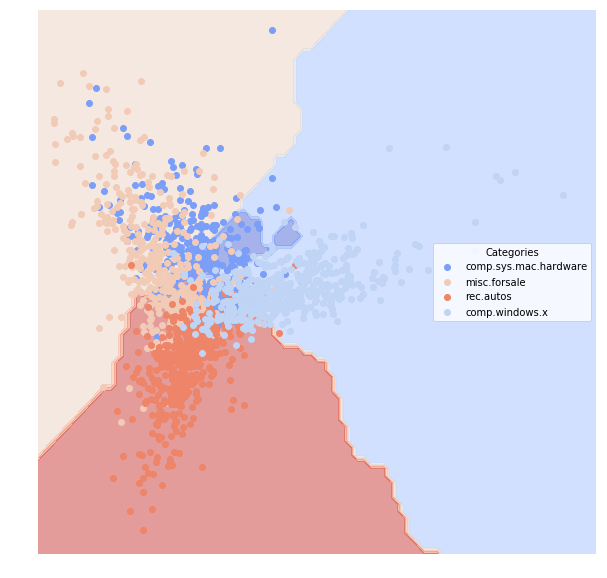

AdaBoost with 100 weak classifiers:
                            AUC  Average_Precision  Error_Rate  Precision  \
Category                                                                    
comp.sys.mac.hardware  0.800969           0.581543    0.138298   0.738318   
comp.windows.x         0.866380           0.675079    0.095745   0.788991   
rec.autos              0.853987           0.611355    0.144681   0.673203   
misc.forsale           0.784116           0.592209    0.144681   0.782178   

                         Recall  
Category                         
comp.sys.mac.hardware  0.681034  
comp.windows.x         0.796296  
rec.autos              0.851240  
misc.forsale           0.632000  


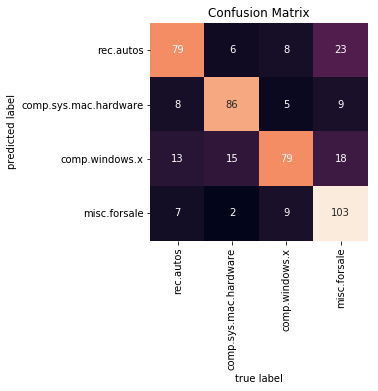

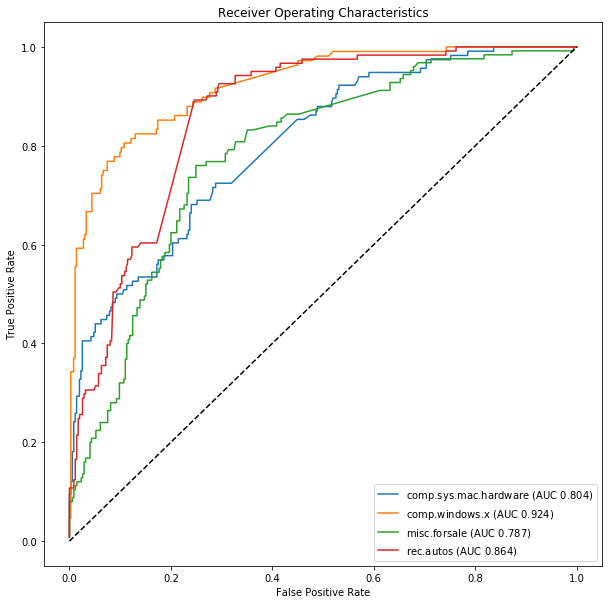

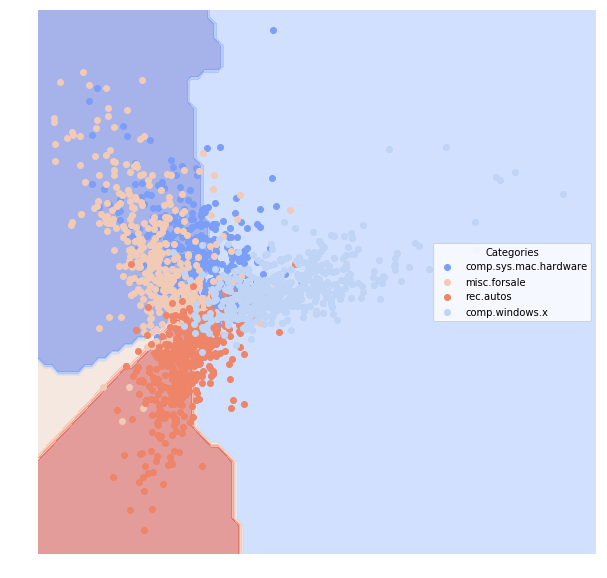

In [61]:
# empirical dataset 2: 20 newsgroups "classified" by group topic
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadNewsGroups())
classify_data(dfTrain, dfTest)

Loading senate data
Converting to vectors
Gaussian Naive Bayes:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.830328           0.709161    0.167155   0.777778  0.817518
Clinton   0.830328           0.829982    0.167155   0.873096  0.843137


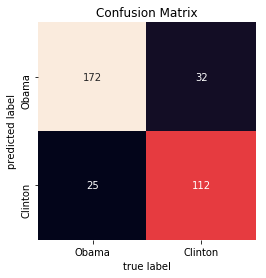

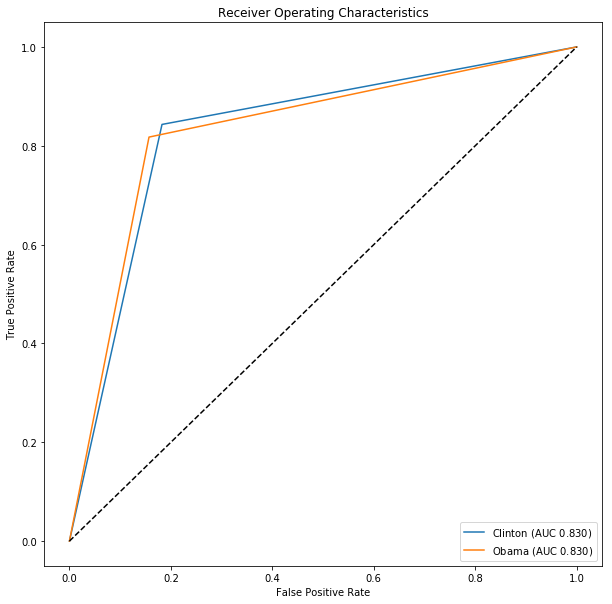

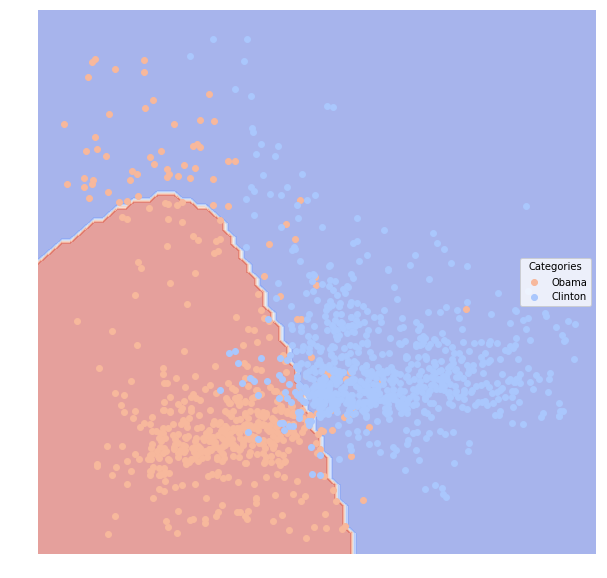

Support Vector Machine with linear kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.985401           0.982533     0.01173   1.000000  0.970803
Clinton   0.985401           0.980769     0.01173   0.980769  1.000000


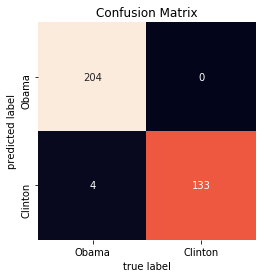

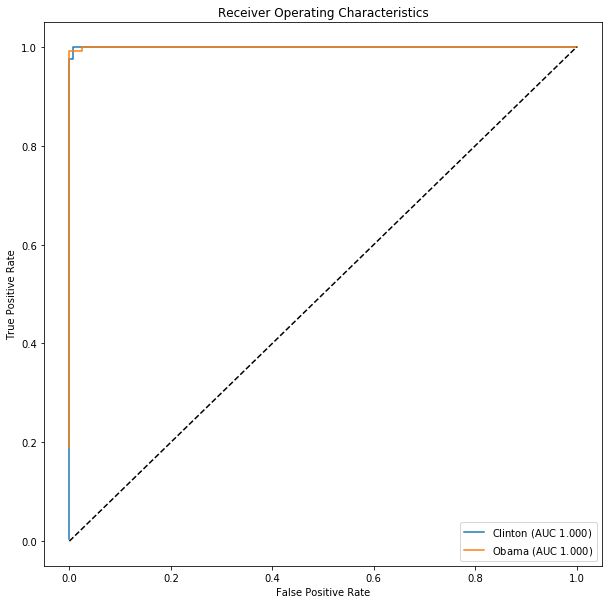

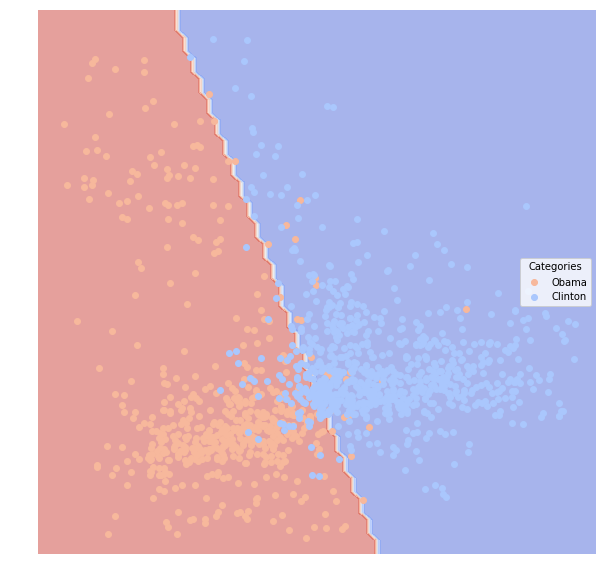

Support Vector Machine with 3 degree polynomial kernel:


/Users/yiqingzhu/anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


          AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                       
Obama     0.5            0.40176     0.40176    0.00000     0.0
Clinton   0.5            0.59824     0.40176    0.59824     1.0


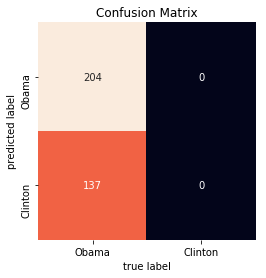

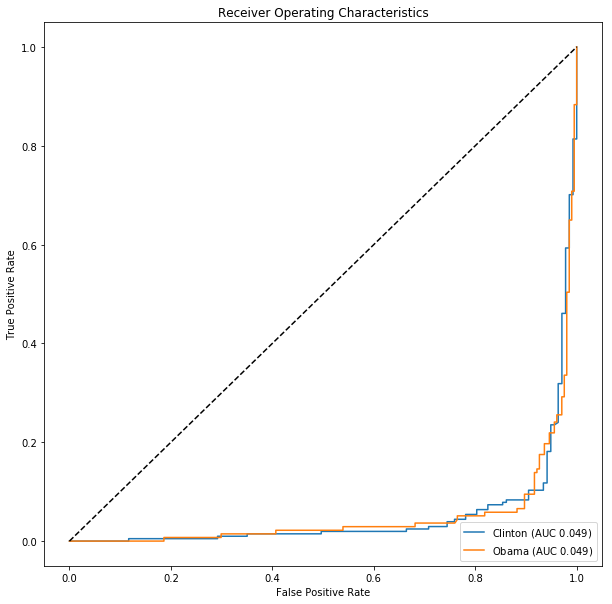

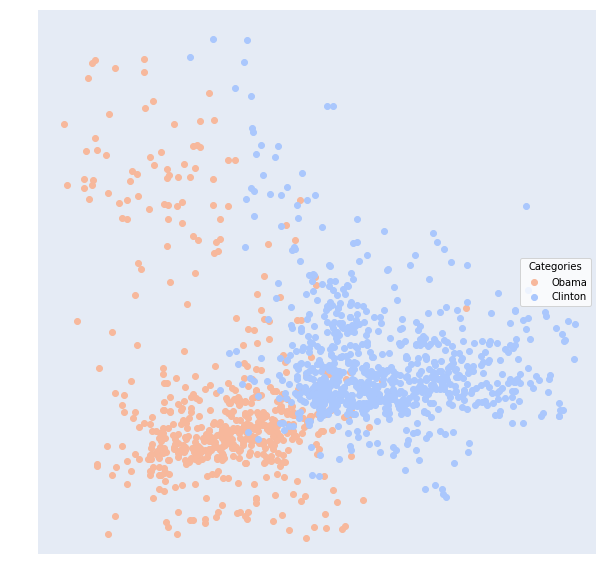

K-Nearest Neighbors with 5 neighbors:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.863335           0.764030    0.131965   0.833333  0.839416
Clinton   0.863335           0.858548    0.131965   0.891626  0.887255


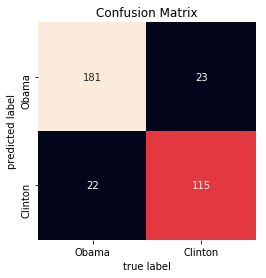

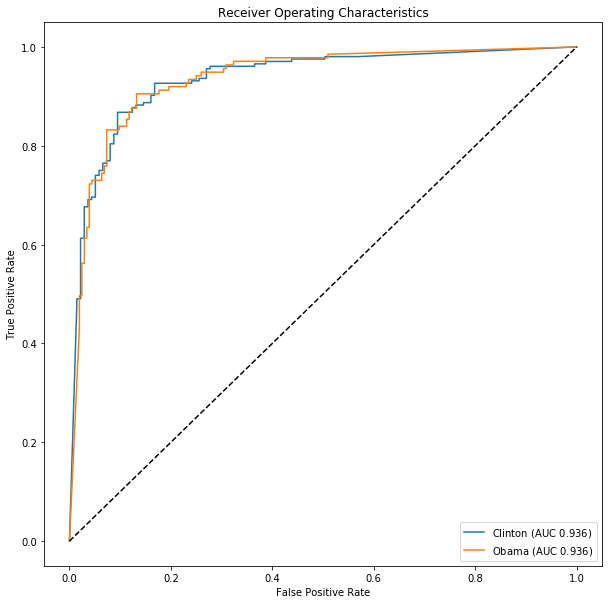

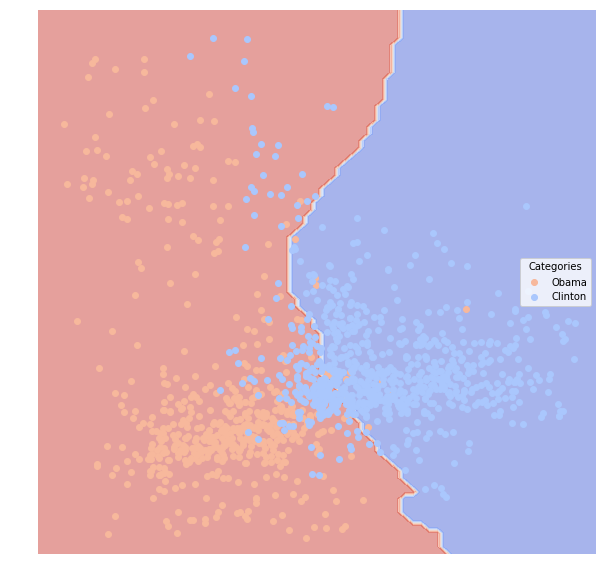

Logistic Regression:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.956204           0.947599    0.035191   1.000000  0.912409
Clinton   0.956204           0.944444    0.035191   0.944444  1.000000


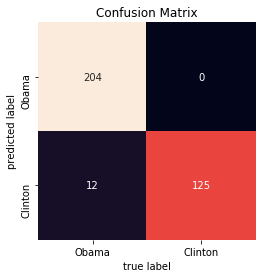

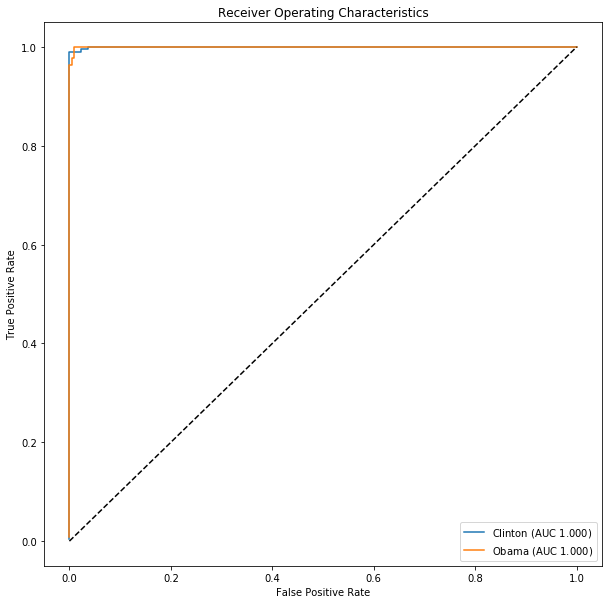

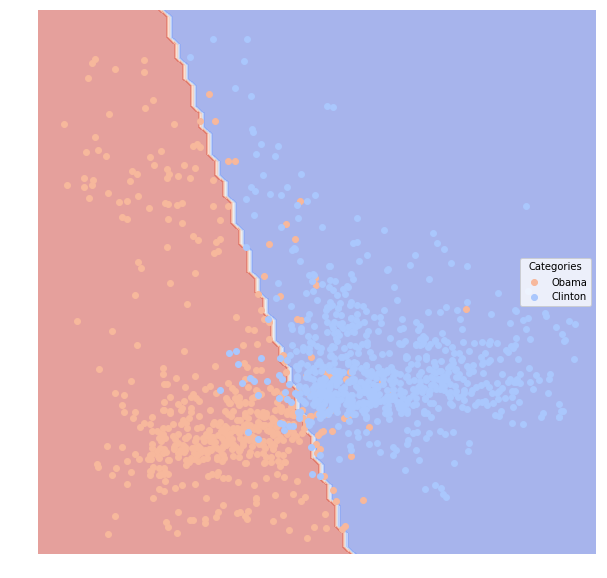

Decision Tree:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
Obama     0.99635           0.995633    0.002933   1.000000  0.992701
Clinton   0.99635           0.995122    0.002933   0.995122  1.000000


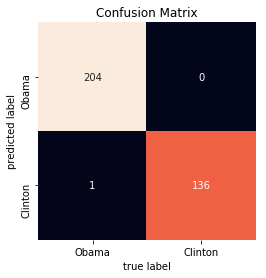

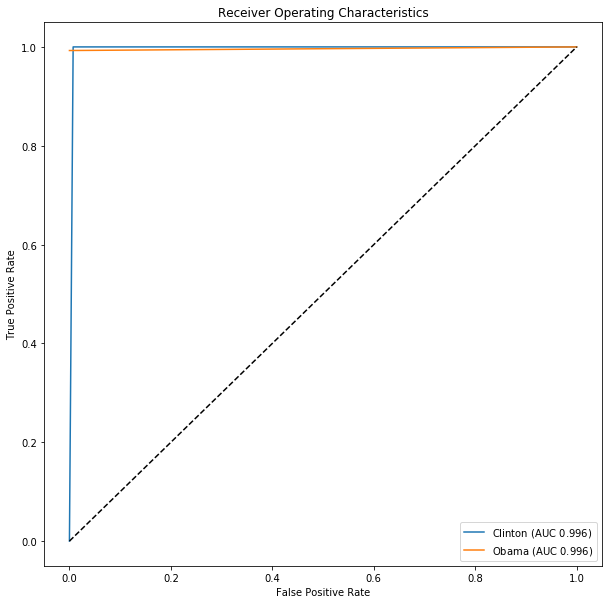

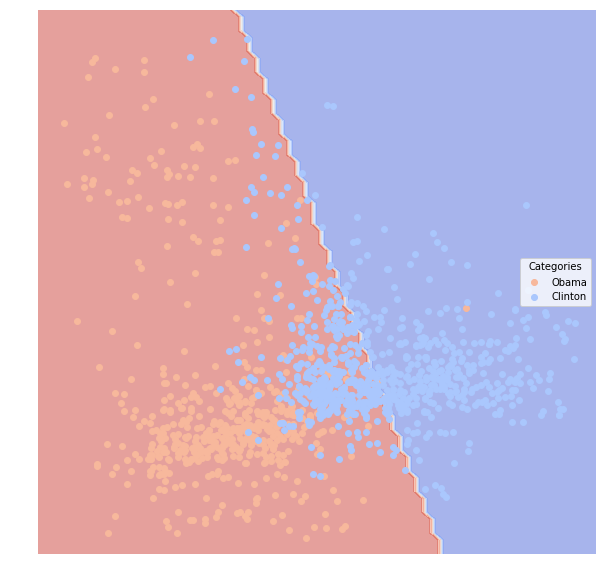

Random Forest:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.992701           0.991267    0.005865   1.000000  0.985401
Clinton   0.992701           0.990291    0.005865   0.990291  1.000000


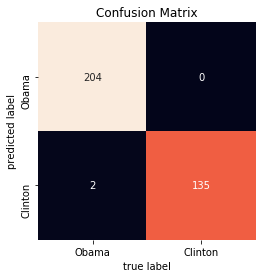

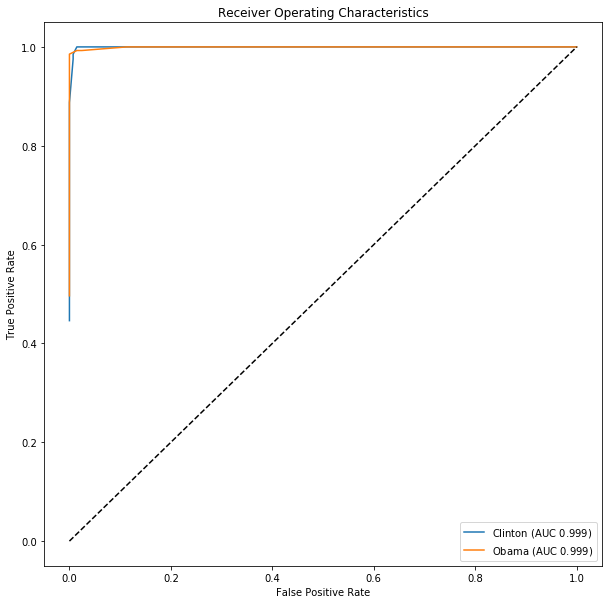

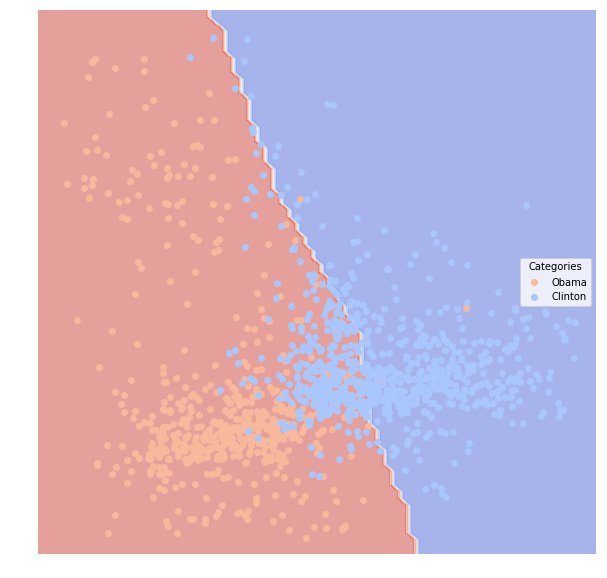

Neural Network (Multi-layer Perceptron):
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
Obama     0.946239           0.887476    0.055718   0.909722  0.956204
Clinton   0.946239           0.945882    0.055718   0.969543  0.936275


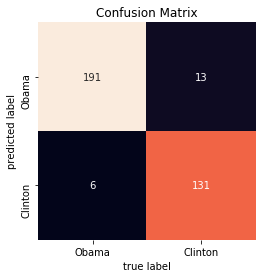

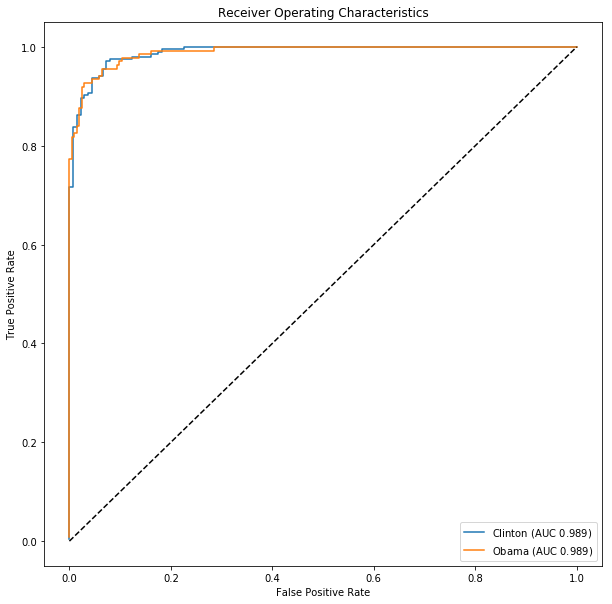

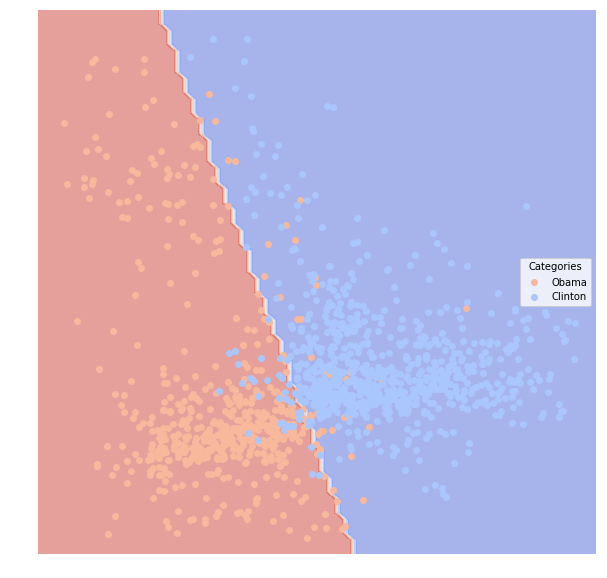

Gradient Boosting:
              AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                             
Obama     0.99635           0.995633    0.002933   1.000000  0.992701
Clinton   0.99635           0.995122    0.002933   0.995122  1.000000


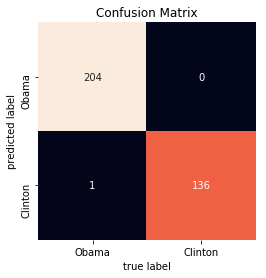

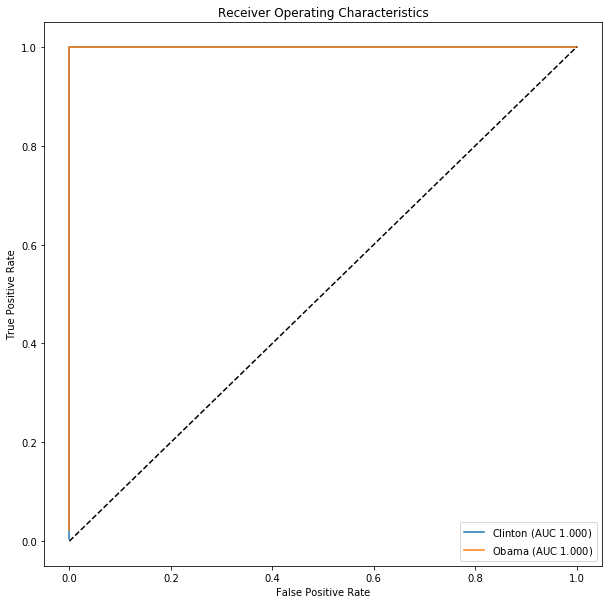

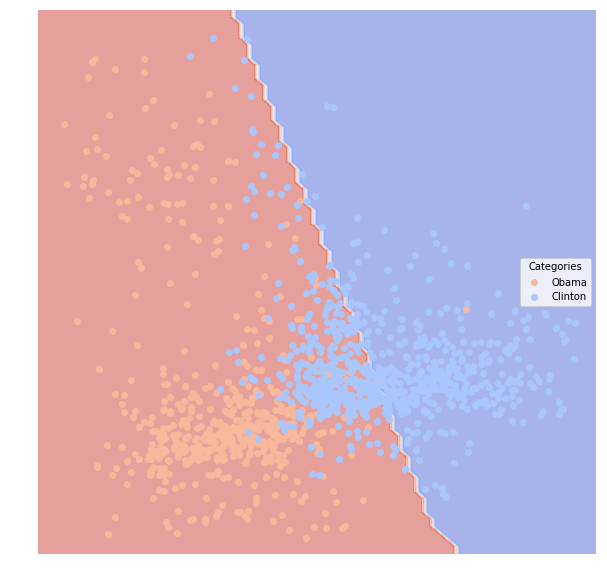

AdaBoost with 100 weak classifiers:
          AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                       
Obama     1.0                1.0         0.0        1.0     1.0
Clinton   1.0                1.0         0.0        1.0     1.0


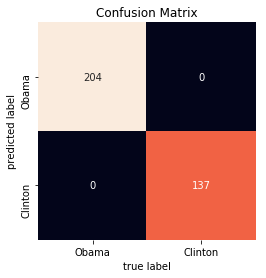

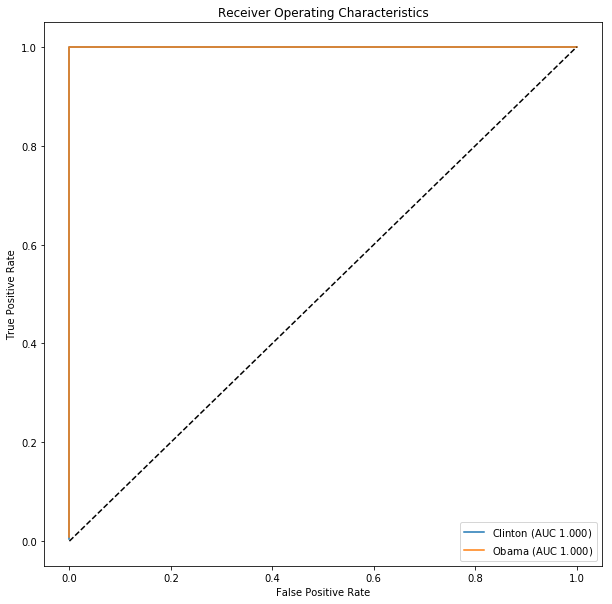

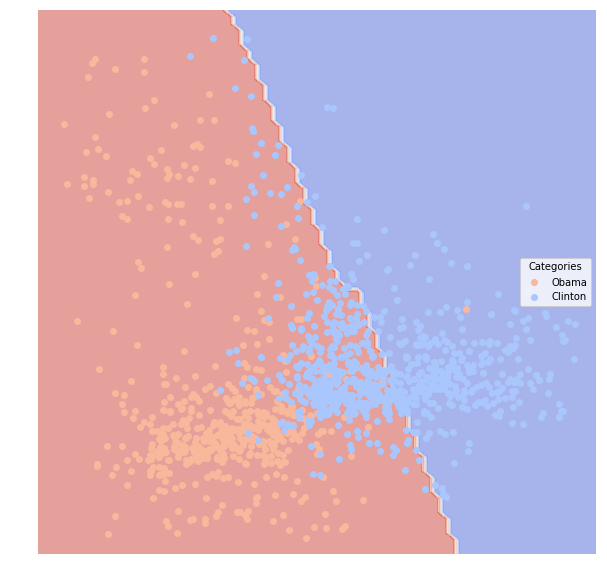

In [62]:
# empirical dataset 3: Senate press releases "classified" by Senator (2 senators)
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateSmall())
classify_data(dfTrain, dfTest)

Loading senator: Kennedy
Loading senator: Kerry
Loading senator: Klobuchar
Loading senator: Kohl
Loading senator: Kyl
Converting to vectors
Gaussian Naive Bayes:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kerry      0.750183           0.524601    0.174359   0.705202  0.589372
Kyl        0.709701           0.491746    0.088462   0.960784  0.422414
Klobuchar  0.785078           0.556821    0.041026   0.904762  0.575758
Kohl       0.699165           0.426048    0.062821   0.911765  0.402597
Kennedy    0.749925           0.581119    0.282051   0.597917  0.914013


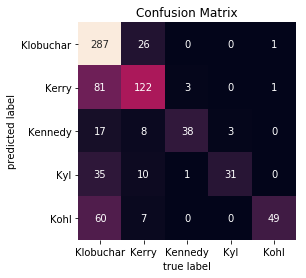

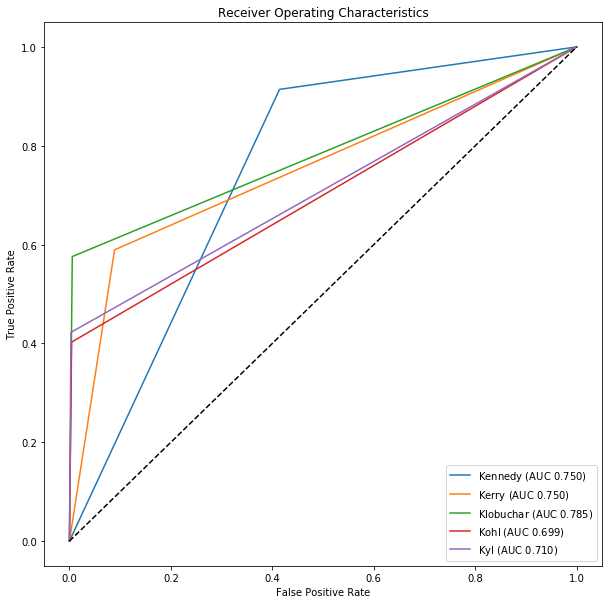

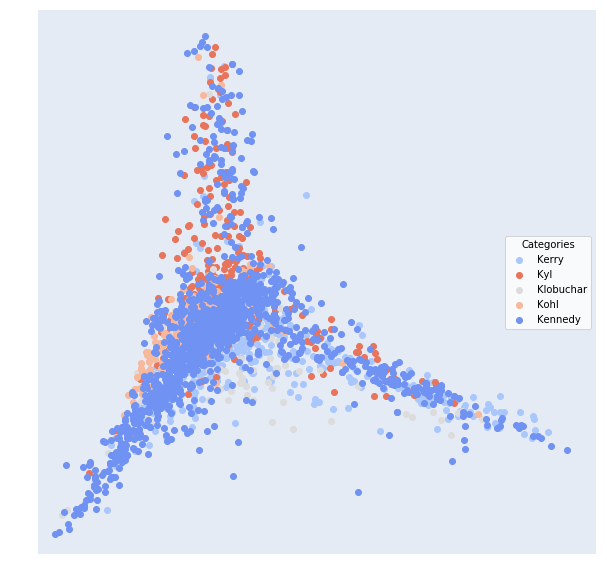

Support Vector Machine with linear kernel:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kerry      0.973898           0.944501    0.017949   0.975369  0.956522
Kyl        0.982759           0.970645    0.005128   1.000000  0.965517
Klobuchar  0.984848           0.972261    0.002564   1.000000  0.969697
Kohl       0.987013           0.976590    0.002564   1.000000  0.974026
Kennedy    0.976463           0.943935    0.025641   0.950920  0.987261


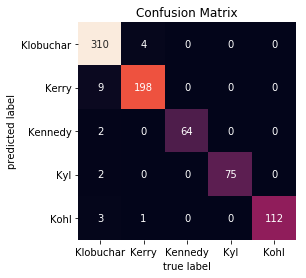

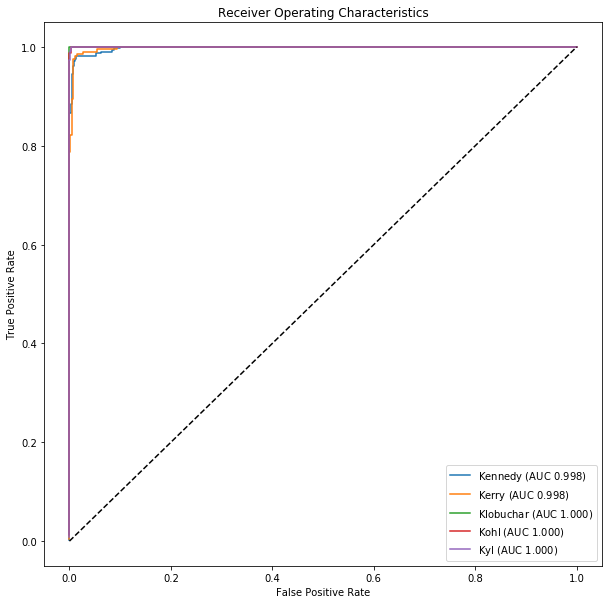

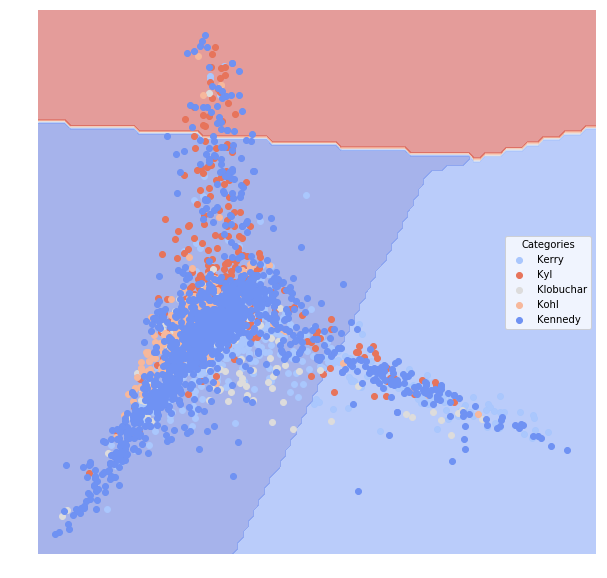

Support Vector Machine with 3 degree polynomial kernel:


/Users/yiqingzhu/anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


           AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                        
Kerry      0.5           0.265385    0.265385   0.000000     0.0
Kyl        0.5           0.148718    0.148718   0.000000     0.0
Klobuchar  0.5           0.084615    0.084615   0.000000     0.0
Kohl       0.5           0.098718    0.098718   0.000000     0.0
Kennedy    0.5           0.402564    0.597436   0.402564     1.0


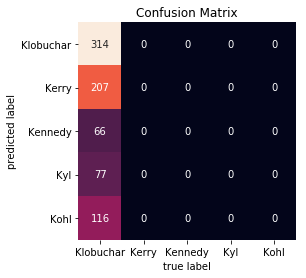

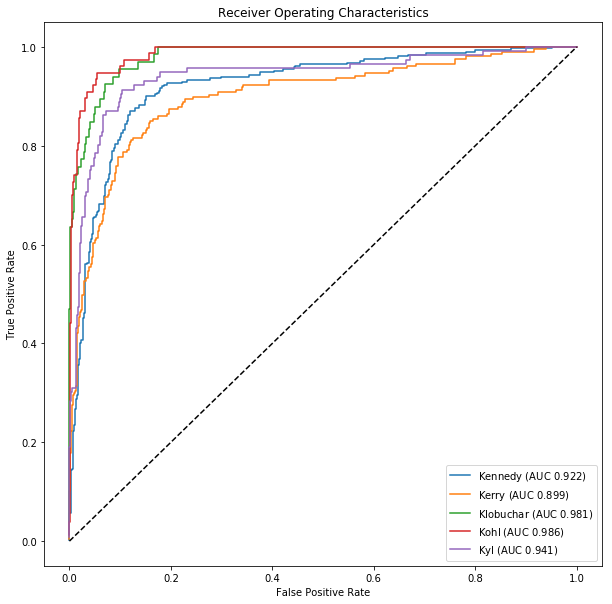

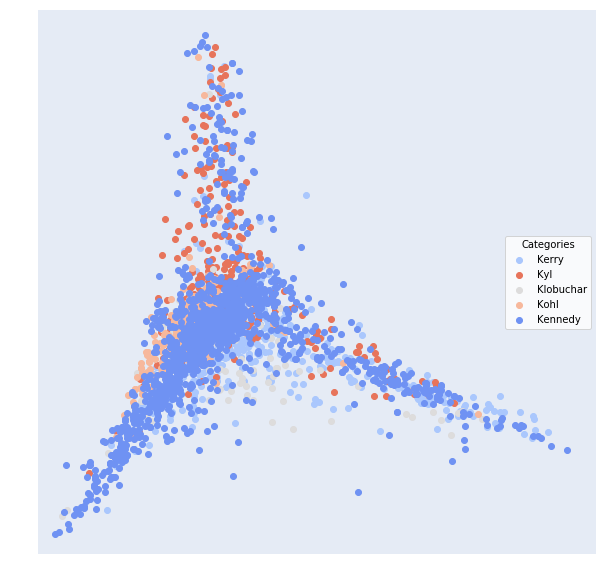

K-Nearest Neighbors with 5 neighbors:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kerry      0.754685           0.559213    0.156410   0.785235  0.565217
Kyl        0.773395           0.557579    0.076923   0.878378  0.560345
Klobuchar  0.881462           0.698698    0.028205   0.879310  0.772727
Kohl       0.844959           0.640296    0.039744   0.870968  0.701299
Kennedy    0.817385           0.658569    0.206410   0.675057  0.939490


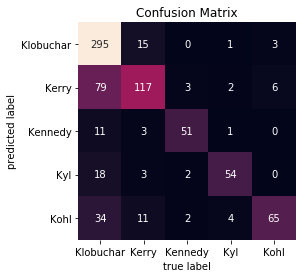

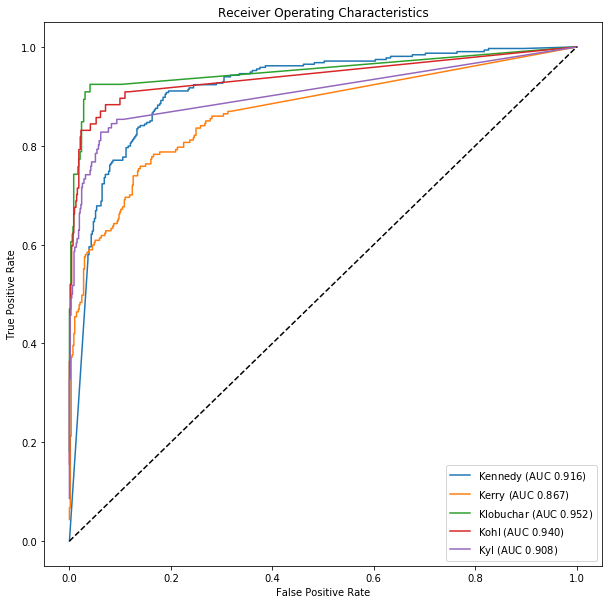

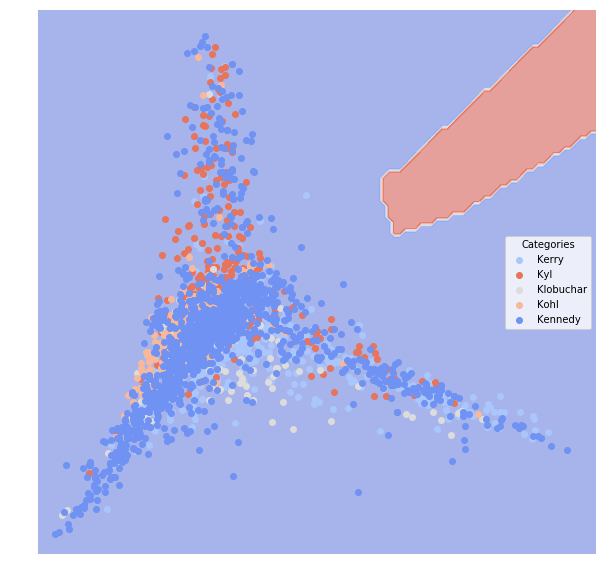

Logistic Regression:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kerry      0.942295           0.888420    0.037179   0.958763  0.898551
Kyl        0.943966           0.904598    0.016667   1.000000  0.887931
Klobuchar  0.962121           0.930653    0.006410   1.000000  0.924242
Kohl       0.974026           0.953180    0.005128   1.000000  0.948052
Kennedy    0.949120           0.877699    0.057692   0.885387  0.984076


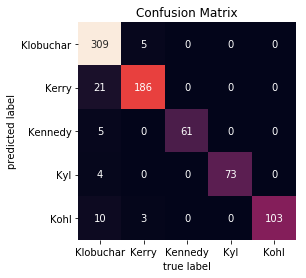

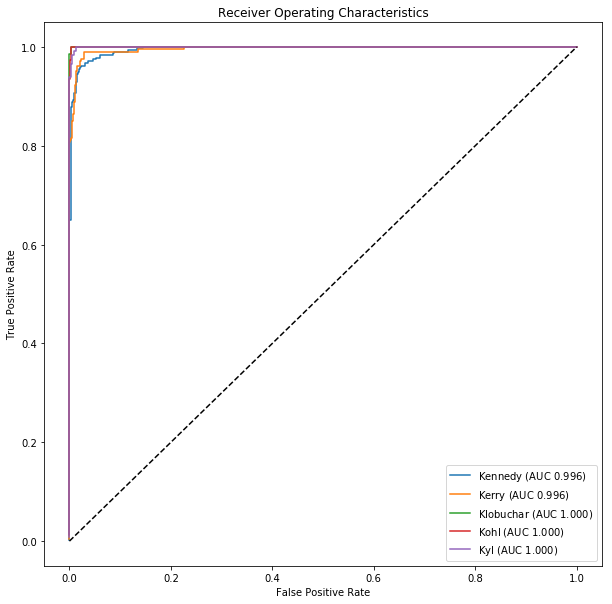

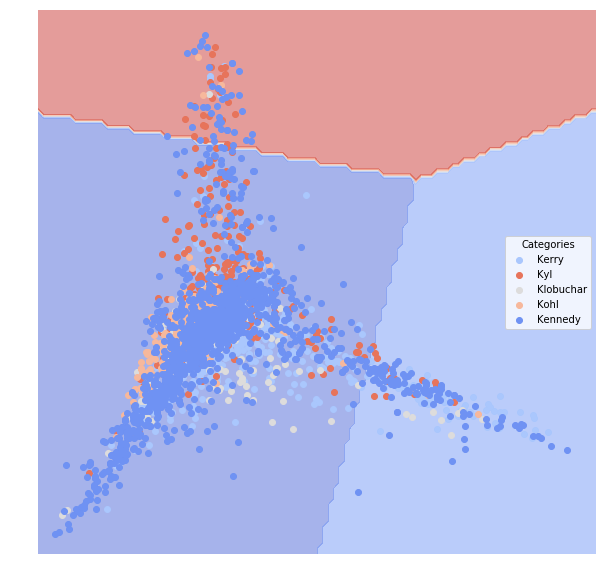

Decision Tree:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kerry      0.997585           0.996451    0.001282   1.000000  0.995169
Kyl        0.992678           0.959338    0.006410   0.966387  0.991379
Klobuchar  0.977273           0.958392    0.003846   1.000000  0.954545
Kohl       0.997866           0.962500    0.003846   0.962500  1.000000
Kennedy    0.988819           0.981024    0.010256   0.990385  0.984076


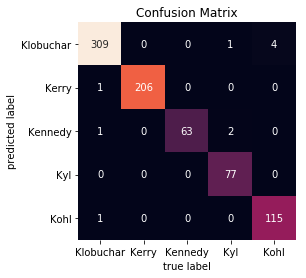

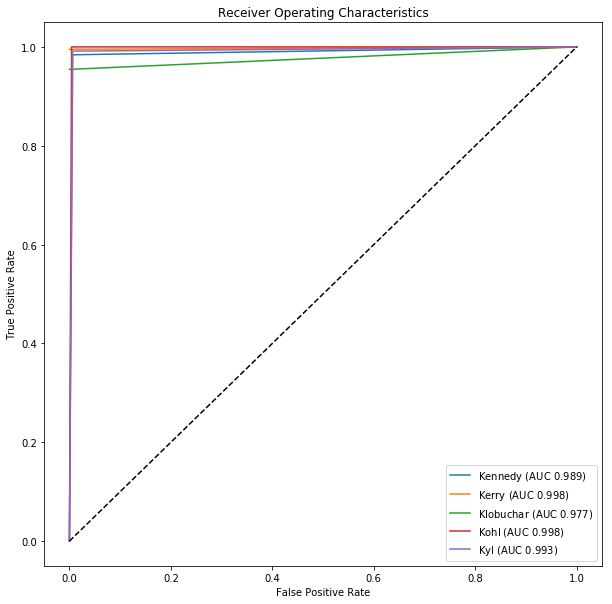

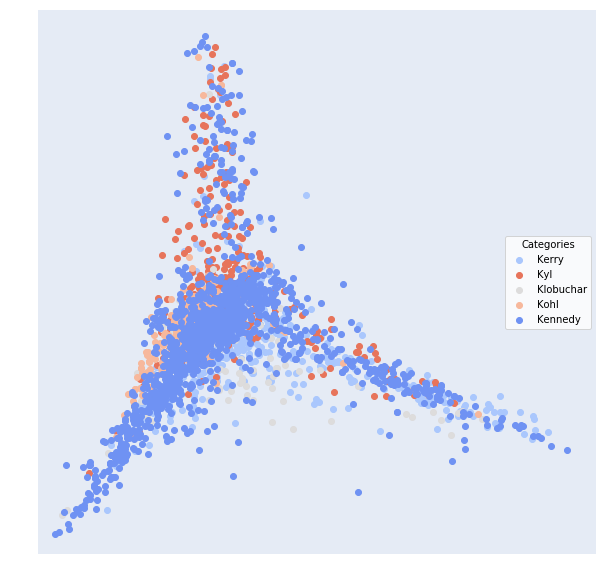

Random Forest:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kerry      0.977186           0.952666    0.015385   0.980296  0.961353
Kyl        0.995690           0.992661    0.001282   1.000000  0.991379
Klobuchar  0.954545           0.916783    0.007692   1.000000  0.909091
Kohl       0.992795           0.975477    0.002564   0.987013  0.987013
Kennedy    0.982867           0.956449    0.019231   0.960000  0.993631


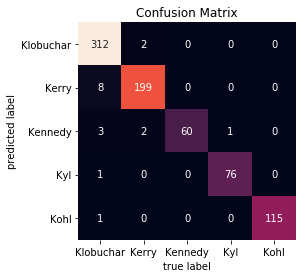

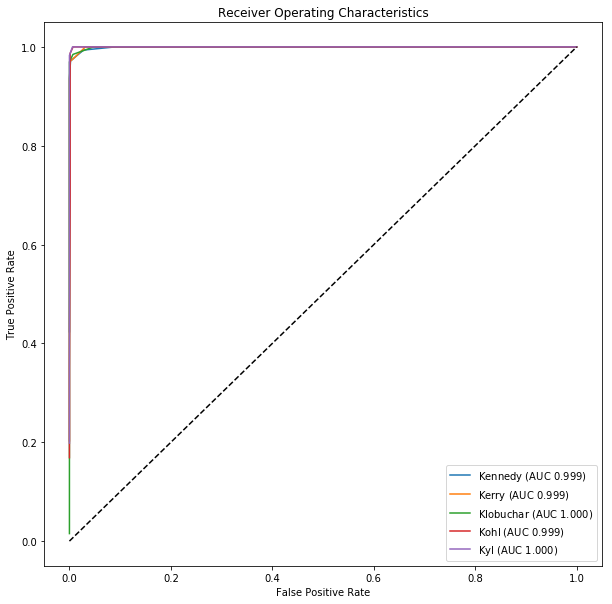

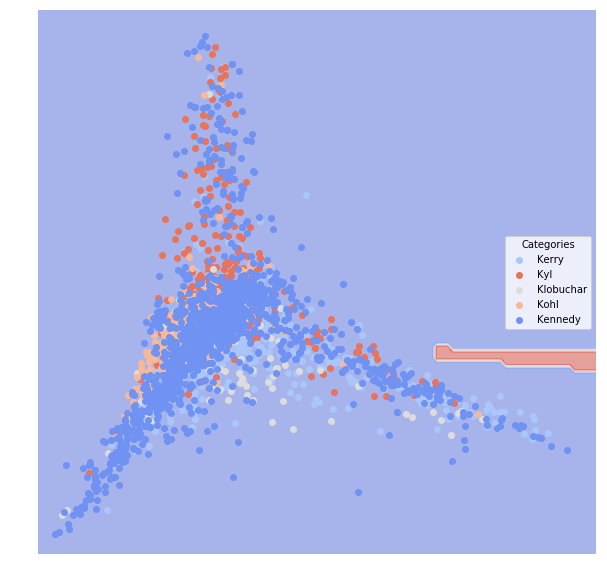

Neural Network (Multi-layer Perceptron):
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kerry      0.944508           0.882369    0.038462   0.944724  0.908213
Kyl        0.977695           0.954763    0.007692   0.991071  0.956897
Klobuchar  0.961421           0.915746    0.007692   0.983871  0.924242
Kohl       0.992084           0.962987    0.003846   0.974359  0.987013
Kennedy    0.954587           0.902812    0.047436   0.920973  0.964968


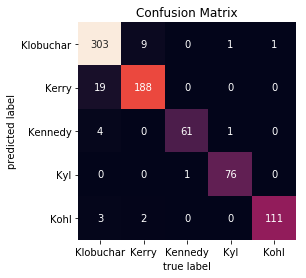

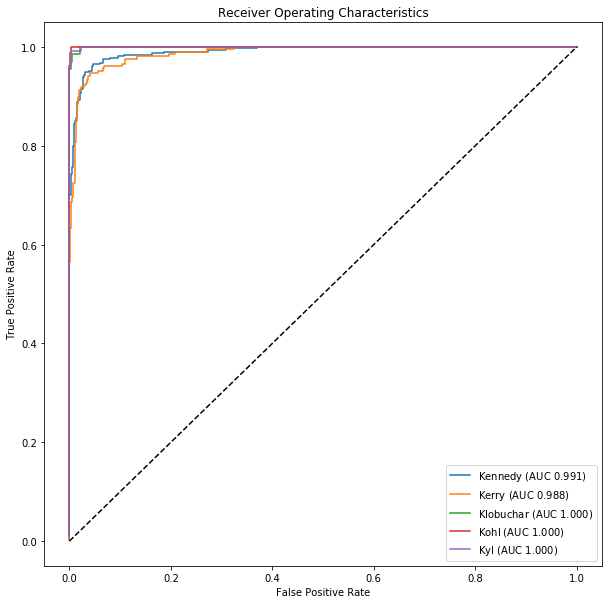

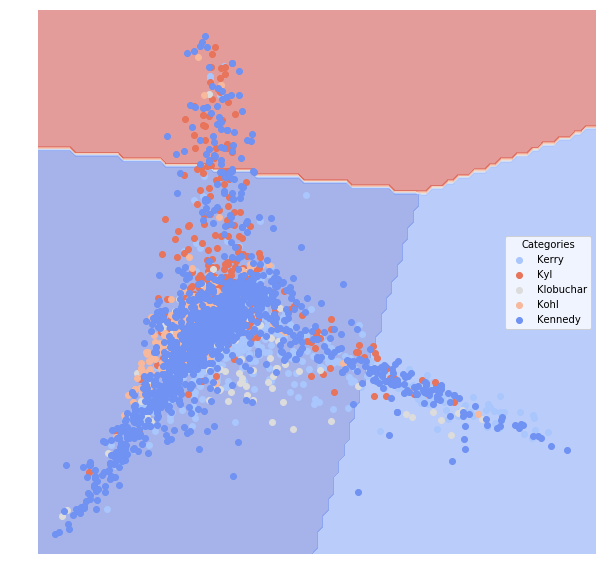

Gradient Boosting:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kerry      0.997585           0.996451    0.001282   1.000000  0.995169
Kyl        1.000000           1.000000    0.000000   1.000000  1.000000
Klobuchar  0.992424           0.986131    0.001282   1.000000  0.984848
Kohl       0.993506           0.988295    0.001282   1.000000  0.987013
Kennedy    0.996781           0.990536    0.003846   0.990536  1.000000


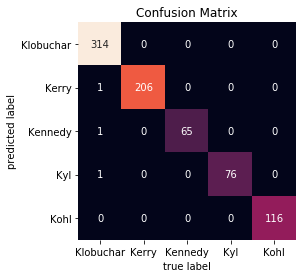

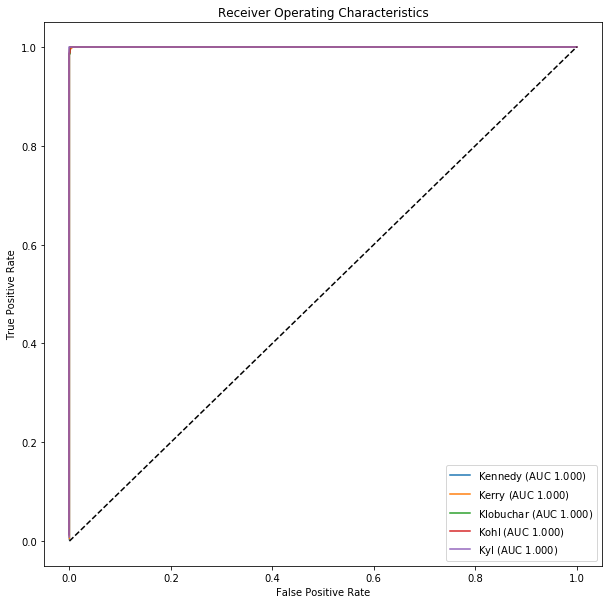

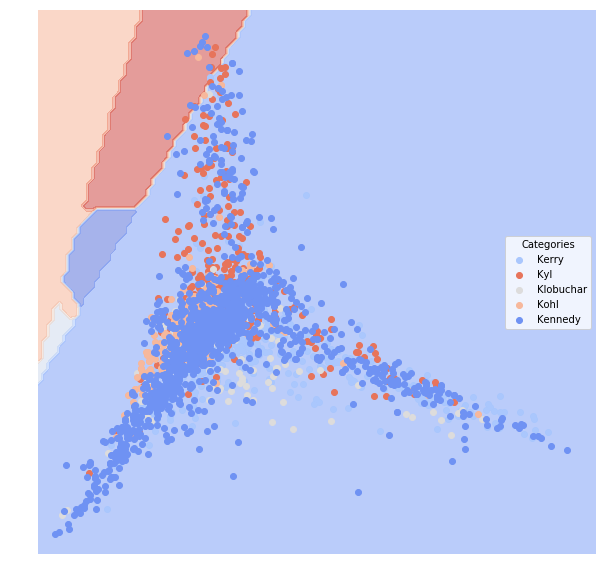

AdaBoost with 100 weak classifiers:
                AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                               
Kerry      0.997585           0.996451    0.001282   1.000000  0.995169
Kyl        0.982681           0.834532    0.029487   0.834532  1.000000
Klobuchar  0.961421           0.915746    0.007692   0.983871  0.924242
Kohl       0.984168           0.927272    0.007692   0.949367  0.974026
Kennedy    0.968153           0.961947    0.025641   1.000000  0.936306


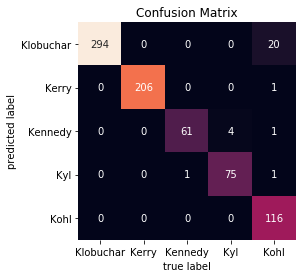

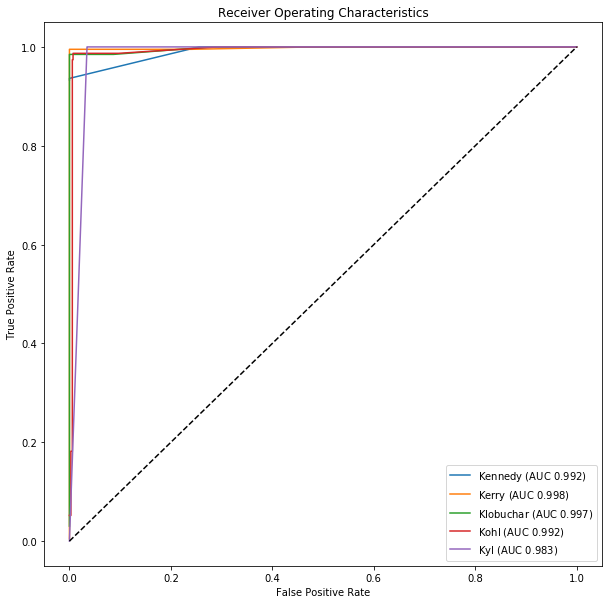

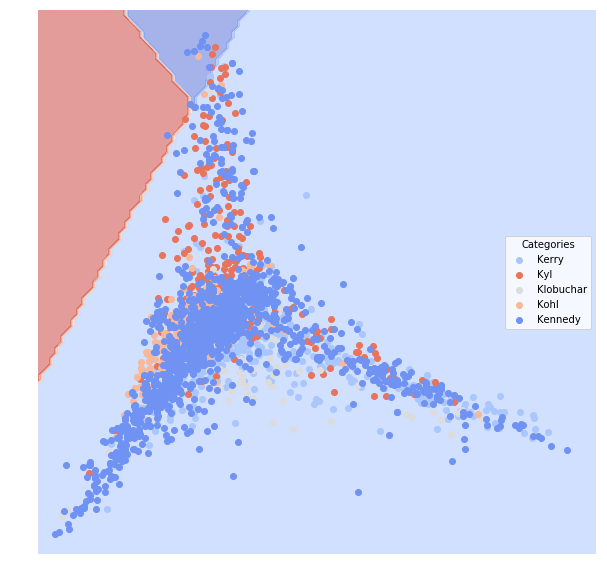

In [63]:
# empirical dataset 4: Senate press releases "classified" by Senator (5 senators)
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSenateLarge())
classify_data(dfTrain, dfTest)

Loading Spam
Loading Ham
Converting to vectors
Gaussian Naive Bayes:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.812808           0.941492    0.171053   0.958743  0.835616
spam      0.812808           0.387330    0.171053   0.451429  0.790000


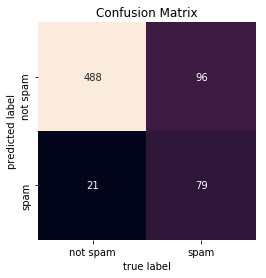

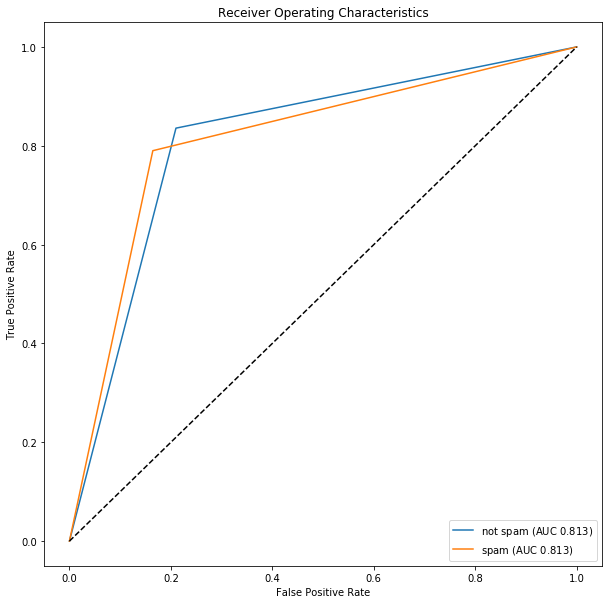

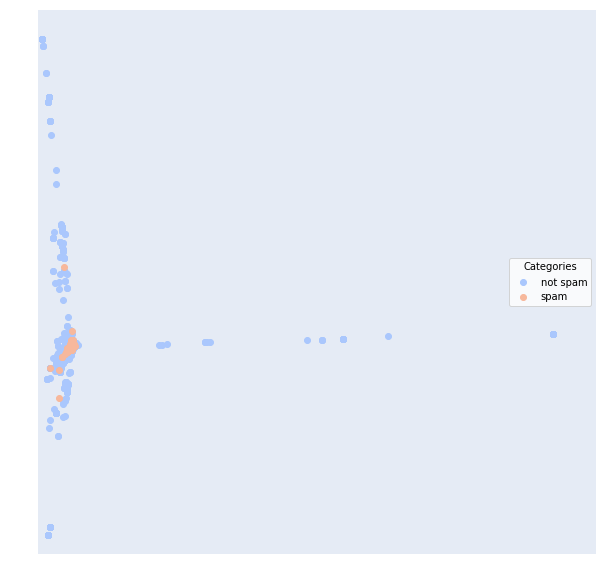

Support Vector Machine with linear kernel:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.736438           0.917294    0.089181   0.918400  0.982877
spam      0.736438           0.481511    0.089181   0.830508  0.490000


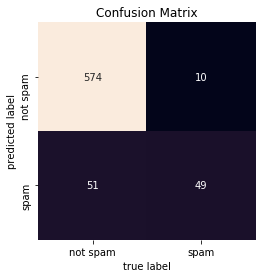

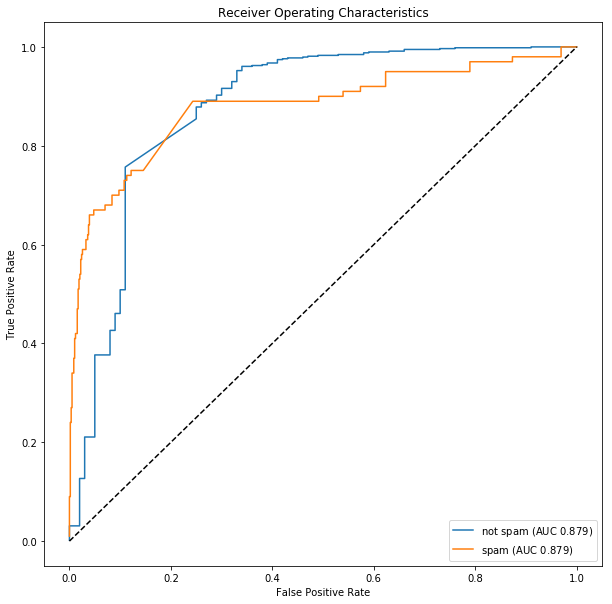

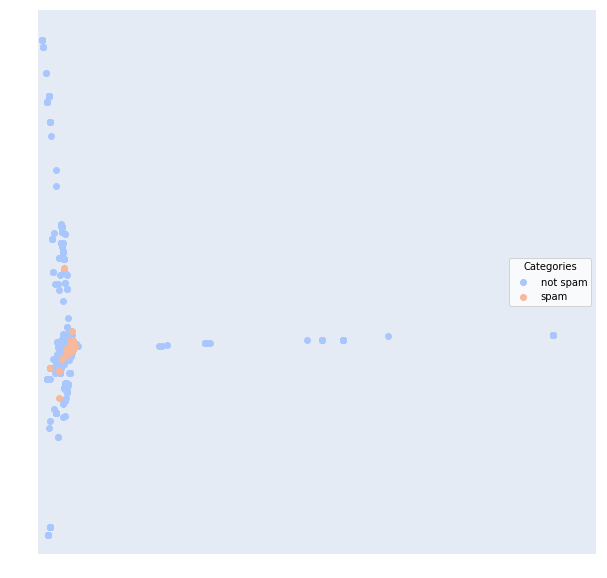

Support Vector Machine with 3 degree polynomial kernel:


/Users/yiqingzhu/anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


          AUC  Average_Precision  Error_Rate  Precision  Recall
Category                                                       
not spam  0.5           0.853801    0.146199   0.853801     1.0
spam      0.5           0.146199    0.146199   0.000000     0.0


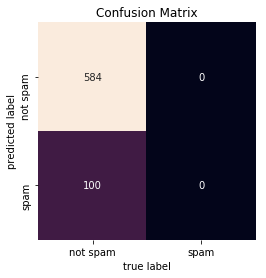

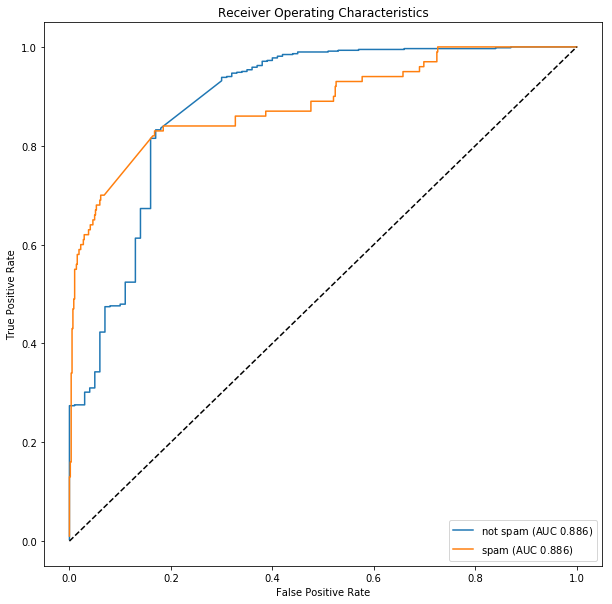

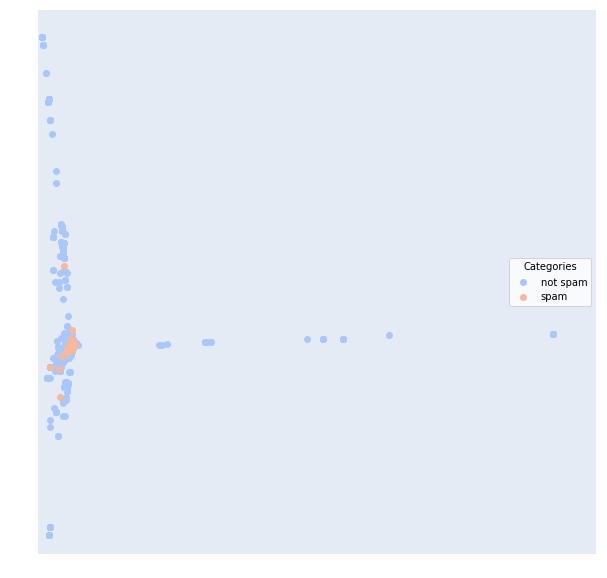

K-Nearest Neighbors with 5 neighbors:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.738151           0.917772    0.086257   0.918660  0.986301
spam      0.738151           0.495789    0.086257   0.859649  0.490000


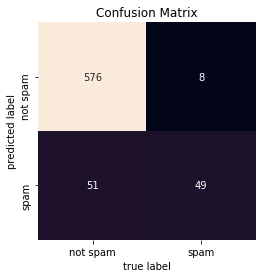

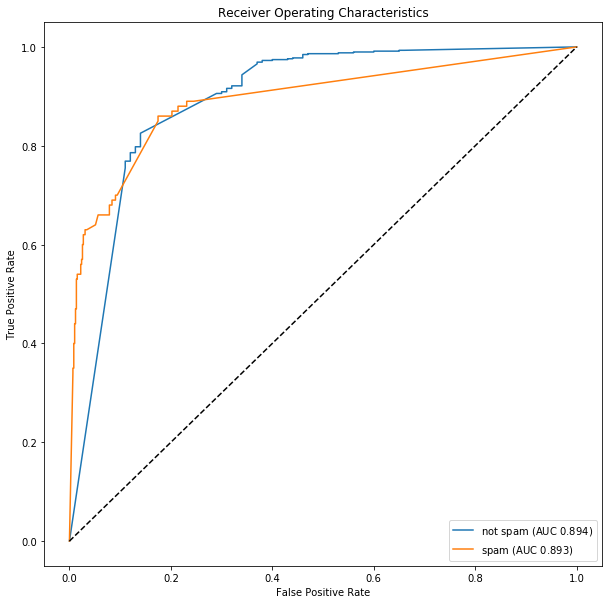

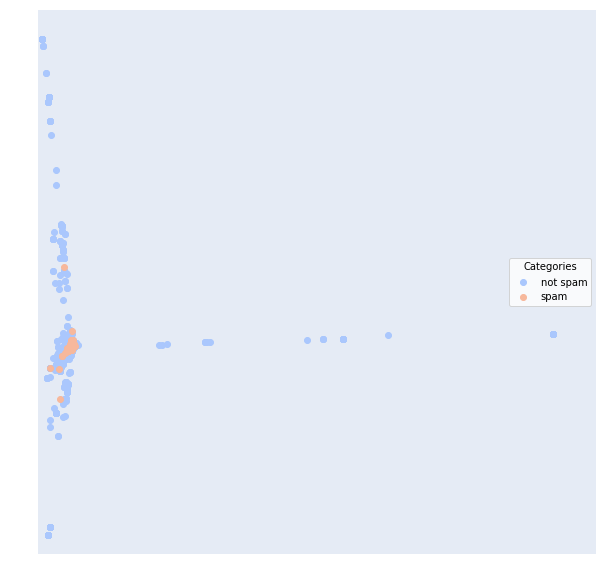

Logistic Regression:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.623288           0.885735    0.112573   0.885845  0.996575
spam      0.623288           0.341131    0.112573   0.925926  0.250000


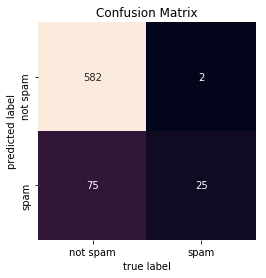

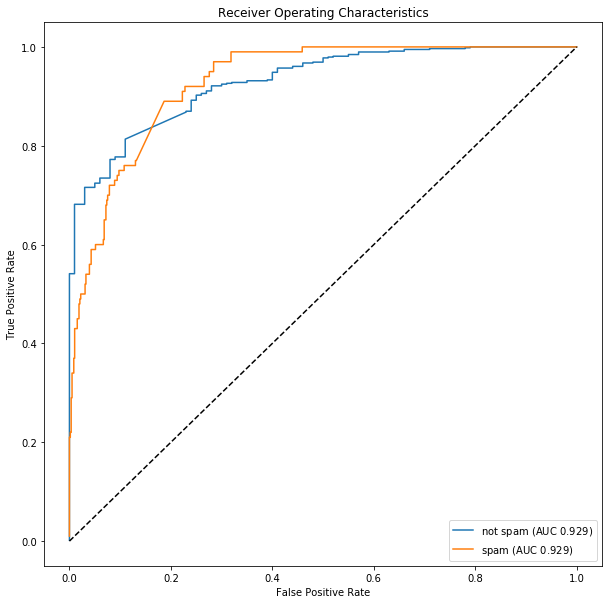

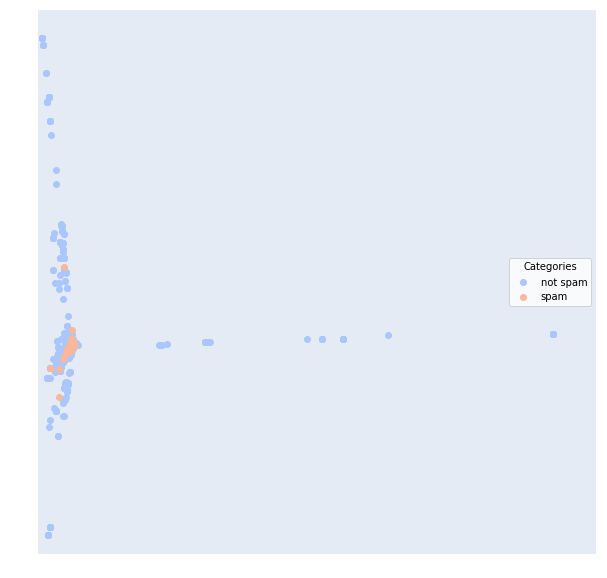

Decision Tree:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.781884           0.930830    0.096491   0.934564  0.953767
spam      0.781884           0.479858    0.096491   0.693182  0.610000


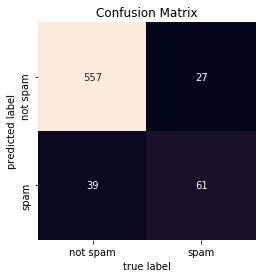

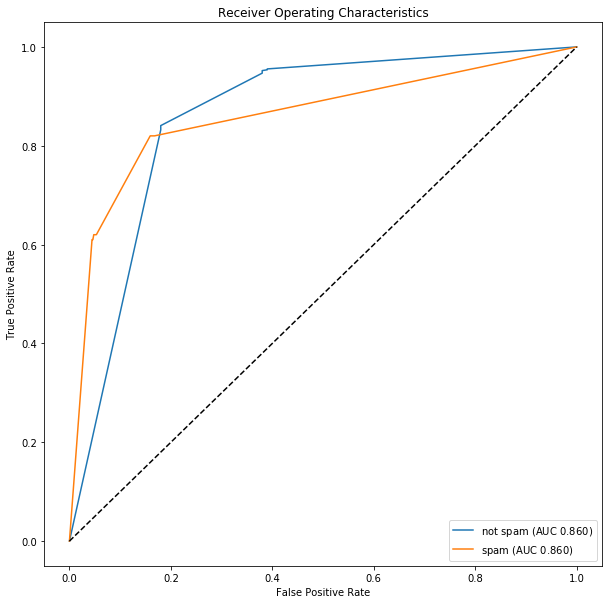

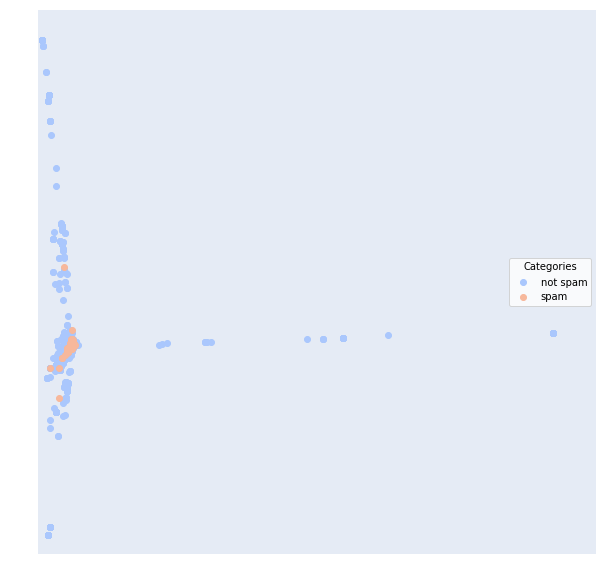

Random Forest:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.779589           0.930030    0.086257   0.932455  0.969178
spam      0.779589           0.512019    0.086257   0.766234  0.590000


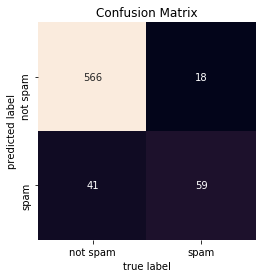

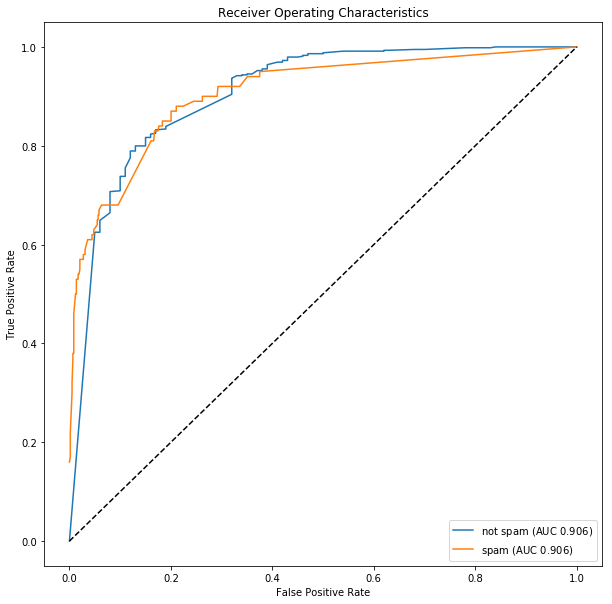

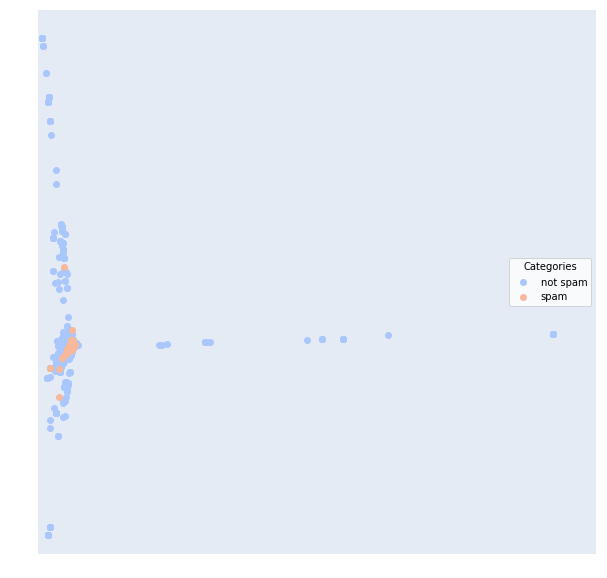

Neural Network (Multi-layer Perceptron):
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.800171           0.936364    0.093567   0.940678  0.950342
spam      0.800171           0.500638    0.093567   0.691489  0.650000


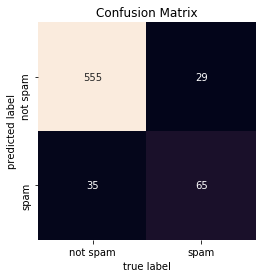

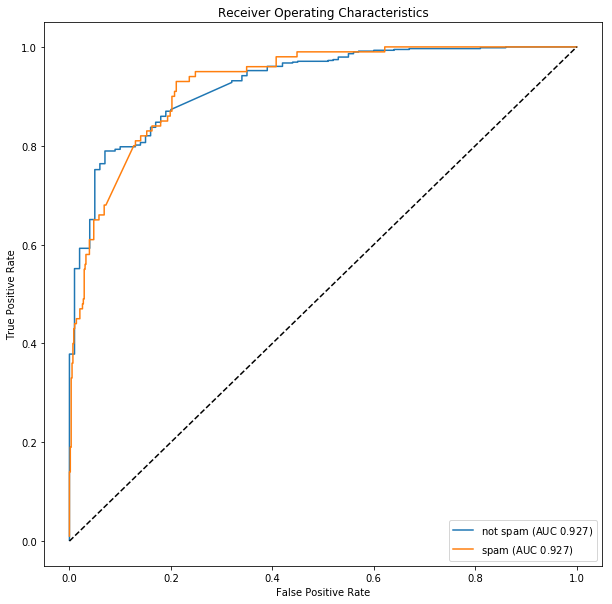

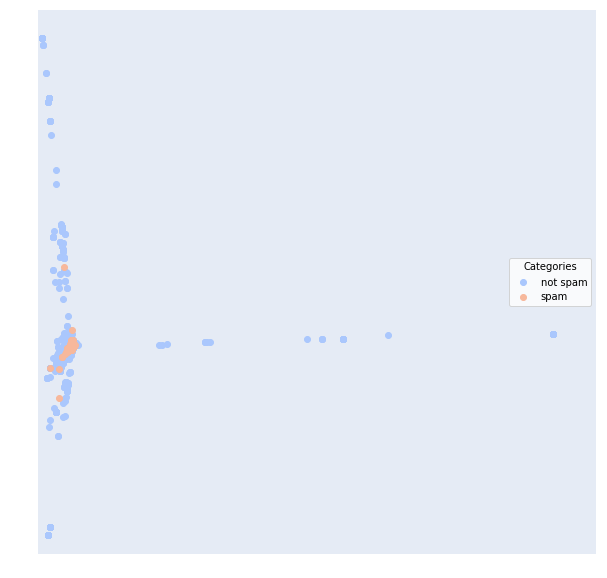

Gradient Boosting:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.628288           0.887081    0.111111   0.887195  0.996575
spam      0.628288           0.349616    0.111111   0.928571  0.260000


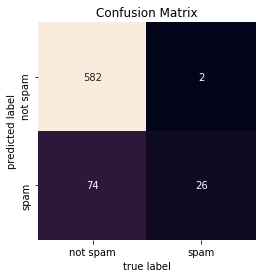

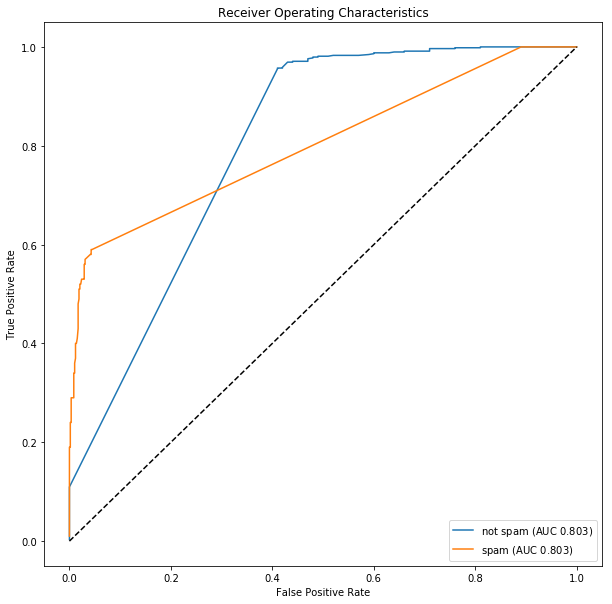

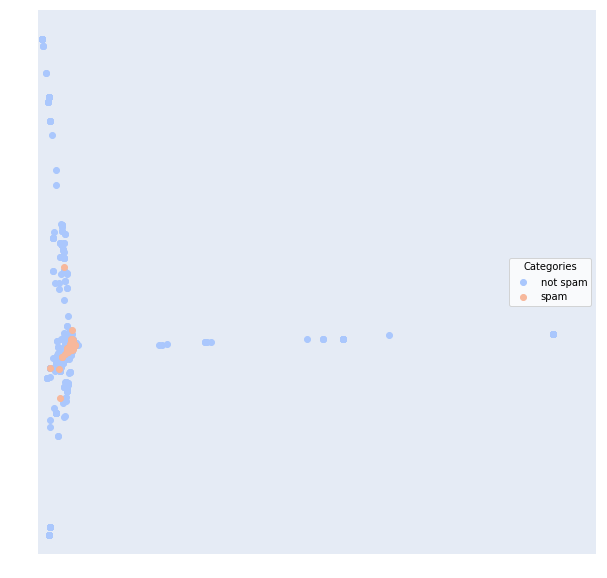

AdaBoost with 100 weak classifiers:
               AUC  Average_Precision  Error_Rate  Precision    Recall
Category                                                              
not spam  0.762021           0.924862    0.095029   0.927512  0.964041
spam      0.762021           0.471600    0.095029   0.727273  0.560000


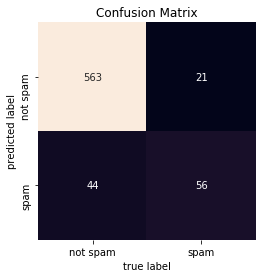

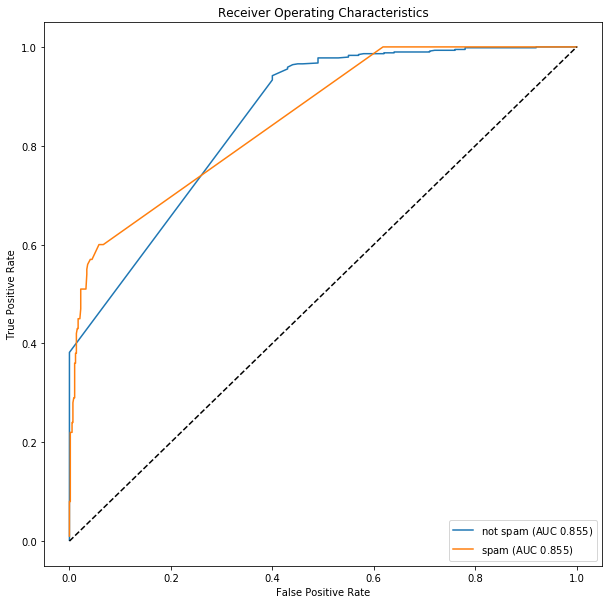

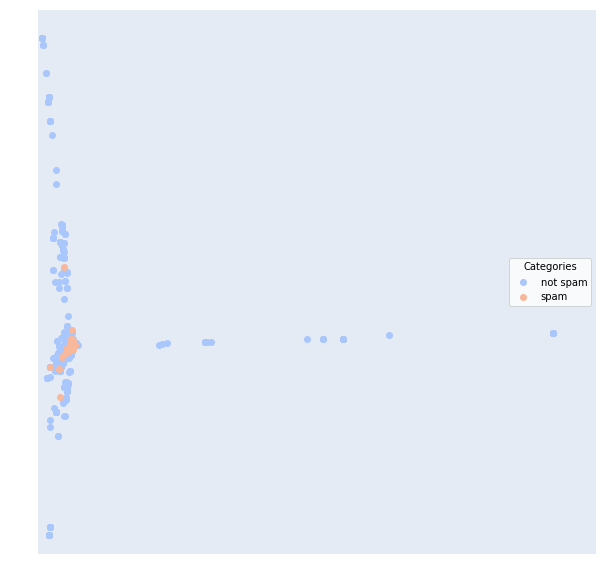

In [64]:
# empirical dataset 5: Emails classified as Spam or Ham
dfTrain, dfTest = lucem_illud.trainTestSplit(lucem_illud.loadSpam())
classify_data(dfTrain, dfTest)

As we can observe, for the Reddit data, logistic regression performs the best, and SVM with linear kernel, KNN, multi-layer perceptron, and gradient boosting also work particularly well. This is probably because the categories in this dataset are quite linearly separable with clear-cut boundaries, thus, these models appropriate for linear classification work well.

For the News Groups data, SVM with linear kernel performs the best, logistic regression and multi-layer perceptron also perform well. This indicates that the categories in this dataset are linearly separable but with more noise, which might account for that the models don’t perform as good for Reddit dataset as for this one. 

For the small Senate Press Release data, random forest performs the best, gradient boosting, decision tree, SVM with linear kernel, and multi-layer perceptron can also predict the categories very accurately. This is because the two categories are split with clear-cut boundaries, thus, many methods especially those with good abilities to decrease the variance perform very well.

For the large Senate Press Release data, gradient boosting performs the best, SVM with linear kernel, decision tree, random forest, logistic regression and multi-layer perceptron can also predict the categories very accurately. Similar to the small Senate Press Release data, this dataset contains categories with clear-cut boundaries and some noise, thus, high-dimensional models with efforts to decrease the variance should work better.

For the Email data, multi-layer perceptron performs the best, with 0.8 AUC for both categories. Compared to nearly 1.0 AUC for previous datasets, this dataset must have non-linearly separable data and much noise.

Strech:

The new classifier I have implemented is AdaBoost.

Take artificially dataset 7 as an example. AdaBoost works slightly better than gradient boosting, random forest, decision tree, KNN, much better than logistic regression, SVM with polynomial kernel, SVM with linear kernel, but slightly worse than multi-layer perceptron, gaussian naive bayes. Since the dataset obtains much noise and AdaBoost, similar to gradient boosting and random forest, is developed to deal with high variant datasets, it makes sense that it works similar to gradient boosting and random forest. Since the true decision boundary in this dataset is close to a rectangular and the two categories follows gaussian distribution in higher dimension, it makes sense that AdaBoost which makes no assumption about the distribution of data, works similar to decision tree, multi-layer perceptron, gaussian naive bayes, and works much better than logistic regression, SVM with polynomial kernel, and SVM with linear kernel, which require certain, and wrong in this case, distribution of the data. Since the two categories are very aggregated, it makes sense that KNN performs similar to AdaBoost. 

Take empirical dataset 3 as an example. AdaBoost performs perfectly on this dataset with error rate 0.0. It performs better than gradient boosting, random forest, decision tree, SVM with linear kernel, multi-layer perceptron, logistic regression, much better than KNN, gaussian naive bayes, SVM with 3 degree polynomial kernel. Since as we discussed above, the dataset obtains two categories with clear-cut boundaries, thus many methods perform very well on this dataset, and AdaBoost, great for its ability in variance decreasing, performs particularly well. Since the data is quite isolated, and does not follow Gaussian distribution or separated by 3 degree polynomial, thus, AdaBoost performs much better than them.

# Clinton / Obama Press Releases

We often will not have nicely prepared data, so we will work though the proccess of cleaning and structuring in more detail here:

While the Clinton and Obama Senatorial Press Releases are not hand-coded, we can imagine that we have been given a stack of such press releases, but lost the metadata associated with which senatorial office issued which. If we label a few of them, how well can our classifier do at recovering the rest? 

In [65]:
ObamaClintonReleases = pandas.read_csv('../data/ObamaClintonReleases.csv', index_col=0)

Let's turn the 'targetSenator' column into a binary category variable.

In [66]:
ObamaClintonReleases['category'] = [s == 'Obama' for s in ObamaClintonReleases['targetSenator']]

Tokenize and normalize

In [67]:
ObamaClintonReleases['tokenized_text'] = ObamaClintonReleases['text'].apply(lambda x: nltk.word_tokenize(x))
ObamaClintonReleases['normalized_text'] = ObamaClintonReleases['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, stopwordLst = lucem_illud.stop_words_basic, stemmer = lucem_illud.stemmer_basic))

Let's split the data into training data and testing data.

In [68]:
holdBackFraction = .2
train_data_df, test_data_df = lucem_illud.trainTestSplit(ObamaClintonReleases, holdBackFraction=holdBackFraction)

In [69]:
print(len(train_data_df))
print(len(test_data_df))

1368
341


## Logistic Regression

First, let's try with a logistic regression, which may be familiar to you from statistical methods classes. First, we must turn the training dataset into a tf-idf matrix (`lucem_illud.generateVecs()` will help with this but for now we are doing it the long way):

In [70]:
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_data_df['text'])

Note that we can use the CountVectorizer instead, which simply produces a matrix of word counts.

In [71]:
TFVects.shape

(1368, 11291)

We can save this in the dataframe to make things easier

In [72]:
train_data_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In a regression, we cannot have more variables than cases. So, we need to first do a dimension reduction. First, we will approah this with PCA. You have previously seen this in week 3. Here we are not concerned about visualization, but rather classification and so all principal components are calculated. Watch out: we have to use `stack` not `sum` for combining the vectors. We note that you could also use topic loading and embedding dimensions as featured variables.

In [73]:
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_data_df['vect'], axis=0))

We can store the PCA space vectors in the dataframe too:

In [74]:
train_data_df['pca'] = [r for r in reduced_data]

Visualization in 2D:

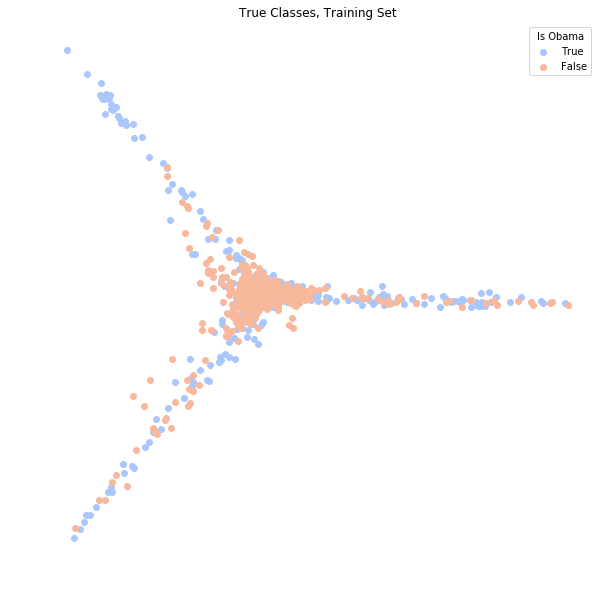

In [75]:
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot Obama
a = np.stack(train_data_df[train_data_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot not Obama
a = np.stack(train_data_df[train_data_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")
    
ax.legend(loc = 'upper right', title = 'Is Obama')
plt.title('True Classes, Training Set')
plt.show()

PCA cannot distinguish Obama very well. Let's perform a screeplot to see how many Principal Components we need.

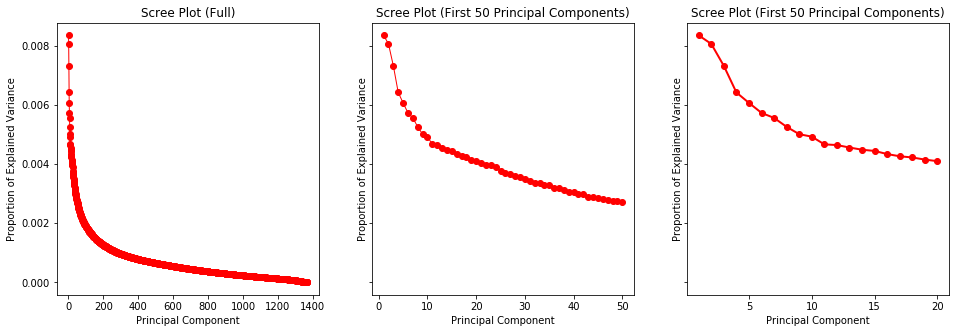

In [76]:
n = len(train_data_df)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 50 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

Let's choose the first 10 pricipal components as our covariates.

In [77]:
train_data_df['pca_reduced_10'] = train_data_df['pca'].apply(lambda x: x[:10])

Now we fit a logistic regression to our data.

In [78]:
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

Let's see how the logistic regression performs on the training dataset from which we develop the model. Unfortunately, the mean accuracy is only about 64%.

In [79]:
logistic.score(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

0.6593567251461988

How does it perform on the testing dataset, which we "held out" and did not use for model training? We need to repeat all the steps on the testing data, but without retraining:

In [80]:
#Create vectors
TFVects_test = TFVectorizer.transform(test_data_df['text'])
test_data_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_data_df['vect'], axis=0))
test_data_df['pca'] = [r for r in reduced_data_test]
test_data_df['pca_reduced_10'] = test_data_df['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(test_data_df['pca_reduced_10'], axis=0), test_data_df['category'])

0.6686217008797654

Slightly poorer. How about using more dimensions (40)?

In [81]:
train_data_df['pca_reduced_40'] = train_data_df['pca'].apply(lambda x: x[:40])
test_data_df['pca_reduced_40'] = test_data_df['pca'].apply(lambda x: x[:40])

logistic.fit(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_40'], axis=0), test_data_df['category']))

Training:
0.7448830409356725
Testing:
0.7331378299120235


Or still more (100)?

In [82]:
train_data_df['pca_reduced_100'] = train_data_df['pca'].apply(lambda x: x[:100])
test_data_df['pca_reduced_100'] = test_data_df['pca'].apply(lambda x: x[:100])

logistic.fit(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_100'], axis=0), test_data_df['category']))

Training:
0.8318713450292398
Testing:
0.7800586510263929


Or even more (200)!

In [83]:
train_data_df['pca_reduced_200'] = train_data_df['pca'].apply(lambda x: x[:200])
test_data_df['pca_reduced_200'] = test_data_df['pca'].apply(lambda x: x[:200])

logistic.fit(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_200'], axis=0), test_data_df['category']))

Training:
0.8728070175438597
Testing:
0.8005865102639296


This is becoming ridiculous (400)!

In [84]:
train_data_df['pca_reduced_400'] = train_data_df['pca'].apply(lambda x: x[:400])
test_data_df['pca_reduced_400'] = test_data_df['pca'].apply(lambda x: x[:400])

logistic.fit(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_400'], axis=0), test_data_df['category']))

Training:
0.9144736842105263
Testing:
0.8064516129032258


Increasing the number of covariates would overfit our data, and it seems that using a logistic regression, our prediction accuracy is at best about 65%. We can, however, try a logistic regression that uses the TF-IDF scores for each word, but with an L1 regularization or L1-norm loss function, which is also known as least absolute deviations (LAD), least absolute errors (LAE) or L1 penalty. It minimizes the sum of the absolute differences (S) between the target value ($Y_i$) and the estimated values ($f(x_i)$) and prunes all insignificant variables (i.e., word TF-IDF scores):

$S=\sum^n_{i=1}|y_i=f(x_i)|$

The result is a model retaining only the most individually significant features.

In [85]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l1')
logistic_l1.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])
print(logistic_l1.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))

0.8457602339181286


Train the model using training data, and then test it on the testing data.

In [86]:
print(logistic_l1.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

0.8328445747800587


81% accuracy seems like the best we can get by using a logistic regression.

Now let's try with Naive Bayes. Classically, it is trained with word counts, but TF-IDF vectors are also quite good:

In [87]:
naiveBayes = sklearn.naive_bayes.BernoulliNB()
naiveBayes.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])

BernoulliNB(alpha=1.0, binarize=0.0, class_prior=None, fit_prior=True)

In [88]:
print("Training:")
print(naiveBayes.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))
print("Testing:")
print(naiveBayes.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

Training:
0.9612573099415205
Testing:
0.8709677419354839


A bit better than the logit, but that's just looking at the accuracy. What about other measures? Let's first save the predictions in the dataframe to save use rerunning the model every time:

In [89]:
test_data_df['nb_predict'] = naiveBayes.predict(np.stack(test_data_df['vect'], axis=0))
test_data_df['nb_predict_prob_true'] = naiveBayes.predict_proba(np.stack(test_data_df['vect'], axis=0))[:,0] #other is prop false

Precision:

In [90]:
sklearn.metrics.precision_score(test_data_df['nb_predict'], test_data_df['category'])

0.7847222222222222

Recall:

In [91]:
sklearn.metrics.recall_score(test_data_df['nb_predict'], test_data_df['category'])

0.8968253968253969

F1-measure:

In [92]:
sklearn.metrics.f1_score(test_data_df['nb_predict'], test_data_df['category'])

0.837037037037037

Let's take a look at how well our posterior distribution looks relative to the truth.

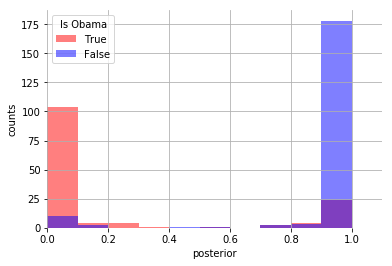

In [93]:
fig, ax = plt.subplots()
ax.grid(False)
ax.set_frame_on(False)
test_data_df[test_data_df['category'].eq(True)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'True', color = 'red')
test_data_df[test_data_df['category'].eq(False)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'False', color = 'blue')
ax.set_xlim((0,1.1))
ax.legend(title = "Is Obama")
ax.set_xlabel('posterior')
ax.set_ylabel('counts')
plt.show()

The classification is suprisingly accurate. We can even look at what words are most influential with a bit of simple math:

In [94]:
#Top indices
trueVals, falseVals = naiveBayes.feature_log_prob_

words_dict = {
    'Obama' : [],
    'Obama_log_prob' : [],
    'Clinton' : [],
    'Clinton_log_prob' : [],
}

for i, prob in sorted(enumerate(trueVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['Obama'].append(TFVectorizer.get_feature_names()[i])
    words_dict['Obama_log_prob'].append(prob)

for i, prob in sorted(enumerate(falseVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['Clinton'].append(TFVectorizer.get_feature_names()[i])
    words_dict['Clinton_log_prob'].append(prob)
    
pandas.DataFrame(words_dict)

,Clinton,Clinton_log_prob,Obama,Obama_log_prob
0,5566,-1.765648,welcomed,-2.248191
1,amy,-1.829500,announcement,-2.272002
2,dick,-1.851723,island,-2.284123
3,brundage,-1.886012,fy,-2.334133
4,chicago,-1.933640,read,-2.360109
5,temporary,-2.150705,ground,-2.400383
6,location,-2.213225,urban,-2.400383
7,reform,-2.213225,entire,-2.414176
8,reported,-2.246015,class,-2.428162
9,fuel,-2.315008,equipment,-2.428162


## Multinomial Naive Bayes

What if we want to classify our text into one of *many* classes? The multinomial Naive Bayes generating model assumes that document features (e.g., words) are generated by draws from a multinomial distribution (recall this gives the probability to observe a particular pattern of counts across features). 

Let's use again the dataset we used in week 3, the 20 newsgroup dataset.

In [95]:
newsgroups = sklearn.datasets.fetch_20newsgroups(data_home = '../data') #Free data to play with: documents from a newsgroup corpus.
newsgroups.target_names #Possible categories, i.e., the newsgroups

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

We can pick specific categories, and pull the relevant training and testing sets. 

In [96]:
target_categories = ['talk.religion.misc', 'soc.religion.christian', 'sci.space', 'comp.graphics'] #Can change these of course

newsgroupsDF = pandas.DataFrame(columns = ['text', 'category', 'source_file'])
for category in target_categories:
    print("Loading data for: {}".format(category))
    ng = sklearn.datasets.fetch_20newsgroups(categories = [category], remove=['headers', 'footers', 'quotes'], data_home = '../data')
    newsgroupsDF = newsgroupsDF.append(pandas.DataFrame({'text' : ng.data, 'category' : [category] * len(ng.data), 'source_file' : ng.filenames}), ignore_index=True)

Loading data for: talk.religion.misc
Loading data for: soc.religion.christian
Loading data for: sci.space
Loading data for: comp.graphics


Now we need to tokenize, and make a training and testing set:

In [97]:
newsgroupsDF['tokenized_text'] = newsgroupsDF['text'].apply(lambda x: nltk.word_tokenize(x))
newsgroupsDF['normalized_text'] = newsgroupsDF['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, stopwordLst = lucem_illud.stop_words_basic, stemmer = lucem_illud.stemmer_basic))

In [98]:
holdBackFraction = .2
train_ng_df, test_ng_df = lucem_illud.trainTestSplit(newsgroupsDF, holdBackFraction=holdBackFraction)

In [99]:
print(len(train_ng_df))
print(len(test_ng_df))

1723
430


We need to extract features from the text. We can use built-in feature extraction to do so. We will use a tf-idf vectorizer, which converts the document into a vector of words with tf-idf weights (term-frequency inverse-document frequency). This gives high weight to words that show up a lot in a given document, but rarely across documents in the corpus (more distinctive). 

In [100]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

Now we can train the model:

In [101]:
MultinomialNB_ng = sklearn.naive_bayes.MultinomialNB()
MultinomialNB_ng.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

...and save predictions to the dataframe:

In [102]:
train_ng_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(train_ng_df['vect'], axis=0))
print("Training score:")
print(MultinomialNB_ng.score(np.stack(train_ng_df['vect'], axis=0), train_ng_df['category']))

Training score:
0.8955310504933256


In [103]:
train_ng_df[['category', 'nb_predict']][:10]

,category,nb_predict
2068,comp.graphics,comp.graphics
821,soc.religion.christian,soc.religion.christian
363,talk.religion.misc,sci.space
1594,comp.graphics,comp.graphics
1806,comp.graphics,comp.graphics
464,soc.religion.christian,soc.religion.christian
810,soc.religion.christian,soc.religion.christian
268,talk.religion.misc,soc.religion.christian
410,soc.religion.christian,soc.religion.christian
1308,sci.space,sci.space


Looks pretty good, lets examine the testing dataset:

In [104]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = MultinomialNB_ng.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(MultinomialNB_ng.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

Testing score:
0.7418604651162791


We can even use a confusion matrix, like we used last week for evaluating human coders relative to one another. Now we are evaluating our classifier relative to human coding. We'll just use the one in `lucem_illud`, which requres a classifier and a dataframe with `'vect'` and `'category'` columns, like we have in the examples:

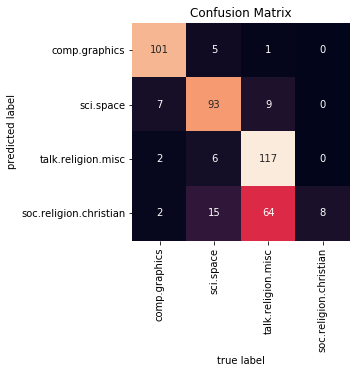

In [105]:
lucem_illud.plotConfusionMatrix(MultinomialNB_ng, test_ng_df)

Let's calculate the precision, recall, and F-measures.

In [106]:
print(sklearn.metrics.precision_score(test_ng_df['nb_predict'], test_ng_df['category'], average = 'weighted')) #precision
print(sklearn.metrics.recall_score(test_ng_df['nb_predict'], test_ng_df['category'], average = 'weighted')) #recall
print(sklearn.metrics.f1_score(test_ng_df['nb_predict'], test_ng_df['category'], average = 'weighted')) #F-1 measure

0.8994112497292162
0.7418604651162791
0.7980027440258277


We can evaluate these per catagory. This has the same requiments as `plotConfusionMatrix`:

In [107]:
lucem_illud.metrics.evaluateClassifier(MultinomialNB_ng, test_ng_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
talk.religion.misc,0.544944,0.278260,0.188372,1.000000,0.089888
sci.space,0.886107,0.704004,0.097674,0.781513,0.853211
soc.religion.christian,0.846689,0.591966,0.190698,0.612565,0.936000
comp.graphics,0.954935,0.865172,0.039535,0.901786,0.943925


We can also plot the ROC curves. This has the same requiments as `plotConfusionMatrix`:

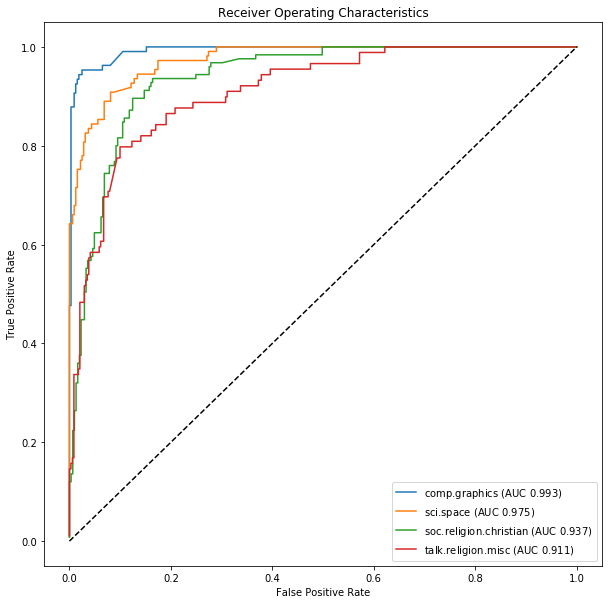

In [108]:
lucem_illud.plotMultiROC(MultinomialNB_ng, test_ng_df)

And we can plot the PCA space visualization:

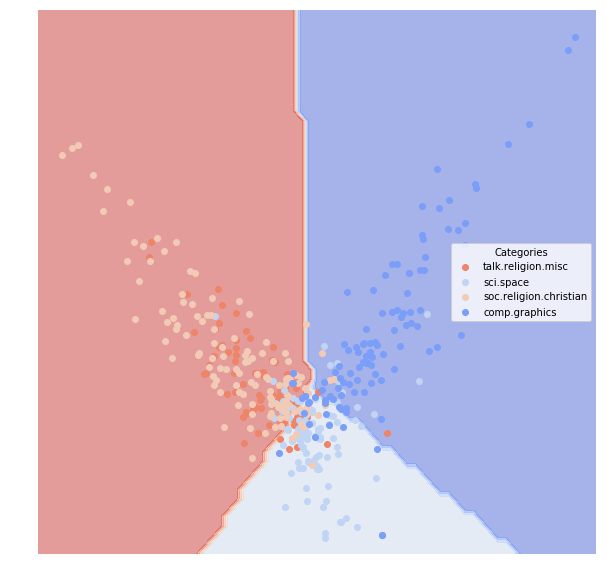

In [109]:
lucem_illud.plotregions(MultinomialNB_ng, test_ng_df)

We can also give the model a new string, not present in our data, and use the *predict* method to see if it can assign it to a category. Using our model to extend its classifications to new, uncoded data might be the primary purpose of a social science application. The words do have to be in the vocabulary, so don't be too creative :-)

In [110]:
def predict_category(s, model, tfidf): #We just define a simple function here
    a = np.zeros((1, len(tfidf.vocabulary_)))
    for w in nltk.word_tokenize(s):
        try:
            a[:,tfidf.vocabulary_[lucem_illud.stemmer_basic.stem(w.lower())]] = 1
        except KeyError:
            print("Warning: '{}' not in vocabulary".format(w))
    return model.predict(a)[0]

In [111]:
predict_category('rockets are cool', MultinomialNB_ng, TFVectorizer_ng)

'sci.space'

## <span style="color:red">*Exercise 2*</span>

<span style="color:red">In the cells immediately following, perform Logistic and Naïve Bayes classification (binary or multinomial) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project (e.g., these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week). Visualize the confusion matrix for training and testing sets. Calculate precision, recall, the F-measure, and AUC, then perform an ROC visualization. How do these classifiers perform? Exrapolate codes from these models to all uncoded data.


I collected and hand coded 50 plot summaries of Sci-Fi movies as "earth" for those set in the earth and "space" for those set in the outer space or dealing with aliens. I try to build a model based on these hand-coded movies and extrapolate the category of uncoded movies produced in 2008 - 2009, during Great Recession. As some researchers have pointed out, people tend to prefer movies which can help them to "escape" from the real world during social depression, so I'm thinking if it would be possible that during the Great Recession, producers are producing more movies set in "space" than in "earth", or if the percentage of "space" movies is higher during the Great Recession than in other periods.

In [287]:
# Read, tokenize, and normalize text
scifi_coded = pandas.read_csv('scifi_coded.csv', sep = '\t')
scifi_coded['category'] = [s == 'earth' for s in scifi_coded['set']]
scifi_coded['tokenized_text'] = scifi_coded['plot'].apply(lambda x: nltk.word_tokenize(x))
scifi_coded['normalized_text'] = scifi_coded['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, stopwordLst = lucem_illud.stop_words_basic, stemmer = lucem_illud.stemmer_basic))
scifi_coded[:5]

,title,plot,set,category,tokenized_text,normalized_text
0,Frankenstein,Dr. Henry Frankenstein (Colin Clive) wants to ...,earth,True,"[Dr., Henry, Frankenstein, (, Colin, Clive, ),...","[henri, frankenstein, colin, clive, want, buil..."
1,Island of Lost Souls,The castaway Edward Parker is rescued by a car...,earth,True,"[The, castaway, Edward, Parker, is, rescued, b...","[castaway, edward, parker, rescu, cargo, ship,..."
2,The Fly,Seth Brundle (Jeff Goldblum) is a brillliant a...,earth,True,"[Seth, Brundle, (, Jeff, Goldblum, ), is, a, b...","[seth, brundl, jeff, goldblum, brillliant, ecc..."
3,Invasion of the Body Snatchers,An apparently delusional and paranoid Dr. Mile...,earth,True,"[An, apparently, delusional, and, paranoid, Dr...","[appar, delusion, paranoid, dr, mile, bennel, ..."
4,The Incredible Shrinking Man,"Six months, after an exposure to a strange and...",earth,True,"[Six, months, ,, after, an, exposure, to, a, s...","[six, month, exposur, strang, radioact, mist, ..."


In [288]:
# Split the data into training data and testing data
holdBackFraction = .2
train_plot_df, test_plot_df = lucem_illud.trainTestSplit(scifi_coded, holdBackFraction=holdBackFraction)
print(len(train_plot_df))
print(len(test_plot_df))

40
10


In [289]:
# Turn the training dataset into a tf-idf matrix 
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_plot_df['plot'])
train_plot_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]
train_plot_df[:5]

,title,plot,set,category,tokenized_text,normalized_text,vect
3,Invasion of the Body Snatchers,An apparently delusional and paranoid Dr. Mile...,earth,True,"[An, apparently, delusional, and, paranoid, Dr...","[appar, delusion, paranoid, dr, mile, bennel, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
38,The Magnificent Seven,The farmers of the peaceful planet Akir are th...,space,False,"[The, farmers, of, the, peaceful, planet, Akir...","[farmer, peac, planet, akir, threaten, space, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
26,The Day After Tomorrow,Jack Hall (Dennis Quaid) is a paleoclimatologi...,earth,True,"[Jack, Hall, (, Dennis, Quaid, ), is, a, paleo...","[jack, hall, denni, quaid, paleoclimatologist,...","[0.060603087284642775, 0.03528805651930764, 0...."
32,Strange Days,"Los Angeles, December 30th, 1999.\r\rThe story...",earth,True,"[Los, Angeles, ,, December, 30th, ,, 1999, ., ...","[los, angel, decemb, stori, open, man, say, ok...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,The Fly,Seth Brundle (Jeff Goldblum) is a brillliant a...,earth,True,"[Seth, Brundle, (, Jeff, Goldblum, ), is, a, b...","[seth, brundl, jeff, goldblum, brillliant, ecc...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


**Logistic Regression:**

In [290]:
# Dimension reduction
pca = sklearn.decomposition.PCA()
reduced_plot_data = pca.fit_transform(np.stack(train_plot_df['vect'], axis=0))
train_plot_df['pca'] = [r for r in reduced_plot_data]
train_plot_df[:5]

,title,plot,set,category,tokenized_text,normalized_text,vect,pca
3,Invasion of the Body Snatchers,An apparently delusional and paranoid Dr. Mile...,earth,True,"[An, apparently, delusional, and, paranoid, Dr...","[appar, delusion, paranoid, dr, mile, bennel, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.04852675188098403, -0.02625919788473709, 0..."
38,The Magnificent Seven,The farmers of the peaceful planet Akir are th...,space,False,"[The, farmers, of, the, peaceful, planet, Akir...","[farmer, peac, planet, akir, threaten, space, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.2669527679196447, 0.04487658560528958, -0.1..."
26,The Day After Tomorrow,Jack Hall (Dennis Quaid) is a paleoclimatologi...,earth,True,"[Jack, Hall, (, Dennis, Quaid, ), is, a, paleo...","[jack, hall, denni, quaid, paleoclimatologist,...","[0.060603087284642775, 0.03528805651930764, 0....","[-0.11230754960104826, 0.4303112691934985, 0.1..."
32,Strange Days,"Los Angeles, December 30th, 1999.\r\rThe story...",earth,True,"[Los, Angeles, ,, December, 30th, ,, 1999, ., ...","[los, angel, decemb, stori, open, man, say, ok...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.23894113066322353, -0.006865908054243511, ..."
2,The Fly,Seth Brundle (Jeff Goldblum) is a brillliant a...,earth,True,"[Seth, Brundle, (, Jeff, Goldblum, ), is, a, b...","[seth, brundl, jeff, goldblum, brillliant, ecc...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[-0.20134865083300776, -0.0742925755086555, 0...."


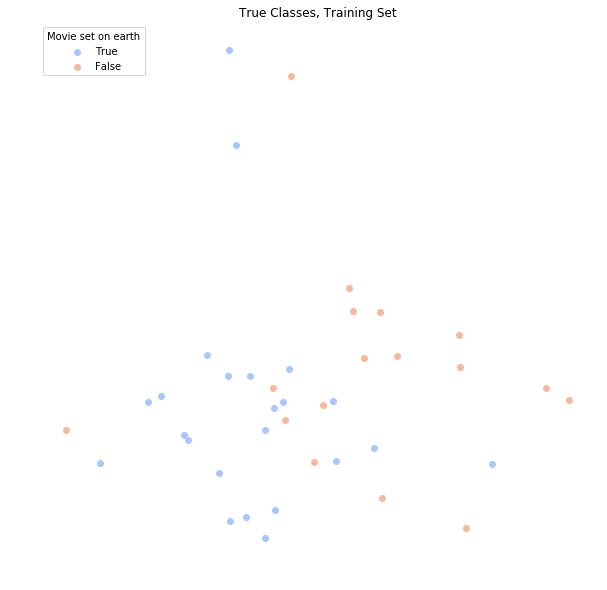

In [291]:
# Visualization in 2D
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

# Plot "earth" category
a = np.stack(train_plot_df[train_plot_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

# Plot "space" category
a = np.stack(train_plot_df[train_plot_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")
    
ax.legend(loc = 'upper left', title = 'Movie set on earth')
plt.title('True Classes, Training Set')
plt.show()

PCA cannot distinguish movies set on earth very well. Let's perform a screeplot to see how many Principal Components we need.

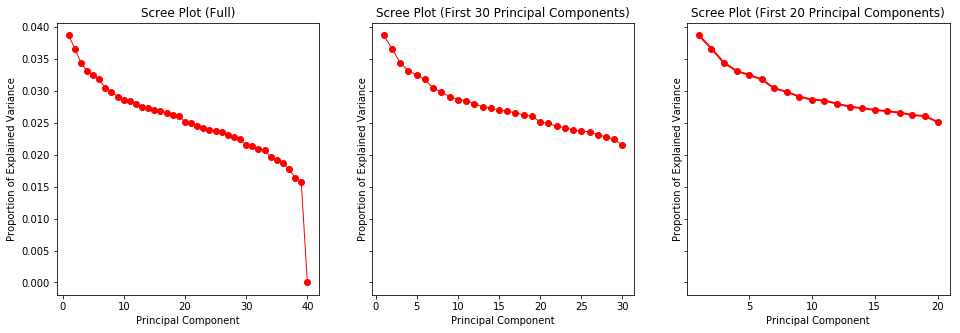

In [292]:
n = len(train_plot_df)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(30) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:30], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 30 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 20 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

Let's choose the first 10 pricipal components as our covariates.

In [293]:
train_plot_df['pca_reduced_10'] = train_plot_df['pca'].apply(lambda x: x[:10])

Now we fit a logistic regression to our data.

In [294]:
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_plot_df['pca_reduced_10'], axis=0), train_plot_df['category'])

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

Let's see how the logistic regression performs on the training dataset.

In [295]:
logistic.score(np.stack(train_plot_df['pca_reduced_10'], axis=0), train_plot_df['category'])

0.85

The mean accuracy is 85%. Then let's see how it performs on the testing dataset.

In [296]:
# Create vectors
TFVects_test = TFVectorizer.transform(test_plot_df['plot'])
test_plot_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

# PCA
reduced_plot_test = pca.transform(np.stack(test_plot_df['vect'], axis=0))
test_plot_df['pca'] = [r for r in reduced_plot_test]
test_plot_df['pca_reduced_10'] = test_plot_df['pca'].apply(lambda x: x[:10])

# Test
logistic.score(np.stack(test_plot_df['pca_reduced_10'], axis=0), test_plot_df['category'])

0.3

The performance is very poor. Let's try using more dimensions.

In [297]:
# 15 principle components
train_plot_df['pca_reduced_15'] = train_plot_df['pca'].apply(lambda x: x[:15])
test_plot_df['pca_reduced_15'] = test_plot_df['pca'].apply(lambda x: x[:15])

logistic.fit(np.stack(train_plot_df['pca_reduced_15'], axis=0), train_plot_df['category'])

print("Training:")
print(logistic.score(np.stack(train_plot_df['pca_reduced_15'], axis=0), train_plot_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_plot_df['pca_reduced_15'], axis=0), test_plot_df['category']))

Training:
0.9
Testing:
0.3


It is over-fitting. Let's increase the regularization strength.

In [298]:
# 15 principle components
logistic = sklearn.linear_model.LogisticRegression(C = 0.5)
logistic.fit(np.stack(train_plot_df['pca_reduced_15'], axis=0), train_plot_df['category'])

print("Training:")
print(logistic.score(np.stack(train_plot_df['pca_reduced_15'], axis=0), train_plot_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_plot_df['pca_reduced_15'], axis=0), test_plot_df['category']))

Training:
0.775
Testing:
0.2


In [299]:
# 15 principle components
logistic = sklearn.linear_model.LogisticRegression(C = 0.7)
logistic.fit(np.stack(train_plot_df['pca_reduced_15'], axis=0), train_plot_df['category'])

print("Training:")
print(logistic.score(np.stack(train_plot_df['pca_reduced_15'], axis=0), train_plot_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_plot_df['pca_reduced_15'], axis=0), test_plot_df['category']))

Training:
0.85
Testing:
0.2


In [300]:
# 20 principle components
train_plot_df['pca_reduced_20'] = train_plot_df['pca'].apply(lambda x: x[:20])
test_plot_df['pca_reduced_20'] = test_plot_df['pca'].apply(lambda x: x[:20])

logistic.fit(np.stack(train_plot_df['pca_reduced_20'], axis=0), train_plot_df['category'])

print("Training:")
print(logistic.score(np.stack(train_plot_df['pca_reduced_20'], axis=0), train_plot_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_plot_df['pca_reduced_20'], axis=0), test_plot_df['category']))

Training:
0.85
Testing:
0.2


In [301]:
# 30 principle components
train_plot_df['pca_reduced_30'] = train_plot_df['pca'].apply(lambda x: x[:30])
test_plot_df['pca_reduced_30'] = test_plot_df['pca'].apply(lambda x: x[:30])

logistic.fit(np.stack(train_plot_df['pca_reduced_30'], axis=0), train_plot_df['category'])

print("Training:")
print(logistic.score(np.stack(train_plot_df['pca_reduced_30'], axis=0), train_plot_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_plot_df['pca_reduced_30'], axis=0), test_plot_df['category']))

Training:
0.95
Testing:
0.2


Apparently, increasing the number of covariates is not increasing the testing accuracy, but only over-fitting our data. Let's try L1 penalty instead.

In [302]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l1', C = 0.7)
logistic_l1.fit(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category'])
print("Training:")
print(logistic_l1.score(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category']))
print("Testing:")
print(logistic_l1.score(np.stack(test_plot_df['vect'], axis=0), test_plot_df['category']))

Training:
0.575
Testing:
0.2


In [303]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l1', C = 0.5)
logistic_l1.fit(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category'])
print("Training:")
print(logistic_l1.score(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category']))
print("Testing:")
print(logistic_l1.score(np.stack(test_plot_df['vect'], axis=0), test_plot_df['category']))

Training:
0.575
Testing:
0.2


In [304]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l1', C = 0.6)
logistic_l1.fit(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category'])
print("Training:")
print(logistic_l1.score(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category']))
print("Testing:")
print(logistic_l1.score(np.stack(test_plot_df['vect'], axis=0), test_plot_df['category']))

Training:
0.575
Testing:
0.2


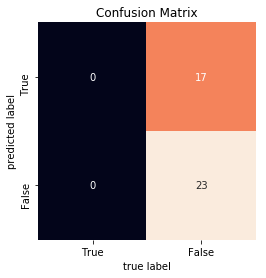

In [305]:
lucem_illud.plotConfusionMatrix(logistic_l1, train_plot_df)

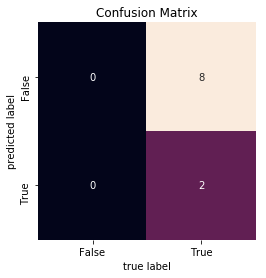

In [306]:
lucem_illud.plotConfusionMatrix(logistic_l1, test_plot_df)

In [307]:
test_plot_df['lg_predict'] = logistic_l1.predict(np.stack(test_plot_df['vect'], axis=0))

In [308]:
print(sklearn.metrics.precision_score(test_plot_df['lg_predict'], test_plot_df['category'])) #precision
print(sklearn.metrics.recall_score(test_plot_df['lg_predict'], test_plot_df['category'])) #recall
print(sklearn.metrics.f1_score(test_plot_df['lg_predict'], test_plot_df['category'])) #F-1 measure

1.0
0.2
0.33333333333333337


In [309]:
lucem_illud.evaluateClassifier(logistic_l1, test_plot_df)

/Users/yiqingzhu/anaconda/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
False,0.5,0.8,0.8,0.0,0.0
True,0.5,0.2,0.8,0.2,1.0


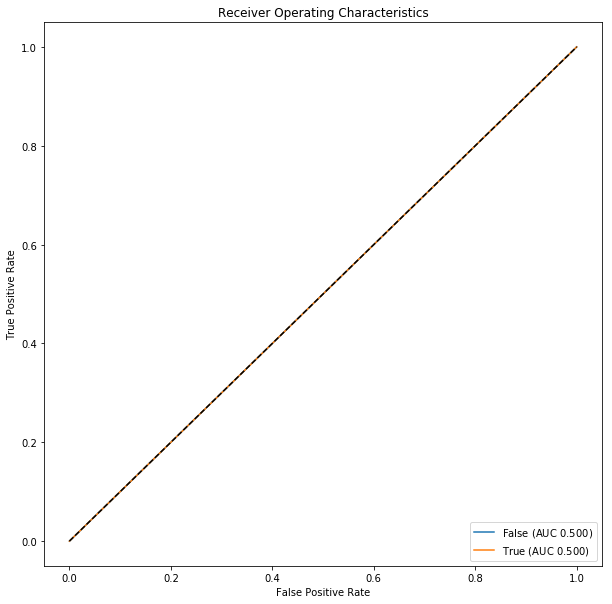

In [310]:
lucem_illud.plotMultiROC(logistic_l1, test_plot_df)

It seems that the logistic model does not perform well on our data. This is probably because that our data is not linearly separable, and the size of the dataset is too small. Let's try Naive Bayes.

**Naive Bayes classification:**

In [311]:
naiveBayes = sklearn.naive_bayes.BernoulliNB()
naiveBayes.fit(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category'])
print("Training:")
print(naiveBayes.score(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category']))
print("Testing:")
print(naiveBayes.score(np.stack(test_plot_df['vect'], axis=0), test_plot_df['category']))

Training:
0.925
Testing:
0.7


In [312]:
test_plot_df['nb_predict'] = naiveBayes.predict(np.stack(test_plot_df['vect'], axis=0))
test_plot_df['nb_predict_prob_true'] = naiveBayes.predict_proba(np.stack(test_plot_df['vect'], axis=0))[:,0] #other is prop false

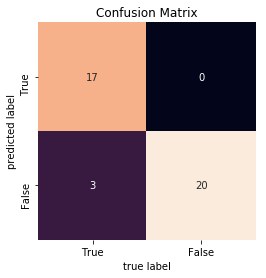

In [313]:
lucem_illud.plotConfusionMatrix(naiveBayes, train_plot_df)

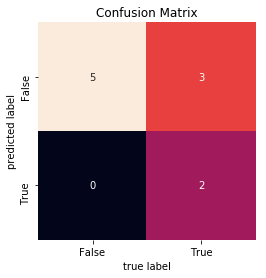

In [314]:
lucem_illud.plotConfusionMatrix(naiveBayes, test_plot_df)

In [328]:
print(sklearn.metrics.precision_score(test_plot_df['nb_predict'], test_plot_df['category'])) #precision
print(sklearn.metrics.recall_score(test_plot_df['nb_predict'], test_plot_df['category'])) #recall
print(sklearn.metrics.f1_score(test_plot_df['nb_predict'], test_plot_df['category'])) #F-1 measure

1.0
0.4
0.5714285714285715


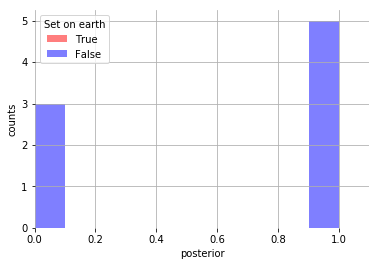

In [329]:
fig, ax = plt.subplots()
ax.grid(False)
ax.set_frame_on(False)
test_plot_df[test_plot_df['category'].eq(True)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'True', color = 'red')
test_plot_df[test_plot_df['category'].eq(False)]['nb_predict_prob_true'].hist(alpha = 0.5, ax = ax, bins = 10, label = 'False', color = 'blue')
ax.set_xlim((0,1.1))
ax.legend(title = "Set on earth")
ax.set_xlabel('posterior')
ax.set_ylabel('counts')
plt.show()

In [317]:
# Top indices - the most influential words
trueVals, falseVals = naiveBayes.feature_log_prob_

words_dict = {
    'earth' : [],
    'earth_log_prob' : [],
    'space' : [],
    'space_log_prob' : [],
}

for i, prob in sorted(enumerate(trueVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['earth'].append(TFVectorizer.get_feature_names()[i])
    words_dict['earth_log_prob'].append(prob)

for i, prob in sorted(enumerate(falseVals), key = lambda x:x[1], reverse=True)[:15]:
    words_dict['space'].append(TFVectorizer.get_feature_names()[i])
    words_dict['space_log_prob'].append(prob)
    
pandas.DataFrame(words_dict)

,earth,earth_log_prob,space,space_log_prob
0,earth,-0.459532,finds,-0.385662
1,space,-0.546544,day,-0.446287
2,life,-0.641854,later,-0.446287
3,planet,-0.641854,life,-0.446287
4,takes,-0.641854,tells,-0.446287
5,force,-0.747214,time,-0.446287
6,goes,-0.747214,death,-0.510826
7,later,-0.747214,people,-0.510826
8,man,-0.747214,begins,-0.579818
9,time,-0.747214,city,-0.579818


In [318]:
lucem_illud.evaluateClassifier(naiveBayes, test_plot_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
False,0.8125,0.925,0.3,1.0,0.625
True,0.8125,0.400,0.3,0.4,1.000


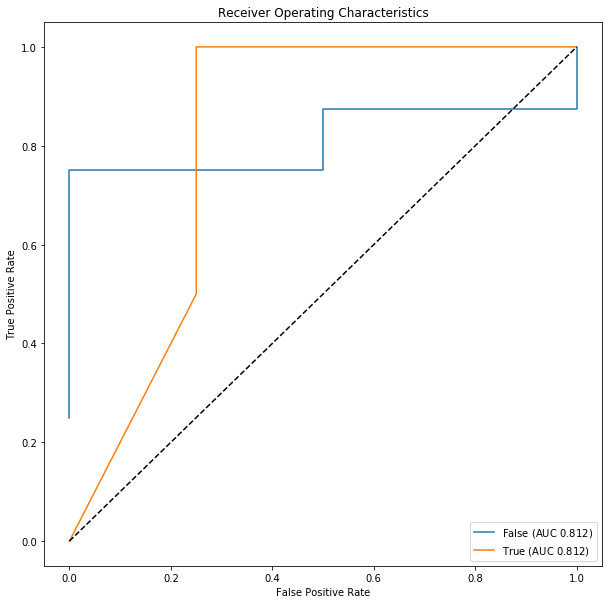

In [319]:
lucem_illud.plotMultiROC(naiveBayes, test_plot_df)

Naive Bayes works much better than the Logistic Regression. Let's exrapolate codes from Naive Bayes model to all uncoded data.

In [330]:
scifi_uncoded = pandas.read_csv('scifi_uncoded.csv')
TFVects_uncoded = TFVectorizer.transform(scifi_uncoded['plot'])
scifi_uncoded['vect'] = [np.array(v).flatten() for v in TFVects_uncoded.todense()]
scifi_uncoded['nb_predict'] = naiveBayes.predict(np.stack(scifi_uncoded['vect'], axis=0))
scifi_uncoded[100:105]

,movie_id,title,year,plot,vect,nb_predict
100,3648854,Empathy,2009,Stanley Paxton is an honest man who works an h...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False
101,3651152,Encarta IV: Dark Hope,2008,With their existence doomed in an endless anom...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False
102,3651518,End,2009,"In the face of an apocalyptic world, father an...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False
103,3653046,Enigma,2009,"Floating dead in space, transport ship Genesis...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False
104,3658146,Escape,2009,Escape is a love story that revolves around a ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False


# Decision Trees

Decision trees can be used to predict both categorical/class labels (i.e., classification) and continuous labels (i.e., regression).

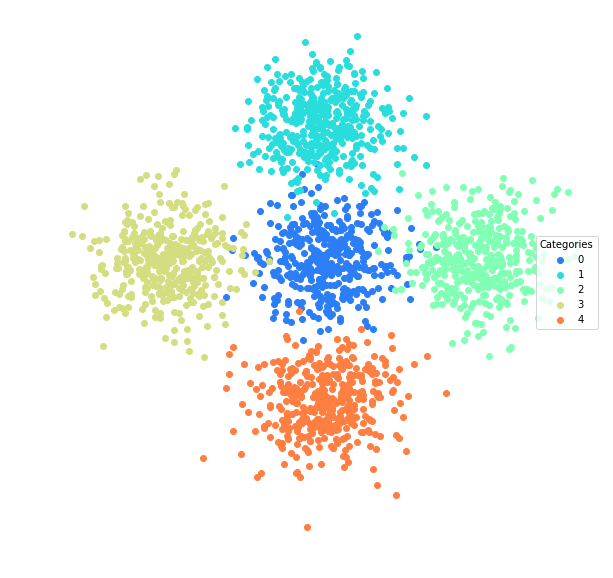

In [331]:
blobs_df = lucem_illud.multiBlobs(noise=.2, centers=[(0,0), (0,5), (5,0), (-5,0), (0,-5)])
df_exampleTree_train, df_exampleTree_test = lucem_illud.trainTestSplit(blobs_df)
lucem_illud.plotter(df_exampleTree_train)

Now we import our Decision Tree classifier from sklearn.tree (familiar syntax) and fit it using the fit method.

In [332]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=0,
            splitter='best')

To see what's going on visually with the classification: 

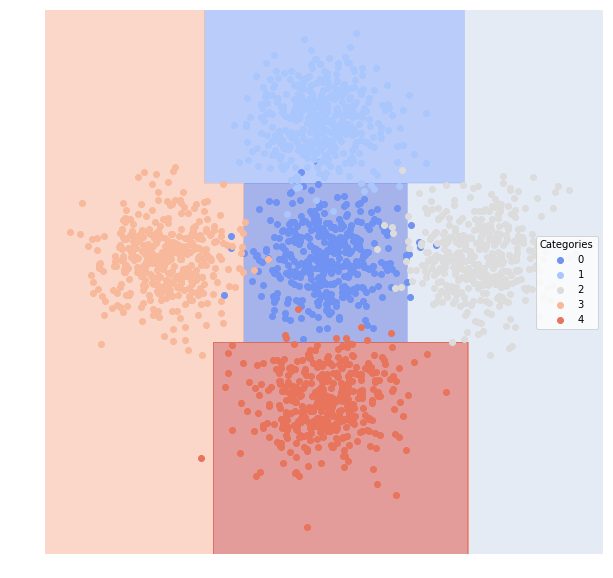

In [333]:
lucem_illud.plotregions(clf_tree, df_exampleTree_train)

In [334]:
lucem_illud.evaluateClassifier(clf_tree, df_exampleTree_test)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.956513,0.854985,0.034,0.896226,0.940594
1,0.990621,0.957185,0.008,0.966292,0.988506
2,0.988110,0.966966,0.008,0.981308,0.981308
3,0.974091,0.944939,0.014,0.980769,0.953271
4,0.973246,0.948884,0.012,0.989362,0.948980


Lets look at accuracy:

In [335]:
sklearn.metrics.accuracy_score(df_exampleTree_test['category'],clf_tree.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))

0.962

What happens if we trim the tree?

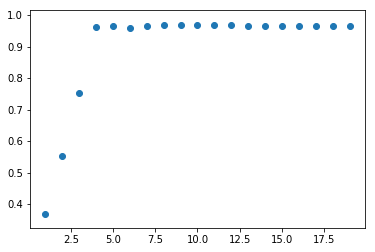

In [336]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])
    score = sklearn.metrics.accuracy_score(df_exampleTree_test['category'], tree2.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

We can select different layers of the decision tree or "prune" it. At approximately four layers down in the decision tree, the shape is somewhat odd, suggesting that our model is overfitting beyond those four layers.

Combining multiple overfitting estimators turns out to be a key idea in machine learning. This is called **bagging** and is a type of **ensemble** method. The idea is to make many randomized estimators--each can overfit, as decision trees are wont to do--but then to combine them, ultimately producing a better classification. A **random forest** is produced by bagging decision trees.

In [337]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10) #Create an instance of our decision tree classifier.

bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data

In [338]:
bag.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category']) #Fit the bagged classifier

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
         bootstrap=True, bootstrap_features=False, max_features=1.0,
         max_samples=0.8, n_estimators=100, n_jobs=1, oob_score=False,
         random_state=1, verbose=0, warm_start=False)

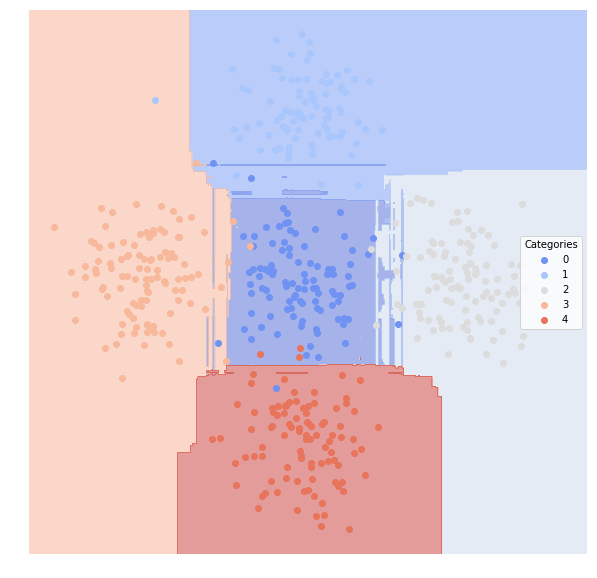

In [339]:
lucem_illud.plotregions(bag, df_exampleTree_test)

In [340]:
lucem_illud.evaluateClassifier(bag, df_exampleTree_test)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
0,0.965222,0.887380,0.026,0.923077,0.950495
1,0.990621,0.957185,0.008,0.966292,0.988506
2,0.989382,0.976051,0.006,0.990566,0.981308
3,0.978764,0.952281,0.012,0.980952,0.962617
4,0.983450,0.965290,0.008,0.989583,0.969388


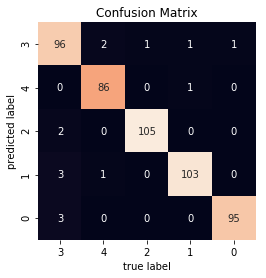

In [341]:
lucem_illud.plotConfusionMatrix(bag, df_exampleTree_test)

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">In the cells immediately following, perform decision tree and random forest classification (binary, multinomial or continuous) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. As with ***Exercise 2***, these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week. Visualize the classification of data points. Calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Now build an ensemble classifier by bagging trees into a random forest. Visualize the result. How do these classifiers perform? What does ensemble learning do?

In [343]:
decision_tree = sklearn.tree.DecisionTreeClassifier(random_state=0)
decision_tree.fit(np.stack(train_plot_df['vect'], axis = 0), train_plot_df['category'])

print("Training:")
print(decision_tree.score(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category']))
print("Testing:")
print(decision_tree.score(np.stack(test_plot_df['vect'], axis=0), test_plot_df['category']))

Training:
1.0
Testing:
0.6


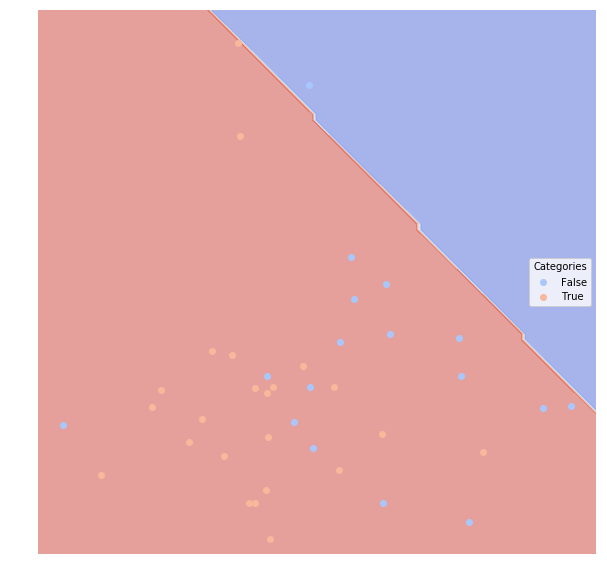

In [346]:
lucem_illud.plotregions(decision_tree, train_plot_df)

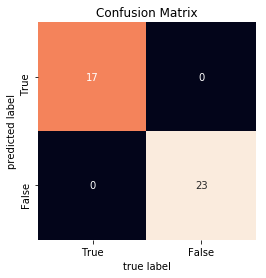

In [345]:
lucem_illud.plotConfusionMatrix(decision_tree, train_plot_df)

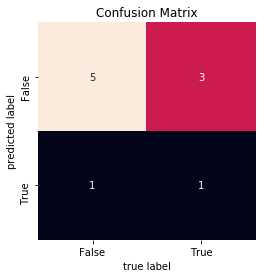

In [347]:
lucem_illud.plotConfusionMatrix(decision_tree, test_plot_df)

In [348]:
test_plot_df['tree_predict'] = decision_tree.predict(np.stack(test_plot_df['vect'], axis=0))
print(sklearn.metrics.precision_score(test_plot_df['tree_predict'], test_plot_df['category'])) #precision
print(sklearn.metrics.recall_score(test_plot_df['tree_predict'], test_plot_df['category'])) #recall
print(sklearn.metrics.f1_score(test_plot_df['tree_predict'], test_plot_df['category'])) #F-1 measure

0.5
0.25
0.3333333333333333


In [350]:
lucem_illud.evaluateClassifier(decision_tree, test_plot_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
False,0.5625,0.820833,0.4,0.833333,0.625
True,0.5625,0.225000,0.4,0.250000,0.500


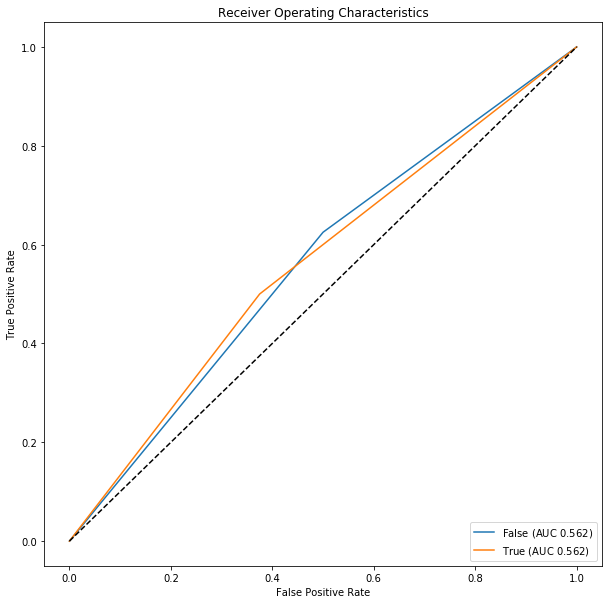

In [362]:
lucem_illud.plotMultiROC(decision_tree, test_plot_df)

The Decision Tree model does not work very well and let's try to prune it.

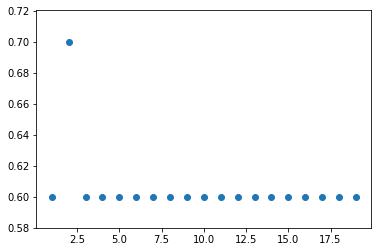

In [354]:
depthvec = []
scorevec = []
for i in range(1,20):
    decision_tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i, random_state=0)
    decision_tree2.fit(np.stack(train_plot_df['vect'], axis =0), train_plot_df['category'])
    score = sklearn.metrics.accuracy_score(test_plot_df['category'], decision_tree2.predict(np.stack(test_plot_df['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

This is a very weird plot. When the depth of the tree is 2, the tree gives the best testing score, but since our data size is too small, I think this is by accident. Even if we increase the number of layers, the testing score is not increasing at all, which indicates that the features I have collected, in other words, the training data, is not that representative enough, or is too limited in size, to do the prediction. Therefore, I need to do more hand coding. Let's see if bagging would make this better.

In [355]:
decision_tree3 = sklearn.tree.DecisionTreeClassifier(max_depth=4) #Create an instance of our decision tree classifier.
random_forest = sklearn.ensemble.BaggingClassifier(decision_tree3, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data
random_forest.fit(np.stack(train_plot_df['vect'], axis = 0), train_plot_df['category']) #Fit the bagged classifier

print("Training:")
print(random_forest.score(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category']))
print("Testing:")
print(random_forest.score(np.stack(test_plot_df['vect'], axis=0), test_plot_df['category']))

Training:
1.0
Testing:
0.7


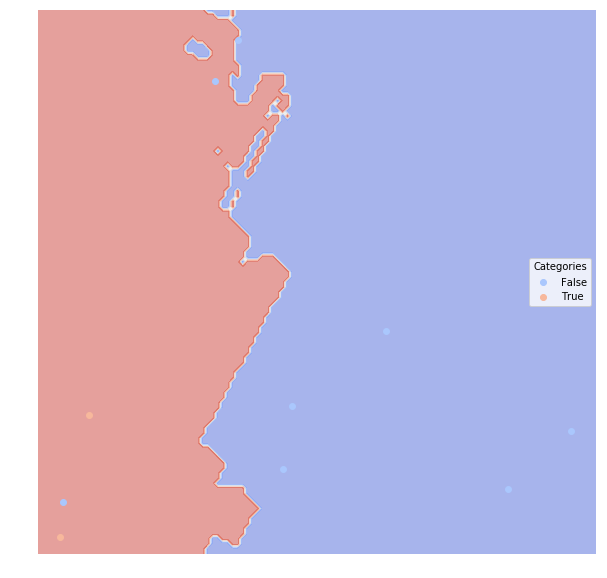

In [356]:
lucem_illud.plotregions(random_forest, test_plot_df)

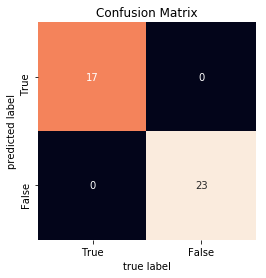

In [357]:
lucem_illud.plotConfusionMatrix(random_forest, train_plot_df)

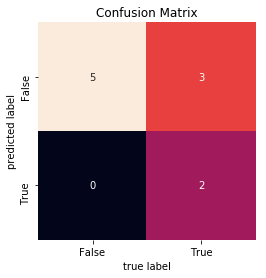

In [358]:
lucem_illud.plotConfusionMatrix(random_forest, test_plot_df)

In [360]:
test_plot_df['rf_predict'] = random_forest.predict(np.stack(test_plot_df['vect'], axis=0))
print(sklearn.metrics.precision_score(test_plot_df['rf_predict'], test_plot_df['category'])) #precision
print(sklearn.metrics.recall_score(test_plot_df['rf_predict'], test_plot_df['category'])) #recall
print(sklearn.metrics.f1_score(test_plot_df['rf_predict'], test_plot_df['category'])) #F-1 measure

1.0
0.4
0.5714285714285715


In [359]:
lucem_illud.evaluateClassifier(random_forest, test_plot_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
False,0.8125,0.925,0.3,1.0,0.625
True,0.8125,0.400,0.3,0.4,1.000


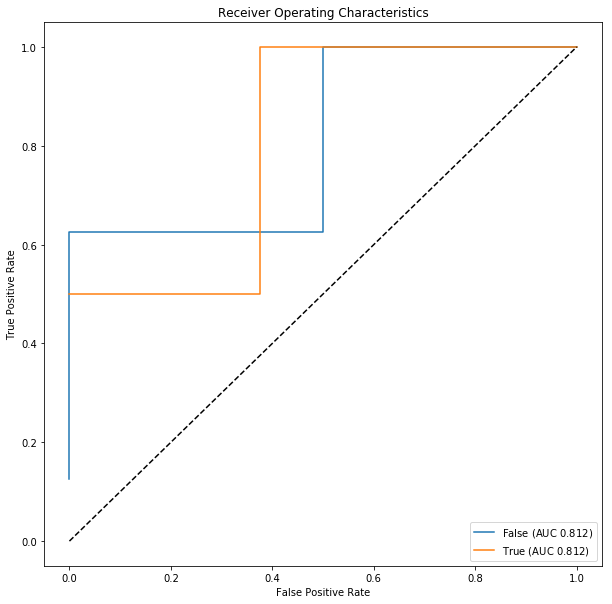

In [363]:
lucem_illud.plotMultiROC(random_forest, test_plot_df)

This looks better than the decision tree. Basically, the ensemble learning is combining the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator. Random forest is averaging the predictions of weak decision trees so as to reduce the variance. However, in my case, as I noticed above, more data needed to be coded to stabilize the performance of the model.

I can still try to extrapolate the uncoded data based on the random forest model I have trained.

In [361]:
scifi_uncoded['rf_predict'] = random_forest.predict(np.stack(scifi_uncoded['vect'], axis=0))
scifi_uncoded[100:105]

,movie_id,title,year,plot,vect,nb_predict,rf_predict
100,3648854,Empathy,2009,Stanley Paxton is an honest man who works an h...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,True
101,3651152,Encarta IV: Dark Hope,2008,With their existence doomed in an endless anom...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,False
102,3651518,End,2009,"In the face of an apocalyptic world, father an...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,True
103,3653046,Enigma,2009,"Floating dead in space, transport ship Genesis...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,False
104,3658146,Escape,2009,Escape is a love story that revolves around a ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,False


# K-Nearest Neighbors

The K-Nearest neighbors classifier takes a simpler premise than those before: Find the closest labeled datapoint in set and "borrow" its label.

Let's use newsgroup data again.

In [364]:
newsgroupsDF[:5]

,category,source_file,text,tokenized_text,normalized_text
0,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,\n\nParadise and salvation are not the same th...,"[Paradise, and, salvation, are, not, the, same...","[paradis, salvat, thing, salvat, better, refer..."
1,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,\nYou're admitting a lot more than that. You ...,"[You, 're, admitting, a, lot, more, than, that...","[admit, lot, admit, moral, situat, admit, acti..."
2,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,"\n\nJesus also recognized other holy days, lik...","[Jesus, also, recognized, other, holy, days, ,...","[jesus, also, recogn, holi, day, like, passov,..."
3,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,In <lsjc8cINNmc1@saltillo.cs.utexas.edu> turpi...,"[In, <, lsjc8cINNmc1, @, saltillo.cs.utexas.ed...","[turpin, russel, turpin, regard, love, less, b..."
4,talk.religion.misc,/Users/Reid/scikit_learn_data/20news_home/20ne...,"\nI'm sorry, but He does not! Ever read the F...","[I, 'm, sorry, ,, but, He, does, not, !, Ever,...","[sorri, doe, ever, read, first, command]"


Make a testing and training set:

In [365]:
holdBackFraction = .2
train_ng_df, test_ng_df = lucem_illud.trainTestSplit(newsgroupsDF, holdBackFraction=holdBackFraction)

Let's initialize our k-nearest neighbors classifier:

In [366]:
n_neighbors = 15
weights="uniform"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

Let's try to classify using the TF-IDF vectors:

In [367]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

In [368]:
clf_knearest.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=15, p=2,
           weights='uniform')

In [369]:
lucem_illud.evaluateClassifier(clf_knearest, train_ng_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
talk.religion.misc,0.555201,0.190033,0.304701,0.230415,0.343643
sci.space,0.586772,0.326907,0.408590,0.359897,0.576132
soc.religion.christian,0.517241,0.310745,0.276262,1.000000,0.034483
comp.graphics,0.603505,0.324380,0.318630,0.402834,0.439294


And lets look at the testing data

In [370]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = clf_knearest.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(clf_knearest.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

Testing score:
0.2744186046511628


Let's produce another confusion matrix:

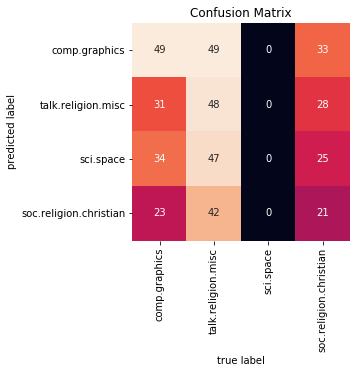

In [371]:
lucem_illud.plotConfusionMatrix(clf_knearest, test_ng_df)

You can produce the PCA space visual if you want, altough it can take a very long time, so we'll leave it optionally commented out:

In [372]:
#lucem_illud.plotregions(clf_knearest, test_ng_df)

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">In the cells immediately following, perform and visualize k-nearest neighbor classification using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. Visualize the classification of data points and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Articulate how the *k*-nearest neighbor approach relates to *k*-means clustering explored in ***week 3***?

In [373]:
n_neighbors = 4
weights="uniform"
KNN = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

In [374]:
KNN.fit(np.stack(train_plot_df['vect'], axis = 0), train_plot_df['category'])

print("Training:")
print(KNN.score(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category']))
print("Testing:")
print(KNN.score(np.stack(test_plot_df['vect'], axis=0), test_plot_df['category']))

Training:
0.8
Testing:
0.9


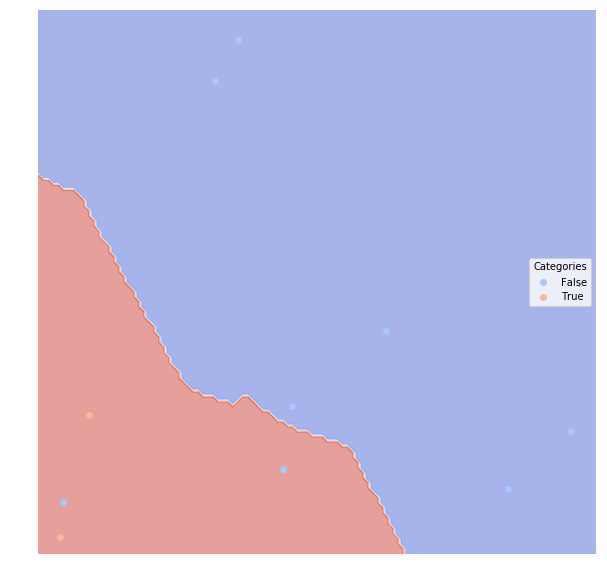

In [375]:
lucem_illud.plotregions(KNN, test_plot_df)

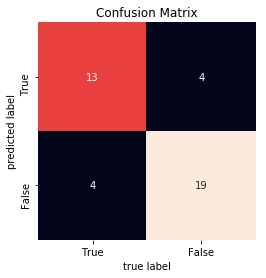

In [376]:
lucem_illud.plotConfusionMatrix(KNN, train_plot_df)

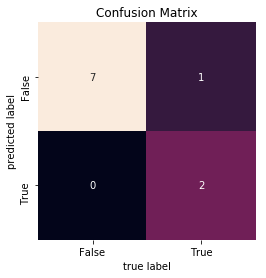

In [377]:
lucem_illud.plotConfusionMatrix(KNN, test_plot_df)

In [378]:
test_plot_df['KNN_predict'] = KNN.predict(np.stack(test_plot_df['vect'], axis=0))
print(sklearn.metrics.precision_score(test_plot_df['KNN_predict'], test_plot_df['category'])) #precision
print(sklearn.metrics.recall_score(test_plot_df['KNN_predict'], test_plot_df['category'])) #recall
print(sklearn.metrics.f1_score(test_plot_df['KNN_predict'], test_plot_df['category'])) #F-1 measure

1.0
0.6666666666666666
0.8


In [379]:
lucem_illud.evaluateClassifier(KNN, test_plot_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
False,0.9375,0.975000,0.1,1.000000,0.875
True,0.9375,0.666667,0.1,0.666667,1.000


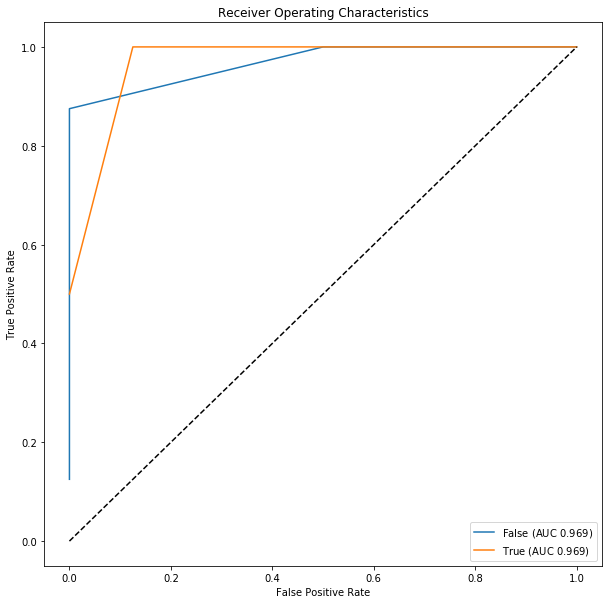

In [380]:
lucem_illud.plotMultiROC(KNN, test_plot_df)

Surprisingly, KNN has a great performance on my data. I can extrapolate uncoded data base on it.

In [381]:
scifi_uncoded['KNN_predict'] = KNN.predict(np.stack(scifi_uncoded['vect'], axis=0))
scifi_uncoded[100:105]

,movie_id,title,year,plot,vect,nb_predict,rf_predict,KNN_predict
100,3648854,Empathy,2009,Stanley Paxton is an honest man who works an h...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,True,False
101,3651152,Encarta IV: Dark Hope,2008,With their existence doomed in an endless anom...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,False,False
102,3651518,End,2009,"In the face of an apocalyptic world, father an...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,True,True
103,3653046,Enigma,2009,"Floating dead in space, transport ship Genesis...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,False,False
104,3658146,Escape,2009,Escape is a love story that revolves around a ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,False,False


Both KNN approach and k-means clustering have the letter K in their name, but they are different algorithms. K-means is a clustering algorithm that tries to partition a set of points into K sets (clusters) such that the points in each cluster tend to be near each other, while KNN is a classification or regression algorithm that in order to determine the classification of a point, combines the classification of the K nearest points. K-means clustering is unsupervised, while KNN is supervised.

# SVMs

Now we will examine Support Vector Machines, an approach that creates the partition that preserves the "maximum margin" between classes.

We will use a few sub forums from reddit--which tend to share text rather than memes--namely `talesfromtechsupport`, `badroommates`, `weeabootales` and `relationships`. The top 100 text posts from each have been saved to `data/reddit.csv`.

In [382]:
redditDf = pandas.read_csv('../data/reddit.csv', index_col = 0)

#Drop a couple missing values

redditDf = redditDf.dropna()

#Set category

redditDf['category'] = redditDf['subreddit']

#tokenize and normalize
redditDf['tokenized_text'] = redditDf['text'].apply(lambda x: nltk.word_tokenize(x))
redditDf['normalized_text'] = redditDf['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, stopwordLst = lucem_illud.stop_words_basic, stemmer = lucem_illud.stemmer_basic))

We will tf.idf the data to make our vectors:

In [383]:
redditTFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.5, min_df=3, stop_words='english', norm='l2')
redditTFVects = redditTFVectorizer.fit_transform([' '.join(l) for l in redditDf['normalized_text']])
redditDf['vect'] = [np.array(v).flatten() for v in redditTFVects.todense()]

Initilize the model and make a train test split:

In [384]:
holdBackFraction = .2
train_redditDf, test_redditDf = lucem_illud.trainTestSplit(redditDf, holdBackFraction=holdBackFraction)

In [385]:
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
#probability = True is slower but  lets you call predict_proba()
clf_svm.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

...and consider the results:

In [386]:
lucem_illud.evaluateClassifier(clf_svm, test_redditDf)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Bad Roommates: Tales of Irritation,0.982143,0.950601,0.015674,0.966292,0.977273
Relationships,0.972197,0.942518,0.018809,0.975904,0.952941
Weeaboo Tales: stories about the extreme fans of japanese culture,0.979730,0.968864,0.009404,1.000000,0.959459
Tales From Tech Support,0.991903,0.947368,0.012539,0.947368,1.000000


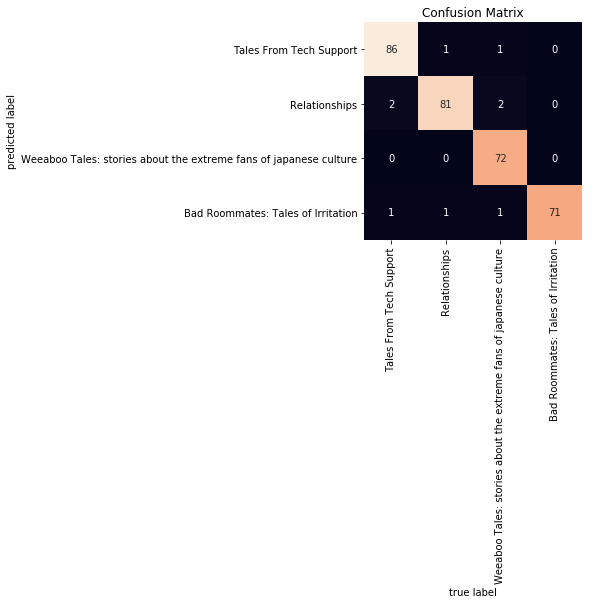

In [387]:
lucem_illud.plotConfusionMatrix(clf_svm, test_redditDf)

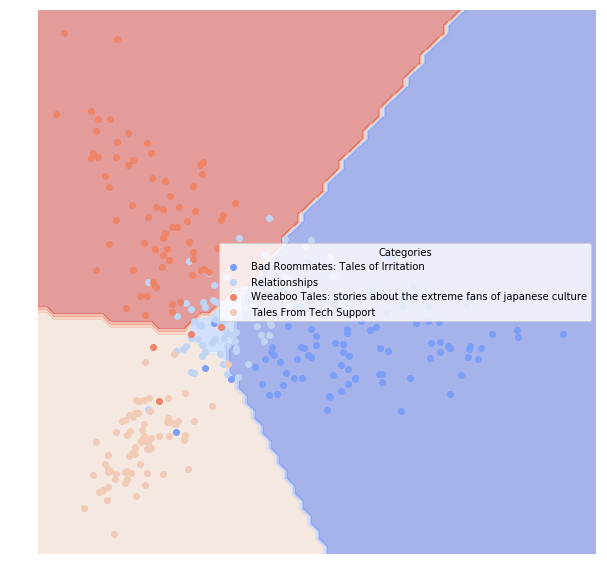

In [388]:
lucem_illud.plotregions(clf_svm, test_redditDf)

<span style="color:red">Perform SVM on your dataset.

In [416]:
SVM = sklearn.svm.SVC(kernel='linear', probability = True)
SVM.fit(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category'])

print("Training:")
print(SVM.score(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category']))
print("Testing:")
print(SVM.score(np.stack(test_plot_df['vect'], axis=0), test_plot_df['category']))

Training:
1.0
Testing:
0.6


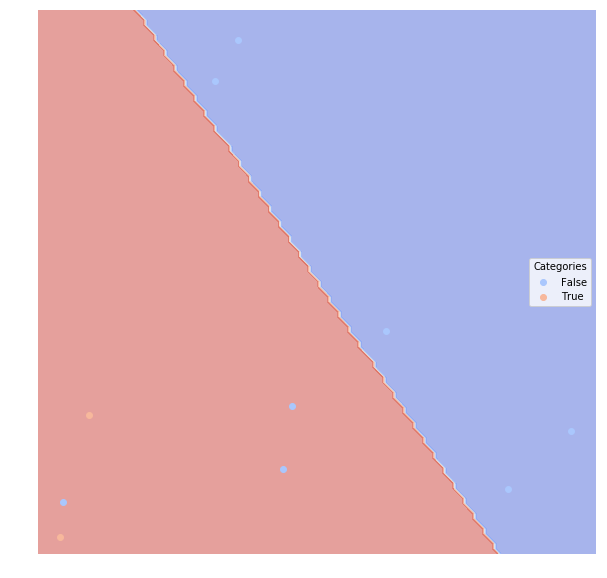

In [417]:
lucem_illud.plotregions(SVM, test_plot_df)

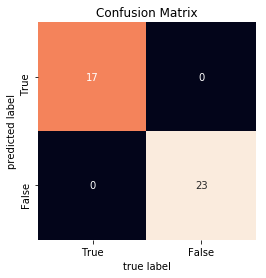

In [418]:
lucem_illud.plotConfusionMatrix(SVM, train_plot_df)

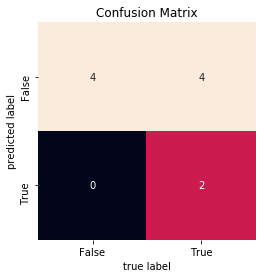

In [419]:
lucem_illud.plotConfusionMatrix(SVM, test_plot_df)

In [420]:
test_plot_df['SVM_predict'] = SVM.predict(np.stack(test_plot_df['vect'], axis=0))
print(sklearn.metrics.precision_score(test_plot_df['SVM_predict'], test_plot_df['category'])) #precision
print(sklearn.metrics.recall_score(test_plot_df['SVM_predict'], test_plot_df['category'])) #recall
print(sklearn.metrics.f1_score(test_plot_df['SVM_predict'], test_plot_df['category'])) #F-1 measure

1.0
0.3333333333333333
0.5


In [421]:
lucem_illud.evaluateClassifier(SVM, test_plot_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
False,0.75,0.900000,0.4,1.000000,0.5
True,0.75,0.333333,0.4,0.333333,1.0


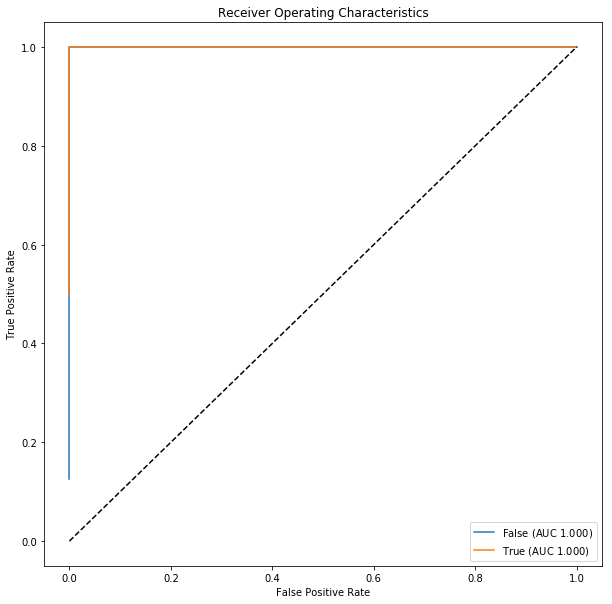

In [422]:
lucem_illud.plotMultiROC(SVM, test_plot_df)

In [423]:
scifi_uncoded['SVM_predict'] = SVM.predict(np.stack(scifi_uncoded['vect'], axis=0))
scifi_uncoded[100:105]

,movie_id,title,year,plot,vect,nb_predict,rf_predict,KNN_predict,NN_predict,SVM_predict
100,3648854,Empathy,2009,Stanley Paxton is an honest man who works an h...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,True,False,True,True
101,3651152,Encarta IV: Dark Hope,2008,With their existence doomed in an endless anom...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,False,False,True,False
102,3651518,End,2009,"In the face of an apocalyptic world, father an...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,True,True,True,True
103,3653046,Enigma,2009,"Floating dead in space, transport ship Genesis...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,False,False,False,False
104,3658146,Escape,2009,Escape is a love story that revolves around a ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,False,False,False,True


# Neural Nets

We include an example of a simple neural network, the Multi-layer Perceptron (MLP) that learns a function $f(\cdot): R^m \rightarrow R^o$ by training on a dataset, where $m$ is the number of dimensions for input and $o$ is the number of dimensions for output. Given a set of features $X = {x_1, x_2, ..., x_m}$ and a target $y$, it can learn a non-linear function approximator for either classification or regression. It is different from logistic regression, in that between the input and the output layer, there can be one or more non-linear layers, called hidden layers. The following figure shows a one hidden layer MLP with scalar output. ![title](../data/multilayerperceptron_network.png) The leftmost layer, known as the input layer, consists of a set of "neurons" $\{x_i | x_1, x_2, ..., x_m\}$ representing the input features (e.g., weighted words). Each neuron in the hidden layer transforms the values from the previous layer with a weighted linear summation $w_1x_1 + w_2x_2 + ... + w_mx_m$, followed by a non-linear activation function $g(\cdot):R \rightarrow R$ - like the logistic or hyperbolic tan function. The output layer receives the values from the last hidden layer and transforms them into output values.

In [389]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=None,
       shuffle=True, solver='adam', tol=0.0001, validation_fraction=0.1,
       verbose=False, warm_start=False)

In [390]:
lucem_illud.evaluateClassifier(clf_nn, test_redditDf)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
Bad Roommates: Tales of Irritation,0.972944,0.944886,0.018809,0.976744,0.954545
Relationships,0.973806,0.929240,0.021944,0.953488,0.964706
Weeaboo Tales: stories about the extreme fans of japanese culture,0.968891,0.932209,0.018809,0.972222,0.945946
Tales From Tech Support,0.984958,0.936653,0.015674,0.946667,0.986111


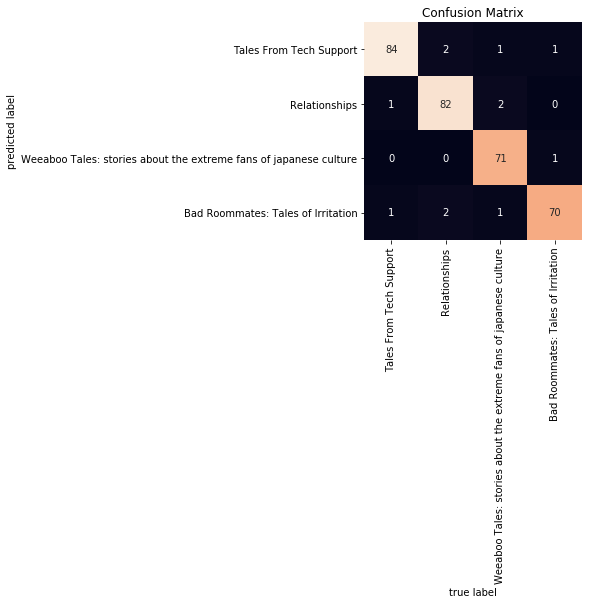

In [391]:
lucem_illud.plotConfusionMatrix(clf_nn, test_redditDf)

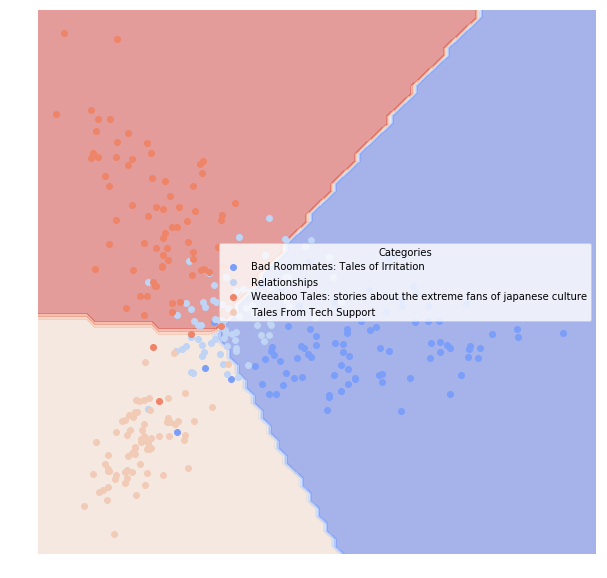

In [392]:
lucem_illud.plotregions(clf_nn, test_redditDf)

It performs very well.

## <span style="color:red">*Exercise 5*</span>

<span style="color:red">In the cells immediately following, perform a neural network classification and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). How does this classify relevant to *k*-nearest neighbor, Naive Bayes, logistic and decision-tree approaches?

In [393]:
NN = sklearn.neural_network.MLPClassifier()
NN.fit(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category'])

print("Training:")
print(NN.score(np.stack(train_plot_df['vect'], axis=0), train_plot_df['category']))
print("Testing:")
print(NN.score(np.stack(test_plot_df['vect'], axis=0), test_plot_df['category']))

Training:
1.0
Testing:
0.6


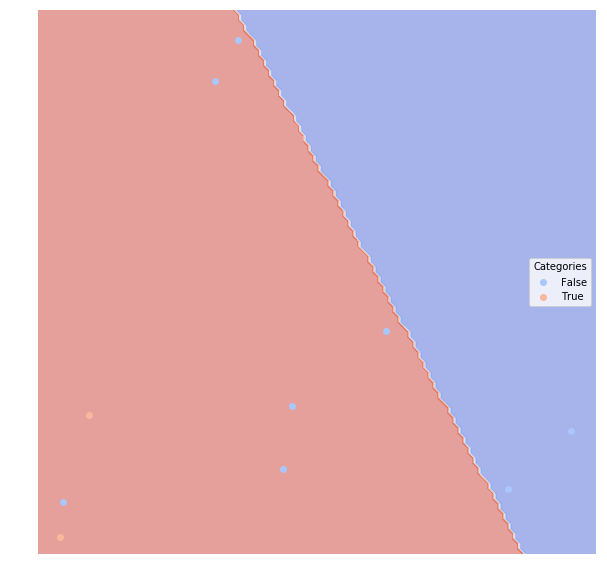

In [394]:
lucem_illud.plotregions(NN, test_plot_df)

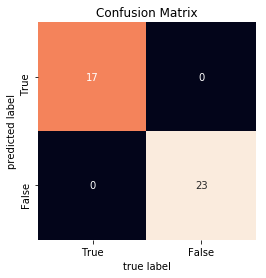

In [395]:
lucem_illud.plotConfusionMatrix(NN, train_plot_df)

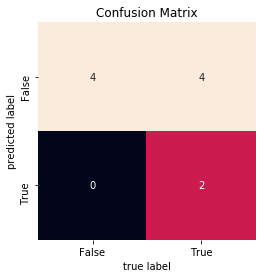

In [396]:
lucem_illud.plotConfusionMatrix(NN, test_plot_df)

In [397]:
test_plot_df['NN_predict'] = NN.predict(np.stack(test_plot_df['vect'], axis=0))
print(sklearn.metrics.precision_score(test_plot_df['NN_predict'], test_plot_df['category'])) #precision
print(sklearn.metrics.recall_score(test_plot_df['NN_predict'], test_plot_df['category'])) #recall
print(sklearn.metrics.f1_score(test_plot_df['NN_predict'], test_plot_df['category'])) #F-1 measure

1.0
0.3333333333333333
0.5


In [398]:
lucem_illud.evaluateClassifier(NN, test_plot_df)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
False,0.75,0.900000,0.4,1.000000,0.5
True,0.75,0.333333,0.4,0.333333,1.0


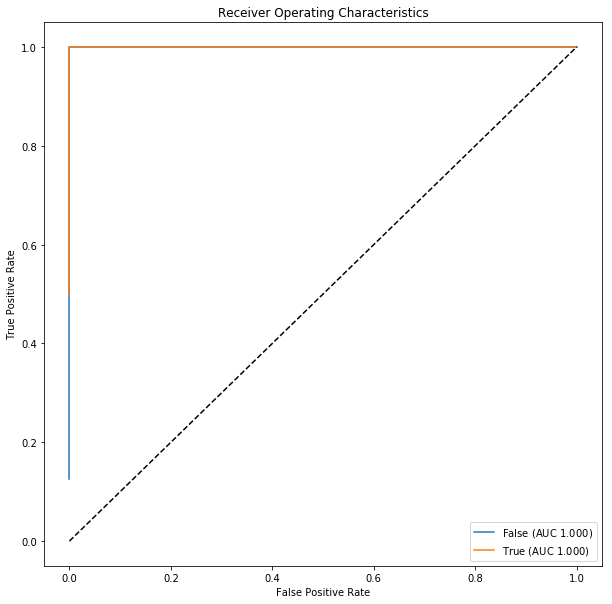

In [399]:
lucem_illud.plotMultiROC(NN, test_plot_df)

It looks that Neural Network works ok with my data. Let's extrapolate uncoded data based on it.

In [424]:
scifi_uncoded['NN_predict'] = NN.predict(np.stack(scifi_uncoded['vect'], axis=0))
scifi_uncoded[100:105]

,movie_id,title,year,plot,vect,nb_predict,rf_predict,KNN_predict,NN_predict,SVM_predict
100,3648854,Empathy,2009,Stanley Paxton is an honest man who works an h...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,True,False,True,True
101,3651152,Encarta IV: Dark Hope,2008,With their existence doomed in an endless anom...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,False,False,True,False
102,3651518,End,2009,"In the face of an apocalyptic world, father an...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,True,True,True,True
103,3653046,Enigma,2009,"Floating dead in space, transport ship Genesis...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,False,False,False,False
104,3658146,Escape,2009,Escape is a love story that revolves around a ...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",False,False,False,False,True


Based on the testing performance, Neural Network works worse than KNN, similar to Random Forest, Naive Bayes, Neural Network, SVM, Decision Tree, and much better than Logistic Regression on my dataset.

Let's compare the predictions by the five methods above on the uncoded data.

In [404]:
scifi_uncoded.groupby(['nb_predict']).count()

,movie_id,title,year,plot,vect,rf_predict,KNN_predict,NN_predict
nb_predict,,,,,,,,
False,413,413,413,413,413,413,413,413


In [405]:
scifi_uncoded.groupby(['rf_predict']).count()

,movie_id,title,year,plot,vect,nb_predict,KNN_predict,NN_predict
rf_predict,,,,,,,,
False,102,102,102,102,102,102,102,102
True,311,311,311,311,311,311,311,311


In [406]:
scifi_uncoded.groupby(['KNN_predict']).count()

,movie_id,title,year,plot,vect,nb_predict,rf_predict,NN_predict
KNN_predict,,,,,,,,
False,221,221,221,221,221,221,221,221
True,192,192,192,192,192,192,192,192


In [425]:
scifi_uncoded.groupby(['SVM_predict']).count()

,movie_id,title,year,plot,vect,nb_predict,rf_predict,KNN_predict,NN_predict
SVM_predict,,,,,,,,,
False,65,65,65,65,65,65,65,65,65
True,348,348,348,348,348,348,348,348,348


In [407]:
scifi_uncoded.groupby(['NN_predict']).count()

,movie_id,title,year,plot,vect,nb_predict,rf_predict,KNN_predict
NN_predict,,,,,,,,
False,118,118,118,118,118,118,118,118
True,295,295,295,295,295,295,295,295


It seems that the five methods have given quite different predictions for my data. To get more stabilized results, I should hand-code more data and also put more efforts on tuning parameters for each method to reduce both bias and variance. 